###### --------Diabetes Prediction--------

### Library importing

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

## Loading and Reviewing the Data

In [2]:
df=pd.read_csv(r'C:\Users\KIIT\OneDrive\Desktop\Project\8th_sem\diabetes.csv')

In [3]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


# Definition of features

## Feature------> Description
###### num_preg-----------> number of pregnancies
###### glucose_conc------> Plasma glucose concentration a 2 hours in an oral glucose tolerance test
###### diastolic_bp--------> Diastolic blood pressure (mm Hg)
###### thickness-----------> Triceps skin fold thickness (mm)
###### insulin---------------> 2-Hour serum insulin (mu U/ml)
###### bmi-------------------> Body mass index (weight in kg/(height in m)A2)
###### diab_pred----------> Diabetes pedigree function
###### Age (years)--------> Age (years)
###### skin------------------> ?????
###### diabetes------------> Class variable (1=True, 0=False)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [5]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [3]:
col=df.columns.tolist()

# Check for null values

In [4]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

# Check for duplicate values

In [5]:
for col_name in col:
    print('{} :- {}'.format(col_name,df[col_name].duplicated().sum()))

Pregnancies :- 751
Glucose :- 632
BloodPressure :- 721
SkinThickness :- 717
Insulin :- 582
BMI :- 520
DiabetesPedigreeFunction :- 251
Age :- 716
Outcome :- 766


# Check for Unique values

In [6]:
for col_name in col:
    print('{} :- {}'.format(col_name,df[col_name].unique()))
    print('---------------------------')

Pregnancies :- [ 6  1  8  0  5  3 10  2  4  7  9 11 13 15 17 12 14]
---------------------------
Glucose :- [148  85 183  89 137 116  78 115 197 125 110 168 139 189 166 100 118 107
 103 126  99 196 119 143 147  97 145 117 109 158  88  92 122 138 102  90
 111 180 133 106 171 159 146  71 105 101 176 150  73 187  84  44 141 114
  95 129  79   0  62 131 112 113  74  83 136  80 123  81 134 142 144  93
 163 151  96 155  76 160 124 162 132 120 173 170 128 108 154  57 156 153
 188 152 104  87  75 179 130 194 181 135 184 140 177 164  91 165  86 193
 191 161 167  77 182 157 178  61  98 127  82  72 172  94 175 195  68 186
 198 121  67 174 199  56 169 149  65 190]
---------------------------
BloodPressure :- [ 72  66  64  40  74  50   0  70  96  92  80  60  84  30  88  90  94  76
  82  75  58  78  68 110  56  62  85  86  48  44  65 108  55 122  54  52
  98 104  95  46 102 100  61  24  38 106 114]
---------------------------
SkinThickness :- [35 29  0 23 32 45 19 47 38 30 41 33 26 15 36 11 31 37 42 

# Check overall values

In [10]:
for col in df.columns:
    print(col)
    print(df[col].value_counts())
    print('---------------------------------------')

Pregnancies
1     135
0     111
2     103
3      75
4      68
5      57
6      50
7      45
8      38
9      28
10     24
11     11
13     10
12      9
14      2
15      1
17      1
Name: Pregnancies, dtype: int64
---------------------------------------
Glucose
99     17
100    17
111    14
129    14
125    14
       ..
191     1
177     1
44      1
62      1
190     1
Name: Glucose, Length: 136, dtype: int64
---------------------------------------
BloodPressure
70     57
74     52
78     45
68     45
72     44
64     43
80     40
76     39
60     37
0      35
62     34
66     30
82     30
88     25
84     23
90     22
86     21
58     21
50     13
56     12
52     11
54     11
75      8
92      8
65      7
85      6
94      6
48      5
96      4
44      4
100     3
106     3
98      3
110     3
55      2
108     2
104     2
46      2
30      2
122     1
95      1
102     1
61      1
24      1
38      1
40      1
114     1
Name: BloodPressure, dtype: int64
-----------------------------

# Replacing 0 value with Mean value

In [7]:
def find_class_mean(col):
    zero_mean=round(df.loc[df['Outcome']==0][col].mean(),1)
    one_mean=round(df.loc[df['Outcome']==1][col].mean(),1)
    
    new= df.loc[df[col]==0]
    
    df.loc[(df[col]==0) & (df['Outcome']==0),col]=zero_mean
    df.loc[(df[col]==0) & (df['Outcome']==1),col]=one_mean

    print(f'For {col}, 0 class mean is {zero_mean}')
    print(f'For {col}, 1 class mean is {one_mean}')    
    
    print()
    print('----------------------------- Modified Rows -----------------------------')
    return new

In [8]:
find_class_mean('Glucose')

For Glucose, 0 class mean is 110.0
For Glucose, 1 class mean is 141.3

----------------------------- Modified Rows -----------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
75,1,0,48,20,0,24.7,0.140,22,0
182,1,0,74,20,23,27.7,0.299,21,0
342,1,0,68,35,0,32.0,0.389,22,0
349,5,0,80,32,0,41.0,0.346,37,1
502,6,0,68,41,0,39.0,0.727,41,1


In [9]:
find_class_mean('BloodPressure')

For BloodPressure, 0 class mean is 68.2
For BloodPressure, 1 class mean is 70.8

----------------------------- Modified Rows -----------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
7,10,115.0,0,0,0,35.3,0.134,29,0
15,7,100.0,0,0,0,30.0,0.484,32,1
49,7,105.0,0,0,0,0.0,0.305,24,0
60,2,84.0,0,0,0,0.0,0.304,21,0
78,0,131.0,0,0,0,43.2,0.270,26,1
81,2,74.0,0,0,0,0.0,0.102,22,0
172,2,87.0,0,23,0,28.9,0.773,25,0
193,11,135.0,0,0,0,52.3,0.578,40,1
222,7,119.0,0,0,0,25.2,0.209,37,0
261,3,141.0,0,0,0,30.0,0.761,27,1


In [10]:
find_class_mean('SkinThickness')

For SkinThickness, 0 class mean is 19.7
For SkinThickness, 1 class mean is 22.2

----------------------------- Modified Rows -----------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
2,8,183.0,64.0,0,0,23.3,0.672,32,1
5,5,116.0,74.0,0,0,25.6,0.201,30,0
7,10,115.0,68.2,0,0,35.3,0.134,29,0
9,8,125.0,96.0,0,0,0.0,0.232,54,1
10,4,110.0,92.0,0,0,37.6,0.191,30,0
...,...,...,...,...,...,...,...,...,...
757,0,123.0,72.0,0,0,36.3,0.258,52,1
758,1,106.0,76.0,0,0,37.5,0.197,26,0
759,6,190.0,92.0,0,0,35.5,0.278,66,1
762,9,89.0,62.0,0,0,22.5,0.142,33,0


In [11]:
find_class_mean('Insulin')

For Insulin, 0 class mean is 68.8
For Insulin, 1 class mean is 100.3

----------------------------- Modified Rows -----------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,0,33.6,0.627,50,1
1,1,85.0,66.0,29.0,0,26.6,0.351,31,0
2,8,183.0,64.0,22.2,0,23.3,0.672,32,1
5,5,116.0,74.0,19.7,0,25.6,0.201,30,0
7,10,115.0,68.2,19.7,0,35.3,0.134,29,0
...,...,...,...,...,...,...,...,...,...
761,9,170.0,74.0,31.0,0,44.0,0.403,43,1
762,9,89.0,62.0,19.7,0,22.5,0.142,33,0
764,2,122.0,70.0,27.0,0,36.8,0.340,27,0
766,1,126.0,60.0,22.2,0,30.1,0.349,47,1


In [12]:
find_class_mean('BMI')

For BMI, 0 class mean is 30.3
For BMI, 1 class mean is 35.1

----------------------------- Modified Rows -----------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
9,8,125.0,96.0,22.2,100.3,0.0,0.232,54,1
49,7,105.0,68.2,19.7,68.8,0.0,0.305,24,0
60,2,84.0,68.2,19.7,68.8,0.0,0.304,21,0
81,2,74.0,68.2,19.7,68.8,0.0,0.102,22,0
145,0,102.0,75.0,23.0,68.8,0.0,0.572,21,0
371,0,118.0,64.0,23.0,89.0,0.0,1.731,21,0
426,0,94.0,68.2,19.7,68.8,0.0,0.256,25,0
494,3,80.0,68.2,19.7,68.8,0.0,0.174,22,0
522,6,114.0,68.2,19.7,68.8,0.0,0.189,26,0
684,5,136.0,82.0,19.7,68.8,0.0,0.640,69,0


In [13]:
find_class_mean('Age')

For Age, 0 class mean is 31.2
For Age, 1 class mean is 37.1

----------------------------- Modified Rows -----------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


# Plotting all the Columns

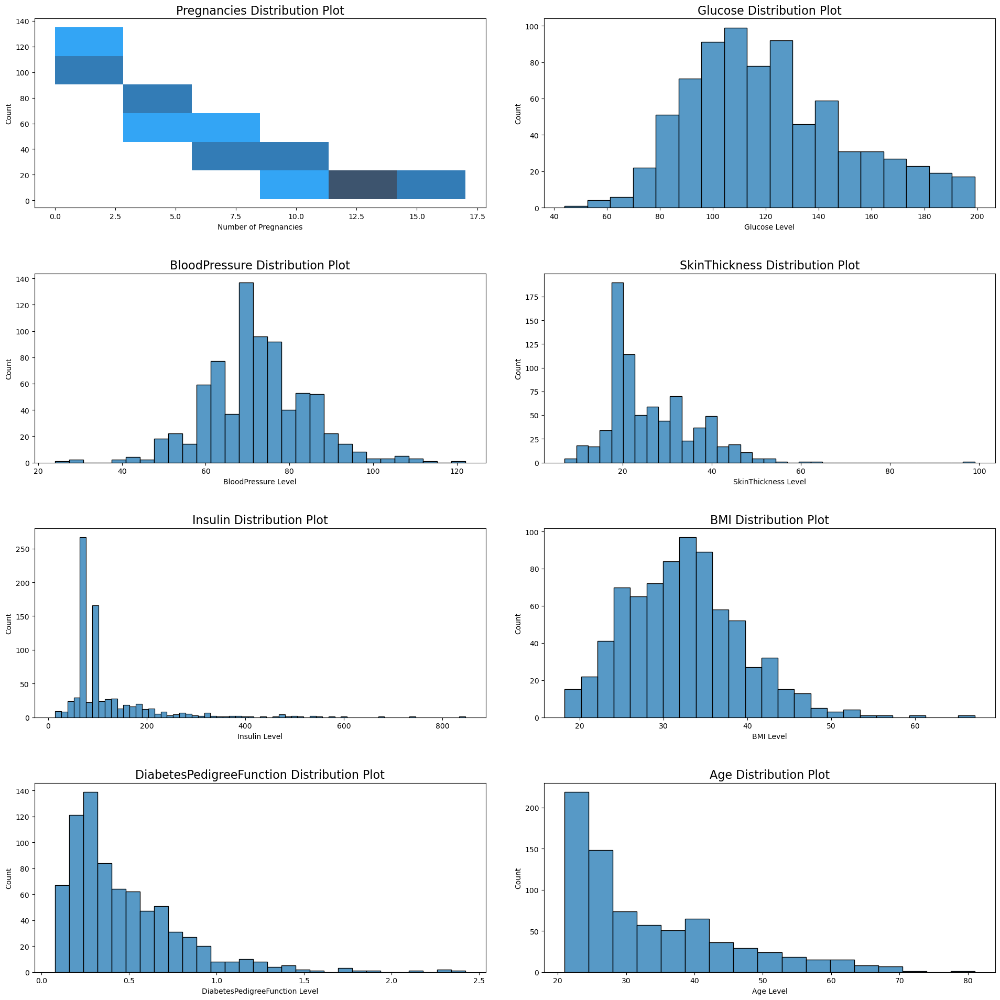

In [39]:
fig,ax= plt.subplots(4,2, figsize=(20,20))
row,col=0,0
for i,colm in enumerate(df.columns):
    row,col=i//2,i%2
    if colm=='Pregnancies':
        ax[row,col].set_title(f'{colm} Distribution Plot',fontsize=16)
        sns.histplot(x=df['Pregnancies'].value_counts().index,y=df['Pregnancies'].value_counts(),ax=ax[0,0])
        ax[0,0].set_xlabel('Number of Pregnancies')
        ax[0,0].set_ylabel('Count')
    elif colm!='Outcome':
        ax[row,col].set_title(f'{colm} Distribution Plot',fontsize=16)
        sns.histplot(x=df[colm],ax=ax[row,col])
        ax[row,col].set_xlabel(f'{colm} Level')
        ax[row,col].set_ylabel('Count')
    fig.tight_layout(pad=4)
plt.show()


# Check overall values

In [51]:
for col in df.columns:
    print(col)
    print(df[col].value_counts())
    print('---------------------------------------')

Pregnancies
1     135
0     111
2     103
3      75
4      68
5      57
6      50
7      45
8      38
9      28
10     24
11     11
13     10
12      9
14      2
15      1
17      1
Name: Pregnancies, dtype: int64
---------------------------------------
Glucose
100.0    17
99.0     17
129.0    14
125.0    14
111.0    14
         ..
191.0     1
177.0     1
44.0      1
62.0      1
190.0     1
Name: Glucose, Length: 136, dtype: int64
---------------------------------------
BloodPressure
70.0     57
74.0     52
78.0     45
68.0     45
72.0     44
64.0     43
80.0     40
76.0     39
60.0     37
62.0     34
66.0     30
82.0     30
88.0     25
84.0     23
90.0     22
86.0     21
58.0     21
68.2     19
70.8     16
50.0     13
56.0     12
52.0     11
54.0     11
75.0      8
92.0      8
65.0      7
85.0      6
94.0      6
48.0      5
96.0      4
44.0      4
100.0     3
106.0     3
98.0      3
110.0     3
55.0      2
108.0     2
104.0     2
46.0      2
30.0      2
122.0     1
95.0      1
102.0  

# Exploratory Data Analysis

# Outlier Identifying

In [14]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [53]:
def outlier_plot(col):
    fig,ax= plt.subplots(2,2,figsize=(17,10))
    sns.boxplot('Outcome',col,data=df,ax=ax[0,0])
    ax[0,0].set_xlabel('Box-plot base on Outcome column')
    sns.violinplot('Outcome',col,data=df,ax=ax[0,1])
    ax[0,1].set_xlabel('Violine-plot base on Outcome column')
    sns.boxplot(col,data=df,ax=ax[1,0])
    ax[1,0].set_xlabel(f'Box-plot for whole {col} column')
    sns.distplot(df[col],ax=ax[1,1])
    ax[1,1].set_xlabel(f'Dist-plot for whole {col} column')
    fig.suptitle(f'Distribution of {col}', fontsize=16)
    fig.tight_layout(pad=2)
    plt.show()

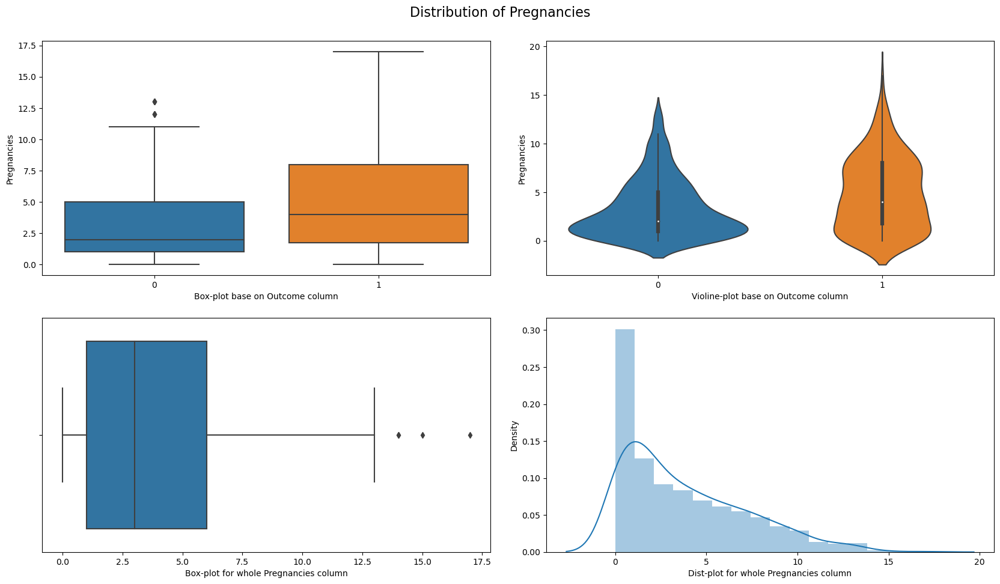

In [54]:
outlier_plot('Pregnancies')

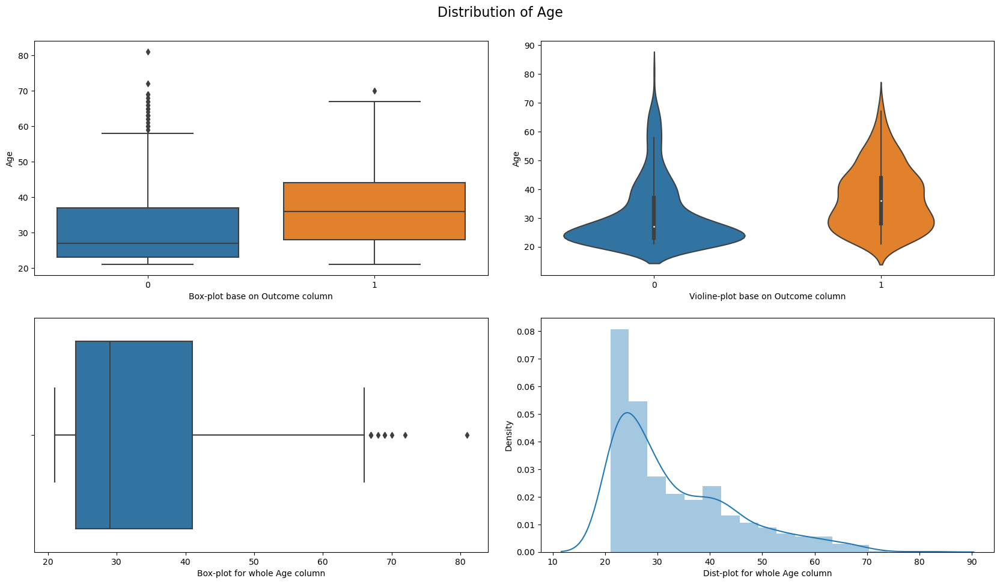

In [55]:
outlier_plot('Age')

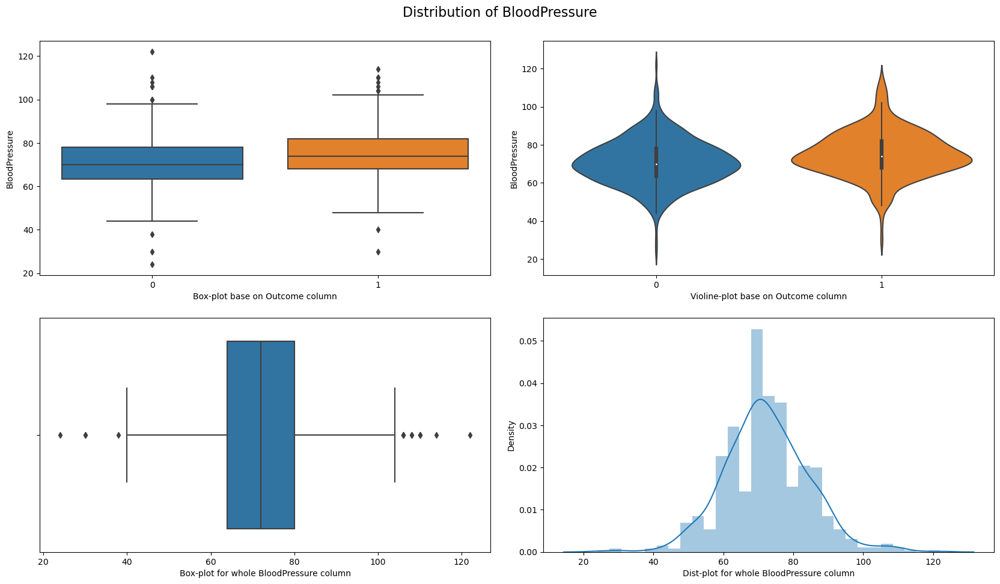

In [56]:
outlier_plot('BloodPressure')

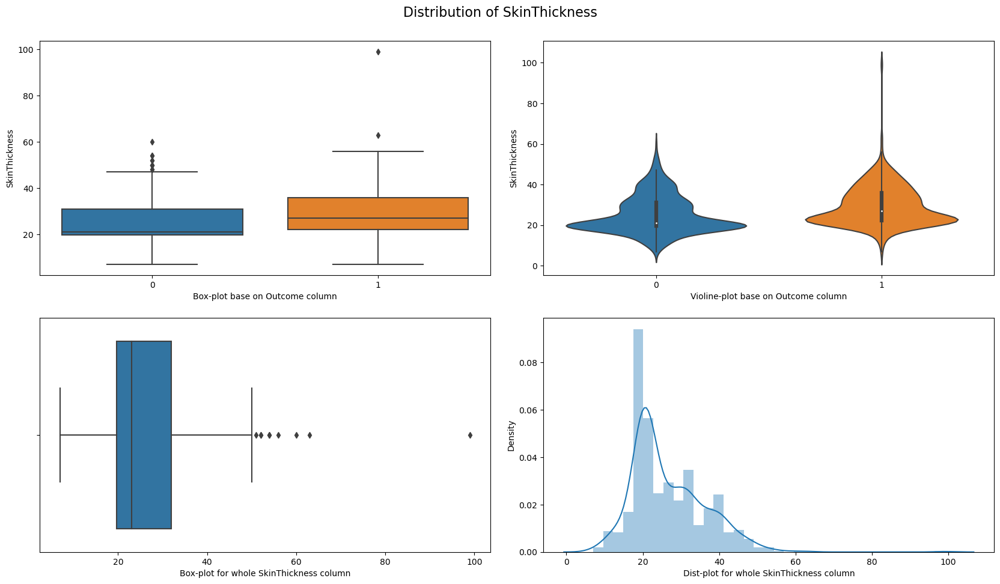

In [57]:
outlier_plot('SkinThickness')


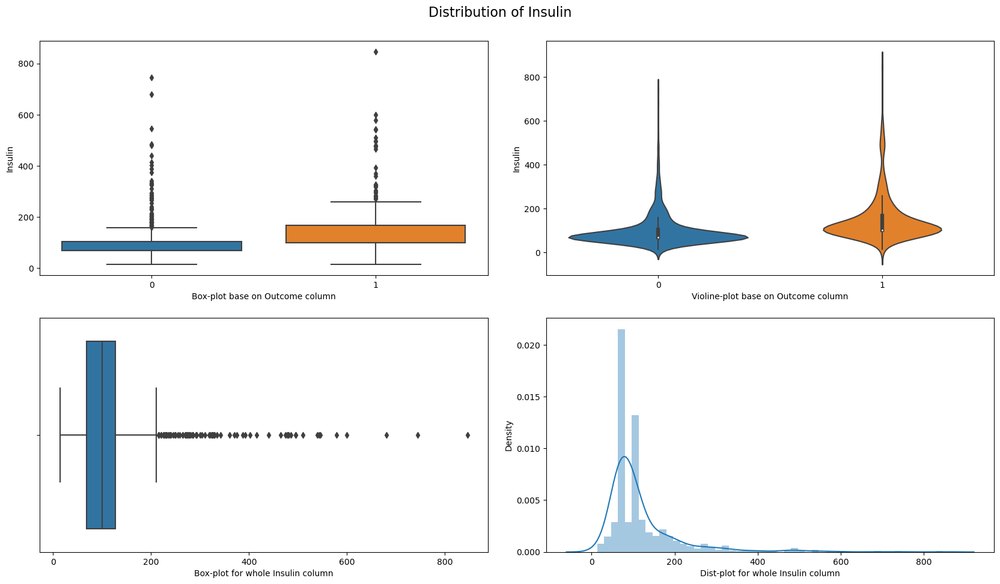

In [58]:
outlier_plot('Insulin')


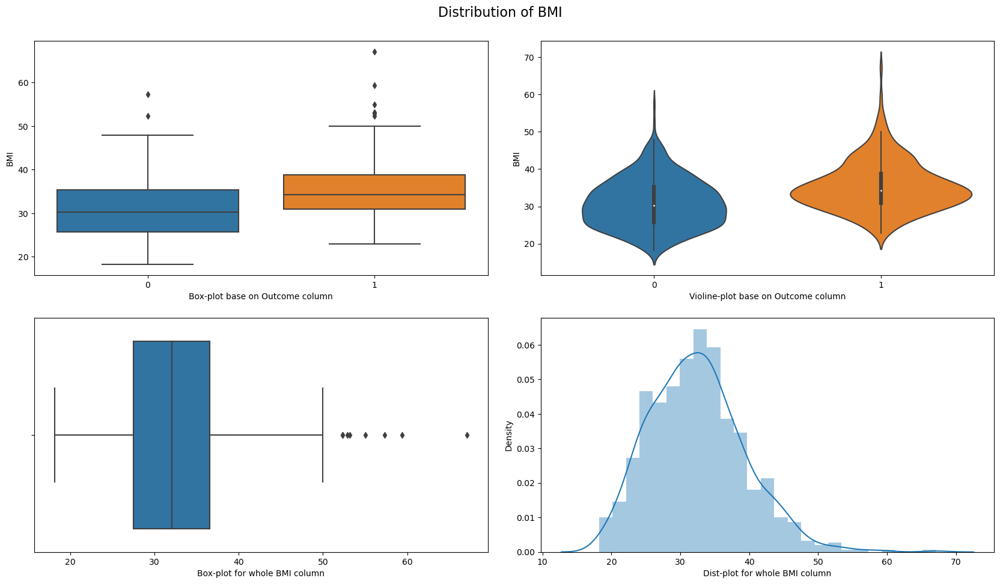

In [59]:
outlier_plot('BMI')


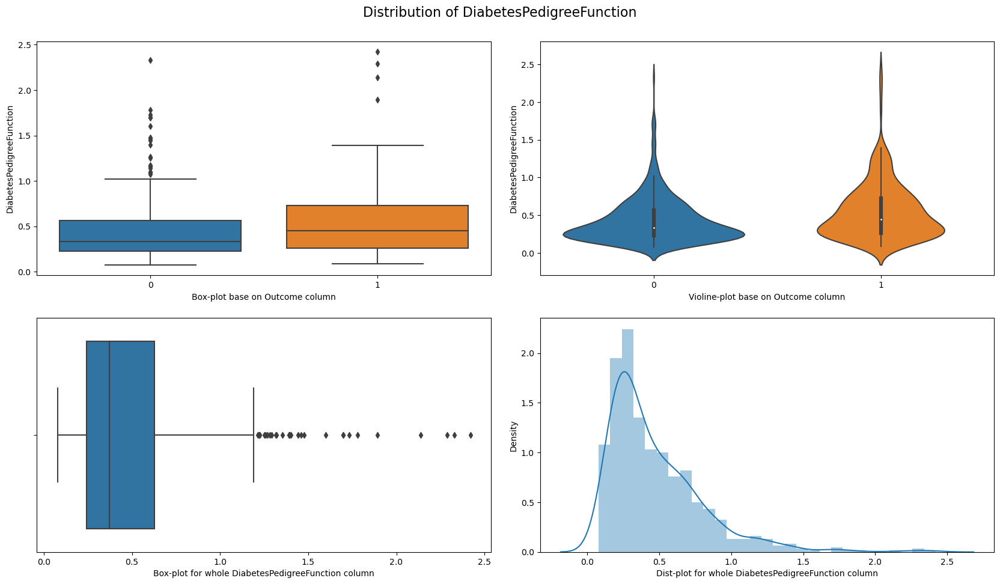

In [60]:
outlier_plot('DiabetesPedigreeFunction')


In [50]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

# Few columns has outliers
### Those are :
 - Pregnancies
 - Glucose
 - BloodPressure
 - SkinThickness
 - Insulin
 - BMI
 - DiabetesPedigreeFunction
 - Age


# Handling the Outliers

In [15]:
def fixing_outlier(col):
    quantile_25= df[col].quantile(0.25)
    quantile_75= df[col].quantile(0.75)
    IQR=quantile_75-quantile_25
    upper=quantile_75+1.5*IQR
    lower=quantile_25-1.5*IQR
    print()
    print(f'-------------------------- {col} --------------------------')
    print()
    print(f'Outlier found in {df.loc[(df[col]> upper) | (df[col]< lower)].shape[0]}  Rows')
    print('---------------------------------')
    print(f'Upper limit :- {upper}')
    print(f'Lower limit :- {lower}')
    print('---------------------------------')
    
    new=df.loc[(df[col]> upper) | (df[col]< lower)]
    
    df[col]= np.where(df[col]> upper,
                                 upper,
                                 np.where(df[col]<lower,
                                         lower,
                                         df[col]))
    print('After modifying all the rows')
    print(f'Outlier found in {df.loc[(df[col]> upper) | (df[col]< lower)].shape[0]} Rows')
    print()
    print('----------------------- Modified Rows ------------------------')
    return new


In [16]:
# Pregnancies
fixing_outlier('Pregnancies')


-------------------------- Pregnancies --------------------------

Outlier found in 4  Rows
---------------------------------
Upper limit :- 13.5
Lower limit :- -6.5
---------------------------------
After modifying all the rows
Outlier found in 0 Rows

----------------------- Modified Rows ------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
88,15,136.0,70.0,32.0,110.0,37.1,0.153,43.0,1
159,17,163.0,72.0,41.0,114.0,40.9,0.817,47.0,1
298,14,100.0,78.0,25.0,184.0,36.6,0.412,46.0,1
455,14,175.0,62.0,30.0,100.3,33.6,0.212,38.0,1


In [17]:
# Glucose
fixing_outlier('Glucose')


-------------------------- Glucose --------------------------

Outlier found in 0  Rows
---------------------------------
Upper limit :- 202.875
Lower limit :- 37.875
---------------------------------
After modifying all the rows
Outlier found in 0 Rows

----------------------- Modified Rows ------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


In [18]:
# BloodPressure
fixing_outlier('BloodPressure')


-------------------------- BloodPressure --------------------------

Outlier found in 14  Rows
---------------------------------
Upper limit :- 104.0
Lower limit :- 40.0
---------------------------------
After modifying all the rows
Outlier found in 0 Rows

----------------------- Modified Rows ------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
18,1.0,103.0,30.0,38.0,83.0,43.3,0.183,33.0,0
43,9.0,171.0,110.0,24.0,240.0,45.4,0.721,54.0,1
84,5.0,137.0,108.0,22.2,100.3,48.8,0.227,37.0,1
106,1.0,96.0,122.0,19.7,68.8,22.4,0.207,27.0,0
125,1.0,88.0,30.0,42.0,99.0,55.0,0.496,26.0,1
177,0.0,129.0,110.0,46.0,130.0,67.1,0.319,26.0,1
362,5.0,103.0,108.0,37.0,68.8,39.2,0.305,65.0,0
549,4.0,189.0,110.0,31.0,68.8,28.5,0.680,37.0,0
597,1.0,89.0,24.0,19.0,25.0,27.8,0.559,21.0,0
599,1.0,109.0,38.0,18.0,120.0,23.1,0.407,26.0,0


In [19]:
# SkinThickness
fixing_outlier('SkinThickness')


-------------------------- SkinThickness --------------------------

Outlier found in 9  Rows
---------------------------------
Upper limit :- 50.45
Lower limit :- 1.2499999999999964
---------------------------------
After modifying all the rows
Outlier found in 0 Rows

----------------------- Modified Rows ------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
57,0.0,100.0,88.0,60.0,110.0,46.8,0.962,31.0,0
86,13.0,106.0,72.0,54.0,68.8,36.6,0.178,45.0,0
99,1.0,122.0,90.0,51.0,220.0,49.7,0.325,31.0,1
120,0.0,162.0,76.0,56.0,100.0,53.2,0.759,25.0,1
211,0.0,147.0,85.0,54.0,68.8,42.8,0.375,24.0,0
275,2.0,100.0,70.0,52.0,57.0,40.5,0.677,25.0,0
445,0.0,180.0,78.0,63.0,14.0,59.4,2.420,25.0,1
532,1.0,86.0,66.0,52.0,65.0,41.3,0.917,29.0,0
579,2.0,197.0,70.0,99.0,100.3,34.7,0.575,62.0,1


In [20]:
# Insulin
fixing_outlier('Insulin')


-------------------------- Insulin --------------------------

Outlier found in 75  Rows
---------------------------------
Upper limit :- 214.925
Lower limit :- -18.875000000000014
---------------------------------
After modifying all the rows
Outlier found in 0 Rows

----------------------- Modified Rows ------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
8,2.0,197.0,70.0,45.0,543.0,30.5,0.158,53.0,1
13,1.0,189.0,60.0,23.0,846.0,30.1,0.398,59.0,1
16,0.0,118.0,84.0,47.0,230.0,45.8,0.551,31.0,1
20,3.0,126.0,88.0,41.0,235.0,39.3,0.704,27.0,0
31,3.0,158.0,76.0,36.0,245.0,31.6,0.851,28.0,1
...,...,...,...,...,...,...,...,...,...
707,2.0,127.0,46.0,21.0,335.0,34.4,0.176,22.0,0
710,3.0,158.0,64.0,13.0,387.0,31.2,0.295,24.0,0
713,0.0,134.0,58.0,20.0,291.0,26.4,0.352,21.0,0
715,7.0,187.0,50.0,33.0,392.0,33.9,0.826,34.0,1


In [21]:
# BMI
fixing_outlier('BMI')


-------------------------- BMI --------------------------

Outlier found in 8  Rows
---------------------------------
Upper limit :- 50.25
Lower limit :- 13.849999999999998
---------------------------------
After modifying all the rows
Outlier found in 0 Rows

----------------------- Modified Rows ------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
120,0.0,162.0,76.0,50.45,100.000,53.2,0.759,25.0,1
125,1.0,88.0,40.0,42.00,99.000,55.0,0.496,26.0,1
177,0.0,129.0,104.0,46.00,130.000,67.1,0.319,26.0,1
193,11.0,135.0,70.8,22.20,100.300,52.3,0.578,40.0,1
247,0.0,165.0,90.0,33.00,214.925,52.3,0.427,23.0,0
303,5.0,115.0,98.0,22.20,100.300,52.9,0.209,28.0,1
445,0.0,180.0,78.0,50.45,14.000,59.4,2.420,25.0,1
673,3.0,123.0,100.0,35.00,214.925,57.3,0.880,22.0,0


In [22]:
# DiabetesPedigreeFunction
fixing_outlier('DiabetesPedigreeFunction')


-------------------------- DiabetesPedigreeFunction --------------------------

Outlier found in 29  Rows
---------------------------------
Upper limit :- 1.2
Lower limit :- -0.32999999999999996
---------------------------------
After modifying all the rows
Outlier found in 0 Rows

----------------------- Modified Rows ------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
4,0.0,137.0,40.0,35.00,168.000,43.10,2.288,33.0,1
12,10.0,139.0,80.0,19.70,68.800,27.10,1.441,57.0,0
39,4.0,111.0,72.0,47.00,207.000,37.10,1.390,56.0,1
45,0.0,180.0,66.0,39.00,100.300,42.00,1.893,25.0,1
58,0.0,146.0,82.0,19.70,68.800,40.50,1.781,44.0,0
100,1.0,163.0,72.0,22.20,100.300,39.00,1.222,33.0,1
147,2.0,106.0,64.0,35.00,119.000,30.50,1.400,34.0,0
187,1.0,128.0,98.0,41.00,58.000,32.00,1.321,33.0,1
218,5.0,85.0,74.0,22.00,100.300,29.00,1.224,32.0,1
228,4.0,197.0,70.0,39.00,214.925,36.70,2.329,31.0,0


In [23]:
# Age
fixing_outlier('Age')


-------------------------- Age --------------------------

Outlier found in 9  Rows
---------------------------------
Upper limit :- 66.5
Lower limit :- -1.5
---------------------------------
After modifying all the rows
Outlier found in 0 Rows

----------------------- Modified Rows ------------------------


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
123,5.0,132.0,80.0,19.7,68.8,26.8,0.186,69.0,0
363,4.0,146.0,78.0,22.2,100.3,38.5,0.520,67.0,1
453,2.0,119.0,68.2,19.7,68.8,19.6,0.832,72.0,0
459,9.0,134.0,74.0,33.0,60.0,25.9,0.460,81.0,0
489,8.0,194.0,80.0,19.7,68.8,26.1,0.551,67.0,0
537,0.0,57.0,60.0,19.7,68.8,21.7,0.735,67.0,0
666,4.0,145.0,82.0,18.0,100.3,32.5,0.235,70.0,1
674,8.0,91.0,82.0,19.7,68.8,35.6,0.587,68.0,0
684,5.0,136.0,82.0,19.7,68.8,30.3,0.640,69.0,0


In [24]:
len(df.columns)

9

##  Visualizating all the columns that had outliers before 

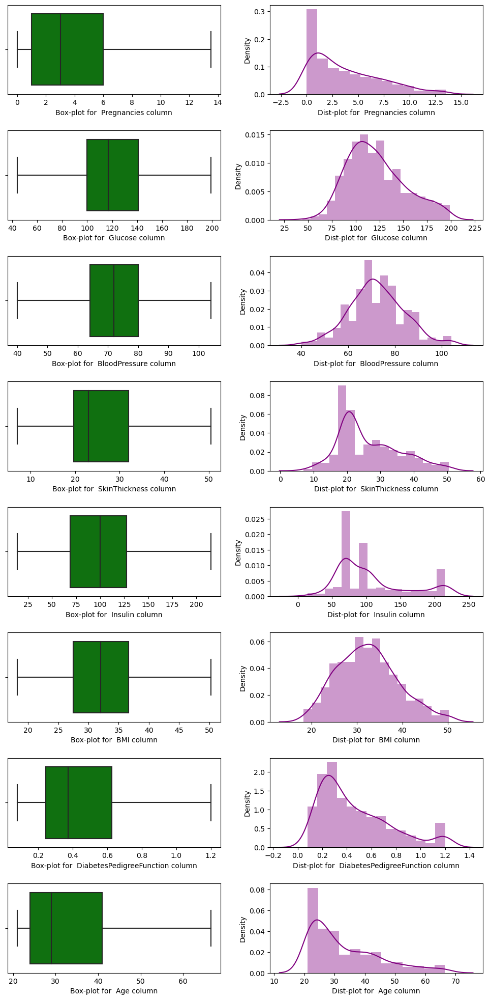

In [70]:
fig,ax= plt.subplots(8,2, figsize=(10,20))
row,col=0,0
for i,colm in enumerate(df.columns):
    row=i
    if colm!='Outcome':
        
        sns.boxplot(colm,data=df,color='green',ax=ax[row,0])
        ax[row,0].set_xlabel(f'Box-plot for  {colm} column')
        
        sns.distplot(df[colm],color='purple',ax=ax[row,1])
        ax[row,1].set_xlabel(f'Dist-plot for  {colm} column')
                
        fig.tight_layout(pad=2)
plt.show()

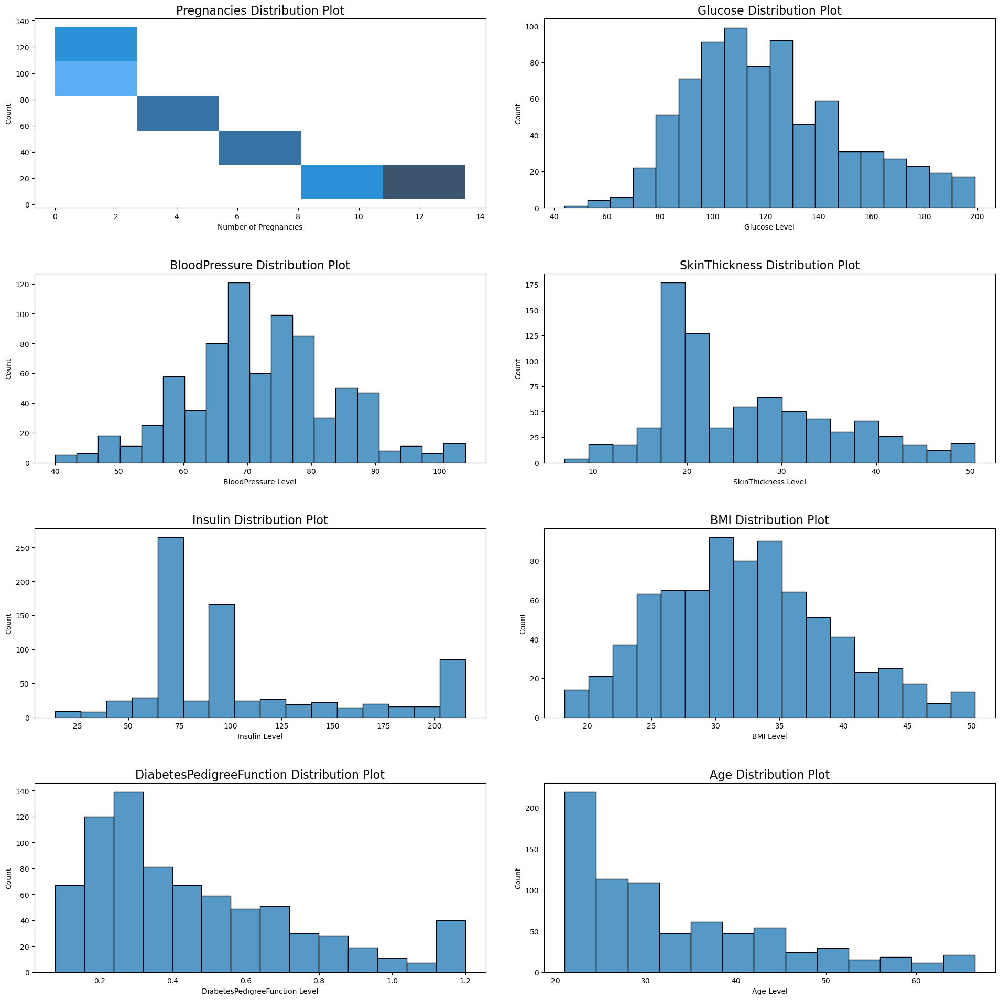

In [71]:
fig,ax= plt.subplots(4,2, figsize=(20,20))
row,col=0,0
for i,colm in enumerate(df.columns):
    row,col=i//2,i%2
    if colm=='Pregnancies':
        ax[row,col].set_title(f'{colm} Distribution Plot',fontsize=16)
        sns.histplot(x=df['Pregnancies'].value_counts().index,y=df['Pregnancies'].value_counts(),ax=ax[0,0])
        ax[0,0].set_xlabel('Number of Pregnancies')
        ax[0,0].set_ylabel('Count')
    elif colm!='Outcome':
        ax[row,col].set_title(f'{colm} Distribution Plot',fontsize=16)
        sns.histplot(x=df[colm],ax=ax[row,col])
        ax[row,col].set_xlabel(f'{colm} Level')
        ax[row,col].set_ylabel('Count')
    fig.tight_layout(pad=4)
plt.show()

## Plotting Scatterplot to understand relation between columns

In [117]:
def grid_scatter_polt(col):
    fig,ax= plt.subplots(7,2, figsize=(15,20))
    row=0
    for i,colm in enumerate(df.columns):
        if colm!='Outcome' and colm!=col:
            sns.scatterplot(col,colm,data=df,hue='Outcome',ax=ax[row,0])
            ax[row,0].set_xlabel(f' {col} ')

            sns.distplot(df[colm],color='purple',ax=ax[row,1])
            ax[row,1].set_xlabel(f'{colm}')

            fig.tight_layout(pad=2)
            row+=1
    plt.show()

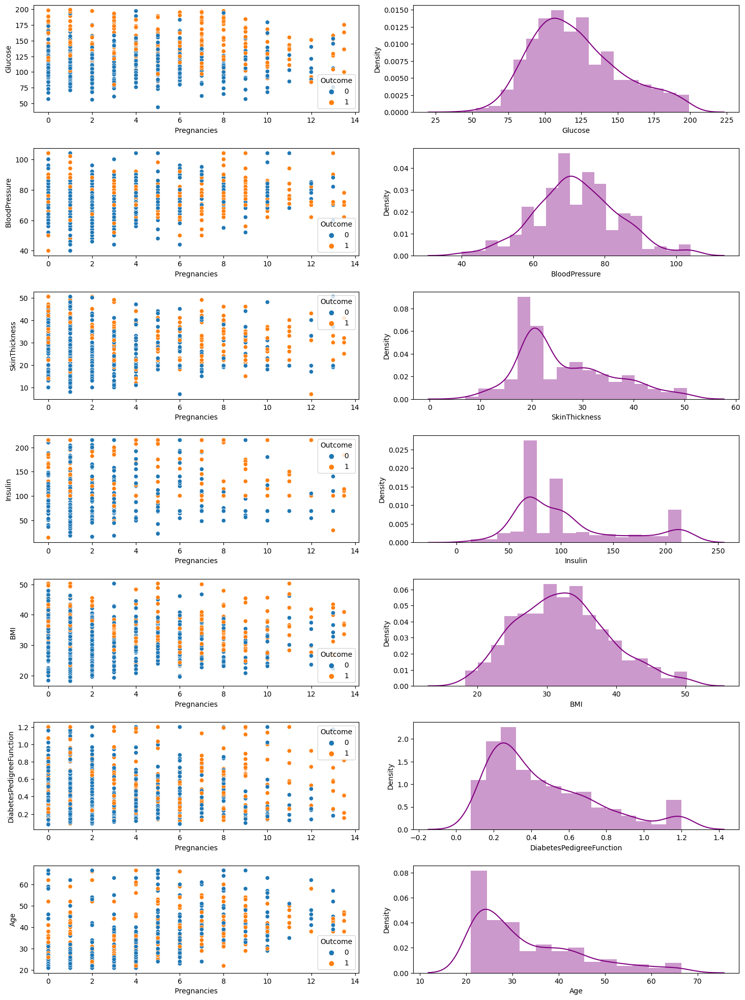

In [118]:
grid_scatter_polt('Pregnancies')

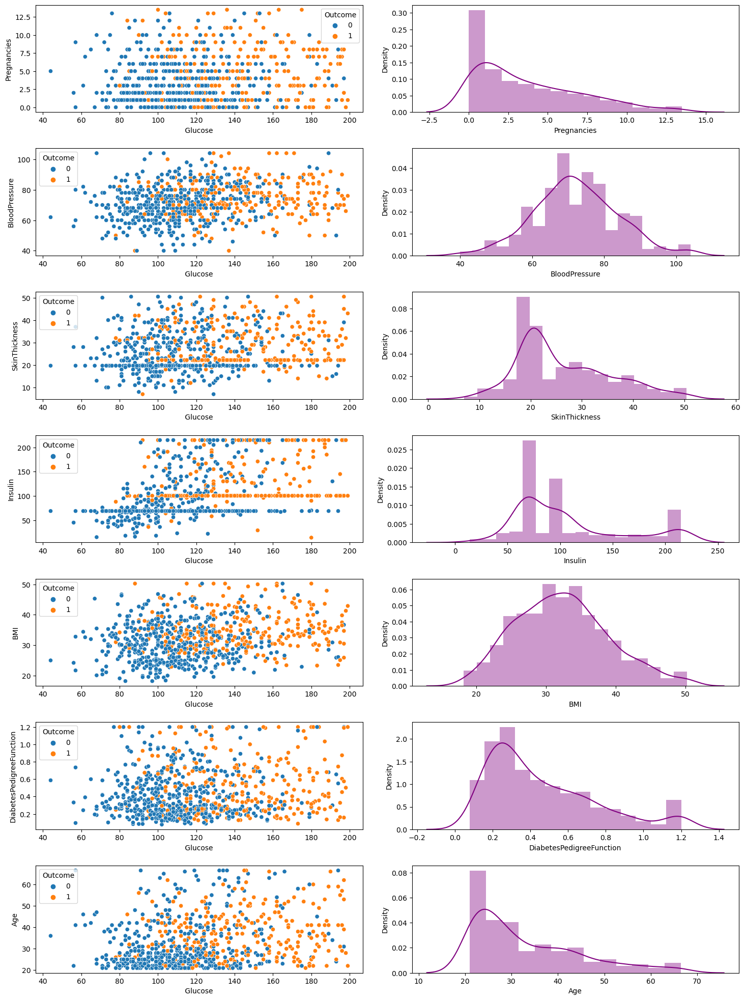

In [120]:
grid_scatter_polt('Glucose')

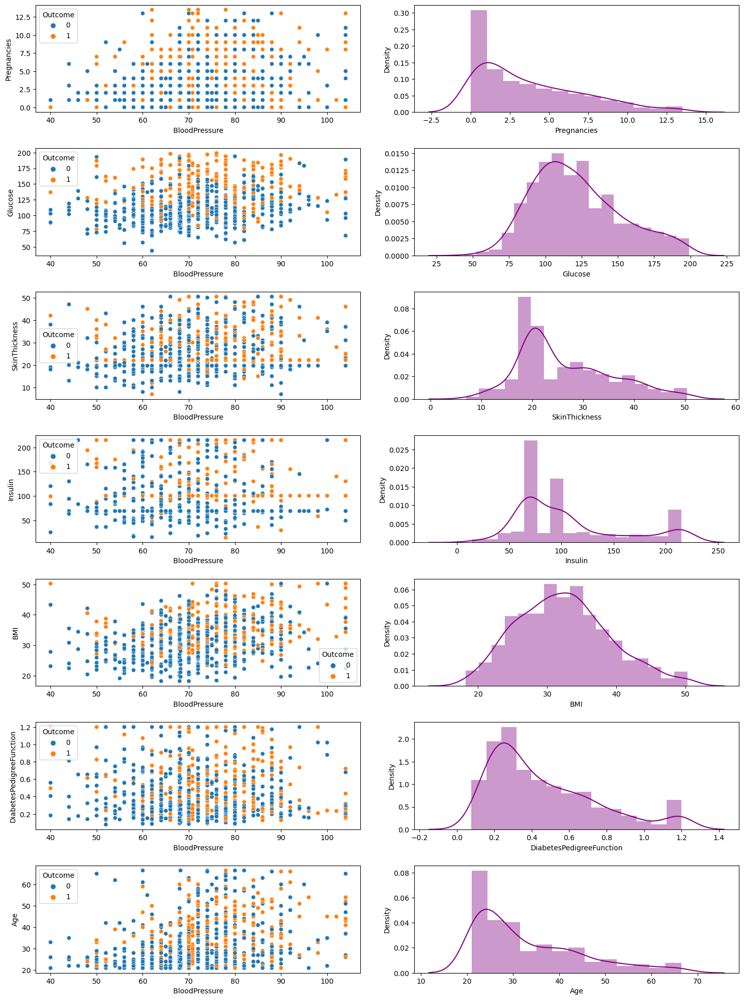

In [97]:
grid_scatter_polt('BloodPressure')

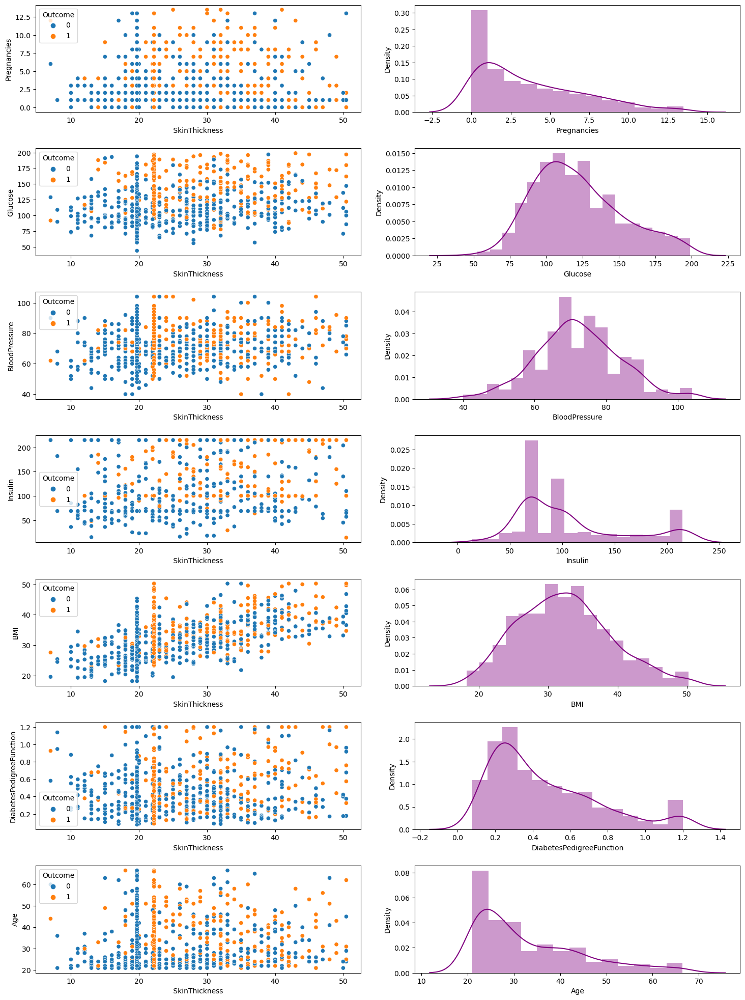

In [98]:
grid_scatter_polt('SkinThickness')

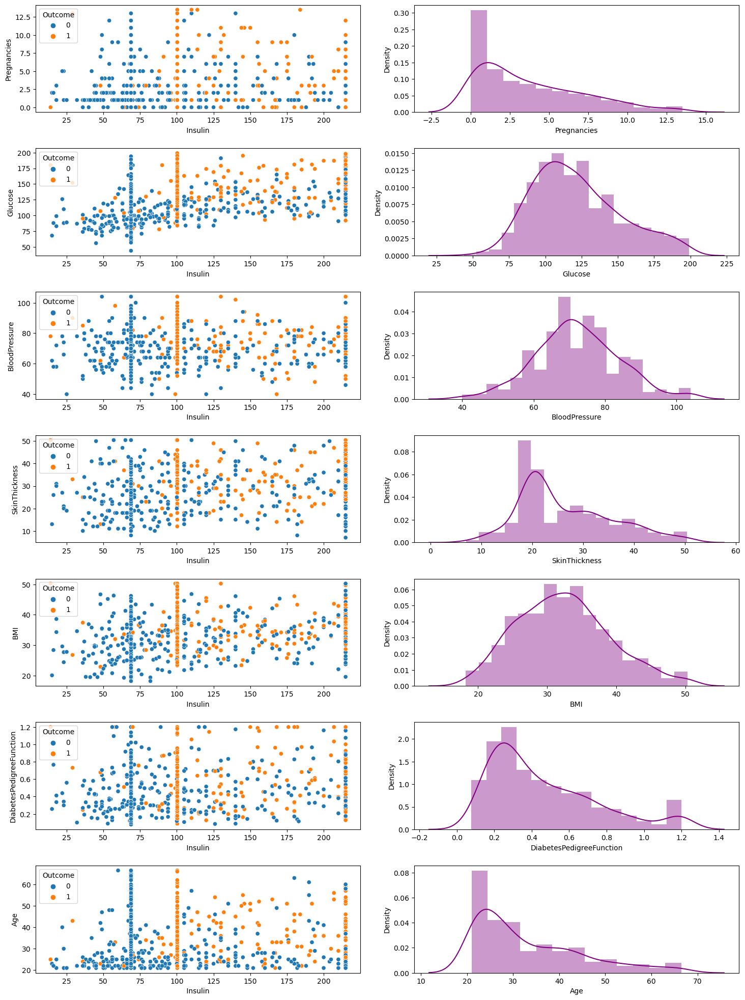

In [99]:
grid_scatter_polt('Insulin')

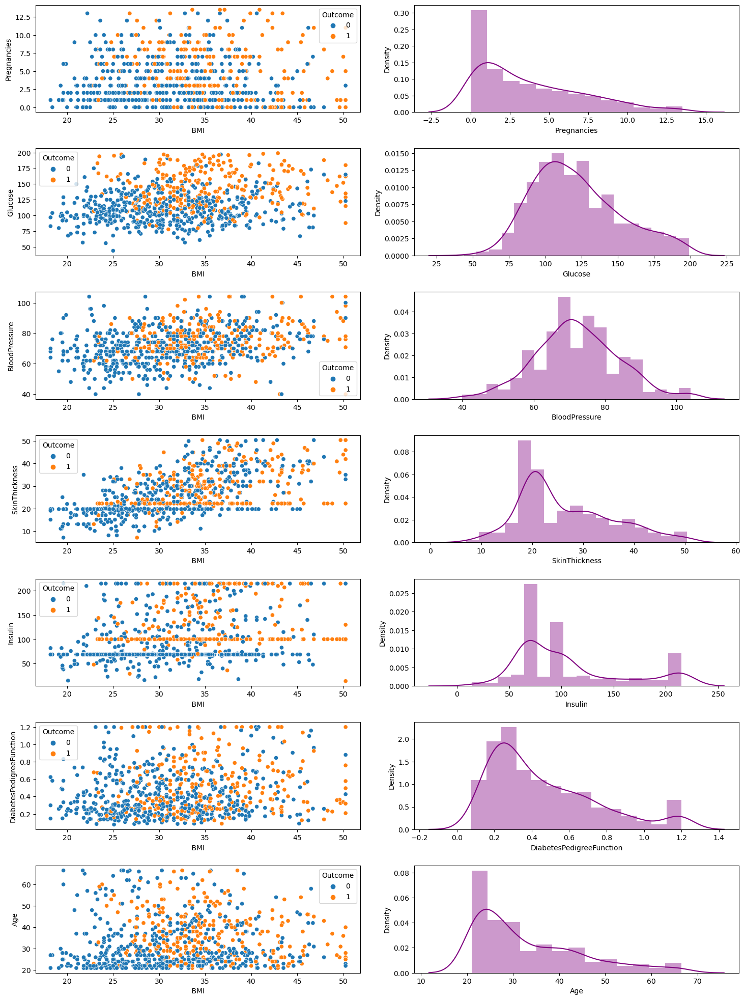

In [100]:
grid_scatter_polt('BMI')

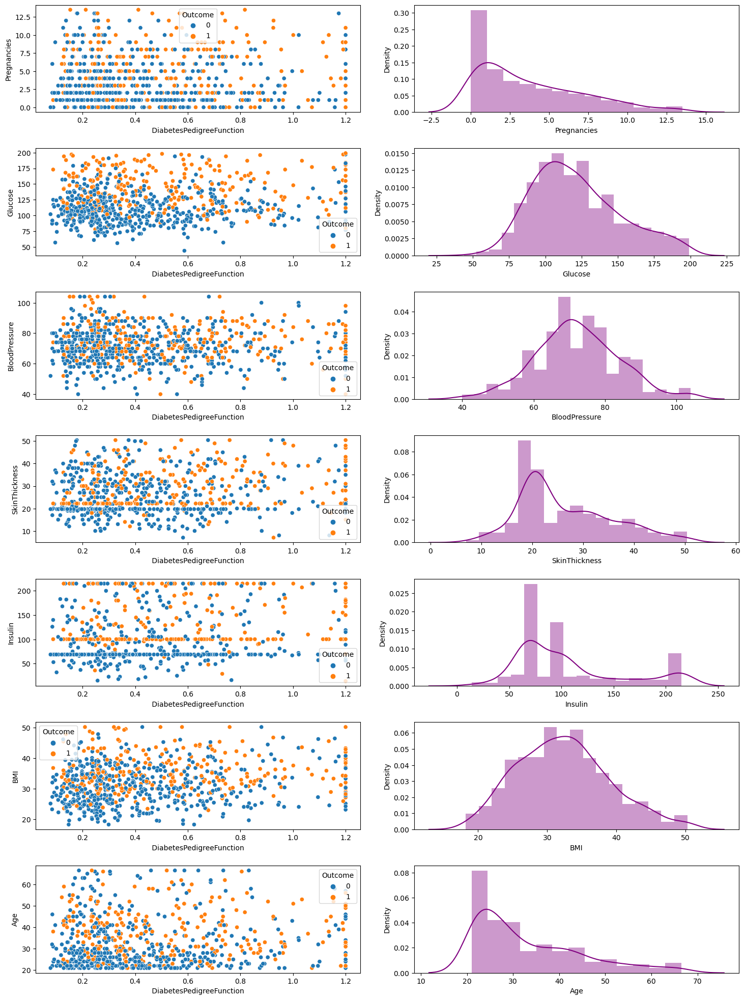

In [101]:
grid_scatter_polt('DiabetesPedigreeFunction')

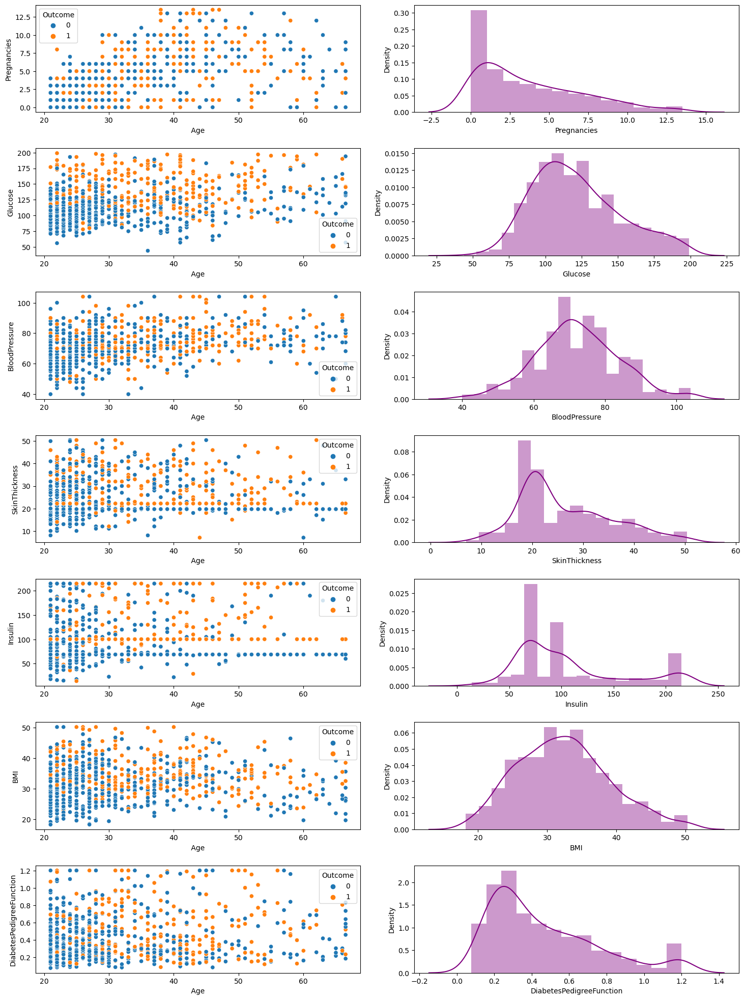

In [102]:
grid_scatter_polt('Age')

In [25]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,100.3,33.6,0.627,50.0,1
1,1.0,85.0,66.0,29.0,68.8,26.6,0.351,31.0,0
2,8.0,183.0,64.0,22.2,100.3,23.3,0.672,32.0,1
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0
4,0.0,137.0,40.0,35.0,168.0,43.1,1.200,33.0,1
...,...,...,...,...,...,...,...,...,...
763,10.0,101.0,76.0,48.0,180.0,32.9,0.171,63.0,0
764,2.0,122.0,70.0,27.0,68.8,36.8,0.340,27.0,0
765,5.0,121.0,72.0,23.0,112.0,26.2,0.245,30.0,0
766,1.0,126.0,60.0,22.2,100.3,30.1,0.349,47.0,1


In [26]:
# for colm in df.columns:
#     print('-------------')
#     print(colm)
#     print(df[colm].min())

-------------
Pregnancies
0.0
-------------
Glucose
44.0
-------------
BloodPressure
40.0
-------------
SkinThickness
7.0
-------------
Insulin
14.0
-------------
BMI
18.2
-------------
DiabetesPedigreeFunction
0.078
-------------
Age
21.0
-------------
Outcome
0


In [28]:
# df.to_csv('diabetes_df.csv')

# MinMaxScaler to limit  data range 0-1

In [121]:
from sklearn.preprocessing import MinMaxScaler

In [137]:
def min_max_scaler(df,col):
    mn=MinMaxScaler()
    mn.fit(df[[col]])
    df[col]=mn.transform(df[[col]])

In [141]:
min_max_scaler(df,'Glucose')

In [142]:
min_max_scaler(df,'BloodPressure')

In [143]:
min_max_scaler(df,'SkinThickness')

In [144]:
min_max_scaler(df,'Insulin')

In [145]:
min_max_scaler(df,'BMI')

In [146]:
min_max_scaler(df,'Age')

In [148]:
min_max_scaler(df,'Pregnancies')

In [149]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.444444,0.670968,0.50000,0.644419,0.429514,0.480499,0.627,0.637363,1
1,0.074074,0.264516,0.40625,0.506329,0.272739,0.262090,0.351,0.219780,0
2,0.592593,0.896774,0.37500,0.349827,0.429514,0.159126,0.672,0.241758,1
3,0.074074,0.290323,0.40625,0.368239,0.398159,0.308892,0.167,0.000000,0
4,0.000000,0.600000,0.00000,0.644419,0.766455,0.776911,1.200,0.263736,1
...,...,...,...,...,...,...,...,...,...
763,0.740741,0.367742,0.56250,0.943613,0.826179,0.458658,0.171,0.923077,0
764,0.148148,0.503226,0.46875,0.460299,0.272739,0.580343,0.340,0.131868,0
765,0.370370,0.496774,0.50000,0.368239,0.487744,0.249610,0.245,0.197802,0
766,0.074074,0.529032,0.31250,0.349827,0.429514,0.371295,0.349,0.571429,1


# Relation between columns

<AxesSubplot:>

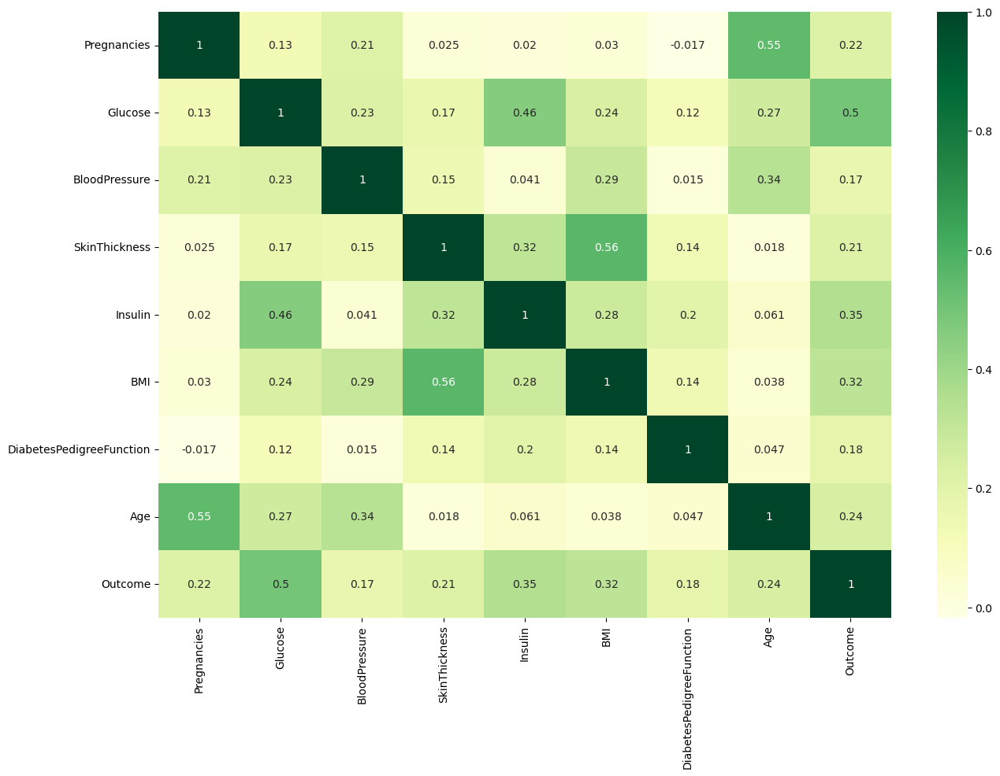

In [154]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True,cmap='YlGn')

<AxesSubplot:>

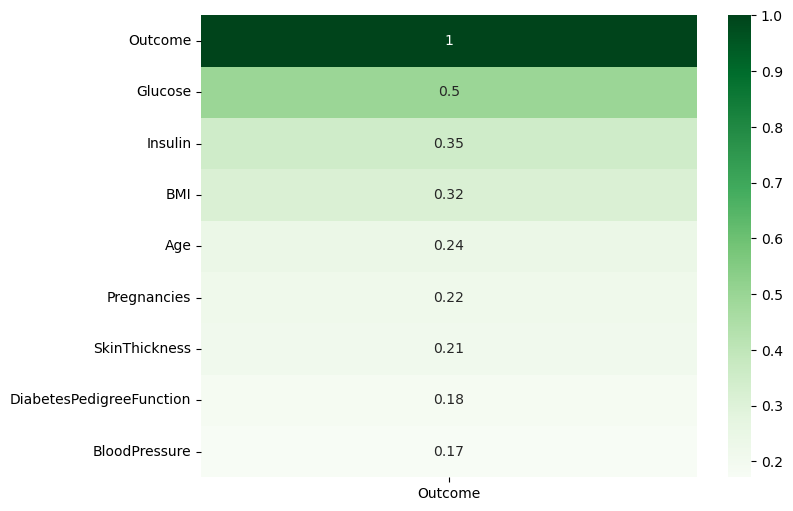

In [155]:
plt.figure(figsize=(8,6))
sns.heatmap(df.corr()[['Outcome']].sort_values(by='Outcome',ascending=False),annot=True,cmap='Greens')

In [171]:
df['Outcome']=df['Outcome'].astype('int')

<Figure size 2000x2000 with 0 Axes>

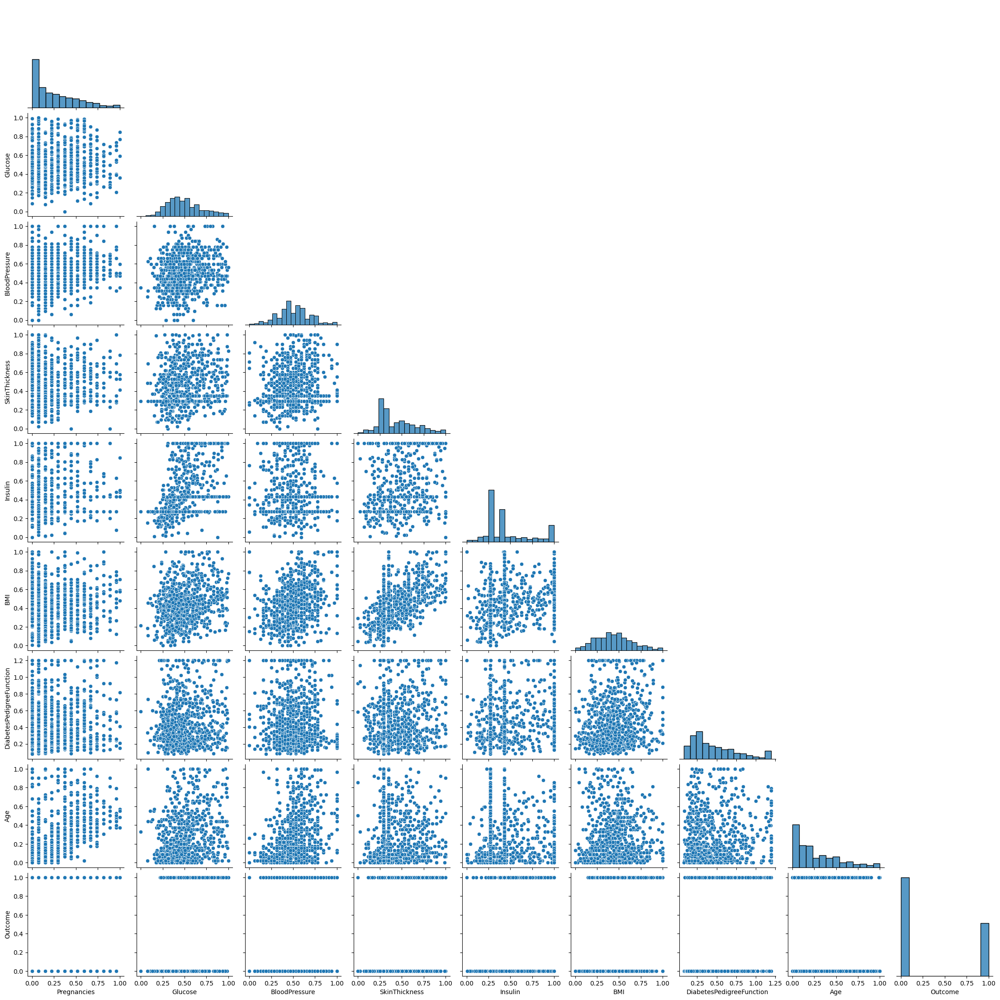

In [174]:
plt.figure(figsize=(20,20))
sns.pairplot(df,corner=True)

In [172]:
df.corr()['Outcome']

Pregnancies                 0.220392
Glucose                     0.495909
BloodPressure               0.171650
SkinThickness               0.213665
Insulin                     0.349984
BMI                         0.316632
DiabetesPedigreeFunction    0.184969
Age                         0.242702
Outcome                     1.000000
Name: Outcome, dtype: float64

# Distribution of Diabetes 

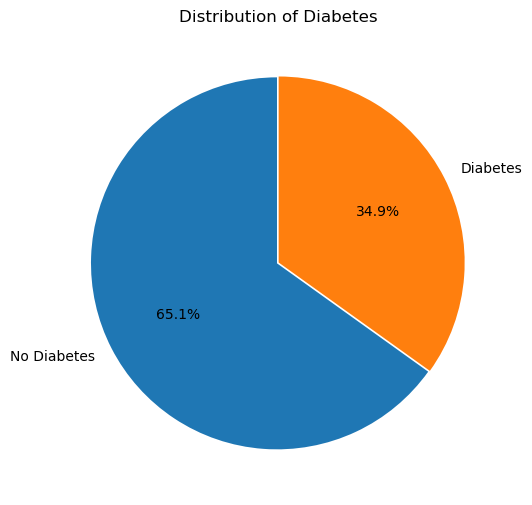

In [175]:
plt.figure(figsize=(6,8))
plt.pie(df['Outcome'].value_counts(),
        labels=['No Diabetes','Diabetes'],
        explode=(.01,0),
        autopct="%1.1f%%",startangle=90)
plt.title('Distribution of Diabetes')
plt.show()

In [177]:
df['Outcome'].value_counts()

0    500
1    268
Name: Outcome, dtype: int64

In [179]:
dff=df.copy(deep=True)
dff

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.444444,0.670968,0.50000,0.644419,0.429514,0.480499,0.627,0.637363,1
1,0.074074,0.264516,0.40625,0.506329,0.272739,0.262090,0.351,0.219780,0
2,0.592593,0.896774,0.37500,0.349827,0.429514,0.159126,0.672,0.241758,1
3,0.074074,0.290323,0.40625,0.368239,0.398159,0.308892,0.167,0.000000,0
4,0.000000,0.600000,0.00000,0.644419,0.766455,0.776911,1.200,0.263736,1
...,...,...,...,...,...,...,...,...,...
763,0.740741,0.367742,0.56250,0.943613,0.826179,0.458658,0.171,0.923077,0
764,0.148148,0.503226,0.46875,0.460299,0.272739,0.580343,0.340,0.131868,0
765,0.370370,0.496774,0.50000,0.368239,0.487744,0.249610,0.245,0.197802,0
766,0.074074,0.529032,0.31250,0.349827,0.429514,0.371295,0.349,0.571429,1


# Data Imbalance

## Using SMOTE technique to balance the data

In [180]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
sm=SMOTE(sampling_strategy='minority',random_state=42,n_jobs=-1)
X=dff.loc[:,dff.columns!='Outcome']
y=dff.loc[:,dff.columns=='Outcome']
x_sm,y_sm=sm.fit_resample(X,y)


In [182]:
print(f'After SMOTE, Total Sample--------- {y_sm.shape[0]}')
print(f'Before SMOTE, Total Sample--------- {df.shape[0]}')
print((y_sm['Outcome']==1).sum())
print((y_sm['Outcome']==0).sum())

After SMOTE, Total Sample--------- 1000
Before SMOTE, Total Sample--------- 768
500
500


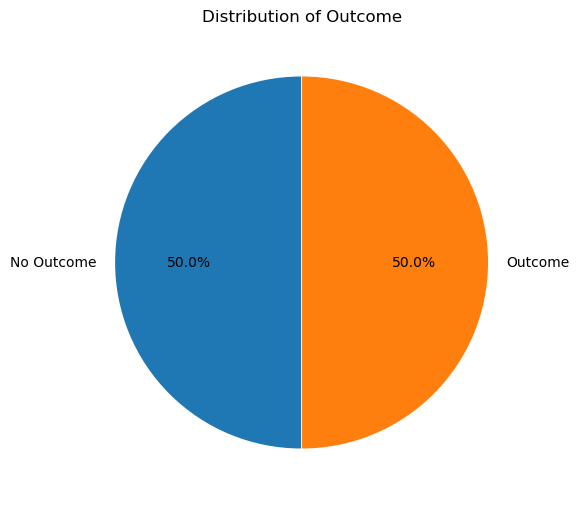

In [185]:
plt.figure(figsize=(6,8))
plt.pie(y_sm['Outcome'].value_counts(),
        labels=['No Outcome','Outcome'],
        explode=(.005,0),
        autopct="%1.1f%%",startangle=90)
plt.title('Distribution of Outcome')
plt.show()

In [186]:
x_sm

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.444444,0.670968,0.500000,0.644419,0.429514,0.480499,0.627000,0.637363
1,0.074074,0.264516,0.406250,0.506329,0.272739,0.262090,0.351000,0.219780
2,0.592593,0.896774,0.375000,0.349827,0.429514,0.159126,0.672000,0.241758
3,0.074074,0.290323,0.406250,0.368239,0.398159,0.308892,0.167000,0.000000
4,0.000000,0.600000,0.000000,0.644419,0.766455,0.776911,1.200000,0.263736
...,...,...,...,...,...,...,...,...
995,0.563144,0.640881,0.462729,0.349827,0.429514,0.427647,0.314924,0.369392
996,0.263237,0.377981,0.444734,0.429945,0.429514,0.425007,0.177067,0.160928
997,0.253737,0.866710,0.685511,0.460299,0.760727,0.539504,1.128473,0.685994
998,0.218237,0.540056,0.802411,0.961675,0.711395,0.563330,0.954172,0.238211


# Importing necessary Algorithm and Library

In [187]:
from sklearn.model_selection import  cross_val_score
from sklearn.metrics import accuracy_score,r2_score,mean_absolute_error

In [188]:
X=x_sm
y=y_sm

In [189]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.2,random_state=42)

In [190]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier
import xgboost as xgb
import lightgbm as lgb
import catboost as cb

In [191]:
lrg=LogisticRegression()
sgdc=SGDClassifier()
sv=SVC()
knn=KNeighborsClassifier()
gnb=GaussianNB()
mnb=MultinomialNB()
dtc=DecisionTreeClassifier()
rfc=RandomForestClassifier()
abc=AdaBoostClassifier()
bc=BaggingClassifier()
gbc=GradientBoostingClassifier()
sc=StackingClassifier(estimators=dtc)
xgc=xgb.XGBClassifier()
lgc=lgb.LGBMClassifier()
cat=cb.CatBoostClassifier()

In [192]:
all_model={'lrg':lrg,
         'sgdc':sgdc,
         'sv':sv,
         'knn':knn,
         'gnb':gnb,
         'mnb':mnb,
         'dtc':dtc,
         'rfc':rfc,
         'abc':abc,
         'bc':bc,
         'gbc':gbc,
         'xgc':xgc,
         'lgc':lgc,
         'cat':cat
        }

In [193]:
def traning(X,y):
    store=[]
    for key,model in all_model.items():
   
        print(key)
        try:
            score=cross_val_score(model,X,y,cv=10,n_jobs=-1,scoring='accuracy').mean()
            store.append(score)
            print(score)
        except:
            score=cross_val_score(model,X,y,cv=10,n_jobs=-1,scoring='r2').mean()
            store.append(score)

            print(score)
        print('-----------------------------------------')
    arr.append(store)
    
    

In [194]:
x_train.shape

(800, 8)

# Feature selection

In [195]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import chi2

In [196]:
arr=[]
for i in range(1,8):
    print(f"================{i}=================")
    feature1=SelectKBest(chi2,k=i).fit(X,y)
    xx_train=feature1.transform(X)
    traning(xx_train,y)

================1=================
lrg
0.717
-----------------------------------------
sgdc
0.6859999999999999
-----------------------------------------
sv
0.7140000000000001
-----------------------------------------
knn
0.681
-----------------------------------------
gnb
0.716
-----------------------------------------
mnb
0.5
-----------------------------------------
dtc
0.7129999999999999
-----------------------------------------
rfc
0.711
-----------------------------------------
abc
0.6980000000000001
-----------------------------------------
bc
0.712
-----------------------------------------
gbc
0.726
-----------------------------------------
xgc
0.71
-----------------------------------------
lgc
0.7219999999999999
-----------------------------------------
cat
0.72
-----------------------------------------
================2=================
lrg
0.73
-----------------------------------------
sgdc
0.7299999999999999
-----------------------------------------
sv
0.835
----------------

# Accuracy Chart

In [201]:
def accuracy_plot(arr,y_lower,y_upper):
    row=len(arr)
    new=np.array(arr).reshape(row,14)
    neww=pd.DataFrame(new,columns=all_model)
    plt.figure(figsize=(20, 20))

    # Plot each classifier's performance for each dataset
    for classifier in neww.columns:
        plt.plot(neww.index, neww[classifier], marker='o', label=classifier)
        plt.ylim(y_lower,y_upper)

    # Adding labels and title
    plt.xlabel('Number of time test run')
    plt.ylabel('Accuracy')
    plt.title('Classifier Performance on Different Datasets')
    plt.xticks(neww.index)
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.show()

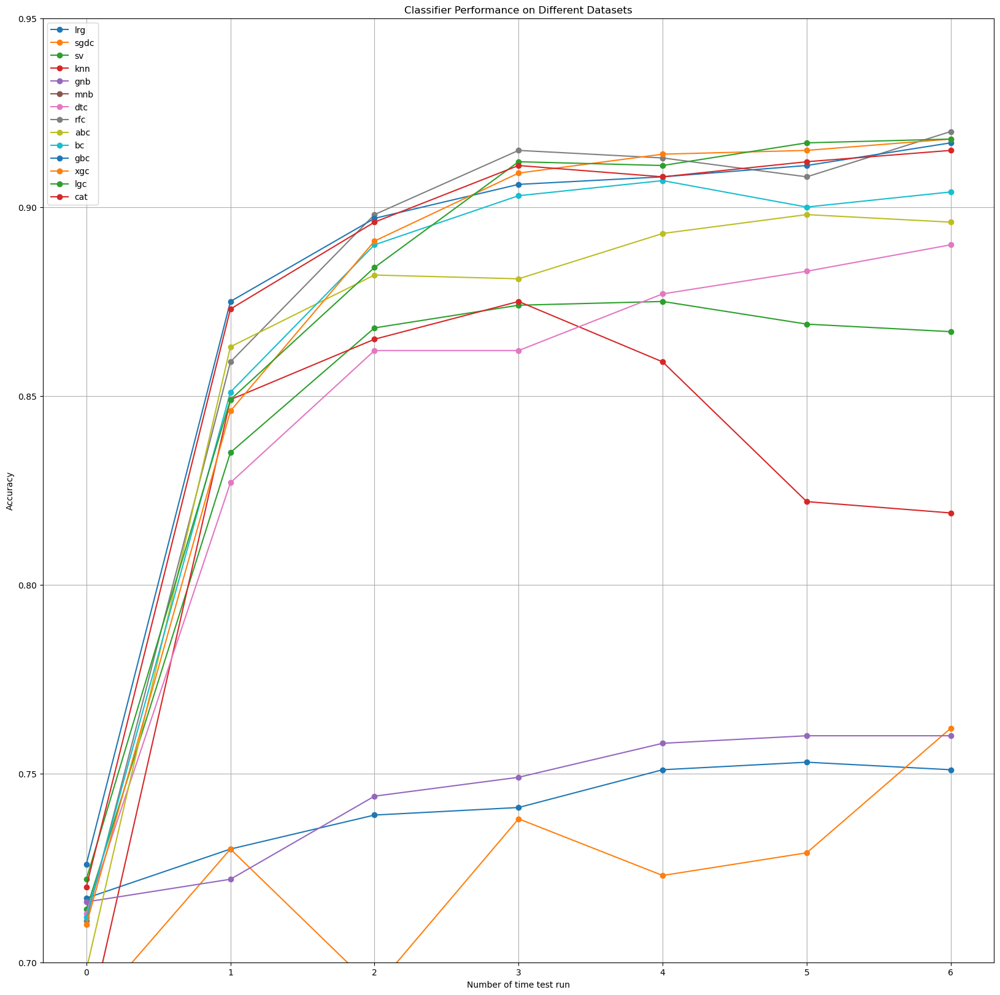

In [202]:
accuracy_plot(arr,.7,.95)

### By using  SelectKBest and chi2 function we find
 - top 7 feature gives - 92%  accuracy (RandomForestClassifier)
 - top 7 feature gives - 91.8%  accuracy (Xgboost,Lightgbm,GradientBoosting)
 - top 7 feature gives - 91.5% accuracy (Catboost)

In [218]:
feature2=SelectKBest(chi2,k=7).fit(X,y)
xxy_train=feature1.transform(X)
feature_dataframe=pd.DataFrame({'Feature':list(X.columns),
                                'Score':feature2.scores_,
                                'Pvalue':feature2.pvalues_
                               })


In [204]:
feature_dataframe.sort_values(by='Score')

,Feature,Score,Pvalue
2,BloodPressure,1.760960,0.184505
3,SkinThickness,5.139007,0.023394
6,DiabetesPedigreeFunction,6.457046,0.011051
0,Pregnancies,10.092265,0.001489
5,BMI,10.481668,0.001206
7,Age,13.867824,0.000196
4,Insulin,18.270541,0.000019
1,Glucose,19.121095,0.000012


In [223]:
def cross_val_mean_acc(model,x_train,y):
    acc_kbest=cross_val_score(model,x_train,y,cv=10,scoring='accuracy')
    return acc_kbest.mean()

In [224]:
def create_datafram(arr_acc,model_dict):
    new=pd.DataFrame(columns=['Algorithm','Cv_mean_acc'])
    i=0
    for key,name in model_dict.items():
        new.loc[i,'Algorithm']=key
        new.loc[i,'Cv_mean_acc']=arr_acc[i]
        i+=1
    return new

In [228]:
selected_model_for_SelectKBest={
         'bc':gbc,
         'rfc':rfc,
         'xgc':xgc,
         'lgc':lgc,
         'cat':cat
        }

In [229]:
model_acc_arr=[]

for key,model in selected_model_for_SelectKBest.items():
    model_acc_arr.append(cross_val_mean_acc(model,xxy_train,y))
    
model_acc_df_for_SelectKBest=create_datafram(model_acc_arr,selected_model_for_SelectKBest)
    

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1263
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1260
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-thre

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1075
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1074
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-thre

128:	learn: 0.2458417	total: 792ms	remaining: 5.35s
129:	learn: 0.2452445	total: 801ms	remaining: 5.36s
130:	learn: 0.2447104	total: 811ms	remaining: 5.38s
131:	learn: 0.2440964	total: 819ms	remaining: 5.39s
132:	learn: 0.2433910	total: 826ms	remaining: 5.38s
133:	learn: 0.2426615	total: 834ms	remaining: 5.39s
134:	learn: 0.2416602	total: 841ms	remaining: 5.39s
135:	learn: 0.2408183	total: 848ms	remaining: 5.39s
136:	learn: 0.2401972	total: 854ms	remaining: 5.38s
137:	learn: 0.2396128	total: 861ms	remaining: 5.38s
138:	learn: 0.2388956	total: 867ms	remaining: 5.37s
139:	learn: 0.2381051	total: 874ms	remaining: 5.37s
140:	learn: 0.2375403	total: 881ms	remaining: 5.37s
141:	learn: 0.2369778	total: 887ms	remaining: 5.36s
142:	learn: 0.2363432	total: 893ms	remaining: 5.35s
143:	learn: 0.2354414	total: 900ms	remaining: 5.35s
144:	learn: 0.2346785	total: 907ms	remaining: 5.34s
145:	learn: 0.2340253	total: 913ms	remaining: 5.34s
146:	learn: 0.2332618	total: 921ms	remaining: 5.34s
147:	learn: 

289:	learn: 0.1693689	total: 1.8s	remaining: 4.41s
290:	learn: 0.1692125	total: 1.8s	remaining: 4.4s
291:	learn: 0.1686700	total: 1.81s	remaining: 4.39s
292:	learn: 0.1684491	total: 1.81s	remaining: 4.38s
293:	learn: 0.1681077	total: 1.82s	remaining: 4.37s
294:	learn: 0.1676956	total: 1.82s	remaining: 4.36s
295:	learn: 0.1674347	total: 1.83s	remaining: 4.35s
296:	learn: 0.1671269	total: 1.83s	remaining: 4.34s
297:	learn: 0.1667920	total: 1.84s	remaining: 4.33s
298:	learn: 0.1664909	total: 1.85s	remaining: 4.33s
299:	learn: 0.1662226	total: 1.85s	remaining: 4.33s
300:	learn: 0.1659051	total: 1.86s	remaining: 4.32s
301:	learn: 0.1656730	total: 1.87s	remaining: 4.32s
302:	learn: 0.1653956	total: 1.88s	remaining: 4.31s
303:	learn: 0.1651590	total: 1.88s	remaining: 4.3s
304:	learn: 0.1648588	total: 1.89s	remaining: 4.3s
305:	learn: 0.1645953	total: 1.89s	remaining: 4.29s
306:	learn: 0.1641736	total: 1.9s	remaining: 4.28s
307:	learn: 0.1638224	total: 1.9s	remaining: 4.27s
308:	learn: 0.16359

462:	learn: 0.1291599	total: 2.98s	remaining: 3.46s
463:	learn: 0.1289759	total: 2.99s	remaining: 3.46s
464:	learn: 0.1287481	total: 3s	remaining: 3.45s
465:	learn: 0.1284920	total: 3.01s	remaining: 3.44s
466:	learn: 0.1283451	total: 3.01s	remaining: 3.44s
467:	learn: 0.1282252	total: 3.02s	remaining: 3.43s
468:	learn: 0.1280521	total: 3.03s	remaining: 3.43s
469:	learn: 0.1279663	total: 3.03s	remaining: 3.42s
470:	learn: 0.1278129	total: 3.04s	remaining: 3.42s
471:	learn: 0.1277317	total: 3.05s	remaining: 3.41s
472:	learn: 0.1275875	total: 3.06s	remaining: 3.41s
473:	learn: 0.1274186	total: 3.07s	remaining: 3.4s
474:	learn: 0.1272276	total: 3.08s	remaining: 3.4s
475:	learn: 0.1269818	total: 3.08s	remaining: 3.39s
476:	learn: 0.1267681	total: 3.09s	remaining: 3.39s
477:	learn: 0.1266502	total: 3.1s	remaining: 3.38s
478:	learn: 0.1263691	total: 3.11s	remaining: 3.38s
479:	learn: 0.1262585	total: 3.11s	remaining: 3.37s
480:	learn: 0.1261720	total: 3.12s	remaining: 3.37s
481:	learn: 0.1259

640:	learn: 0.1017867	total: 4.37s	remaining: 2.45s
641:	learn: 0.1016447	total: 4.38s	remaining: 2.44s
642:	learn: 0.1015735	total: 4.39s	remaining: 2.44s
643:	learn: 0.1014776	total: 4.39s	remaining: 2.43s
644:	learn: 0.1012045	total: 4.4s	remaining: 2.42s
645:	learn: 0.1010734	total: 4.41s	remaining: 2.42s
646:	learn: 0.1008335	total: 4.42s	remaining: 2.41s
647:	learn: 0.1007271	total: 4.42s	remaining: 2.4s
648:	learn: 0.1006093	total: 4.43s	remaining: 2.4s
649:	learn: 0.1004848	total: 4.44s	remaining: 2.39s
650:	learn: 0.1003355	total: 4.44s	remaining: 2.38s
651:	learn: 0.1002753	total: 4.45s	remaining: 2.37s
652:	learn: 0.1001300	total: 4.46s	remaining: 2.37s
653:	learn: 0.0999312	total: 4.46s	remaining: 2.36s
654:	learn: 0.0997940	total: 4.47s	remaining: 2.35s
655:	learn: 0.0995621	total: 4.48s	remaining: 2.35s
656:	learn: 0.0993710	total: 4.48s	remaining: 2.34s
657:	learn: 0.0992477	total: 4.49s	remaining: 2.33s
658:	learn: 0.0991302	total: 4.5s	remaining: 2.33s
659:	learn: 0.09

817:	learn: 0.0811396	total: 5.72s	remaining: 1.27s
818:	learn: 0.0810298	total: 5.73s	remaining: 1.27s
819:	learn: 0.0809011	total: 5.74s	remaining: 1.26s
820:	learn: 0.0808019	total: 5.74s	remaining: 1.25s
821:	learn: 0.0806756	total: 5.75s	remaining: 1.25s
822:	learn: 0.0805894	total: 5.76s	remaining: 1.24s
823:	learn: 0.0804914	total: 5.76s	remaining: 1.23s
824:	learn: 0.0804744	total: 5.77s	remaining: 1.22s
825:	learn: 0.0804023	total: 5.78s	remaining: 1.22s
826:	learn: 0.0803256	total: 5.79s	remaining: 1.21s
827:	learn: 0.0802617	total: 5.79s	remaining: 1.2s
828:	learn: 0.0800411	total: 5.8s	remaining: 1.2s
829:	learn: 0.0799709	total: 5.81s	remaining: 1.19s
830:	learn: 0.0798784	total: 5.82s	remaining: 1.18s
831:	learn: 0.0796517	total: 5.83s	remaining: 1.18s
832:	learn: 0.0795408	total: 5.83s	remaining: 1.17s
833:	learn: 0.0794512	total: 5.84s	remaining: 1.16s
834:	learn: 0.0794005	total: 5.85s	remaining: 1.16s
835:	learn: 0.0793353	total: 5.86s	remaining: 1.15s
836:	learn: 0.0

996:	learn: 0.0663965	total: 7.1s	remaining: 21.4ms
997:	learn: 0.0663777	total: 7.11s	remaining: 14.2ms
998:	learn: 0.0663721	total: 7.12s	remaining: 7.12ms
999:	learn: 0.0663413	total: 7.12s	remaining: 0us
Learning rate set to 0.009849
0:	learn: 0.6836930	total: 9.06ms	remaining: 9.05s
1:	learn: 0.6738315	total: 16.1ms	remaining: 8.02s
2:	learn: 0.6627728	total: 23.3ms	remaining: 7.74s
3:	learn: 0.6525824	total: 31.6ms	remaining: 7.86s
4:	learn: 0.6413164	total: 39.5ms	remaining: 7.86s
5:	learn: 0.6310976	total: 48.2ms	remaining: 7.99s
6:	learn: 0.6205900	total: 56.6ms	remaining: 8.04s
7:	learn: 0.6117152	total: 65.5ms	remaining: 8.12s
8:	learn: 0.6022701	total: 73.9ms	remaining: 8.14s
9:	learn: 0.5945631	total: 80.2ms	remaining: 7.94s
10:	learn: 0.5846996	total: 88.1ms	remaining: 7.92s
11:	learn: 0.5750144	total: 97.2ms	remaining: 8.01s
12:	learn: 0.5670450	total: 106ms	remaining: 8.04s
13:	learn: 0.5581214	total: 115ms	remaining: 8.06s
14:	learn: 0.5497957	total: 122ms	remaining: 8

158:	learn: 0.2222008	total: 1.25s	remaining: 6.6s
159:	learn: 0.2216744	total: 1.25s	remaining: 6.59s
160:	learn: 0.2211526	total: 1.26s	remaining: 6.59s
161:	learn: 0.2205157	total: 1.27s	remaining: 6.58s
162:	learn: 0.2198611	total: 1.28s	remaining: 6.57s
163:	learn: 0.2192408	total: 1.29s	remaining: 6.56s
164:	learn: 0.2188064	total: 1.29s	remaining: 6.55s
165:	learn: 0.2182544	total: 1.3s	remaining: 6.55s
166:	learn: 0.2178389	total: 1.31s	remaining: 6.54s
167:	learn: 0.2173800	total: 1.32s	remaining: 6.53s
168:	learn: 0.2169643	total: 1.33s	remaining: 6.52s
169:	learn: 0.2163547	total: 1.33s	remaining: 6.51s
170:	learn: 0.2160525	total: 1.34s	remaining: 6.51s
171:	learn: 0.2155962	total: 1.35s	remaining: 6.5s
172:	learn: 0.2147471	total: 1.36s	remaining: 6.49s
173:	learn: 0.2142048	total: 1.36s	remaining: 6.48s
174:	learn: 0.2136916	total: 1.37s	remaining: 6.47s
175:	learn: 0.2132777	total: 1.38s	remaining: 6.46s
176:	learn: 0.2123581	total: 1.39s	remaining: 6.46s
177:	learn: 0.2

334:	learn: 0.1568017	total: 2.63s	remaining: 5.22s
335:	learn: 0.1565970	total: 2.64s	remaining: 5.22s
336:	learn: 0.1561440	total: 2.65s	remaining: 5.21s
337:	learn: 0.1559172	total: 2.65s	remaining: 5.2s
338:	learn: 0.1556738	total: 2.66s	remaining: 5.19s
339:	learn: 0.1553915	total: 2.67s	remaining: 5.18s
340:	learn: 0.1552060	total: 2.68s	remaining: 5.17s
341:	learn: 0.1550876	total: 2.69s	remaining: 5.17s
342:	learn: 0.1547928	total: 2.69s	remaining: 5.16s
343:	learn: 0.1545978	total: 2.7s	remaining: 5.15s
344:	learn: 0.1543198	total: 2.71s	remaining: 5.14s
345:	learn: 0.1541144	total: 2.71s	remaining: 5.13s
346:	learn: 0.1537576	total: 2.72s	remaining: 5.12s
347:	learn: 0.1533912	total: 2.73s	remaining: 5.12s
348:	learn: 0.1531446	total: 2.74s	remaining: 5.11s
349:	learn: 0.1529196	total: 2.74s	remaining: 5.1s
350:	learn: 0.1526244	total: 2.75s	remaining: 5.09s
351:	learn: 0.1524531	total: 2.76s	remaining: 5.08s
352:	learn: 0.1520210	total: 2.77s	remaining: 5.07s
353:	learn: 0.1

510:	learn: 0.1232089	total: 4.03s	remaining: 3.86s
511:	learn: 0.1230484	total: 4.04s	remaining: 3.85s
512:	learn: 0.1229629	total: 4.05s	remaining: 3.84s
513:	learn: 0.1228712	total: 4.05s	remaining: 3.83s
514:	learn: 0.1227724	total: 4.06s	remaining: 3.82s
515:	learn: 0.1225242	total: 4.07s	remaining: 3.82s
516:	learn: 0.1224525	total: 4.08s	remaining: 3.81s
517:	learn: 0.1222624	total: 4.09s	remaining: 3.8s
518:	learn: 0.1221207	total: 4.09s	remaining: 3.79s
519:	learn: 0.1219373	total: 4.1s	remaining: 3.79s
520:	learn: 0.1218073	total: 4.11s	remaining: 3.78s
521:	learn: 0.1216974	total: 4.12s	remaining: 3.77s
522:	learn: 0.1216050	total: 4.12s	remaining: 3.76s
523:	learn: 0.1214527	total: 4.13s	remaining: 3.75s
524:	learn: 0.1212180	total: 4.14s	remaining: 3.75s
525:	learn: 0.1211034	total: 4.15s	remaining: 3.74s
526:	learn: 0.1209650	total: 4.16s	remaining: 3.73s
527:	learn: 0.1208788	total: 4.16s	remaining: 3.72s
528:	learn: 0.1206738	total: 4.17s	remaining: 3.71s
529:	learn: 0.

683:	learn: 0.0991160	total: 5.4s	remaining: 2.49s
684:	learn: 0.0989910	total: 5.41s	remaining: 2.49s
685:	learn: 0.0988261	total: 5.42s	remaining: 2.48s
686:	learn: 0.0986872	total: 5.42s	remaining: 2.47s
687:	learn: 0.0985356	total: 5.43s	remaining: 2.46s
688:	learn: 0.0984798	total: 5.44s	remaining: 2.45s
689:	learn: 0.0984264	total: 5.44s	remaining: 2.44s
690:	learn: 0.0983055	total: 5.45s	remaining: 2.44s
691:	learn: 0.0982600	total: 5.46s	remaining: 2.43s
692:	learn: 0.0981064	total: 5.46s	remaining: 2.42s
693:	learn: 0.0980374	total: 5.47s	remaining: 2.41s
694:	learn: 0.0977440	total: 5.48s	remaining: 2.4s
695:	learn: 0.0975014	total: 5.49s	remaining: 2.4s
696:	learn: 0.0974315	total: 5.5s	remaining: 2.39s
697:	learn: 0.0972690	total: 5.5s	remaining: 2.38s
698:	learn: 0.0971635	total: 5.51s	remaining: 2.37s
699:	learn: 0.0971428	total: 5.52s	remaining: 2.37s
700:	learn: 0.0970252	total: 5.53s	remaining: 2.36s
701:	learn: 0.0968818	total: 5.53s	remaining: 2.35s
702:	learn: 0.096

866:	learn: 0.0809044	total: 6.79s	remaining: 1.04s
867:	learn: 0.0808732	total: 6.8s	remaining: 1.03s
868:	learn: 0.0807346	total: 6.81s	remaining: 1.03s
869:	learn: 0.0806955	total: 6.82s	remaining: 1.02s
870:	learn: 0.0805643	total: 6.82s	remaining: 1.01s
871:	learn: 0.0805168	total: 6.83s	remaining: 1s
872:	learn: 0.0803277	total: 6.84s	remaining: 995ms
873:	learn: 0.0802891	total: 6.85s	remaining: 987ms
874:	learn: 0.0802572	total: 6.86s	remaining: 979ms
875:	learn: 0.0802236	total: 6.86s	remaining: 972ms
876:	learn: 0.0802054	total: 6.87s	remaining: 964ms
877:	learn: 0.0800956	total: 6.88s	remaining: 956ms
878:	learn: 0.0800635	total: 6.89s	remaining: 948ms
879:	learn: 0.0800086	total: 6.89s	remaining: 940ms
880:	learn: 0.0799946	total: 6.9s	remaining: 933ms
881:	learn: 0.0798904	total: 6.91s	remaining: 925ms
882:	learn: 0.0796928	total: 6.92s	remaining: 917ms
883:	learn: 0.0796755	total: 6.93s	remaining: 909ms
884:	learn: 0.0796524	total: 6.94s	remaining: 902ms
885:	learn: 0.079

50:	learn: 0.3751578	total: 403ms	remaining: 7.5s
51:	learn: 0.3716595	total: 411ms	remaining: 7.5s
52:	learn: 0.3686193	total: 420ms	remaining: 7.5s
53:	learn: 0.3645966	total: 428ms	remaining: 7.5s
54:	learn: 0.3618479	total: 433ms	remaining: 7.45s
55:	learn: 0.3586694	total: 441ms	remaining: 7.43s
56:	learn: 0.3559752	total: 449ms	remaining: 7.43s
57:	learn: 0.3532836	total: 457ms	remaining: 7.42s
58:	learn: 0.3497081	total: 465ms	remaining: 7.41s
59:	learn: 0.3475532	total: 471ms	remaining: 7.38s
60:	learn: 0.3448750	total: 479ms	remaining: 7.37s
61:	learn: 0.3420793	total: 487ms	remaining: 7.37s
62:	learn: 0.3393469	total: 496ms	remaining: 7.37s
63:	learn: 0.3367636	total: 502ms	remaining: 7.34s
64:	learn: 0.3339481	total: 510ms	remaining: 7.33s
65:	learn: 0.3315242	total: 519ms	remaining: 7.34s
66:	learn: 0.3291077	total: 526ms	remaining: 7.33s
67:	learn: 0.3272510	total: 533ms	remaining: 7.31s
68:	learn: 0.3250626	total: 541ms	remaining: 7.3s
69:	learn: 0.3230155	total: 549ms	re

226:	learn: 0.1893813	total: 1.79s	remaining: 6.09s
227:	learn: 0.1891150	total: 1.8s	remaining: 6.09s
228:	learn: 0.1888898	total: 1.8s	remaining: 6.08s
229:	learn: 0.1884306	total: 1.81s	remaining: 6.07s
230:	learn: 0.1881609	total: 1.82s	remaining: 6.06s
231:	learn: 0.1877950	total: 1.83s	remaining: 6.05s
232:	learn: 0.1873921	total: 1.84s	remaining: 6.04s
233:	learn: 0.1870608	total: 1.84s	remaining: 6.04s
234:	learn: 0.1866462	total: 1.85s	remaining: 6.03s
235:	learn: 0.1862243	total: 1.86s	remaining: 6.02s
236:	learn: 0.1860166	total: 1.87s	remaining: 6.01s
237:	learn: 0.1857226	total: 1.88s	remaining: 6s
238:	learn: 0.1852719	total: 1.88s	remaining: 5.99s
239:	learn: 0.1849015	total: 1.89s	remaining: 5.99s
240:	learn: 0.1845914	total: 1.9s	remaining: 5.98s
241:	learn: 0.1841835	total: 1.91s	remaining: 5.97s
242:	learn: 0.1837141	total: 1.92s	remaining: 5.97s
243:	learn: 0.1834071	total: 1.92s	remaining: 5.96s
244:	learn: 0.1829387	total: 1.93s	remaining: 5.95s
245:	learn: 0.1826

392:	learn: 0.1440863	total: 3.15s	remaining: 4.87s
393:	learn: 0.1439170	total: 3.16s	remaining: 4.86s
394:	learn: 0.1437320	total: 3.17s	remaining: 4.85s
395:	learn: 0.1435128	total: 3.17s	remaining: 4.84s
396:	learn: 0.1432624	total: 3.18s	remaining: 4.83s
397:	learn: 0.1430865	total: 3.19s	remaining: 4.83s
398:	learn: 0.1428721	total: 3.2s	remaining: 4.82s
399:	learn: 0.1426664	total: 3.21s	remaining: 4.81s
400:	learn: 0.1425730	total: 3.21s	remaining: 4.8s
401:	learn: 0.1425103	total: 3.22s	remaining: 4.79s
402:	learn: 0.1423600	total: 3.23s	remaining: 4.78s
403:	learn: 0.1421565	total: 3.24s	remaining: 4.78s
404:	learn: 0.1419387	total: 3.25s	remaining: 4.77s
405:	learn: 0.1416611	total: 3.25s	remaining: 4.76s
406:	learn: 0.1414317	total: 3.26s	remaining: 4.75s
407:	learn: 0.1412337	total: 3.27s	remaining: 4.74s
408:	learn: 0.1409991	total: 3.27s	remaining: 4.73s
409:	learn: 0.1407461	total: 3.28s	remaining: 4.72s
410:	learn: 0.1406516	total: 3.29s	remaining: 4.72s
411:	learn: 0.

567:	learn: 0.1140575	total: 4.58s	remaining: 3.48s
568:	learn: 0.1139611	total: 4.59s	remaining: 3.48s
569:	learn: 0.1137875	total: 4.6s	remaining: 3.47s
570:	learn: 0.1137000	total: 4.6s	remaining: 3.46s
571:	learn: 0.1135641	total: 4.61s	remaining: 3.45s
572:	learn: 0.1134211	total: 4.62s	remaining: 3.44s
573:	learn: 0.1133134	total: 4.63s	remaining: 3.43s
574:	learn: 0.1131675	total: 4.63s	remaining: 3.42s
575:	learn: 0.1128834	total: 4.64s	remaining: 3.42s
576:	learn: 0.1127635	total: 4.65s	remaining: 3.41s
577:	learn: 0.1126642	total: 4.66s	remaining: 3.4s
578:	learn: 0.1126166	total: 4.66s	remaining: 3.39s
579:	learn: 0.1124940	total: 4.67s	remaining: 3.38s
580:	learn: 0.1124018	total: 4.68s	remaining: 3.37s
581:	learn: 0.1122157	total: 4.69s	remaining: 3.37s
582:	learn: 0.1121329	total: 4.7s	remaining: 3.36s
583:	learn: 0.1120336	total: 4.71s	remaining: 3.35s
584:	learn: 0.1117964	total: 4.71s	remaining: 3.35s
585:	learn: 0.1116528	total: 4.72s	remaining: 3.34s
586:	learn: 0.11

737:	learn: 0.0929166	total: 5.96s	remaining: 2.11s
738:	learn: 0.0928694	total: 5.96s	remaining: 2.11s
739:	learn: 0.0927695	total: 5.97s	remaining: 2.1s
740:	learn: 0.0926614	total: 5.98s	remaining: 2.09s
741:	learn: 0.0925962	total: 5.99s	remaining: 2.08s
742:	learn: 0.0924563	total: 6s	remaining: 2.08s
743:	learn: 0.0923167	total: 6.01s	remaining: 2.07s
744:	learn: 0.0921952	total: 6.02s	remaining: 2.06s
745:	learn: 0.0920846	total: 6.03s	remaining: 2.05s
746:	learn: 0.0920479	total: 6.03s	remaining: 2.04s
747:	learn: 0.0919436	total: 6.04s	remaining: 2.04s
748:	learn: 0.0918898	total: 6.05s	remaining: 2.03s
749:	learn: 0.0918565	total: 6.05s	remaining: 2.02s
750:	learn: 0.0917342	total: 6.06s	remaining: 2.01s
751:	learn: 0.0915816	total: 6.07s	remaining: 2s
752:	learn: 0.0915333	total: 6.08s	remaining: 1.99s
753:	learn: 0.0913616	total: 6.09s	remaining: 1.99s
754:	learn: 0.0913178	total: 6.09s	remaining: 1.98s
755:	learn: 0.0912452	total: 6.1s	remaining: 1.97s
756:	learn: 0.091119

912:	learn: 0.0748029	total: 7.35s	remaining: 701ms
913:	learn: 0.0747352	total: 7.36s	remaining: 693ms
914:	learn: 0.0745741	total: 7.37s	remaining: 685ms
915:	learn: 0.0744902	total: 7.38s	remaining: 676ms
916:	learn: 0.0743657	total: 7.38s	remaining: 668ms
917:	learn: 0.0742348	total: 7.39s	remaining: 660ms
918:	learn: 0.0742173	total: 7.4s	remaining: 652ms
919:	learn: 0.0741154	total: 7.41s	remaining: 644ms
920:	learn: 0.0740779	total: 7.42s	remaining: 636ms
921:	learn: 0.0740033	total: 7.43s	remaining: 628ms
922:	learn: 0.0739200	total: 7.43s	remaining: 620ms
923:	learn: 0.0738186	total: 7.44s	remaining: 612ms
924:	learn: 0.0737031	total: 7.45s	remaining: 604ms
925:	learn: 0.0736422	total: 7.46s	remaining: 596ms
926:	learn: 0.0734455	total: 7.47s	remaining: 588ms
927:	learn: 0.0733674	total: 7.47s	remaining: 580ms
928:	learn: 0.0732588	total: 7.48s	remaining: 572ms
929:	learn: 0.0731571	total: 7.49s	remaining: 564ms
930:	learn: 0.0731396	total: 7.5s	remaining: 556ms
931:	learn: 0.

97:	learn: 0.2719679	total: 790ms	remaining: 7.27s
98:	learn: 0.2705416	total: 798ms	remaining: 7.26s
99:	learn: 0.2695597	total: 806ms	remaining: 7.25s
100:	learn: 0.2681944	total: 813ms	remaining: 7.23s
101:	learn: 0.2669950	total: 821ms	remaining: 7.22s
102:	learn: 0.2660828	total: 828ms	remaining: 7.21s
103:	learn: 0.2648836	total: 835ms	remaining: 7.2s
104:	learn: 0.2637125	total: 844ms	remaining: 7.19s
105:	learn: 0.2626930	total: 853ms	remaining: 7.19s
106:	learn: 0.2613234	total: 861ms	remaining: 7.19s
107:	learn: 0.2604900	total: 870ms	remaining: 7.19s
108:	learn: 0.2591571	total: 879ms	remaining: 7.18s
109:	learn: 0.2577119	total: 886ms	remaining: 7.17s
110:	learn: 0.2568152	total: 894ms	remaining: 7.16s
111:	learn: 0.2555138	total: 902ms	remaining: 7.15s
112:	learn: 0.2541600	total: 909ms	remaining: 7.14s
113:	learn: 0.2528821	total: 917ms	remaining: 7.13s
114:	learn: 0.2514208	total: 924ms	remaining: 7.11s
115:	learn: 0.2500357	total: 930ms	remaining: 7.09s
116:	learn: 0.24

273:	learn: 0.1681495	total: 2.19s	remaining: 5.81s
274:	learn: 0.1678454	total: 2.2s	remaining: 5.8s
275:	learn: 0.1673790	total: 2.21s	remaining: 5.79s
276:	learn: 0.1671735	total: 2.21s	remaining: 5.78s
277:	learn: 0.1668293	total: 2.22s	remaining: 5.77s
278:	learn: 0.1665027	total: 2.23s	remaining: 5.76s
279:	learn: 0.1662445	total: 2.23s	remaining: 5.75s
280:	learn: 0.1660066	total: 2.24s	remaining: 5.74s
281:	learn: 0.1657494	total: 2.25s	remaining: 5.73s
282:	learn: 0.1654328	total: 2.26s	remaining: 5.72s
283:	learn: 0.1650538	total: 2.27s	remaining: 5.71s
284:	learn: 0.1647467	total: 2.27s	remaining: 5.7s
285:	learn: 0.1645105	total: 2.28s	remaining: 5.69s
286:	learn: 0.1642307	total: 2.29s	remaining: 5.68s
287:	learn: 0.1640338	total: 2.29s	remaining: 5.67s
288:	learn: 0.1637685	total: 2.3s	remaining: 5.66s
289:	learn: 0.1634739	total: 2.31s	remaining: 5.66s
290:	learn: 0.1632915	total: 2.32s	remaining: 5.65s
291:	learn: 0.1631036	total: 2.33s	remaining: 5.64s
292:	learn: 0.16

440:	learn: 0.1306177	total: 3.54s	remaining: 4.49s
441:	learn: 0.1304408	total: 3.55s	remaining: 4.49s
442:	learn: 0.1302766	total: 3.56s	remaining: 4.48s
443:	learn: 0.1301083	total: 3.57s	remaining: 4.47s
444:	learn: 0.1298996	total: 3.57s	remaining: 4.46s
445:	learn: 0.1297615	total: 3.58s	remaining: 4.45s
446:	learn: 0.1295810	total: 3.59s	remaining: 4.44s
447:	learn: 0.1293966	total: 3.6s	remaining: 4.43s
448:	learn: 0.1292343	total: 3.61s	remaining: 4.42s
449:	learn: 0.1291185	total: 3.61s	remaining: 4.42s
450:	learn: 0.1287415	total: 3.62s	remaining: 4.41s
451:	learn: 0.1285659	total: 3.63s	remaining: 4.4s
452:	learn: 0.1282969	total: 3.64s	remaining: 4.39s
453:	learn: 0.1281625	total: 3.65s	remaining: 4.38s
454:	learn: 0.1280361	total: 3.65s	remaining: 4.38s
455:	learn: 0.1279065	total: 3.66s	remaining: 4.37s
456:	learn: 0.1277733	total: 3.67s	remaining: 4.36s
457:	learn: 0.1276269	total: 3.68s	remaining: 4.35s
458:	learn: 0.1275129	total: 3.69s	remaining: 4.34s
459:	learn: 0.

614:	learn: 0.1058668	total: 4.91s	remaining: 3.07s
615:	learn: 0.1057445	total: 4.92s	remaining: 3.06s
616:	learn: 0.1055427	total: 4.93s	remaining: 3.06s
617:	learn: 0.1053807	total: 4.94s	remaining: 3.05s
618:	learn: 0.1051739	total: 4.95s	remaining: 3.04s
619:	learn: 0.1050283	total: 4.95s	remaining: 3.04s
620:	learn: 0.1048871	total: 4.96s	remaining: 3.03s
621:	learn: 0.1048107	total: 4.97s	remaining: 3.02s
622:	learn: 0.1047010	total: 4.98s	remaining: 3.01s
623:	learn: 0.1045457	total: 4.99s	remaining: 3s
624:	learn: 0.1044953	total: 4.99s	remaining: 3s
625:	learn: 0.1044564	total: 5s	remaining: 2.99s
626:	learn: 0.1043274	total: 5.01s	remaining: 2.98s
627:	learn: 0.1041913	total: 5.02s	remaining: 2.97s
628:	learn: 0.1040422	total: 5.03s	remaining: 2.96s
629:	learn: 0.1039458	total: 5.03s	remaining: 2.96s
630:	learn: 0.1038784	total: 5.04s	remaining: 2.95s
631:	learn: 0.1036824	total: 5.05s	remaining: 2.94s
632:	learn: 0.1035558	total: 5.06s	remaining: 2.93s
633:	learn: 0.1034333

789:	learn: 0.0865671	total: 6.24s	remaining: 1.66s
790:	learn: 0.0864840	total: 6.25s	remaining: 1.65s
791:	learn: 0.0864590	total: 6.25s	remaining: 1.64s
792:	learn: 0.0864006	total: 6.26s	remaining: 1.63s
793:	learn: 0.0863412	total: 6.27s	remaining: 1.63s
794:	learn: 0.0862696	total: 6.28s	remaining: 1.62s
795:	learn: 0.0861261	total: 6.29s	remaining: 1.61s
796:	learn: 0.0860132	total: 6.29s	remaining: 1.6s
797:	learn: 0.0859347	total: 6.3s	remaining: 1.59s
798:	learn: 0.0858967	total: 6.3s	remaining: 1.59s
799:	learn: 0.0857918	total: 6.31s	remaining: 1.58s
800:	learn: 0.0856269	total: 6.32s	remaining: 1.57s
801:	learn: 0.0855220	total: 6.32s	remaining: 1.56s
802:	learn: 0.0854548	total: 6.33s	remaining: 1.55s
803:	learn: 0.0853363	total: 6.33s	remaining: 1.54s
804:	learn: 0.0852245	total: 6.34s	remaining: 1.54s
805:	learn: 0.0851426	total: 6.35s	remaining: 1.53s
806:	learn: 0.0851030	total: 6.36s	remaining: 1.52s
807:	learn: 0.0850753	total: 6.36s	remaining: 1.51s
808:	learn: 0.0

971:	learn: 0.0717983	total: 7.59s	remaining: 219ms
972:	learn: 0.0717257	total: 7.6s	remaining: 211ms
973:	learn: 0.0717041	total: 7.61s	remaining: 203ms
974:	learn: 0.0716275	total: 7.62s	remaining: 195ms
975:	learn: 0.0715916	total: 7.62s	remaining: 187ms
976:	learn: 0.0715183	total: 7.63s	remaining: 180ms
977:	learn: 0.0714331	total: 7.64s	remaining: 172ms
978:	learn: 0.0712526	total: 7.64s	remaining: 164ms
979:	learn: 0.0712030	total: 7.65s	remaining: 156ms
980:	learn: 0.0710798	total: 7.66s	remaining: 148ms
981:	learn: 0.0710157	total: 7.67s	remaining: 141ms
982:	learn: 0.0709210	total: 7.67s	remaining: 133ms
983:	learn: 0.0708266	total: 7.68s	remaining: 125ms
984:	learn: 0.0708030	total: 7.69s	remaining: 117ms
985:	learn: 0.0707279	total: 7.69s	remaining: 109ms
986:	learn: 0.0706642	total: 7.7s	remaining: 101ms
987:	learn: 0.0705741	total: 7.71s	remaining: 93.6ms
988:	learn: 0.0704801	total: 7.71s	remaining: 85.8ms
989:	learn: 0.0703950	total: 7.72s	remaining: 78ms
990:	learn: 0

150:	learn: 0.2358928	total: 1.2s	remaining: 6.74s
151:	learn: 0.2353414	total: 1.21s	remaining: 6.74s
152:	learn: 0.2347502	total: 1.21s	remaining: 6.72s
153:	learn: 0.2342411	total: 1.22s	remaining: 6.71s
154:	learn: 0.2335647	total: 1.23s	remaining: 6.71s
155:	learn: 0.2329997	total: 1.24s	remaining: 6.7s
156:	learn: 0.2325037	total: 1.24s	remaining: 6.68s
157:	learn: 0.2318686	total: 1.25s	remaining: 6.67s
158:	learn: 0.2310763	total: 1.26s	remaining: 6.65s
159:	learn: 0.2304165	total: 1.27s	remaining: 6.65s
160:	learn: 0.2297986	total: 1.27s	remaining: 6.64s
161:	learn: 0.2292965	total: 1.28s	remaining: 6.63s
162:	learn: 0.2285325	total: 1.29s	remaining: 6.62s
163:	learn: 0.2278996	total: 1.3s	remaining: 6.62s
164:	learn: 0.2272342	total: 1.3s	remaining: 6.61s
165:	learn: 0.2265027	total: 1.31s	remaining: 6.6s
166:	learn: 0.2255210	total: 1.32s	remaining: 6.59s
167:	learn: 0.2250161	total: 1.33s	remaining: 6.58s
168:	learn: 0.2241650	total: 1.34s	remaining: 6.57s
169:	learn: 0.223

323:	learn: 0.1647805	total: 2.56s	remaining: 5.35s
324:	learn: 0.1645775	total: 2.57s	remaining: 5.34s
325:	learn: 0.1643571	total: 2.58s	remaining: 5.33s
326:	learn: 0.1642294	total: 2.59s	remaining: 5.32s
327:	learn: 0.1640020	total: 2.59s	remaining: 5.31s
328:	learn: 0.1637902	total: 2.6s	remaining: 5.3s
329:	learn: 0.1635793	total: 2.61s	remaining: 5.3s
330:	learn: 0.1633185	total: 2.62s	remaining: 5.29s
331:	learn: 0.1631779	total: 2.62s	remaining: 5.28s
332:	learn: 0.1627392	total: 2.63s	remaining: 5.27s
333:	learn: 0.1624743	total: 2.64s	remaining: 5.26s
334:	learn: 0.1622858	total: 2.65s	remaining: 5.26s
335:	learn: 0.1620813	total: 2.66s	remaining: 5.25s
336:	learn: 0.1618135	total: 2.66s	remaining: 5.24s
337:	learn: 0.1615354	total: 2.67s	remaining: 5.23s
338:	learn: 0.1613433	total: 2.68s	remaining: 5.22s
339:	learn: 0.1611338	total: 2.69s	remaining: 5.22s
340:	learn: 0.1608302	total: 2.69s	remaining: 5.21s
341:	learn: 0.1605225	total: 2.7s	remaining: 5.2s
342:	learn: 0.160

500:	learn: 0.1273055	total: 3.92s	remaining: 3.91s
501:	learn: 0.1271342	total: 3.93s	remaining: 3.9s
502:	learn: 0.1269592	total: 3.94s	remaining: 3.89s
503:	learn: 0.1267120	total: 3.95s	remaining: 3.88s
504:	learn: 0.1263997	total: 3.96s	remaining: 3.88s
505:	learn: 0.1261660	total: 3.96s	remaining: 3.87s
506:	learn: 0.1260223	total: 3.97s	remaining: 3.86s
507:	learn: 0.1259569	total: 3.98s	remaining: 3.85s
508:	learn: 0.1258430	total: 3.99s	remaining: 3.85s
509:	learn: 0.1254545	total: 3.99s	remaining: 3.84s
510:	learn: 0.1252872	total: 4s	remaining: 3.83s
511:	learn: 0.1251390	total: 4.01s	remaining: 3.82s
512:	learn: 0.1249858	total: 4.02s	remaining: 3.82s
513:	learn: 0.1248401	total: 4.03s	remaining: 3.81s
514:	learn: 0.1247398	total: 4.04s	remaining: 3.8s
515:	learn: 0.1245999	total: 4.04s	remaining: 3.79s
516:	learn: 0.1243627	total: 4.05s	remaining: 3.79s
517:	learn: 0.1241849	total: 4.06s	remaining: 3.78s
518:	learn: 0.1240642	total: 4.07s	remaining: 3.77s
519:	learn: 0.123

671:	learn: 0.1013375	total: 5.29s	remaining: 2.58s
672:	learn: 0.1011781	total: 5.3s	remaining: 2.58s
673:	learn: 0.1010768	total: 5.31s	remaining: 2.57s
674:	learn: 0.1009234	total: 5.32s	remaining: 2.56s
675:	learn: 0.1007227	total: 5.33s	remaining: 2.55s
676:	learn: 0.1006004	total: 5.33s	remaining: 2.54s
677:	learn: 0.1005166	total: 5.34s	remaining: 2.54s
678:	learn: 0.1004721	total: 5.35s	remaining: 2.53s
679:	learn: 0.1003362	total: 5.36s	remaining: 2.52s
680:	learn: 0.1002314	total: 5.37s	remaining: 2.51s
681:	learn: 0.1001163	total: 5.37s	remaining: 2.5s
682:	learn: 0.0999275	total: 5.38s	remaining: 2.5s
683:	learn: 0.0998409	total: 5.39s	remaining: 2.49s
684:	learn: 0.0996719	total: 5.4s	remaining: 2.48s
685:	learn: 0.0996034	total: 5.41s	remaining: 2.48s
686:	learn: 0.0994816	total: 5.42s	remaining: 2.47s
687:	learn: 0.0994098	total: 5.42s	remaining: 2.46s
688:	learn: 0.0992146	total: 5.43s	remaining: 2.45s
689:	learn: 0.0990054	total: 5.44s	remaining: 2.44s
690:	learn: 0.09

844:	learn: 0.0828613	total: 6.66s	remaining: 1.22s
845:	learn: 0.0827529	total: 6.67s	remaining: 1.21s
846:	learn: 0.0825664	total: 6.68s	remaining: 1.21s
847:	learn: 0.0825089	total: 6.69s	remaining: 1.2s
848:	learn: 0.0823949	total: 6.69s	remaining: 1.19s
849:	learn: 0.0823458	total: 6.7s	remaining: 1.18s
850:	learn: 0.0822659	total: 6.71s	remaining: 1.17s
851:	learn: 0.0822382	total: 6.72s	remaining: 1.17s
852:	learn: 0.0821377	total: 6.72s	remaining: 1.16s
853:	learn: 0.0820915	total: 6.73s	remaining: 1.15s
854:	learn: 0.0819473	total: 6.74s	remaining: 1.14s
855:	learn: 0.0818638	total: 6.75s	remaining: 1.13s
856:	learn: 0.0817347	total: 6.75s	remaining: 1.13s
857:	learn: 0.0816068	total: 6.76s	remaining: 1.12s
858:	learn: 0.0815916	total: 6.77s	remaining: 1.11s
859:	learn: 0.0814888	total: 6.78s	remaining: 1.1s
860:	learn: 0.0813984	total: 6.78s	remaining: 1.09s
861:	learn: 0.0813433	total: 6.79s	remaining: 1.09s
862:	learn: 0.0812565	total: 6.8s	remaining: 1.08s
863:	learn: 0.08

23:	learn: 0.4912726	total: 190ms	remaining: 7.74s
24:	learn: 0.4868975	total: 201ms	remaining: 7.82s
25:	learn: 0.4813989	total: 209ms	remaining: 7.84s
26:	learn: 0.4758803	total: 216ms	remaining: 7.8s
27:	learn: 0.4707941	total: 223ms	remaining: 7.75s
28:	learn: 0.4659687	total: 230ms	remaining: 7.71s
29:	learn: 0.4609319	total: 238ms	remaining: 7.69s
30:	learn: 0.4563392	total: 246ms	remaining: 7.68s
31:	learn: 0.4516072	total: 252ms	remaining: 7.63s
32:	learn: 0.4470180	total: 260ms	remaining: 7.63s
33:	learn: 0.4419113	total: 267ms	remaining: 7.59s
34:	learn: 0.4380820	total: 275ms	remaining: 7.58s
35:	learn: 0.4328890	total: 282ms	remaining: 7.55s
36:	learn: 0.4286502	total: 289ms	remaining: 7.53s
37:	learn: 0.4247880	total: 295ms	remaining: 7.47s
38:	learn: 0.4202533	total: 304ms	remaining: 7.48s
39:	learn: 0.4155176	total: 313ms	remaining: 7.5s
40:	learn: 0.4115908	total: 321ms	remaining: 7.5s
41:	learn: 0.4066165	total: 329ms	remaining: 7.5s
42:	learn: 0.4035305	total: 337ms	r

199:	learn: 0.2060329	total: 1.54s	remaining: 6.17s
200:	learn: 0.2058537	total: 1.55s	remaining: 6.17s
201:	learn: 0.2054775	total: 1.56s	remaining: 6.16s
202:	learn: 0.2051449	total: 1.57s	remaining: 6.15s
203:	learn: 0.2048085	total: 1.57s	remaining: 6.15s
204:	learn: 0.2043733	total: 1.58s	remaining: 6.14s
205:	learn: 0.2039815	total: 1.59s	remaining: 6.13s
206:	learn: 0.2035375	total: 1.6s	remaining: 6.12s
207:	learn: 0.2031295	total: 1.6s	remaining: 6.1s
208:	learn: 0.2026975	total: 1.61s	remaining: 6.09s
209:	learn: 0.2023159	total: 1.62s	remaining: 6.09s
210:	learn: 0.2018629	total: 1.63s	remaining: 6.09s
211:	learn: 0.2012911	total: 1.64s	remaining: 6.08s
212:	learn: 0.2007121	total: 1.64s	remaining: 6.07s
213:	learn: 0.1999911	total: 1.65s	remaining: 6.07s
214:	learn: 0.1996440	total: 1.66s	remaining: 6.06s
215:	learn: 0.1992201	total: 1.67s	remaining: 6.05s
216:	learn: 0.1987144	total: 1.68s	remaining: 6.04s
217:	learn: 0.1984347	total: 1.68s	remaining: 6.04s
218:	learn: 0.1

377:	learn: 0.1524881	total: 2.92s	remaining: 4.8s
378:	learn: 0.1521929	total: 2.93s	remaining: 4.79s
379:	learn: 0.1519579	total: 2.93s	remaining: 4.79s
380:	learn: 0.1517816	total: 2.94s	remaining: 4.78s
381:	learn: 0.1515407	total: 2.95s	remaining: 4.77s
382:	learn: 0.1514082	total: 2.96s	remaining: 4.76s
383:	learn: 0.1512179	total: 2.96s	remaining: 4.76s
384:	learn: 0.1509926	total: 2.97s	remaining: 4.75s
385:	learn: 0.1507947	total: 2.98s	remaining: 4.74s
386:	learn: 0.1505150	total: 2.99s	remaining: 4.73s
387:	learn: 0.1502836	total: 3s	remaining: 4.73s
388:	learn: 0.1500104	total: 3s	remaining: 4.72s
389:	learn: 0.1498574	total: 3.01s	remaining: 4.71s
390:	learn: 0.1497423	total: 3.02s	remaining: 4.7s
391:	learn: 0.1494262	total: 3.02s	remaining: 4.69s
392:	learn: 0.1491815	total: 3.03s	remaining: 4.68s
393:	learn: 0.1489456	total: 3.04s	remaining: 4.67s
394:	learn: 0.1487388	total: 3.05s	remaining: 4.67s
395:	learn: 0.1484991	total: 3.06s	remaining: 4.66s
396:	learn: 0.148274

556:	learn: 0.1198601	total: 4.27s	remaining: 3.39s
557:	learn: 0.1197496	total: 4.27s	remaining: 3.38s
558:	learn: 0.1196483	total: 4.28s	remaining: 3.38s
559:	learn: 0.1194995	total: 4.29s	remaining: 3.37s
560:	learn: 0.1192777	total: 4.3s	remaining: 3.36s
561:	learn: 0.1191533	total: 4.3s	remaining: 3.35s
562:	learn: 0.1190313	total: 4.31s	remaining: 3.35s
563:	learn: 0.1189271	total: 4.32s	remaining: 3.34s
564:	learn: 0.1188192	total: 4.33s	remaining: 3.33s
565:	learn: 0.1186896	total: 4.33s	remaining: 3.32s
566:	learn: 0.1185463	total: 4.34s	remaining: 3.31s
567:	learn: 0.1183986	total: 4.35s	remaining: 3.31s
568:	learn: 0.1182379	total: 4.36s	remaining: 3.3s
569:	learn: 0.1181526	total: 4.37s	remaining: 3.29s
570:	learn: 0.1180445	total: 4.37s	remaining: 3.29s
571:	learn: 0.1179825	total: 4.38s	remaining: 3.28s
572:	learn: 0.1178603	total: 4.39s	remaining: 3.27s
573:	learn: 0.1176726	total: 4.4s	remaining: 3.27s
574:	learn: 0.1174972	total: 4.41s	remaining: 3.26s
575:	learn: 0.11

728:	learn: 0.0987152	total: 5.58s	remaining: 2.07s
729:	learn: 0.0985935	total: 5.59s	remaining: 2.07s
730:	learn: 0.0985020	total: 5.6s	remaining: 2.06s
731:	learn: 0.0984068	total: 5.61s	remaining: 2.05s
732:	learn: 0.0983694	total: 5.61s	remaining: 2.04s
733:	learn: 0.0982659	total: 5.62s	remaining: 2.04s
734:	learn: 0.0981361	total: 5.63s	remaining: 2.03s
735:	learn: 0.0979786	total: 5.64s	remaining: 2.02s
736:	learn: 0.0978717	total: 5.64s	remaining: 2.01s
737:	learn: 0.0977925	total: 5.65s	remaining: 2.01s
738:	learn: 0.0976954	total: 5.66s	remaining: 2s
739:	learn: 0.0976623	total: 5.67s	remaining: 1.99s
740:	learn: 0.0975580	total: 5.68s	remaining: 1.98s
741:	learn: 0.0973975	total: 5.68s	remaining: 1.98s
742:	learn: 0.0973199	total: 5.69s	remaining: 1.97s
743:	learn: 0.0972534	total: 5.7s	remaining: 1.96s
744:	learn: 0.0971115	total: 5.71s	remaining: 1.95s
745:	learn: 0.0969811	total: 5.72s	remaining: 1.95s
746:	learn: 0.0969021	total: 5.72s	remaining: 1.94s
747:	learn: 0.096

904:	learn: 0.0821325	total: 6.95s	remaining: 729ms
905:	learn: 0.0820762	total: 6.95s	remaining: 721ms
906:	learn: 0.0820158	total: 6.96s	remaining: 714ms
907:	learn: 0.0819693	total: 6.97s	remaining: 706ms
908:	learn: 0.0818427	total: 6.98s	remaining: 698ms
909:	learn: 0.0818139	total: 6.98s	remaining: 691ms
910:	learn: 0.0817434	total: 6.99s	remaining: 683ms
911:	learn: 0.0817021	total: 7s	remaining: 675ms
912:	learn: 0.0815967	total: 7.01s	remaining: 668ms
913:	learn: 0.0815278	total: 7.01s	remaining: 660ms
914:	learn: 0.0814025	total: 7.02s	remaining: 652ms
915:	learn: 0.0813252	total: 7.03s	remaining: 645ms
916:	learn: 0.0812076	total: 7.04s	remaining: 637ms
917:	learn: 0.0811073	total: 7.04s	remaining: 629ms
918:	learn: 0.0810784	total: 7.05s	remaining: 622ms
919:	learn: 0.0809152	total: 7.06s	remaining: 614ms
920:	learn: 0.0808364	total: 7.07s	remaining: 606ms
921:	learn: 0.0807256	total: 7.08s	remaining: 599ms
922:	learn: 0.0806802	total: 7.09s	remaining: 591ms
923:	learn: 0.0

67:	learn: 0.3426013	total: 538ms	remaining: 7.37s
68:	learn: 0.3399847	total: 546ms	remaining: 7.37s
69:	learn: 0.3381141	total: 553ms	remaining: 7.35s
70:	learn: 0.3361548	total: 561ms	remaining: 7.34s
71:	learn: 0.3336702	total: 568ms	remaining: 7.33s
72:	learn: 0.3316615	total: 576ms	remaining: 7.31s
73:	learn: 0.3292200	total: 584ms	remaining: 7.3s
74:	learn: 0.3269285	total: 591ms	remaining: 7.29s
75:	learn: 0.3248309	total: 598ms	remaining: 7.28s
76:	learn: 0.3227014	total: 605ms	remaining: 7.25s
77:	learn: 0.3205272	total: 612ms	remaining: 7.23s
78:	learn: 0.3185369	total: 619ms	remaining: 7.21s
79:	learn: 0.3164164	total: 625ms	remaining: 7.19s
80:	learn: 0.3149427	total: 632ms	remaining: 7.17s
81:	learn: 0.3132446	total: 641ms	remaining: 7.18s
82:	learn: 0.3118517	total: 648ms	remaining: 7.16s
83:	learn: 0.3103263	total: 655ms	remaining: 7.15s
84:	learn: 0.3084290	total: 663ms	remaining: 7.14s
85:	learn: 0.3064866	total: 672ms	remaining: 7.14s
86:	learn: 0.3048145	total: 679m

246:	learn: 0.1944191	total: 1.88s	remaining: 5.74s
247:	learn: 0.1938268	total: 1.89s	remaining: 5.73s
248:	learn: 0.1935122	total: 1.9s	remaining: 5.72s
249:	learn: 0.1932130	total: 1.9s	remaining: 5.71s
250:	learn: 0.1927604	total: 1.91s	remaining: 5.7s
251:	learn: 0.1923830	total: 1.92s	remaining: 5.69s
252:	learn: 0.1921501	total: 1.93s	remaining: 5.68s
253:	learn: 0.1915857	total: 1.93s	remaining: 5.68s
254:	learn: 0.1913473	total: 1.94s	remaining: 5.67s
255:	learn: 0.1909409	total: 1.95s	remaining: 5.66s
256:	learn: 0.1906017	total: 1.95s	remaining: 5.65s
257:	learn: 0.1903588	total: 1.96s	remaining: 5.64s
258:	learn: 0.1900115	total: 1.97s	remaining: 5.64s
259:	learn: 0.1897002	total: 1.98s	remaining: 5.63s
260:	learn: 0.1894816	total: 1.99s	remaining: 5.62s
261:	learn: 0.1892922	total: 1.99s	remaining: 5.62s
262:	learn: 0.1889570	total: 2s	remaining: 5.61s
263:	learn: 0.1886076	total: 2.01s	remaining: 5.6s
264:	learn: 0.1882575	total: 2.02s	remaining: 5.59s
265:	learn: 0.18799

430:	learn: 0.1471053	total: 3.26s	remaining: 4.3s
431:	learn: 0.1469994	total: 3.27s	remaining: 4.29s
432:	learn: 0.1468219	total: 3.27s	remaining: 4.29s
433:	learn: 0.1466907	total: 3.28s	remaining: 4.28s
434:	learn: 0.1464641	total: 3.29s	remaining: 4.27s
435:	learn: 0.1463368	total: 3.29s	remaining: 4.26s
436:	learn: 0.1461702	total: 3.3s	remaining: 4.25s
437:	learn: 0.1460079	total: 3.31s	remaining: 4.25s
438:	learn: 0.1456949	total: 3.32s	remaining: 4.24s
439:	learn: 0.1454945	total: 3.33s	remaining: 4.23s
440:	learn: 0.1452657	total: 3.33s	remaining: 4.23s
441:	learn: 0.1450938	total: 3.34s	remaining: 4.22s
442:	learn: 0.1448929	total: 3.35s	remaining: 4.21s
443:	learn: 0.1447629	total: 3.36s	remaining: 4.2s
444:	learn: 0.1445388	total: 3.36s	remaining: 4.2s
445:	learn: 0.1443821	total: 3.37s	remaining: 4.19s
446:	learn: 0.1442283	total: 3.38s	remaining: 4.18s
447:	learn: 0.1440693	total: 3.39s	remaining: 4.17s
448:	learn: 0.1438163	total: 3.39s	remaining: 4.17s
449:	learn: 0.14

614:	learn: 0.1166684	total: 4.65s	remaining: 2.91s
615:	learn: 0.1164487	total: 4.66s	remaining: 2.9s
616:	learn: 0.1163272	total: 4.66s	remaining: 2.89s
617:	learn: 0.1161718	total: 4.67s	remaining: 2.89s
618:	learn: 0.1160499	total: 4.68s	remaining: 2.88s
619:	learn: 0.1159858	total: 4.68s	remaining: 2.87s
620:	learn: 0.1158421	total: 4.69s	remaining: 2.86s
621:	learn: 0.1156780	total: 4.7s	remaining: 2.85s
622:	learn: 0.1153952	total: 4.71s	remaining: 2.85s
623:	learn: 0.1152792	total: 4.71s	remaining: 2.84s
624:	learn: 0.1152076	total: 4.72s	remaining: 2.83s
625:	learn: 0.1150710	total: 4.73s	remaining: 2.83s
626:	learn: 0.1149737	total: 4.74s	remaining: 2.82s
627:	learn: 0.1147833	total: 4.74s	remaining: 2.81s
628:	learn: 0.1146492	total: 4.75s	remaining: 2.8s
629:	learn: 0.1146007	total: 4.76s	remaining: 2.79s
630:	learn: 0.1144684	total: 4.76s	remaining: 2.79s
631:	learn: 0.1143065	total: 4.77s	remaining: 2.78s
632:	learn: 0.1141063	total: 4.78s	remaining: 2.77s
633:	learn: 0.1

790:	learn: 0.0957651	total: 6.01s	remaining: 1.59s
791:	learn: 0.0957162	total: 6.02s	remaining: 1.58s
792:	learn: 0.0955821	total: 6.02s	remaining: 1.57s
793:	learn: 0.0955026	total: 6.03s	remaining: 1.56s
794:	learn: 0.0953301	total: 6.04s	remaining: 1.56s
795:	learn: 0.0951765	total: 6.04s	remaining: 1.55s
796:	learn: 0.0949890	total: 6.08s	remaining: 1.55s
797:	learn: 0.0948800	total: 6.09s	remaining: 1.54s
798:	learn: 0.0947158	total: 6.1s	remaining: 1.53s
799:	learn: 0.0946541	total: 6.1s	remaining: 1.53s
800:	learn: 0.0945659	total: 6.11s	remaining: 1.52s
801:	learn: 0.0945162	total: 6.11s	remaining: 1.51s
802:	learn: 0.0944051	total: 6.12s	remaining: 1.5s
803:	learn: 0.0942893	total: 6.12s	remaining: 1.49s
804:	learn: 0.0942562	total: 6.13s	remaining: 1.48s
805:	learn: 0.0942299	total: 6.13s	remaining: 1.48s
806:	learn: 0.0941865	total: 6.14s	remaining: 1.47s
807:	learn: 0.0940288	total: 6.14s	remaining: 1.46s
808:	learn: 0.0939320	total: 6.15s	remaining: 1.45s
809:	learn: 0.0

971:	learn: 0.0797593	total: 7.35s	remaining: 212ms
972:	learn: 0.0796454	total: 7.36s	remaining: 204ms
973:	learn: 0.0796165	total: 7.37s	remaining: 197ms
974:	learn: 0.0795504	total: 7.38s	remaining: 189ms
975:	learn: 0.0794581	total: 7.38s	remaining: 182ms
976:	learn: 0.0794108	total: 7.39s	remaining: 174ms
977:	learn: 0.0793616	total: 7.4s	remaining: 166ms
978:	learn: 0.0792959	total: 7.41s	remaining: 159ms
979:	learn: 0.0792787	total: 7.41s	remaining: 151ms
980:	learn: 0.0792601	total: 7.42s	remaining: 144ms
981:	learn: 0.0791826	total: 7.42s	remaining: 136ms
982:	learn: 0.0791569	total: 7.43s	remaining: 129ms
983:	learn: 0.0790969	total: 7.44s	remaining: 121ms
984:	learn: 0.0790489	total: 7.45s	remaining: 113ms
985:	learn: 0.0789303	total: 7.46s	remaining: 106ms
986:	learn: 0.0788343	total: 7.46s	remaining: 98.3ms
987:	learn: 0.0787591	total: 7.47s	remaining: 90.7ms
988:	learn: 0.0786635	total: 7.48s	remaining: 83.2ms
989:	learn: 0.0785931	total: 7.49s	remaining: 75.6ms
990:	lear

142:	learn: 0.2381292	total: 984ms	remaining: 5.9s
143:	learn: 0.2374764	total: 993ms	remaining: 5.9s
144:	learn: 0.2366870	total: 999ms	remaining: 5.89s
145:	learn: 0.2360685	total: 1.01s	remaining: 5.89s
146:	learn: 0.2354541	total: 1.01s	remaining: 5.89s
147:	learn: 0.2347775	total: 1.02s	remaining: 5.89s
148:	learn: 0.2341977	total: 1.03s	remaining: 5.88s
149:	learn: 0.2336689	total: 1.04s	remaining: 5.89s
150:	learn: 0.2329507	total: 1.05s	remaining: 5.89s
151:	learn: 0.2324217	total: 1.05s	remaining: 5.88s
152:	learn: 0.2316557	total: 1.06s	remaining: 5.88s
153:	learn: 0.2308671	total: 1.07s	remaining: 5.89s
154:	learn: 0.2301099	total: 1.08s	remaining: 5.88s
155:	learn: 0.2294702	total: 1.09s	remaining: 5.88s
156:	learn: 0.2287940	total: 1.09s	remaining: 5.88s
157:	learn: 0.2279513	total: 1.1s	remaining: 5.88s
158:	learn: 0.2273685	total: 1.11s	remaining: 5.87s
159:	learn: 0.2269747	total: 1.12s	remaining: 5.87s
160:	learn: 0.2264278	total: 1.13s	remaining: 5.87s
161:	learn: 0.2

320:	learn: 0.1676446	total: 2.35s	remaining: 4.98s
321:	learn: 0.1673950	total: 2.36s	remaining: 4.97s
322:	learn: 0.1670910	total: 2.37s	remaining: 4.96s
323:	learn: 0.1668545	total: 2.38s	remaining: 4.96s
324:	learn: 0.1666549	total: 2.38s	remaining: 4.95s
325:	learn: 0.1663958	total: 2.39s	remaining: 4.94s
326:	learn: 0.1662395	total: 2.4s	remaining: 4.93s
327:	learn: 0.1661245	total: 2.4s	remaining: 4.93s
328:	learn: 0.1660458	total: 2.41s	remaining: 4.92s
329:	learn: 0.1656691	total: 2.42s	remaining: 4.92s
330:	learn: 0.1655311	total: 2.43s	remaining: 4.91s
331:	learn: 0.1654212	total: 2.44s	remaining: 4.9s
332:	learn: 0.1651068	total: 2.44s	remaining: 4.89s
333:	learn: 0.1649479	total: 2.45s	remaining: 4.89s
334:	learn: 0.1647466	total: 2.46s	remaining: 4.88s
335:	learn: 0.1645978	total: 2.46s	remaining: 4.87s
336:	learn: 0.1643355	total: 2.47s	remaining: 4.87s
337:	learn: 0.1641223	total: 2.48s	remaining: 4.86s
338:	learn: 0.1639466	total: 2.49s	remaining: 4.85s
339:	learn: 0.1

501:	learn: 0.1316097	total: 3.73s	remaining: 3.7s
502:	learn: 0.1314827	total: 3.73s	remaining: 3.69s
503:	learn: 0.1312145	total: 3.74s	remaining: 3.68s
504:	learn: 0.1310512	total: 3.75s	remaining: 3.67s
505:	learn: 0.1308331	total: 3.76s	remaining: 3.67s
506:	learn: 0.1307343	total: 3.76s	remaining: 3.66s
507:	learn: 0.1305941	total: 3.77s	remaining: 3.65s
508:	learn: 0.1304735	total: 3.78s	remaining: 3.65s
509:	learn: 0.1302723	total: 3.79s	remaining: 3.64s
510:	learn: 0.1300782	total: 3.8s	remaining: 3.63s
511:	learn: 0.1297569	total: 3.8s	remaining: 3.62s
512:	learn: 0.1296131	total: 3.81s	remaining: 3.62s
513:	learn: 0.1294854	total: 3.82s	remaining: 3.61s
514:	learn: 0.1293283	total: 3.83s	remaining: 3.6s
515:	learn: 0.1291482	total: 3.83s	remaining: 3.6s
516:	learn: 0.1289888	total: 3.84s	remaining: 3.59s
517:	learn: 0.1288472	total: 3.85s	remaining: 3.58s
518:	learn: 0.1286755	total: 3.86s	remaining: 3.58s
519:	learn: 0.1285196	total: 3.87s	remaining: 3.57s
520:	learn: 0.128

683:	learn: 0.1052535	total: 5.09s	remaining: 2.35s
684:	learn: 0.1050316	total: 5.1s	remaining: 2.35s
685:	learn: 0.1048392	total: 5.11s	remaining: 2.34s
686:	learn: 0.1046959	total: 5.11s	remaining: 2.33s
687:	learn: 0.1044974	total: 5.12s	remaining: 2.32s
688:	learn: 0.1043316	total: 5.13s	remaining: 2.31s
689:	learn: 0.1042081	total: 5.13s	remaining: 2.31s
690:	learn: 0.1040639	total: 5.14s	remaining: 2.3s
691:	learn: 0.1039210	total: 5.15s	remaining: 2.29s
692:	learn: 0.1038115	total: 5.16s	remaining: 2.28s
693:	learn: 0.1037083	total: 5.16s	remaining: 2.28s
694:	learn: 0.1034033	total: 5.17s	remaining: 2.27s
695:	learn: 0.1032928	total: 5.18s	remaining: 2.26s
696:	learn: 0.1032261	total: 5.19s	remaining: 2.25s
697:	learn: 0.1030757	total: 5.2s	remaining: 2.25s
698:	learn: 0.1029365	total: 5.2s	remaining: 2.24s
699:	learn: 0.1028110	total: 5.21s	remaining: 2.23s
700:	learn: 0.1026794	total: 5.22s	remaining: 2.23s
701:	learn: 0.1025763	total: 5.22s	remaining: 2.22s
702:	learn: 0.10

860:	learn: 0.0865339	total: 6.43s	remaining: 1.04s
861:	learn: 0.0864742	total: 6.44s	remaining: 1.03s
862:	learn: 0.0864466	total: 6.45s	remaining: 1.02s
863:	learn: 0.0863705	total: 6.46s	remaining: 1.02s
864:	learn: 0.0862588	total: 6.47s	remaining: 1.01s
865:	learn: 0.0861971	total: 6.47s	remaining: 1s
866:	learn: 0.0860845	total: 6.48s	remaining: 994ms
867:	learn: 0.0860062	total: 6.49s	remaining: 987ms
868:	learn: 0.0859212	total: 6.5s	remaining: 980ms
869:	learn: 0.0858959	total: 6.5s	remaining: 972ms
870:	learn: 0.0858389	total: 6.51s	remaining: 965ms
871:	learn: 0.0856873	total: 6.52s	remaining: 957ms
872:	learn: 0.0856695	total: 6.53s	remaining: 950ms
873:	learn: 0.0856097	total: 6.54s	remaining: 943ms
874:	learn: 0.0855147	total: 6.55s	remaining: 935ms
875:	learn: 0.0853986	total: 6.55s	remaining: 928ms
876:	learn: 0.0853131	total: 6.56s	remaining: 920ms
877:	learn: 0.0852163	total: 6.57s	remaining: 913ms
878:	learn: 0.0851955	total: 6.58s	remaining: 906ms
879:	learn: 0.085

23:	learn: 0.4904540	total: 210ms	remaining: 8.53s
24:	learn: 0.4859996	total: 221ms	remaining: 8.61s
25:	learn: 0.4807909	total: 227ms	remaining: 8.52s
26:	learn: 0.4752651	total: 234ms	remaining: 8.43s
27:	learn: 0.4699197	total: 241ms	remaining: 8.35s
28:	learn: 0.4653257	total: 249ms	remaining: 8.32s
29:	learn: 0.4607517	total: 256ms	remaining: 8.28s
30:	learn: 0.4546914	total: 264ms	remaining: 8.24s
31:	learn: 0.4498016	total: 272ms	remaining: 8.23s
32:	learn: 0.4453391	total: 279ms	remaining: 8.16s
33:	learn: 0.4396194	total: 286ms	remaining: 8.12s
34:	learn: 0.4357892	total: 292ms	remaining: 8.06s
35:	learn: 0.4305984	total: 301ms	remaining: 8.07s
36:	learn: 0.4262432	total: 309ms	remaining: 8.04s
37:	learn: 0.4217824	total: 316ms	remaining: 7.99s
38:	learn: 0.4181388	total: 323ms	remaining: 7.95s
39:	learn: 0.4145794	total: 329ms	remaining: 7.9s
40:	learn: 0.4105368	total: 336ms	remaining: 7.86s
41:	learn: 0.4062412	total: 343ms	remaining: 7.82s
42:	learn: 0.4032397	total: 350m

206:	learn: 0.2017542	total: 1.59s	remaining: 6.08s
207:	learn: 0.2012676	total: 1.59s	remaining: 6.07s
208:	learn: 0.2008340	total: 1.6s	remaining: 6.06s
209:	learn: 0.2001341	total: 1.61s	remaining: 6.05s
210:	learn: 0.1997109	total: 1.62s	remaining: 6.05s
211:	learn: 0.1993924	total: 1.62s	remaining: 6.03s
212:	learn: 0.1988794	total: 1.63s	remaining: 6.03s
213:	learn: 0.1982554	total: 1.64s	remaining: 6.01s
214:	learn: 0.1975992	total: 1.64s	remaining: 6s
215:	learn: 0.1972002	total: 1.65s	remaining: 5.99s
216:	learn: 0.1968419	total: 1.66s	remaining: 5.98s
217:	learn: 0.1965841	total: 1.67s	remaining: 5.97s
218:	learn: 0.1962908	total: 1.67s	remaining: 5.97s
219:	learn: 0.1959075	total: 1.68s	remaining: 5.96s
220:	learn: 0.1955670	total: 1.69s	remaining: 5.96s
221:	learn: 0.1952612	total: 1.7s	remaining: 5.95s
222:	learn: 0.1949976	total: 1.71s	remaining: 5.95s
223:	learn: 0.1945056	total: 1.71s	remaining: 5.94s
224:	learn: 0.1938773	total: 1.72s	remaining: 5.93s
225:	learn: 0.193

387:	learn: 0.1473527	total: 2.98s	remaining: 4.7s
388:	learn: 0.1470576	total: 2.99s	remaining: 4.69s
389:	learn: 0.1468681	total: 3s	remaining: 4.69s
390:	learn: 0.1465723	total: 3s	remaining: 4.68s
391:	learn: 0.1462544	total: 3.01s	remaining: 4.67s
392:	learn: 0.1459964	total: 3.02s	remaining: 4.66s
393:	learn: 0.1457630	total: 3.02s	remaining: 4.65s
394:	learn: 0.1456131	total: 3.03s	remaining: 4.64s
395:	learn: 0.1454455	total: 3.04s	remaining: 4.63s
396:	learn: 0.1452584	total: 3.05s	remaining: 4.63s
397:	learn: 0.1450010	total: 3.05s	remaining: 4.62s
398:	learn: 0.1448320	total: 3.06s	remaining: 4.61s
399:	learn: 0.1446441	total: 3.07s	remaining: 4.6s
400:	learn: 0.1444483	total: 3.08s	remaining: 4.59s
401:	learn: 0.1442605	total: 3.08s	remaining: 4.59s
402:	learn: 0.1440190	total: 3.09s	remaining: 4.58s
403:	learn: 0.1438604	total: 3.1s	remaining: 4.57s
404:	learn: 0.1436865	total: 3.11s	remaining: 4.56s
405:	learn: 0.1435667	total: 3.11s	remaining: 4.56s
406:	learn: 0.1431807

565:	learn: 0.1157949	total: 4.34s	remaining: 3.33s
566:	learn: 0.1155967	total: 4.35s	remaining: 3.32s
567:	learn: 0.1154360	total: 4.35s	remaining: 3.31s
568:	learn: 0.1152248	total: 4.36s	remaining: 3.3s
569:	learn: 0.1151776	total: 4.37s	remaining: 3.29s
570:	learn: 0.1150258	total: 4.38s	remaining: 3.29s
571:	learn: 0.1149063	total: 4.38s	remaining: 3.28s
572:	learn: 0.1147422	total: 4.39s	remaining: 3.27s
573:	learn: 0.1146154	total: 4.4s	remaining: 3.27s
574:	learn: 0.1144436	total: 4.41s	remaining: 3.26s
575:	learn: 0.1141346	total: 4.41s	remaining: 3.25s
576:	learn: 0.1139552	total: 4.42s	remaining: 3.24s
577:	learn: 0.1137622	total: 4.43s	remaining: 3.23s
578:	learn: 0.1136307	total: 4.43s	remaining: 3.22s
579:	learn: 0.1134945	total: 4.44s	remaining: 3.21s
580:	learn: 0.1134253	total: 4.45s	remaining: 3.21s
581:	learn: 0.1132138	total: 4.46s	remaining: 3.2s
582:	learn: 0.1130352	total: 4.46s	remaining: 3.19s
583:	learn: 0.1128607	total: 4.47s	remaining: 3.18s
584:	learn: 0.1

741:	learn: 0.0944892	total: 5.71s	remaining: 1.99s
742:	learn: 0.0944163	total: 5.72s	remaining: 1.98s
743:	learn: 0.0943538	total: 5.73s	remaining: 1.97s
744:	learn: 0.0942092	total: 5.73s	remaining: 1.96s
745:	learn: 0.0940761	total: 5.74s	remaining: 1.95s
746:	learn: 0.0939673	total: 5.75s	remaining: 1.95s
747:	learn: 0.0938764	total: 5.75s	remaining: 1.94s
748:	learn: 0.0937751	total: 5.76s	remaining: 1.93s
749:	learn: 0.0935794	total: 5.77s	remaining: 1.92s
750:	learn: 0.0934910	total: 5.78s	remaining: 1.92s
751:	learn: 0.0933516	total: 5.78s	remaining: 1.91s
752:	learn: 0.0932744	total: 5.79s	remaining: 1.9s
753:	learn: 0.0932192	total: 5.8s	remaining: 1.89s
754:	learn: 0.0931571	total: 5.81s	remaining: 1.88s
755:	learn: 0.0930214	total: 5.81s	remaining: 1.88s
756:	learn: 0.0928919	total: 5.82s	remaining: 1.87s
757:	learn: 0.0928082	total: 5.83s	remaining: 1.86s
758:	learn: 0.0926500	total: 5.84s	remaining: 1.85s
759:	learn: 0.0925989	total: 5.85s	remaining: 1.85s
760:	learn: 0.

921:	learn: 0.0780415	total: 7.11s	remaining: 601ms
922:	learn: 0.0779649	total: 7.12s	remaining: 594ms
923:	learn: 0.0778375	total: 7.12s	remaining: 586ms
924:	learn: 0.0778123	total: 7.13s	remaining: 578ms
925:	learn: 0.0777769	total: 7.14s	remaining: 570ms
926:	learn: 0.0777231	total: 7.14s	remaining: 563ms
927:	learn: 0.0776964	total: 7.15s	remaining: 555ms
928:	learn: 0.0775931	total: 7.16s	remaining: 547ms
929:	learn: 0.0775587	total: 7.17s	remaining: 540ms
930:	learn: 0.0774746	total: 7.18s	remaining: 532ms
931:	learn: 0.0774198	total: 7.18s	remaining: 524ms
932:	learn: 0.0773721	total: 7.19s	remaining: 516ms
933:	learn: 0.0772735	total: 7.2s	remaining: 509ms
934:	learn: 0.0771125	total: 7.21s	remaining: 501ms
935:	learn: 0.0770948	total: 7.21s	remaining: 493ms
936:	learn: 0.0770353	total: 7.22s	remaining: 485ms
937:	learn: 0.0769830	total: 7.23s	remaining: 478ms
938:	learn: 0.0768832	total: 7.23s	remaining: 470ms
939:	learn: 0.0768204	total: 7.24s	remaining: 462ms
940:	learn: 0

91:	learn: 0.2892512	total: 668ms	remaining: 6.59s
92:	learn: 0.2876832	total: 677ms	remaining: 6.6s
93:	learn: 0.2861911	total: 684ms	remaining: 6.59s
94:	learn: 0.2847446	total: 690ms	remaining: 6.58s
95:	learn: 0.2834210	total: 696ms	remaining: 6.56s
96:	learn: 0.2819251	total: 704ms	remaining: 6.55s
97:	learn: 0.2808570	total: 711ms	remaining: 6.55s
98:	learn: 0.2797642	total: 717ms	remaining: 6.53s
99:	learn: 0.2787863	total: 725ms	remaining: 6.52s
100:	learn: 0.2774363	total: 732ms	remaining: 6.52s
101:	learn: 0.2757516	total: 739ms	remaining: 6.51s
102:	learn: 0.2746358	total: 747ms	remaining: 6.51s
103:	learn: 0.2736294	total: 754ms	remaining: 6.5s
104:	learn: 0.2724311	total: 762ms	remaining: 6.49s
105:	learn: 0.2714387	total: 769ms	remaining: 6.49s
106:	learn: 0.2699760	total: 777ms	remaining: 6.48s
107:	learn: 0.2690776	total: 784ms	remaining: 6.48s
108:	learn: 0.2678163	total: 792ms	remaining: 6.47s
109:	learn: 0.2664274	total: 798ms	remaining: 6.46s
110:	learn: 0.2657402	t

264:	learn: 0.1832184	total: 2s	remaining: 5.54s
265:	learn: 0.1829049	total: 2s	remaining: 5.53s
266:	learn: 0.1826320	total: 2.01s	remaining: 5.52s
267:	learn: 0.1821074	total: 2.02s	remaining: 5.52s
268:	learn: 0.1818448	total: 2.03s	remaining: 5.51s
269:	learn: 0.1815611	total: 2.03s	remaining: 5.5s
270:	learn: 0.1812355	total: 2.04s	remaining: 5.5s
271:	learn: 0.1808319	total: 2.05s	remaining: 5.49s
272:	learn: 0.1804353	total: 2.06s	remaining: 5.48s
273:	learn: 0.1801325	total: 2.06s	remaining: 5.47s
274:	learn: 0.1798017	total: 2.07s	remaining: 5.46s
275:	learn: 0.1793511	total: 2.08s	remaining: 5.45s
276:	learn: 0.1789801	total: 2.08s	remaining: 5.44s
277:	learn: 0.1787370	total: 2.09s	remaining: 5.43s
278:	learn: 0.1784165	total: 2.1s	remaining: 5.42s
279:	learn: 0.1781365	total: 2.11s	remaining: 5.42s
280:	learn: 0.1779996	total: 2.11s	remaining: 5.41s
281:	learn: 0.1776533	total: 2.12s	remaining: 5.4s
282:	learn: 0.1773745	total: 2.13s	remaining: 5.39s
283:	learn: 0.1771373	

423:	learn: 0.1448364	total: 3.18s	remaining: 4.33s
424:	learn: 0.1446005	total: 3.19s	remaining: 4.32s
425:	learn: 0.1443891	total: 3.2s	remaining: 4.31s
426:	learn: 0.1442370	total: 3.21s	remaining: 4.3s
427:	learn: 0.1439118	total: 3.25s	remaining: 4.34s
428:	learn: 0.1437023	total: 3.25s	remaining: 4.33s
429:	learn: 0.1435260	total: 3.26s	remaining: 4.32s
430:	learn: 0.1433239	total: 3.26s	remaining: 4.31s
431:	learn: 0.1430428	total: 3.27s	remaining: 4.3s
432:	learn: 0.1426561	total: 3.28s	remaining: 4.29s
433:	learn: 0.1424788	total: 3.28s	remaining: 4.28s
434:	learn: 0.1423548	total: 3.29s	remaining: 4.27s
435:	learn: 0.1422386	total: 3.29s	remaining: 4.26s
436:	learn: 0.1420265	total: 3.3s	remaining: 4.25s
437:	learn: 0.1419499	total: 3.31s	remaining: 4.24s
438:	learn: 0.1418481	total: 3.31s	remaining: 4.23s
439:	learn: 0.1417116	total: 3.32s	remaining: 4.22s
440:	learn: 0.1415709	total: 3.32s	remaining: 4.21s
441:	learn: 0.1413647	total: 3.33s	remaining: 4.2s
442:	learn: 0.141

604:	learn: 0.1148963	total: 4.55s	remaining: 2.97s
605:	learn: 0.1147878	total: 4.56s	remaining: 2.96s
606:	learn: 0.1146878	total: 4.57s	remaining: 2.96s
607:	learn: 0.1145450	total: 4.57s	remaining: 2.95s
608:	learn: 0.1144543	total: 4.58s	remaining: 2.94s
609:	learn: 0.1143839	total: 4.59s	remaining: 2.93s
610:	learn: 0.1143066	total: 4.6s	remaining: 2.93s
611:	learn: 0.1140776	total: 4.6s	remaining: 2.92s
612:	learn: 0.1139361	total: 4.61s	remaining: 2.91s
613:	learn: 0.1138453	total: 4.62s	remaining: 2.9s
614:	learn: 0.1136023	total: 4.63s	remaining: 2.9s
615:	learn: 0.1134965	total: 4.64s	remaining: 2.89s
616:	learn: 0.1133663	total: 4.64s	remaining: 2.88s
617:	learn: 0.1132323	total: 4.65s	remaining: 2.87s
618:	learn: 0.1129274	total: 4.66s	remaining: 2.87s
619:	learn: 0.1128611	total: 4.67s	remaining: 2.86s
620:	learn: 0.1127456	total: 4.67s	remaining: 2.85s
621:	learn: 0.1126919	total: 4.68s	remaining: 2.84s
622:	learn: 0.1125865	total: 4.69s	remaining: 2.84s
623:	learn: 0.11

787:	learn: 0.0948101	total: 5.95s	remaining: 1.6s
788:	learn: 0.0947582	total: 5.96s	remaining: 1.59s
789:	learn: 0.0946793	total: 5.96s	remaining: 1.58s
790:	learn: 0.0945835	total: 5.97s	remaining: 1.58s
791:	learn: 0.0945654	total: 5.98s	remaining: 1.57s
792:	learn: 0.0944771	total: 5.99s	remaining: 1.56s
793:	learn: 0.0944179	total: 5.99s	remaining: 1.55s
794:	learn: 0.0943167	total: 6s	remaining: 1.55s
795:	learn: 0.0941658	total: 6.01s	remaining: 1.54s
796:	learn: 0.0939717	total: 6.02s	remaining: 1.53s
797:	learn: 0.0939290	total: 6.02s	remaining: 1.52s
798:	learn: 0.0938588	total: 6.03s	remaining: 1.52s
799:	learn: 0.0936405	total: 6.04s	remaining: 1.51s
800:	learn: 0.0935878	total: 6.05s	remaining: 1.5s
801:	learn: 0.0935344	total: 6.05s	remaining: 1.49s
802:	learn: 0.0934168	total: 6.06s	remaining: 1.49s
803:	learn: 0.0932439	total: 6.07s	remaining: 1.48s
804:	learn: 0.0931572	total: 6.07s	remaining: 1.47s
805:	learn: 0.0930215	total: 6.08s	remaining: 1.46s
806:	learn: 0.092

947:	learn: 0.0814807	total: 7.13s	remaining: 391ms
948:	learn: 0.0813975	total: 7.14s	remaining: 384ms
949:	learn: 0.0812107	total: 7.15s	remaining: 376ms
950:	learn: 0.0811527	total: 7.15s	remaining: 369ms
951:	learn: 0.0810729	total: 7.16s	remaining: 361ms
952:	learn: 0.0809163	total: 7.17s	remaining: 354ms
953:	learn: 0.0808757	total: 7.18s	remaining: 346ms
954:	learn: 0.0808479	total: 7.19s	remaining: 339ms
955:	learn: 0.0807716	total: 7.19s	remaining: 331ms
956:	learn: 0.0807471	total: 7.2s	remaining: 324ms
957:	learn: 0.0807362	total: 7.21s	remaining: 316ms
958:	learn: 0.0806595	total: 7.21s	remaining: 308ms
959:	learn: 0.0805662	total: 7.22s	remaining: 301ms
960:	learn: 0.0804646	total: 7.23s	remaining: 293ms
961:	learn: 0.0804431	total: 7.24s	remaining: 286ms
962:	learn: 0.0802822	total: 7.25s	remaining: 278ms
963:	learn: 0.0802052	total: 7.25s	remaining: 271ms
964:	learn: 0.0801741	total: 7.26s	remaining: 263ms
965:	learn: 0.0801618	total: 7.27s	remaining: 256ms
966:	learn: 0

In [230]:
model_acc_df_for_SelectKBest

,Algorithm,Cv_mean_acc
0,bc,0.917
1,rfc,0.917
2,xgc,0.918
3,lgc,0.918
4,cat,0.915


In [261]:
def model_acc_bar_plot(df,y_lower,y_upper):
    plt.figure(figsize=(8,6))
    ax = sns.barplot(x=df.loc[:,df.columns[0]], y=df.loc[:,df.columns[1]])

    # Add percentage labels on top of each bar
    for p in ax.patches:
        ax.annotate('{:.2f}%'.format(p.get_height() * 100), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), 
                    textcoords='offset points')

    plt.xlabel('Classifier Models')
    plt.ylabel('Accuracy')
    plt.title('Comparison of different models')
    plt.xticks(rotation=45)
    plt.ylim(y_lower,y_upper)
    plt.show()

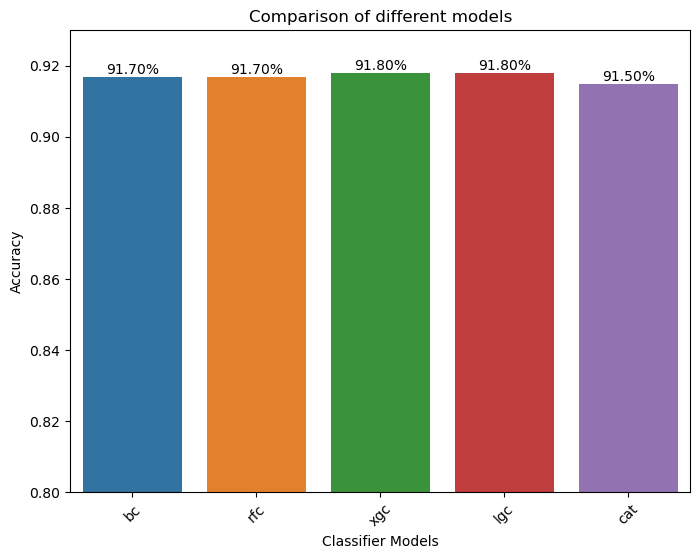

In [262]:
model_acc_bar_plot(model_acc_df_for_SelectKBest,.80,.93)

# Feature selection (RFE)

In [243]:
rfe=RFE(rfc,step=1).fit(X,y)
x_train_rfe=rfe.transform(X)


C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:283: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X[:, features], y, **fit_params)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:283: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X[:, features], y, **fit_params)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:283: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X[:, features], y, **fit_params)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:283: DataConversionWarning: A column-vector y was passed when a 1d ar

In [244]:
selected_rfe_features = pd.DataFrame({'Feature':list(X.columns),
                                      'Ranking':rfe.ranking_})
selected_rfe_features.sort_values(by='Ranking')

,Feature,Ranking
1,Glucose,1
3,SkinThickness,1
4,Insulin,1
7,Age,1
5,BMI,2
6,DiabetesPedigreeFunction,3
0,Pregnancies,4
2,BloodPressure,5


In [245]:
x_train_rfe.shape

(1000, 4)

In [246]:
rfe_col=list(rfe.get_feature_names_out())
rfe_col

['Glucose', 'SkinThickness', 'Insulin', 'Age']

In [247]:

model_acc_arr=[]

for key,model in selected_model_for_SelectKBest.items():
    model_acc_arr.append(cross_val_mean_acc(model,x_train_rfe,y))
    
model_acc_df_for_RFE=create_datafram(model_acc_arr,selected_model_for_SelectKBest)


C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 681
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 685
[LightG

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 685
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 681
[LightG

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 677
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threa

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 506
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 505
[LightGBM] [Info] Number of data points in the train set: 900, number of used feat

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, n

138:	learn: 0.2473868	total: 961ms	remaining: 5.95s
139:	learn: 0.2467727	total: 969ms	remaining: 5.95s
140:	learn: 0.2459546	total: 976ms	remaining: 5.94s
141:	learn: 0.2455156	total: 982ms	remaining: 5.93s
142:	learn: 0.2451881	total: 989ms	remaining: 5.93s
143:	learn: 0.2445736	total: 996ms	remaining: 5.92s
144:	learn: 0.2441081	total: 1s	remaining: 5.92s
145:	learn: 0.2436168	total: 1.01s	remaining: 5.91s
146:	learn: 0.2429751	total: 1.02s	remaining: 5.91s
147:	learn: 0.2422005	total: 1.02s	remaining: 5.9s
148:	learn: 0.2417333	total: 1.03s	remaining: 5.9s
149:	learn: 0.2410931	total: 1.04s	remaining: 5.9s
150:	learn: 0.2403960	total: 1.05s	remaining: 5.89s
151:	learn: 0.2398393	total: 1.05s	remaining: 5.88s
152:	learn: 0.2392949	total: 1.06s	remaining: 5.87s
153:	learn: 0.2389064	total: 1.07s	remaining: 5.87s
154:	learn: 0.2386205	total: 1.08s	remaining: 5.87s
155:	learn: 0.2380274	total: 1.08s	remaining: 5.87s
156:	learn: 0.2373096	total: 1.09s	remaining: 5.87s
157:	learn: 0.2369

305:	learn: 0.1871773	total: 2.14s	remaining: 4.85s
306:	learn: 0.1869884	total: 2.15s	remaining: 4.85s
307:	learn: 0.1868788	total: 2.15s	remaining: 4.84s
308:	learn: 0.1866923	total: 2.16s	remaining: 4.83s
309:	learn: 0.1865267	total: 2.17s	remaining: 4.82s
310:	learn: 0.1863027	total: 2.17s	remaining: 4.81s
311:	learn: 0.1860144	total: 2.18s	remaining: 4.8s
312:	learn: 0.1857405	total: 2.19s	remaining: 4.8s
313:	learn: 0.1856418	total: 2.19s	remaining: 4.79s
314:	learn: 0.1855037	total: 2.2s	remaining: 4.78s
315:	learn: 0.1852230	total: 2.21s	remaining: 4.77s
316:	learn: 0.1850866	total: 2.21s	remaining: 4.77s
317:	learn: 0.1849108	total: 2.22s	remaining: 4.76s
318:	learn: 0.1847176	total: 2.23s	remaining: 4.75s
319:	learn: 0.1845181	total: 2.23s	remaining: 4.75s
320:	learn: 0.1843036	total: 2.24s	remaining: 4.74s
321:	learn: 0.1841407	total: 2.25s	remaining: 4.73s
322:	learn: 0.1839009	total: 2.25s	remaining: 4.72s
323:	learn: 0.1835433	total: 2.26s	remaining: 4.72s
324:	learn: 0.1

476:	learn: 0.1569186	total: 3.32s	remaining: 3.64s
477:	learn: 0.1567773	total: 3.32s	remaining: 3.63s
478:	learn: 0.1567071	total: 3.33s	remaining: 3.63s
479:	learn: 0.1565848	total: 3.34s	remaining: 3.62s
480:	learn: 0.1564249	total: 3.35s	remaining: 3.61s
481:	learn: 0.1561615	total: 3.35s	remaining: 3.6s
482:	learn: 0.1560411	total: 3.36s	remaining: 3.6s
483:	learn: 0.1559572	total: 3.37s	remaining: 3.59s
484:	learn: 0.1557846	total: 3.37s	remaining: 3.58s
485:	learn: 0.1556523	total: 3.38s	remaining: 3.57s
486:	learn: 0.1555139	total: 3.38s	remaining: 3.57s
487:	learn: 0.1553833	total: 3.39s	remaining: 3.56s
488:	learn: 0.1552015	total: 3.4s	remaining: 3.55s
489:	learn: 0.1551019	total: 3.41s	remaining: 3.55s
490:	learn: 0.1549742	total: 3.42s	remaining: 3.54s
491:	learn: 0.1547586	total: 3.42s	remaining: 3.53s
492:	learn: 0.1545359	total: 3.43s	remaining: 3.53s
493:	learn: 0.1544254	total: 3.44s	remaining: 3.52s
494:	learn: 0.1543592	total: 3.44s	remaining: 3.51s
495:	learn: 0.1

645:	learn: 0.1347250	total: 4.47s	remaining: 2.45s
646:	learn: 0.1344930	total: 4.48s	remaining: 2.45s
647:	learn: 0.1343412	total: 4.49s	remaining: 2.44s
648:	learn: 0.1341831	total: 4.5s	remaining: 2.43s
649:	learn: 0.1340388	total: 4.5s	remaining: 2.42s
650:	learn: 0.1339203	total: 4.51s	remaining: 2.42s
651:	learn: 0.1337845	total: 4.52s	remaining: 2.41s
652:	learn: 0.1337067	total: 4.52s	remaining: 2.4s
653:	learn: 0.1336172	total: 4.53s	remaining: 2.4s
654:	learn: 0.1335130	total: 4.54s	remaining: 2.39s
655:	learn: 0.1334062	total: 4.54s	remaining: 2.38s
656:	learn: 0.1332824	total: 4.55s	remaining: 2.38s
657:	learn: 0.1331741	total: 4.56s	remaining: 2.37s
658:	learn: 0.1330763	total: 4.57s	remaining: 2.36s
659:	learn: 0.1328746	total: 4.57s	remaining: 2.35s
660:	learn: 0.1327544	total: 4.58s	remaining: 2.35s
661:	learn: 0.1326026	total: 4.59s	remaining: 2.34s
662:	learn: 0.1324978	total: 4.59s	remaining: 2.33s
663:	learn: 0.1323554	total: 4.6s	remaining: 2.33s
664:	learn: 0.132

815:	learn: 0.1163904	total: 5.65s	remaining: 1.27s
816:	learn: 0.1163463	total: 5.66s	remaining: 1.27s
817:	learn: 0.1162417	total: 5.67s	remaining: 1.26s
818:	learn: 0.1160478	total: 5.67s	remaining: 1.25s
819:	learn: 0.1159595	total: 5.68s	remaining: 1.25s
820:	learn: 0.1158658	total: 5.68s	remaining: 1.24s
821:	learn: 0.1158469	total: 5.69s	remaining: 1.23s
822:	learn: 0.1158265	total: 5.7s	remaining: 1.23s
823:	learn: 0.1158139	total: 5.71s	remaining: 1.22s
824:	learn: 0.1156608	total: 5.71s	remaining: 1.21s
825:	learn: 0.1155707	total: 5.72s	remaining: 1.21s
826:	learn: 0.1155593	total: 5.73s	remaining: 1.2s
827:	learn: 0.1155105	total: 5.73s	remaining: 1.19s
828:	learn: 0.1154146	total: 5.74s	remaining: 1.18s
829:	learn: 0.1152568	total: 5.75s	remaining: 1.18s
830:	learn: 0.1151173	total: 5.75s	remaining: 1.17s
831:	learn: 0.1150467	total: 5.76s	remaining: 1.16s
832:	learn: 0.1149828	total: 5.77s	remaining: 1.16s
833:	learn: 0.1149337	total: 5.77s	remaining: 1.15s
834:	learn: 0.

987:	learn: 0.1012891	total: 6.83s	remaining: 83ms
988:	learn: 0.1011768	total: 6.84s	remaining: 76.1ms
989:	learn: 0.1011512	total: 6.85s	remaining: 69.2ms
990:	learn: 0.1011250	total: 6.85s	remaining: 62.2ms
991:	learn: 0.1011119	total: 6.86s	remaining: 55.3ms
992:	learn: 0.1010408	total: 6.87s	remaining: 48.4ms
993:	learn: 0.1009433	total: 6.87s	remaining: 41.5ms
994:	learn: 0.1008111	total: 6.88s	remaining: 34.6ms
995:	learn: 0.1007309	total: 6.89s	remaining: 27.7ms
996:	learn: 0.1007003	total: 6.89s	remaining: 20.7ms
997:	learn: 0.1005301	total: 6.9s	remaining: 13.8ms
998:	learn: 0.1004693	total: 6.91s	remaining: 6.91ms
999:	learn: 0.1004063	total: 6.91s	remaining: 0us
Learning rate set to 0.009849
0:	learn: 0.6814426	total: 7.47ms	remaining: 7.47s
1:	learn: 0.6704080	total: 15.1ms	remaining: 7.55s
2:	learn: 0.6613883	total: 21.9ms	remaining: 7.26s
3:	learn: 0.6513645	total: 29.6ms	remaining: 7.36s
4:	learn: 0.6414679	total: 37.2ms	remaining: 7.41s
5:	learn: 0.6325472	total: 45.1m

157:	learn: 0.2357647	total: 1.14s	remaining: 6.08s
158:	learn: 0.2353811	total: 1.15s	remaining: 6.08s
159:	learn: 0.2349858	total: 1.16s	remaining: 6.07s
160:	learn: 0.2345171	total: 1.16s	remaining: 6.06s
161:	learn: 0.2339586	total: 1.2s	remaining: 6.19s
162:	learn: 0.2335603	total: 1.2s	remaining: 6.18s
163:	learn: 0.2330893	total: 1.21s	remaining: 6.16s
164:	learn: 0.2324985	total: 1.22s	remaining: 6.16s
165:	learn: 0.2320107	total: 1.22s	remaining: 6.14s
166:	learn: 0.2315307	total: 1.23s	remaining: 6.13s
167:	learn: 0.2312551	total: 1.23s	remaining: 6.11s
168:	learn: 0.2308424	total: 1.24s	remaining: 6.1s
169:	learn: 0.2302780	total: 1.25s	remaining: 6.09s
170:	learn: 0.2298648	total: 1.25s	remaining: 6.08s
171:	learn: 0.2294341	total: 1.26s	remaining: 6.07s
172:	learn: 0.2289521	total: 1.27s	remaining: 6.05s
173:	learn: 0.2284308	total: 1.27s	remaining: 6.04s
174:	learn: 0.2279450	total: 1.28s	remaining: 6.03s
175:	learn: 0.2275305	total: 1.28s	remaining: 6.02s
176:	learn: 0.2

329:	learn: 0.1847682	total: 2.31s	remaining: 4.69s
330:	learn: 0.1845404	total: 2.32s	remaining: 4.68s
331:	learn: 0.1843211	total: 2.32s	remaining: 4.67s
332:	learn: 0.1841353	total: 2.33s	remaining: 4.67s
333:	learn: 0.1839918	total: 2.33s	remaining: 4.66s
334:	learn: 0.1838243	total: 2.34s	remaining: 4.65s
335:	learn: 0.1836832	total: 2.35s	remaining: 4.64s
336:	learn: 0.1834920	total: 2.35s	remaining: 4.63s
337:	learn: 0.1833470	total: 2.36s	remaining: 4.62s
338:	learn: 0.1832885	total: 2.36s	remaining: 4.61s
339:	learn: 0.1831165	total: 2.37s	remaining: 4.6s
340:	learn: 0.1830042	total: 2.37s	remaining: 4.59s
341:	learn: 0.1828394	total: 2.38s	remaining: 4.58s
342:	learn: 0.1827240	total: 2.38s	remaining: 4.57s
343:	learn: 0.1826195	total: 2.39s	remaining: 4.56s
344:	learn: 0.1824852	total: 2.4s	remaining: 4.55s
345:	learn: 0.1822748	total: 2.4s	remaining: 4.54s
346:	learn: 0.1821007	total: 2.41s	remaining: 4.53s
347:	learn: 0.1819012	total: 2.41s	remaining: 4.52s
348:	learn: 0.1

513:	learn: 0.1551027	total: 3.48s	remaining: 3.29s
514:	learn: 0.1549574	total: 3.49s	remaining: 3.29s
515:	learn: 0.1547813	total: 3.5s	remaining: 3.28s
516:	learn: 0.1547271	total: 3.5s	remaining: 3.27s
517:	learn: 0.1545501	total: 3.51s	remaining: 3.27s
518:	learn: 0.1544695	total: 3.52s	remaining: 3.26s
519:	learn: 0.1543054	total: 3.52s	remaining: 3.25s
520:	learn: 0.1542606	total: 3.53s	remaining: 3.24s
521:	learn: 0.1540445	total: 3.54s	remaining: 3.24s
522:	learn: 0.1539726	total: 3.54s	remaining: 3.23s
523:	learn: 0.1537558	total: 3.55s	remaining: 3.22s
524:	learn: 0.1536691	total: 3.56s	remaining: 3.22s
525:	learn: 0.1535688	total: 3.56s	remaining: 3.21s
526:	learn: 0.1533833	total: 3.57s	remaining: 3.2s
527:	learn: 0.1532878	total: 3.57s	remaining: 3.19s
528:	learn: 0.1530973	total: 3.58s	remaining: 3.19s
529:	learn: 0.1529477	total: 3.59s	remaining: 3.18s
530:	learn: 0.1528283	total: 3.59s	remaining: 3.17s
531:	learn: 0.1527456	total: 3.6s	remaining: 3.17s
532:	learn: 0.15

675:	learn: 0.1342799	total: 4.5s	remaining: 2.15s
676:	learn: 0.1341941	total: 4.5s	remaining: 2.15s
677:	learn: 0.1340938	total: 4.51s	remaining: 2.14s
678:	learn: 0.1339615	total: 4.51s	remaining: 2.13s
679:	learn: 0.1338928	total: 4.52s	remaining: 2.13s
680:	learn: 0.1337584	total: 4.53s	remaining: 2.12s
681:	learn: 0.1336585	total: 4.53s	remaining: 2.11s
682:	learn: 0.1336111	total: 4.54s	remaining: 2.11s
683:	learn: 0.1334758	total: 4.54s	remaining: 2.1s
684:	learn: 0.1333407	total: 4.55s	remaining: 2.09s
685:	learn: 0.1333134	total: 4.56s	remaining: 2.08s
686:	learn: 0.1332871	total: 4.56s	remaining: 2.08s
687:	learn: 0.1332508	total: 4.57s	remaining: 2.07s
688:	learn: 0.1330209	total: 4.57s	remaining: 2.06s
689:	learn: 0.1329050	total: 4.58s	remaining: 2.06s
690:	learn: 0.1327755	total: 4.58s	remaining: 2.05s
691:	learn: 0.1326832	total: 4.59s	remaining: 2.04s
692:	learn: 0.1325647	total: 4.59s	remaining: 2.04s
693:	learn: 0.1325098	total: 4.6s	remaining: 2.03s
694:	learn: 0.13

854:	learn: 0.1173813	total: 5.65s	remaining: 959ms
855:	learn: 0.1172836	total: 5.66s	remaining: 952ms
856:	learn: 0.1172300	total: 5.67s	remaining: 946ms
857:	learn: 0.1172070	total: 5.67s	remaining: 939ms
858:	learn: 0.1171163	total: 5.68s	remaining: 933ms
859:	learn: 0.1169802	total: 5.69s	remaining: 926ms
860:	learn: 0.1169562	total: 5.7s	remaining: 920ms
861:	learn: 0.1169078	total: 5.71s	remaining: 914ms
862:	learn: 0.1167583	total: 5.71s	remaining: 907ms
863:	learn: 0.1165894	total: 5.72s	remaining: 900ms
864:	learn: 0.1164622	total: 5.73s	remaining: 894ms
865:	learn: 0.1164021	total: 5.74s	remaining: 888ms
866:	learn: 0.1162563	total: 5.75s	remaining: 882ms
867:	learn: 0.1160704	total: 5.75s	remaining: 875ms
868:	learn: 0.1159726	total: 5.76s	remaining: 868ms
869:	learn: 0.1159396	total: 5.76s	remaining: 862ms
870:	learn: 0.1157539	total: 5.77s	remaining: 855ms
871:	learn: 0.1157019	total: 5.78s	remaining: 848ms
872:	learn: 0.1156276	total: 5.78s	remaining: 841ms
873:	learn: 0

26:	learn: 0.4734656	total: 194ms	remaining: 7.01s
27:	learn: 0.4678196	total: 202ms	remaining: 7s
28:	learn: 0.4619524	total: 209ms	remaining: 7.01s
29:	learn: 0.4566975	total: 216ms	remaining: 6.99s
30:	learn: 0.4504989	total: 224ms	remaining: 6.99s
31:	learn: 0.4458164	total: 231ms	remaining: 6.99s
32:	learn: 0.4409965	total: 238ms	remaining: 6.98s
33:	learn: 0.4362042	total: 246ms	remaining: 6.99s
34:	learn: 0.4314366	total: 253ms	remaining: 6.99s
35:	learn: 0.4274733	total: 260ms	remaining: 6.95s
36:	learn: 0.4227339	total: 267ms	remaining: 6.94s
37:	learn: 0.4185227	total: 274ms	remaining: 6.95s
38:	learn: 0.4152218	total: 283ms	remaining: 6.97s
39:	learn: 0.4102080	total: 290ms	remaining: 6.97s
40:	learn: 0.4060108	total: 297ms	remaining: 6.96s
41:	learn: 0.4020003	total: 305ms	remaining: 6.96s
42:	learn: 0.3978444	total: 312ms	remaining: 6.95s
43:	learn: 0.3943885	total: 319ms	remaining: 6.93s
44:	learn: 0.3901311	total: 326ms	remaining: 6.92s
45:	learn: 0.3872825	total: 333ms	

194:	learn: 0.2160655	total: 1.39s	remaining: 5.75s
195:	learn: 0.2156513	total: 1.4s	remaining: 5.74s
196:	learn: 0.2153648	total: 1.41s	remaining: 5.73s
197:	learn: 0.2151542	total: 1.41s	remaining: 5.72s
198:	learn: 0.2147186	total: 1.42s	remaining: 5.71s
199:	learn: 0.2142438	total: 1.42s	remaining: 5.7s
200:	learn: 0.2139052	total: 1.43s	remaining: 5.69s
201:	learn: 0.2134597	total: 1.44s	remaining: 5.68s
202:	learn: 0.2131332	total: 1.44s	remaining: 5.67s
203:	learn: 0.2128729	total: 1.45s	remaining: 5.66s
204:	learn: 0.2125283	total: 1.46s	remaining: 5.65s
205:	learn: 0.2121463	total: 1.46s	remaining: 5.64s
206:	learn: 0.2116339	total: 1.47s	remaining: 5.63s
207:	learn: 0.2114146	total: 1.48s	remaining: 5.62s
208:	learn: 0.2111004	total: 1.48s	remaining: 5.61s
209:	learn: 0.2107471	total: 1.49s	remaining: 5.6s
210:	learn: 0.2104283	total: 1.5s	remaining: 5.59s
211:	learn: 0.2101837	total: 1.5s	remaining: 5.59s
212:	learn: 0.2097273	total: 1.51s	remaining: 5.58s
213:	learn: 0.209

372:	learn: 0.1709572	total: 2.57s	remaining: 4.32s
373:	learn: 0.1707333	total: 2.58s	remaining: 4.31s
374:	learn: 0.1705830	total: 2.58s	remaining: 4.3s
375:	learn: 0.1704371	total: 2.59s	remaining: 4.29s
376:	learn: 0.1703339	total: 2.59s	remaining: 4.29s
377:	learn: 0.1700547	total: 2.6s	remaining: 4.28s
378:	learn: 0.1699022	total: 2.61s	remaining: 4.27s
379:	learn: 0.1697675	total: 2.61s	remaining: 4.26s
380:	learn: 0.1695802	total: 2.62s	remaining: 4.26s
381:	learn: 0.1693636	total: 2.63s	remaining: 4.25s
382:	learn: 0.1692013	total: 2.64s	remaining: 4.25s
383:	learn: 0.1688964	total: 2.64s	remaining: 4.24s
384:	learn: 0.1687345	total: 2.65s	remaining: 4.24s
385:	learn: 0.1686240	total: 2.66s	remaining: 4.23s
386:	learn: 0.1684969	total: 2.67s	remaining: 4.22s
387:	learn: 0.1683070	total: 2.67s	remaining: 4.22s
388:	learn: 0.1682030	total: 2.68s	remaining: 4.21s
389:	learn: 0.1680463	total: 2.69s	remaining: 4.2s
390:	learn: 0.1678915	total: 2.69s	remaining: 4.2s
391:	learn: 0.16

539:	learn: 0.1450739	total: 3.76s	remaining: 3.21s
540:	learn: 0.1449059	total: 3.77s	remaining: 3.2s
541:	learn: 0.1447134	total: 3.78s	remaining: 3.19s
542:	learn: 0.1445579	total: 3.78s	remaining: 3.18s
543:	learn: 0.1443128	total: 3.79s	remaining: 3.18s
544:	learn: 0.1441728	total: 3.8s	remaining: 3.17s
545:	learn: 0.1440106	total: 3.8s	remaining: 3.16s
546:	learn: 0.1438301	total: 3.81s	remaining: 3.15s
547:	learn: 0.1436749	total: 3.82s	remaining: 3.15s
548:	learn: 0.1434730	total: 3.82s	remaining: 3.14s
549:	learn: 0.1433419	total: 3.83s	remaining: 3.13s
550:	learn: 0.1431845	total: 3.84s	remaining: 3.13s
551:	learn: 0.1430035	total: 3.84s	remaining: 3.12s
552:	learn: 0.1428683	total: 3.85s	remaining: 3.11s
553:	learn: 0.1427646	total: 3.86s	remaining: 3.11s
554:	learn: 0.1426989	total: 3.87s	remaining: 3.1s
555:	learn: 0.1426043	total: 3.87s	remaining: 3.09s
556:	learn: 0.1425028	total: 3.88s	remaining: 3.08s
557:	learn: 0.1424196	total: 3.88s	remaining: 3.08s
558:	learn: 0.14

710:	learn: 0.1233161	total: 4.93s	remaining: 2s
711:	learn: 0.1232316	total: 4.94s	remaining: 2s
712:	learn: 0.1231742	total: 4.95s	remaining: 1.99s
713:	learn: 0.1230011	total: 4.96s	remaining: 1.99s
714:	learn: 0.1229649	total: 4.96s	remaining: 1.98s
715:	learn: 0.1228687	total: 4.97s	remaining: 1.97s
716:	learn: 0.1227919	total: 4.98s	remaining: 1.97s
717:	learn: 0.1226947	total: 4.99s	remaining: 1.96s
718:	learn: 0.1226116	total: 4.99s	remaining: 1.95s
719:	learn: 0.1222944	total: 5s	remaining: 1.94s
720:	learn: 0.1222155	total: 5s	remaining: 1.94s
721:	learn: 0.1221356	total: 5.01s	remaining: 1.93s
722:	learn: 0.1220196	total: 5.02s	remaining: 1.92s
723:	learn: 0.1219937	total: 5.02s	remaining: 1.91s
724:	learn: 0.1218753	total: 5.03s	remaining: 1.91s
725:	learn: 0.1217828	total: 5.03s	remaining: 1.9s
726:	learn: 0.1217595	total: 5.04s	remaining: 1.89s
727:	learn: 0.1216914	total: 5.04s	remaining: 1.88s
728:	learn: 0.1215950	total: 5.05s	remaining: 1.88s
729:	learn: 0.1215338	tot

869:	learn: 0.1067005	total: 5.94s	remaining: 888ms
870:	learn: 0.1066289	total: 5.95s	remaining: 881ms
871:	learn: 0.1065628	total: 5.95s	remaining: 874ms
872:	learn: 0.1065526	total: 5.96s	remaining: 867ms
873:	learn: 0.1064205	total: 5.97s	remaining: 860ms
874:	learn: 0.1063579	total: 5.97s	remaining: 853ms
875:	learn: 0.1063344	total: 5.98s	remaining: 846ms
876:	learn: 0.1062648	total: 5.98s	remaining: 839ms
877:	learn: 0.1061743	total: 5.99s	remaining: 832ms
878:	learn: 0.1060727	total: 5.99s	remaining: 825ms
879:	learn: 0.1059965	total: 6s	remaining: 818ms
880:	learn: 0.1057589	total: 6.01s	remaining: 811ms
881:	learn: 0.1056694	total: 6.01s	remaining: 805ms
882:	learn: 0.1055488	total: 6.02s	remaining: 798ms
883:	learn: 0.1054258	total: 6.03s	remaining: 791ms
884:	learn: 0.1053069	total: 6.04s	remaining: 785ms
885:	learn: 0.1051962	total: 6.04s	remaining: 778ms
886:	learn: 0.1051035	total: 6.05s	remaining: 771ms
887:	learn: 0.1050050	total: 6.06s	remaining: 764ms
888:	learn: 0.1

32:	learn: 0.4428233	total: 211ms	remaining: 6.19s
33:	learn: 0.4388575	total: 218ms	remaining: 6.19s
34:	learn: 0.4347052	total: 224ms	remaining: 6.17s
35:	learn: 0.4301609	total: 230ms	remaining: 6.15s
36:	learn: 0.4252212	total: 236ms	remaining: 6.14s
37:	learn: 0.4205897	total: 243ms	remaining: 6.15s
38:	learn: 0.4162300	total: 250ms	remaining: 6.16s
39:	learn: 0.4121075	total: 258ms	remaining: 6.18s
40:	learn: 0.4078358	total: 265ms	remaining: 6.19s
41:	learn: 0.4036661	total: 271ms	remaining: 6.17s
42:	learn: 0.3996523	total: 277ms	remaining: 6.17s
43:	learn: 0.3960072	total: 283ms	remaining: 6.15s
44:	learn: 0.3924031	total: 290ms	remaining: 6.16s
45:	learn: 0.3889015	total: 297ms	remaining: 6.16s
46:	learn: 0.3855551	total: 303ms	remaining: 6.14s
47:	learn: 0.3821994	total: 308ms	remaining: 6.11s
48:	learn: 0.3784360	total: 315ms	remaining: 6.11s
49:	learn: 0.3752105	total: 321ms	remaining: 6.09s
50:	learn: 0.3717443	total: 328ms	remaining: 6.1s
51:	learn: 0.3680704	total: 335m

197:	learn: 0.2111393	total: 1.38s	remaining: 5.57s
198:	learn: 0.2109048	total: 1.38s	remaining: 5.56s
199:	learn: 0.2106302	total: 1.39s	remaining: 5.56s
200:	learn: 0.2102343	total: 1.4s	remaining: 5.55s
201:	learn: 0.2099333	total: 1.4s	remaining: 5.54s
202:	learn: 0.2095054	total: 1.41s	remaining: 5.53s
203:	learn: 0.2092750	total: 1.42s	remaining: 5.53s
204:	learn: 0.2089760	total: 1.42s	remaining: 5.52s
205:	learn: 0.2086786	total: 1.43s	remaining: 5.51s
206:	learn: 0.2082326	total: 1.44s	remaining: 5.51s
207:	learn: 0.2076601	total: 1.44s	remaining: 5.5s
208:	learn: 0.2072307	total: 1.45s	remaining: 5.5s
209:	learn: 0.2069204	total: 1.46s	remaining: 5.48s
210:	learn: 0.2067071	total: 1.47s	remaining: 5.48s
211:	learn: 0.2064347	total: 1.47s	remaining: 5.47s
212:	learn: 0.2061422	total: 1.48s	remaining: 5.46s
213:	learn: 0.2057332	total: 1.48s	remaining: 5.45s
214:	learn: 0.2054463	total: 1.49s	remaining: 5.44s
215:	learn: 0.2051481	total: 1.5s	remaining: 5.44s
216:	learn: 0.204

367:	learn: 0.1708328	total: 2.53s	remaining: 4.35s
368:	learn: 0.1707475	total: 2.54s	remaining: 4.34s
369:	learn: 0.1706887	total: 2.55s	remaining: 4.34s
370:	learn: 0.1705394	total: 2.55s	remaining: 4.32s
371:	learn: 0.1702570	total: 2.56s	remaining: 4.32s
372:	learn: 0.1700744	total: 2.56s	remaining: 4.31s
373:	learn: 0.1699593	total: 2.57s	remaining: 4.3s
374:	learn: 0.1698525	total: 2.57s	remaining: 4.29s
375:	learn: 0.1697484	total: 2.58s	remaining: 4.28s
376:	learn: 0.1695561	total: 2.59s	remaining: 4.28s
377:	learn: 0.1693728	total: 2.6s	remaining: 4.27s
378:	learn: 0.1691762	total: 2.6s	remaining: 4.26s
379:	learn: 0.1690998	total: 2.61s	remaining: 4.26s
380:	learn: 0.1688694	total: 2.62s	remaining: 4.25s
381:	learn: 0.1687550	total: 2.62s	remaining: 4.24s
382:	learn: 0.1686497	total: 2.63s	remaining: 4.24s
383:	learn: 0.1684674	total: 2.63s	remaining: 4.23s
384:	learn: 0.1682781	total: 2.64s	remaining: 4.22s
385:	learn: 0.1681574	total: 2.65s	remaining: 4.21s
386:	learn: 0.1

541:	learn: 0.1463719	total: 3.69s	remaining: 3.11s
542:	learn: 0.1462782	total: 3.69s	remaining: 3.11s
543:	learn: 0.1461612	total: 3.7s	remaining: 3.1s
544:	learn: 0.1459154	total: 3.71s	remaining: 3.1s
545:	learn: 0.1457832	total: 3.71s	remaining: 3.09s
546:	learn: 0.1456672	total: 3.72s	remaining: 3.08s
547:	learn: 0.1455243	total: 3.73s	remaining: 3.07s
548:	learn: 0.1453390	total: 3.73s	remaining: 3.07s
549:	learn: 0.1450976	total: 3.74s	remaining: 3.06s
550:	learn: 0.1449553	total: 3.75s	remaining: 3.05s
551:	learn: 0.1448615	total: 3.75s	remaining: 3.05s
552:	learn: 0.1447589	total: 3.76s	remaining: 3.04s
553:	learn: 0.1446537	total: 3.77s	remaining: 3.03s
554:	learn: 0.1445428	total: 3.77s	remaining: 3.02s
555:	learn: 0.1443758	total: 3.78s	remaining: 3.02s
556:	learn: 0.1442312	total: 3.79s	remaining: 3.01s
557:	learn: 0.1441646	total: 3.79s	remaining: 3s
558:	learn: 0.1440710	total: 3.8s	remaining: 3s
559:	learn: 0.1440221	total: 3.81s	remaining: 2.99s
560:	learn: 0.1439460	

706:	learn: 0.1273088	total: 4.84s	remaining: 2s
707:	learn: 0.1271352	total: 4.84s	remaining: 2s
708:	learn: 0.1269952	total: 4.85s	remaining: 1.99s
709:	learn: 0.1269525	total: 4.85s	remaining: 1.98s
710:	learn: 0.1268420	total: 4.86s	remaining: 1.97s
711:	learn: 0.1267231	total: 4.86s	remaining: 1.97s
712:	learn: 0.1266232	total: 4.87s	remaining: 1.96s
713:	learn: 0.1264736	total: 4.88s	remaining: 1.95s
714:	learn: 0.1263354	total: 4.88s	remaining: 1.95s
715:	learn: 0.1262530	total: 4.89s	remaining: 1.94s
716:	learn: 0.1261884	total: 4.89s	remaining: 1.93s
717:	learn: 0.1260850	total: 4.9s	remaining: 1.93s
718:	learn: 0.1259936	total: 4.91s	remaining: 1.92s
719:	learn: 0.1258937	total: 4.92s	remaining: 1.91s
720:	learn: 0.1257584	total: 4.92s	remaining: 1.9s
721:	learn: 0.1256446	total: 4.93s	remaining: 1.9s
722:	learn: 0.1255125	total: 4.93s	remaining: 1.89s
723:	learn: 0.1254195	total: 4.94s	remaining: 1.88s
724:	learn: 0.1252442	total: 4.95s	remaining: 1.88s
725:	learn: 0.1252138

874:	learn: 0.1119936	total: 6.02s	remaining: 860ms
875:	learn: 0.1118484	total: 6.03s	remaining: 853ms
876:	learn: 0.1117546	total: 6.04s	remaining: 847ms
877:	learn: 0.1115809	total: 6.04s	remaining: 840ms
878:	learn: 0.1114671	total: 6.05s	remaining: 833ms
879:	learn: 0.1113779	total: 6.06s	remaining: 826ms
880:	learn: 0.1112807	total: 6.06s	remaining: 819ms
881:	learn: 0.1110508	total: 6.07s	remaining: 812ms
882:	learn: 0.1110191	total: 6.08s	remaining: 805ms
883:	learn: 0.1109438	total: 6.09s	remaining: 799ms
884:	learn: 0.1107680	total: 6.1s	remaining: 792ms
885:	learn: 0.1107259	total: 6.1s	remaining: 785ms
886:	learn: 0.1106479	total: 6.11s	remaining: 778ms
887:	learn: 0.1104966	total: 6.11s	remaining: 771ms
888:	learn: 0.1103111	total: 6.12s	remaining: 764ms
889:	learn: 0.1101857	total: 6.12s	remaining: 757ms
890:	learn: 0.1101532	total: 6.13s	remaining: 750ms
891:	learn: 0.1100493	total: 6.13s	remaining: 743ms
892:	learn: 0.1098720	total: 6.14s	remaining: 736ms
893:	learn: 0.

54:	learn: 0.3717435	total: 397ms	remaining: 6.83s
55:	learn: 0.3684480	total: 405ms	remaining: 6.83s
56:	learn: 0.3652011	total: 413ms	remaining: 6.83s
57:	learn: 0.3625021	total: 419ms	remaining: 6.81s
58:	learn: 0.3600182	total: 425ms	remaining: 6.78s
59:	learn: 0.3569061	total: 432ms	remaining: 6.76s
60:	learn: 0.3543606	total: 438ms	remaining: 6.74s
61:	learn: 0.3522335	total: 444ms	remaining: 6.72s
62:	learn: 0.3502587	total: 450ms	remaining: 6.7s
63:	learn: 0.3474791	total: 456ms	remaining: 6.67s
64:	learn: 0.3447583	total: 462ms	remaining: 6.65s
65:	learn: 0.3430221	total: 468ms	remaining: 6.63s
66:	learn: 0.3404805	total: 474ms	remaining: 6.59s
67:	learn: 0.3386052	total: 482ms	remaining: 6.6s
68:	learn: 0.3362356	total: 489ms	remaining: 6.59s
69:	learn: 0.3342123	total: 495ms	remaining: 6.57s
70:	learn: 0.3317600	total: 502ms	remaining: 6.57s
71:	learn: 0.3296098	total: 510ms	remaining: 6.57s
72:	learn: 0.3280441	total: 516ms	remaining: 6.55s
73:	learn: 0.3257612	total: 523ms

228:	learn: 0.2124900	total: 1.58s	remaining: 5.32s
229:	learn: 0.2122113	total: 1.59s	remaining: 5.31s
230:	learn: 0.2118821	total: 1.59s	remaining: 5.3s
231:	learn: 0.2117621	total: 1.6s	remaining: 5.29s
232:	learn: 0.2114877	total: 1.61s	remaining: 5.29s
233:	learn: 0.2110528	total: 1.61s	remaining: 5.28s
234:	learn: 0.2108515	total: 1.62s	remaining: 5.28s
235:	learn: 0.2106615	total: 1.63s	remaining: 5.26s
236:	learn: 0.2102706	total: 1.63s	remaining: 5.26s
237:	learn: 0.2100019	total: 1.64s	remaining: 5.25s
238:	learn: 0.2097800	total: 1.65s	remaining: 5.24s
239:	learn: 0.2094996	total: 1.65s	remaining: 5.23s
240:	learn: 0.2090954	total: 1.66s	remaining: 5.22s
241:	learn: 0.2089189	total: 1.66s	remaining: 5.21s
242:	learn: 0.2086335	total: 1.67s	remaining: 5.2s
243:	learn: 0.2083175	total: 1.68s	remaining: 5.2s
244:	learn: 0.2081404	total: 1.68s	remaining: 5.19s
245:	learn: 0.2078171	total: 1.69s	remaining: 5.17s
246:	learn: 0.2075637	total: 1.69s	remaining: 5.17s
247:	learn: 0.20

397:	learn: 0.1754183	total: 2.73s	remaining: 4.13s
398:	learn: 0.1752682	total: 2.74s	remaining: 4.13s
399:	learn: 0.1751293	total: 2.75s	remaining: 4.12s
400:	learn: 0.1750101	total: 2.75s	remaining: 4.12s
401:	learn: 0.1748813	total: 2.76s	remaining: 4.11s
402:	learn: 0.1746339	total: 2.77s	remaining: 4.1s
403:	learn: 0.1743727	total: 2.77s	remaining: 4.09s
404:	learn: 0.1741609	total: 2.78s	remaining: 4.09s
405:	learn: 0.1740074	total: 2.79s	remaining: 4.08s
406:	learn: 0.1738203	total: 2.79s	remaining: 4.07s
407:	learn: 0.1737139	total: 2.8s	remaining: 4.07s
408:	learn: 0.1735100	total: 2.81s	remaining: 4.06s
409:	learn: 0.1734136	total: 2.81s	remaining: 4.05s
410:	learn: 0.1732657	total: 2.82s	remaining: 4.04s
411:	learn: 0.1730536	total: 2.83s	remaining: 4.04s
412:	learn: 0.1729609	total: 2.84s	remaining: 4.03s
413:	learn: 0.1728074	total: 2.84s	remaining: 4.02s
414:	learn: 0.1727001	total: 2.85s	remaining: 4.02s
415:	learn: 0.1725203	total: 2.86s	remaining: 4.01s
416:	learn: 0.

561:	learn: 0.1510778	total: 3.88s	remaining: 3.02s
562:	learn: 0.1510292	total: 3.89s	remaining: 3.02s
563:	learn: 0.1509054	total: 3.9s	remaining: 3.01s
564:	learn: 0.1507466	total: 3.9s	remaining: 3s
565:	learn: 0.1505918	total: 3.91s	remaining: 3s
566:	learn: 0.1503500	total: 3.92s	remaining: 2.99s
567:	learn: 0.1501790	total: 3.92s	remaining: 2.98s
568:	learn: 0.1500798	total: 3.93s	remaining: 2.98s
569:	learn: 0.1499994	total: 3.94s	remaining: 2.97s
570:	learn: 0.1499013	total: 3.95s	remaining: 2.96s
571:	learn: 0.1498196	total: 3.95s	remaining: 2.96s
572:	learn: 0.1497430	total: 3.96s	remaining: 2.95s
573:	learn: 0.1496637	total: 3.97s	remaining: 2.94s
574:	learn: 0.1496054	total: 3.98s	remaining: 2.94s
575:	learn: 0.1495155	total: 3.98s	remaining: 2.93s
576:	learn: 0.1493377	total: 3.99s	remaining: 2.92s
577:	learn: 0.1492058	total: 3.99s	remaining: 2.92s
578:	learn: 0.1490970	total: 4s	remaining: 2.91s
579:	learn: 0.1489832	total: 4.01s	remaining: 2.9s
580:	learn: 0.1488366	to

730:	learn: 0.1312592	total: 5.07s	remaining: 1.86s
731:	learn: 0.1311989	total: 5.08s	remaining: 1.86s
732:	learn: 0.1311559	total: 5.08s	remaining: 1.85s
733:	learn: 0.1311413	total: 5.09s	remaining: 1.84s
734:	learn: 0.1310579	total: 5.1s	remaining: 1.84s
735:	learn: 0.1309953	total: 5.11s	remaining: 1.83s
736:	learn: 0.1308334	total: 5.11s	remaining: 1.82s
737:	learn: 0.1307779	total: 5.12s	remaining: 1.82s
738:	learn: 0.1307511	total: 5.13s	remaining: 1.81s
739:	learn: 0.1306834	total: 5.13s	remaining: 1.8s
740:	learn: 0.1305401	total: 5.14s	remaining: 1.8s
741:	learn: 0.1303508	total: 5.15s	remaining: 1.79s
742:	learn: 0.1303248	total: 5.15s	remaining: 1.78s
743:	learn: 0.1302352	total: 5.16s	remaining: 1.77s
744:	learn: 0.1301687	total: 5.17s	remaining: 1.77s
745:	learn: 0.1301466	total: 5.17s	remaining: 1.76s
746:	learn: 0.1300706	total: 5.18s	remaining: 1.75s
747:	learn: 0.1300151	total: 5.19s	remaining: 1.75s
748:	learn: 0.1299922	total: 5.2s	remaining: 1.74s
749:	learn: 0.12

904:	learn: 0.1150603	total: 6.25s	remaining: 656ms
905:	learn: 0.1149308	total: 6.26s	remaining: 649ms
906:	learn: 0.1149047	total: 6.26s	remaining: 642ms
907:	learn: 0.1148779	total: 6.27s	remaining: 635ms
908:	learn: 0.1147458	total: 6.28s	remaining: 629ms
909:	learn: 0.1146753	total: 6.29s	remaining: 622ms
910:	learn: 0.1145503	total: 6.29s	remaining: 615ms
911:	learn: 0.1144021	total: 6.3s	remaining: 608ms
912:	learn: 0.1142525	total: 6.31s	remaining: 601ms
913:	learn: 0.1142028	total: 6.31s	remaining: 594ms
914:	learn: 0.1141361	total: 6.32s	remaining: 587ms
915:	learn: 0.1139804	total: 6.33s	remaining: 580ms
916:	learn: 0.1138398	total: 6.33s	remaining: 573ms
917:	learn: 0.1137141	total: 6.34s	remaining: 567ms
918:	learn: 0.1136520	total: 6.35s	remaining: 560ms
919:	learn: 0.1135788	total: 6.36s	remaining: 553ms
920:	learn: 0.1134482	total: 6.36s	remaining: 546ms
921:	learn: 0.1132027	total: 6.37s	remaining: 539ms
922:	learn: 0.1131174	total: 6.37s	remaining: 532ms
923:	learn: 0

63:	learn: 0.3464999	total: 448ms	remaining: 6.55s
64:	learn: 0.3437982	total: 456ms	remaining: 6.56s
65:	learn: 0.3420514	total: 463ms	remaining: 6.55s
66:	learn: 0.3392248	total: 470ms	remaining: 6.54s
67:	learn: 0.3366458	total: 477ms	remaining: 6.53s
68:	learn: 0.3347377	total: 483ms	remaining: 6.52s
69:	learn: 0.3324153	total: 490ms	remaining: 6.51s
70:	learn: 0.3301037	total: 497ms	remaining: 6.5s
71:	learn: 0.3277907	total: 501ms	remaining: 6.46s
72:	learn: 0.3259162	total: 508ms	remaining: 6.45s
73:	learn: 0.3237306	total: 514ms	remaining: 6.43s
74:	learn: 0.3214449	total: 519ms	remaining: 6.4s
75:	learn: 0.3200101	total: 526ms	remaining: 6.4s
76:	learn: 0.3185754	total: 533ms	remaining: 6.39s
77:	learn: 0.3166182	total: 541ms	remaining: 6.39s
78:	learn: 0.3147302	total: 548ms	remaining: 6.38s
79:	learn: 0.3133044	total: 555ms	remaining: 6.38s
80:	learn: 0.3116729	total: 562ms	remaining: 6.38s
81:	learn: 0.3100139	total: 568ms	remaining: 6.36s
82:	learn: 0.3084520	total: 576ms	

242:	learn: 0.2090779	total: 1.62s	remaining: 5.04s
243:	learn: 0.2085006	total: 1.63s	remaining: 5.04s
244:	learn: 0.2082411	total: 1.63s	remaining: 5.04s
245:	learn: 0.2079633	total: 1.64s	remaining: 5.03s
246:	learn: 0.2078117	total: 1.65s	remaining: 5.02s
247:	learn: 0.2074341	total: 1.66s	remaining: 5.02s
248:	learn: 0.2071431	total: 1.66s	remaining: 5.02s
249:	learn: 0.2069246	total: 1.67s	remaining: 5.01s
250:	learn: 0.2067891	total: 1.68s	remaining: 5.01s
251:	learn: 0.2066590	total: 1.68s	remaining: 5s
252:	learn: 0.2063966	total: 1.69s	remaining: 4.99s
253:	learn: 0.2059423	total: 1.7s	remaining: 4.98s
254:	learn: 0.2056769	total: 1.7s	remaining: 4.97s
255:	learn: 0.2054713	total: 1.71s	remaining: 4.96s
256:	learn: 0.2051543	total: 1.71s	remaining: 4.95s
257:	learn: 0.2048431	total: 1.72s	remaining: 4.94s
258:	learn: 0.2045769	total: 1.72s	remaining: 4.93s
259:	learn: 0.2044235	total: 1.73s	remaining: 4.93s
260:	learn: 0.2042074	total: 1.74s	remaining: 4.92s
261:	learn: 0.203

407:	learn: 0.1741183	total: 2.78s	remaining: 4.03s
408:	learn: 0.1739926	total: 2.79s	remaining: 4.03s
409:	learn: 0.1738286	total: 2.79s	remaining: 4.02s
410:	learn: 0.1736937	total: 2.8s	remaining: 4.02s
411:	learn: 0.1733691	total: 2.81s	remaining: 4.01s
412:	learn: 0.1732573	total: 2.82s	remaining: 4s
413:	learn: 0.1730813	total: 2.83s	remaining: 4s
414:	learn: 0.1728089	total: 2.83s	remaining: 4s
415:	learn: 0.1726227	total: 2.84s	remaining: 3.99s
416:	learn: 0.1723028	total: 2.85s	remaining: 3.98s
417:	learn: 0.1719886	total: 2.86s	remaining: 3.98s
418:	learn: 0.1719098	total: 2.86s	remaining: 3.97s
419:	learn: 0.1717858	total: 2.87s	remaining: 3.96s
420:	learn: 0.1715862	total: 2.88s	remaining: 3.96s
421:	learn: 0.1714046	total: 2.88s	remaining: 3.95s
422:	learn: 0.1712289	total: 2.89s	remaining: 3.95s
423:	learn: 0.1711299	total: 2.9s	remaining: 3.94s
424:	learn: 0.1710030	total: 2.91s	remaining: 3.93s
425:	learn: 0.1708963	total: 2.91s	remaining: 3.93s
426:	learn: 0.1706985	t

584:	learn: 0.1479374	total: 3.97s	remaining: 2.82s
585:	learn: 0.1478261	total: 3.98s	remaining: 2.81s
586:	learn: 0.1476530	total: 3.99s	remaining: 2.81s
587:	learn: 0.1475723	total: 3.99s	remaining: 2.8s
588:	learn: 0.1473977	total: 4s	remaining: 2.79s
589:	learn: 0.1473335	total: 4.01s	remaining: 2.79s
590:	learn: 0.1471815	total: 4.01s	remaining: 2.78s
591:	learn: 0.1471498	total: 4.02s	remaining: 2.77s
592:	learn: 0.1470665	total: 4.03s	remaining: 2.76s
593:	learn: 0.1469726	total: 4.03s	remaining: 2.76s
594:	learn: 0.1468808	total: 4.04s	remaining: 2.75s
595:	learn: 0.1467388	total: 4.05s	remaining: 2.74s
596:	learn: 0.1466286	total: 4.05s	remaining: 2.74s
597:	learn: 0.1465640	total: 4.06s	remaining: 2.73s
598:	learn: 0.1464796	total: 4.07s	remaining: 2.72s
599:	learn: 0.1463488	total: 4.07s	remaining: 2.72s
600:	learn: 0.1461663	total: 4.08s	remaining: 2.71s
601:	learn: 0.1460511	total: 4.09s	remaining: 2.7s
602:	learn: 0.1459435	total: 4.09s	remaining: 2.69s
603:	learn: 0.145

753:	learn: 0.1299782	total: 5.14s	remaining: 1.68s
754:	learn: 0.1298301	total: 5.15s	remaining: 1.67s
755:	learn: 0.1298071	total: 5.16s	remaining: 1.66s
756:	learn: 0.1296580	total: 5.16s	remaining: 1.66s
757:	learn: 0.1295830	total: 5.17s	remaining: 1.65s
758:	learn: 0.1294864	total: 5.17s	remaining: 1.64s
759:	learn: 0.1294255	total: 5.18s	remaining: 1.64s
760:	learn: 0.1293487	total: 5.19s	remaining: 1.63s
761:	learn: 0.1293168	total: 5.19s	remaining: 1.62s
762:	learn: 0.1292773	total: 5.2s	remaining: 1.61s
763:	learn: 0.1291869	total: 5.21s	remaining: 1.61s
764:	learn: 0.1290812	total: 5.22s	remaining: 1.6s
765:	learn: 0.1289787	total: 5.22s	remaining: 1.59s
766:	learn: 0.1287841	total: 5.23s	remaining: 1.59s
767:	learn: 0.1287220	total: 5.24s	remaining: 1.58s
768:	learn: 0.1285615	total: 5.25s	remaining: 1.57s
769:	learn: 0.1284868	total: 5.25s	remaining: 1.57s
770:	learn: 0.1284602	total: 5.26s	remaining: 1.56s
771:	learn: 0.1284032	total: 5.26s	remaining: 1.55s
772:	learn: 0.

926:	learn: 0.1140613	total: 6.33s	remaining: 499ms
927:	learn: 0.1140488	total: 6.34s	remaining: 492ms
928:	learn: 0.1139023	total: 6.34s	remaining: 485ms
929:	learn: 0.1138715	total: 6.35s	remaining: 478ms
930:	learn: 0.1138611	total: 6.36s	remaining: 471ms
931:	learn: 0.1138486	total: 6.36s	remaining: 464ms
932:	learn: 0.1137784	total: 6.37s	remaining: 457ms
933:	learn: 0.1136498	total: 6.38s	remaining: 450ms
934:	learn: 0.1135867	total: 6.38s	remaining: 444ms
935:	learn: 0.1134208	total: 6.39s	remaining: 437ms
936:	learn: 0.1132774	total: 6.39s	remaining: 430ms
937:	learn: 0.1132166	total: 6.4s	remaining: 423ms
938:	learn: 0.1131967	total: 6.41s	remaining: 416ms
939:	learn: 0.1130200	total: 6.41s	remaining: 409ms
940:	learn: 0.1129202	total: 6.42s	remaining: 403ms
941:	learn: 0.1127612	total: 6.43s	remaining: 396ms
942:	learn: 0.1127521	total: 6.43s	remaining: 389ms
943:	learn: 0.1126155	total: 6.44s	remaining: 382ms
944:	learn: 0.1125509	total: 6.45s	remaining: 375ms
945:	learn: 0

87:	learn: 0.3041139	total: 612ms	remaining: 6.34s
88:	learn: 0.3026304	total: 618ms	remaining: 6.33s
89:	learn: 0.3010864	total: 625ms	remaining: 6.32s
90:	learn: 0.2995230	total: 632ms	remaining: 6.31s
91:	learn: 0.2980659	total: 639ms	remaining: 6.3s
92:	learn: 0.2966307	total: 645ms	remaining: 6.29s
93:	learn: 0.2954138	total: 652ms	remaining: 6.29s
94:	learn: 0.2943056	total: 659ms	remaining: 6.28s
95:	learn: 0.2930557	total: 665ms	remaining: 6.26s
96:	learn: 0.2916203	total: 670ms	remaining: 6.24s
97:	learn: 0.2905834	total: 677ms	remaining: 6.24s
98:	learn: 0.2893750	total: 684ms	remaining: 6.22s
99:	learn: 0.2883691	total: 690ms	remaining: 6.21s
100:	learn: 0.2869727	total: 697ms	remaining: 6.21s
101:	learn: 0.2859553	total: 704ms	remaining: 6.2s
102:	learn: 0.2848967	total: 711ms	remaining: 6.2s
103:	learn: 0.2837493	total: 718ms	remaining: 6.18s
104:	learn: 0.2825261	total: 725ms	remaining: 6.18s
105:	learn: 0.2818370	total: 732ms	remaining: 6.17s
106:	learn: 0.2806873	total:

262:	learn: 0.2075935	total: 1.78s	remaining: 5s
263:	learn: 0.2073677	total: 1.79s	remaining: 5s
264:	learn: 0.2069311	total: 1.8s	remaining: 4.99s
265:	learn: 0.2066999	total: 1.8s	remaining: 4.98s
266:	learn: 0.2063232	total: 1.81s	remaining: 4.97s
267:	learn: 0.2061089	total: 1.82s	remaining: 4.96s
268:	learn: 0.2058866	total: 1.82s	remaining: 4.95s
269:	learn: 0.2055927	total: 1.83s	remaining: 4.95s
270:	learn: 0.2053431	total: 1.84s	remaining: 4.94s
271:	learn: 0.2051515	total: 1.84s	remaining: 4.93s
272:	learn: 0.2048565	total: 1.85s	remaining: 4.93s
273:	learn: 0.2044300	total: 1.86s	remaining: 4.92s
274:	learn: 0.2042225	total: 1.86s	remaining: 4.91s
275:	learn: 0.2039988	total: 1.87s	remaining: 4.9s
276:	learn: 0.2038456	total: 1.87s	remaining: 4.89s
277:	learn: 0.2036223	total: 1.88s	remaining: 4.89s
278:	learn: 0.2032689	total: 1.89s	remaining: 4.88s
279:	learn: 0.2030389	total: 1.9s	remaining: 4.88s
280:	learn: 0.2027596	total: 1.9s	remaining: 4.87s
281:	learn: 0.2024362	t

425:	learn: 0.1735652	total: 2.93s	remaining: 3.95s
426:	learn: 0.1733944	total: 2.94s	remaining: 3.94s
427:	learn: 0.1731787	total: 2.95s	remaining: 3.94s
428:	learn: 0.1730732	total: 2.95s	remaining: 3.93s
429:	learn: 0.1728962	total: 2.96s	remaining: 3.92s
430:	learn: 0.1727722	total: 2.96s	remaining: 3.91s
431:	learn: 0.1725828	total: 2.97s	remaining: 3.91s
432:	learn: 0.1724083	total: 2.98s	remaining: 3.9s
433:	learn: 0.1721919	total: 2.99s	remaining: 3.9s
434:	learn: 0.1720772	total: 2.99s	remaining: 3.89s
435:	learn: 0.1719118	total: 3s	remaining: 3.88s
436:	learn: 0.1717669	total: 3.01s	remaining: 3.88s
437:	learn: 0.1716912	total: 3.02s	remaining: 3.87s
438:	learn: 0.1715550	total: 3.02s	remaining: 3.86s
439:	learn: 0.1711736	total: 3.03s	remaining: 3.86s
440:	learn: 0.1709963	total: 3.04s	remaining: 3.85s
441:	learn: 0.1708778	total: 3.04s	remaining: 3.84s
442:	learn: 0.1707323	total: 3.05s	remaining: 3.84s
443:	learn: 0.1706467	total: 3.06s	remaining: 3.83s
444:	learn: 0.170

599:	learn: 0.1493555	total: 4.13s	remaining: 2.75s
600:	learn: 0.1492405	total: 4.13s	remaining: 2.75s
601:	learn: 0.1491945	total: 4.14s	remaining: 2.74s
602:	learn: 0.1490782	total: 4.15s	remaining: 2.73s
603:	learn: 0.1490097	total: 4.15s	remaining: 2.72s
604:	learn: 0.1489326	total: 4.16s	remaining: 2.72s
605:	learn: 0.1488248	total: 4.17s	remaining: 2.71s
606:	learn: 0.1486951	total: 4.18s	remaining: 2.7s
607:	learn: 0.1485788	total: 4.18s	remaining: 2.7s
608:	learn: 0.1483326	total: 4.19s	remaining: 2.69s
609:	learn: 0.1482191	total: 4.2s	remaining: 2.68s
610:	learn: 0.1481282	total: 4.2s	remaining: 2.67s
611:	learn: 0.1480092	total: 4.21s	remaining: 2.67s
612:	learn: 0.1479642	total: 4.22s	remaining: 2.66s
613:	learn: 0.1478773	total: 4.22s	remaining: 2.65s
614:	learn: 0.1477461	total: 4.23s	remaining: 2.65s
615:	learn: 0.1476332	total: 4.24s	remaining: 2.64s
616:	learn: 0.1474485	total: 4.24s	remaining: 2.63s
617:	learn: 0.1473812	total: 4.25s	remaining: 2.63s
618:	learn: 0.14

771:	learn: 0.1293514	total: 5.3s	remaining: 1.57s
772:	learn: 0.1292415	total: 5.31s	remaining: 1.56s
773:	learn: 0.1291324	total: 5.32s	remaining: 1.55s
774:	learn: 0.1289831	total: 5.32s	remaining: 1.54s
775:	learn: 0.1288223	total: 5.33s	remaining: 1.54s
776:	learn: 0.1288025	total: 5.34s	remaining: 1.53s
777:	learn: 0.1287280	total: 5.35s	remaining: 1.52s
778:	learn: 0.1286193	total: 5.35s	remaining: 1.52s
779:	learn: 0.1284655	total: 5.36s	remaining: 1.51s
780:	learn: 0.1284269	total: 5.37s	remaining: 1.5s
781:	learn: 0.1282246	total: 5.37s	remaining: 1.5s
782:	learn: 0.1280254	total: 5.38s	remaining: 1.49s
783:	learn: 0.1279154	total: 5.39s	remaining: 1.48s
784:	learn: 0.1278812	total: 5.39s	remaining: 1.48s
785:	learn: 0.1277013	total: 5.4s	remaining: 1.47s
786:	learn: 0.1276913	total: 5.4s	remaining: 1.46s
787:	learn: 0.1276353	total: 5.41s	remaining: 1.46s
788:	learn: 0.1274943	total: 5.42s	remaining: 1.45s
789:	learn: 0.1273527	total: 5.42s	remaining: 1.44s
790:	learn: 0.127

940:	learn: 0.1118510	total: 6.48s	remaining: 406ms
941:	learn: 0.1118444	total: 6.49s	remaining: 400ms
942:	learn: 0.1117563	total: 6.5s	remaining: 393ms
943:	learn: 0.1117062	total: 6.5s	remaining: 386ms
944:	learn: 0.1116616	total: 6.51s	remaining: 379ms
945:	learn: 0.1114462	total: 6.51s	remaining: 372ms
946:	learn: 0.1113177	total: 6.52s	remaining: 365ms
947:	learn: 0.1111891	total: 6.53s	remaining: 358ms
948:	learn: 0.1110703	total: 6.54s	remaining: 351ms
949:	learn: 0.1110236	total: 6.54s	remaining: 344ms
950:	learn: 0.1109916	total: 6.55s	remaining: 337ms
951:	learn: 0.1108620	total: 6.55s	remaining: 331ms
952:	learn: 0.1107273	total: 6.56s	remaining: 324ms
953:	learn: 0.1105371	total: 6.57s	remaining: 317ms
954:	learn: 0.1105105	total: 6.58s	remaining: 310ms
955:	learn: 0.1104903	total: 6.59s	remaining: 303ms
956:	learn: 0.1104427	total: 6.59s	remaining: 296ms
957:	learn: 0.1104342	total: 6.6s	remaining: 289ms
958:	learn: 0.1103415	total: 6.61s	remaining: 283ms
959:	learn: 0.1

119:	learn: 0.2677107	total: 831ms	remaining: 6.09s
120:	learn: 0.2667790	total: 838ms	remaining: 6.09s
121:	learn: 0.2661369	total: 845ms	remaining: 6.08s
122:	learn: 0.2652760	total: 851ms	remaining: 6.07s
123:	learn: 0.2639459	total: 857ms	remaining: 6.06s
124:	learn: 0.2627824	total: 864ms	remaining: 6.04s
125:	learn: 0.2619789	total: 871ms	remaining: 6.04s
126:	learn: 0.2611580	total: 878ms	remaining: 6.04s
127:	learn: 0.2601436	total: 885ms	remaining: 6.03s
128:	learn: 0.2591374	total: 891ms	remaining: 6.01s
129:	learn: 0.2585670	total: 898ms	remaining: 6.01s
130:	learn: 0.2577194	total: 905ms	remaining: 6s
131:	learn: 0.2572341	total: 911ms	remaining: 5.99s
132:	learn: 0.2564280	total: 918ms	remaining: 5.99s
133:	learn: 0.2553218	total: 925ms	remaining: 5.98s
134:	learn: 0.2548116	total: 933ms	remaining: 5.97s
135:	learn: 0.2541305	total: 940ms	remaining: 5.97s
136:	learn: 0.2532903	total: 948ms	remaining: 5.97s
137:	learn: 0.2526280	total: 956ms	remaining: 5.97s
138:	learn: 0.2

287:	learn: 0.1977991	total: 1.98s	remaining: 4.9s
288:	learn: 0.1975262	total: 1.99s	remaining: 4.89s
289:	learn: 0.1973302	total: 1.99s	remaining: 4.88s
290:	learn: 0.1970843	total: 2s	remaining: 4.87s
291:	learn: 0.1969038	total: 2.01s	remaining: 4.87s
292:	learn: 0.1968025	total: 2.01s	remaining: 4.86s
293:	learn: 0.1965425	total: 2.05s	remaining: 4.93s
294:	learn: 0.1963886	total: 2.06s	remaining: 4.92s
295:	learn: 0.1962603	total: 2.06s	remaining: 4.91s
296:	learn: 0.1961204	total: 2.07s	remaining: 4.9s
297:	learn: 0.1959685	total: 2.07s	remaining: 4.88s
298:	learn: 0.1957652	total: 2.08s	remaining: 4.87s
299:	learn: 0.1956149	total: 2.08s	remaining: 4.86s
300:	learn: 0.1953651	total: 2.09s	remaining: 4.85s
301:	learn: 0.1951827	total: 2.09s	remaining: 4.84s
302:	learn: 0.1950566	total: 2.1s	remaining: 4.83s
303:	learn: 0.1948164	total: 2.11s	remaining: 4.82s
304:	learn: 0.1946176	total: 2.11s	remaining: 4.81s
305:	learn: 0.1944422	total: 2.12s	remaining: 4.81s
306:	learn: 0.1942

454:	learn: 0.1681311	total: 3.13s	remaining: 3.75s
455:	learn: 0.1680175	total: 3.14s	remaining: 3.75s
456:	learn: 0.1678453	total: 3.15s	remaining: 3.74s
457:	learn: 0.1676233	total: 3.15s	remaining: 3.73s
458:	learn: 0.1674085	total: 3.16s	remaining: 3.73s
459:	learn: 0.1672374	total: 3.17s	remaining: 3.72s
460:	learn: 0.1671668	total: 3.17s	remaining: 3.71s
461:	learn: 0.1670270	total: 3.18s	remaining: 3.7s
462:	learn: 0.1668641	total: 3.19s	remaining: 3.69s
463:	learn: 0.1667450	total: 3.19s	remaining: 3.69s
464:	learn: 0.1666120	total: 3.2s	remaining: 3.68s
465:	learn: 0.1664711	total: 3.2s	remaining: 3.67s
466:	learn: 0.1663328	total: 3.21s	remaining: 3.67s
467:	learn: 0.1661604	total: 3.22s	remaining: 3.66s
468:	learn: 0.1660349	total: 3.23s	remaining: 3.65s
469:	learn: 0.1659584	total: 3.23s	remaining: 3.65s
470:	learn: 0.1657787	total: 3.24s	remaining: 3.64s
471:	learn: 0.1656541	total: 3.25s	remaining: 3.63s
472:	learn: 0.1655261	total: 3.25s	remaining: 3.62s
473:	learn: 0.1

622:	learn: 0.1451056	total: 4.29s	remaining: 2.6s
623:	learn: 0.1449599	total: 4.3s	remaining: 2.59s
624:	learn: 0.1449135	total: 4.31s	remaining: 2.59s
625:	learn: 0.1447139	total: 4.32s	remaining: 2.58s
626:	learn: 0.1445777	total: 4.33s	remaining: 2.57s
627:	learn: 0.1444269	total: 4.33s	remaining: 2.56s
628:	learn: 0.1443079	total: 4.34s	remaining: 2.56s
629:	learn: 0.1441743	total: 4.34s	remaining: 2.55s
630:	learn: 0.1440045	total: 4.35s	remaining: 2.54s
631:	learn: 0.1438562	total: 4.36s	remaining: 2.54s
632:	learn: 0.1437732	total: 4.36s	remaining: 2.53s
633:	learn: 0.1437089	total: 4.37s	remaining: 2.52s
634:	learn: 0.1435405	total: 4.38s	remaining: 2.52s
635:	learn: 0.1433925	total: 4.38s	remaining: 2.51s
636:	learn: 0.1431391	total: 4.39s	remaining: 2.5s
637:	learn: 0.1428600	total: 4.4s	remaining: 2.49s
638:	learn: 0.1427820	total: 4.4s	remaining: 2.49s
639:	learn: 0.1426882	total: 4.41s	remaining: 2.48s
640:	learn: 0.1425414	total: 4.42s	remaining: 2.47s
641:	learn: 0.142

793:	learn: 0.1259682	total: 5.45s	remaining: 1.41s
794:	learn: 0.1258683	total: 5.46s	remaining: 1.41s
795:	learn: 0.1257641	total: 5.47s	remaining: 1.4s
796:	learn: 0.1257090	total: 5.47s	remaining: 1.39s
797:	learn: 0.1255804	total: 5.48s	remaining: 1.39s
798:	learn: 0.1255660	total: 5.49s	remaining: 1.38s
799:	learn: 0.1254532	total: 5.5s	remaining: 1.37s
800:	learn: 0.1253275	total: 5.5s	remaining: 1.37s
801:	learn: 0.1252246	total: 5.51s	remaining: 1.36s
802:	learn: 0.1251835	total: 5.51s	remaining: 1.35s
803:	learn: 0.1251067	total: 5.52s	remaining: 1.34s
804:	learn: 0.1250068	total: 5.53s	remaining: 1.34s
805:	learn: 0.1249064	total: 5.53s	remaining: 1.33s
806:	learn: 0.1247863	total: 5.54s	remaining: 1.32s
807:	learn: 0.1247086	total: 5.55s	remaining: 1.32s
808:	learn: 0.1246290	total: 5.55s	remaining: 1.31s
809:	learn: 0.1245487	total: 5.56s	remaining: 1.3s
810:	learn: 0.1244133	total: 5.57s	remaining: 1.3s
811:	learn: 0.1242923	total: 5.58s	remaining: 1.29s
812:	learn: 0.124

966:	learn: 0.1095300	total: 6.61s	remaining: 226ms
967:	learn: 0.1094525	total: 6.62s	remaining: 219ms
968:	learn: 0.1094329	total: 6.63s	remaining: 212ms
969:	learn: 0.1093149	total: 6.63s	remaining: 205ms
970:	learn: 0.1092911	total: 6.64s	remaining: 198ms
971:	learn: 0.1092023	total: 6.65s	remaining: 192ms
972:	learn: 0.1090727	total: 6.65s	remaining: 185ms
973:	learn: 0.1089882	total: 6.66s	remaining: 178ms
974:	learn: 0.1088384	total: 6.67s	remaining: 171ms
975:	learn: 0.1087339	total: 6.67s	remaining: 164ms
976:	learn: 0.1087100	total: 6.68s	remaining: 157ms
977:	learn: 0.1087008	total: 6.69s	remaining: 150ms
978:	learn: 0.1085747	total: 6.69s	remaining: 144ms
979:	learn: 0.1084671	total: 6.7s	remaining: 137ms
980:	learn: 0.1083804	total: 6.71s	remaining: 130ms
981:	learn: 0.1083074	total: 6.71s	remaining: 123ms
982:	learn: 0.1081371	total: 6.72s	remaining: 116ms
983:	learn: 0.1079543	total: 6.73s	remaining: 109ms
984:	learn: 0.1078999	total: 6.74s	remaining: 103ms
985:	learn: 0

150:	learn: 0.2426748	total: 1.02s	remaining: 5.72s
151:	learn: 0.2420232	total: 1.02s	remaining: 5.71s
152:	learn: 0.2416037	total: 1.03s	remaining: 5.7s
153:	learn: 0.2412518	total: 1.04s	remaining: 5.69s
154:	learn: 0.2409518	total: 1.04s	remaining: 5.68s
155:	learn: 0.2404236	total: 1.05s	remaining: 5.66s
156:	learn: 0.2394754	total: 1.05s	remaining: 5.65s
157:	learn: 0.2388614	total: 1.06s	remaining: 5.64s
158:	learn: 0.2380870	total: 1.06s	remaining: 5.63s
159:	learn: 0.2374284	total: 1.07s	remaining: 5.62s
160:	learn: 0.2369155	total: 1.08s	remaining: 5.61s
161:	learn: 0.2363436	total: 1.08s	remaining: 5.6s
162:	learn: 0.2357356	total: 1.09s	remaining: 5.58s
163:	learn: 0.2353032	total: 1.09s	remaining: 5.57s
164:	learn: 0.2349402	total: 1.1s	remaining: 5.56s
165:	learn: 0.2344843	total: 1.1s	remaining: 5.54s
166:	learn: 0.2339598	total: 1.11s	remaining: 5.53s
167:	learn: 0.2333544	total: 1.11s	remaining: 5.52s
168:	learn: 0.2331055	total: 1.12s	remaining: 5.51s
169:	learn: 0.23

327:	learn: 0.1872803	total: 2.19s	remaining: 4.48s
328:	learn: 0.1871144	total: 2.19s	remaining: 4.48s
329:	learn: 0.1868803	total: 2.2s	remaining: 4.47s
330:	learn: 0.1867384	total: 2.21s	remaining: 4.46s
331:	learn: 0.1866263	total: 2.22s	remaining: 4.46s
332:	learn: 0.1864766	total: 2.22s	remaining: 4.45s
333:	learn: 0.1862897	total: 2.23s	remaining: 4.45s
334:	learn: 0.1861401	total: 2.24s	remaining: 4.44s
335:	learn: 0.1859516	total: 2.24s	remaining: 4.44s
336:	learn: 0.1857867	total: 2.25s	remaining: 4.43s
337:	learn: 0.1855516	total: 2.26s	remaining: 4.42s
338:	learn: 0.1853763	total: 2.27s	remaining: 4.42s
339:	learn: 0.1851993	total: 2.27s	remaining: 4.41s
340:	learn: 0.1850002	total: 2.28s	remaining: 4.4s
341:	learn: 0.1848149	total: 2.28s	remaining: 4.39s
342:	learn: 0.1847209	total: 2.29s	remaining: 4.39s
343:	learn: 0.1845873	total: 2.3s	remaining: 4.38s
344:	learn: 0.1844746	total: 2.31s	remaining: 4.38s
345:	learn: 0.1842104	total: 2.31s	remaining: 4.37s
346:	learn: 0.1

495:	learn: 0.1606581	total: 3.34s	remaining: 3.39s
496:	learn: 0.1604872	total: 3.35s	remaining: 3.39s
497:	learn: 0.1603122	total: 3.35s	remaining: 3.38s
498:	learn: 0.1601702	total: 3.36s	remaining: 3.37s
499:	learn: 0.1597970	total: 3.37s	remaining: 3.37s
500:	learn: 0.1597034	total: 3.37s	remaining: 3.36s
501:	learn: 0.1596178	total: 3.38s	remaining: 3.35s
502:	learn: 0.1594264	total: 3.38s	remaining: 3.34s
503:	learn: 0.1592633	total: 3.39s	remaining: 3.34s
504:	learn: 0.1591975	total: 3.4s	remaining: 3.33s
505:	learn: 0.1590707	total: 3.4s	remaining: 3.32s
506:	learn: 0.1588718	total: 3.41s	remaining: 3.32s
507:	learn: 0.1587449	total: 3.42s	remaining: 3.31s
508:	learn: 0.1586455	total: 3.42s	remaining: 3.3s
509:	learn: 0.1585141	total: 3.43s	remaining: 3.29s
510:	learn: 0.1583496	total: 3.44s	remaining: 3.29s
511:	learn: 0.1583072	total: 3.44s	remaining: 3.28s
512:	learn: 0.1582204	total: 3.45s	remaining: 3.27s
513:	learn: 0.1580763	total: 3.46s	remaining: 3.27s
514:	learn: 0.1

678:	learn: 0.1384743	total: 4.53s	remaining: 2.14s
679:	learn: 0.1384179	total: 4.54s	remaining: 2.13s
680:	learn: 0.1382867	total: 4.54s	remaining: 2.13s
681:	learn: 0.1381783	total: 4.55s	remaining: 2.12s
682:	learn: 0.1381233	total: 4.56s	remaining: 2.12s
683:	learn: 0.1380506	total: 4.57s	remaining: 2.11s
684:	learn: 0.1379479	total: 4.57s	remaining: 2.1s
685:	learn: 0.1377887	total: 4.58s	remaining: 2.1s
686:	learn: 0.1376374	total: 4.59s	remaining: 2.09s
687:	learn: 0.1375581	total: 4.59s	remaining: 2.08s
688:	learn: 0.1373820	total: 4.6s	remaining: 2.08s
689:	learn: 0.1372629	total: 4.61s	remaining: 2.07s
690:	learn: 0.1370418	total: 4.62s	remaining: 2.06s
691:	learn: 0.1368794	total: 4.62s	remaining: 2.06s
692:	learn: 0.1368411	total: 4.63s	remaining: 2.05s
693:	learn: 0.1367546	total: 4.63s	remaining: 2.04s
694:	learn: 0.1366537	total: 4.64s	remaining: 2.04s
695:	learn: 0.1364627	total: 4.65s	remaining: 2.03s
696:	learn: 0.1362382	total: 4.66s	remaining: 2.02s
697:	learn: 0.1

856:	learn: 0.1208640	total: 5.72s	remaining: 955ms
857:	learn: 0.1207825	total: 5.73s	remaining: 948ms
858:	learn: 0.1206156	total: 5.73s	remaining: 941ms
859:	learn: 0.1205577	total: 5.74s	remaining: 935ms
860:	learn: 0.1204386	total: 5.75s	remaining: 928ms
861:	learn: 0.1204140	total: 5.75s	remaining: 921ms
862:	learn: 0.1203709	total: 5.76s	remaining: 915ms
863:	learn: 0.1202960	total: 5.77s	remaining: 908ms
864:	learn: 0.1202669	total: 5.78s	remaining: 901ms
865:	learn: 0.1200227	total: 5.78s	remaining: 894ms
866:	learn: 0.1199421	total: 5.79s	remaining: 888ms
867:	learn: 0.1198291	total: 5.79s	remaining: 881ms
868:	learn: 0.1197818	total: 5.8s	remaining: 874ms
869:	learn: 0.1196745	total: 5.8s	remaining: 867ms
870:	learn: 0.1196139	total: 5.81s	remaining: 860ms
871:	learn: 0.1195555	total: 5.81s	remaining: 853ms
872:	learn: 0.1193752	total: 5.82s	remaining: 846ms
873:	learn: 0.1193266	total: 5.82s	remaining: 839ms
874:	learn: 0.1192125	total: 5.83s	remaining: 833ms
875:	learn: 0.

28:	learn: 0.4759984	total: 194ms	remaining: 6.5s
29:	learn: 0.4710156	total: 201ms	remaining: 6.49s
30:	learn: 0.4649926	total: 208ms	remaining: 6.49s
31:	learn: 0.4596298	total: 214ms	remaining: 6.47s
32:	learn: 0.4548136	total: 220ms	remaining: 6.44s
33:	learn: 0.4490599	total: 226ms	remaining: 6.42s
34:	learn: 0.4449693	total: 231ms	remaining: 6.38s
35:	learn: 0.4404200	total: 238ms	remaining: 6.37s
36:	learn: 0.4357075	total: 245ms	remaining: 6.38s
37:	learn: 0.4307775	total: 253ms	remaining: 6.39s
38:	learn: 0.4274282	total: 258ms	remaining: 6.37s
39:	learn: 0.4236610	total: 265ms	remaining: 6.36s
40:	learn: 0.4197245	total: 272ms	remaining: 6.37s
41:	learn: 0.4150505	total: 279ms	remaining: 6.37s
42:	learn: 0.4115803	total: 286ms	remaining: 6.36s
43:	learn: 0.4079677	total: 293ms	remaining: 6.36s
44:	learn: 0.4037210	total: 300ms	remaining: 6.36s
45:	learn: 0.4006232	total: 306ms	remaining: 6.35s
46:	learn: 0.3972569	total: 313ms	remaining: 6.34s
47:	learn: 0.3937380	total: 320m

199:	learn: 0.2242156	total: 1.37s	remaining: 5.5s
200:	learn: 0.2239502	total: 1.38s	remaining: 5.49s
201:	learn: 0.2234126	total: 1.39s	remaining: 5.48s
202:	learn: 0.2230871	total: 1.4s	remaining: 5.48s
203:	learn: 0.2227158	total: 1.4s	remaining: 5.47s
204:	learn: 0.2224054	total: 1.41s	remaining: 5.46s
205:	learn: 0.2221168	total: 1.42s	remaining: 5.46s
206:	learn: 0.2215064	total: 1.42s	remaining: 5.45s
207:	learn: 0.2212663	total: 1.43s	remaining: 5.45s
208:	learn: 0.2208174	total: 1.44s	remaining: 5.44s
209:	learn: 0.2205216	total: 1.44s	remaining: 5.43s
210:	learn: 0.2202662	total: 1.45s	remaining: 5.43s
211:	learn: 0.2197705	total: 1.46s	remaining: 5.42s
212:	learn: 0.2194491	total: 1.46s	remaining: 5.41s
213:	learn: 0.2190760	total: 1.47s	remaining: 5.39s
214:	learn: 0.2185124	total: 1.47s	remaining: 5.38s
215:	learn: 0.2181314	total: 1.48s	remaining: 5.38s
216:	learn: 0.2178668	total: 1.49s	remaining: 5.37s
217:	learn: 0.2175335	total: 1.5s	remaining: 5.36s
218:	learn: 0.21

367:	learn: 0.1824076	total: 2.5s	remaining: 4.3s
368:	learn: 0.1822438	total: 2.51s	remaining: 4.3s
369:	learn: 0.1821427	total: 2.52s	remaining: 4.29s
370:	learn: 0.1819804	total: 2.53s	remaining: 4.28s
371:	learn: 0.1818519	total: 2.53s	remaining: 4.28s
372:	learn: 0.1816618	total: 2.54s	remaining: 4.27s
373:	learn: 0.1814818	total: 2.55s	remaining: 4.26s
374:	learn: 0.1811994	total: 2.55s	remaining: 4.25s
375:	learn: 0.1810648	total: 2.56s	remaining: 4.25s
376:	learn: 0.1807957	total: 2.57s	remaining: 4.24s
377:	learn: 0.1806151	total: 2.57s	remaining: 4.24s
378:	learn: 0.1804494	total: 2.58s	remaining: 4.23s
379:	learn: 0.1801599	total: 2.59s	remaining: 4.22s
380:	learn: 0.1798912	total: 2.59s	remaining: 4.21s
381:	learn: 0.1796690	total: 2.6s	remaining: 4.21s
382:	learn: 0.1795223	total: 2.61s	remaining: 4.2s
383:	learn: 0.1792983	total: 2.61s	remaining: 4.19s
384:	learn: 0.1792081	total: 2.62s	remaining: 4.18s
385:	learn: 0.1788447	total: 2.62s	remaining: 4.17s
386:	learn: 0.178

543:	learn: 0.1559226	total: 3.68s	remaining: 3.08s
544:	learn: 0.1557886	total: 3.68s	remaining: 3.08s
545:	learn: 0.1556329	total: 3.69s	remaining: 3.07s
546:	learn: 0.1555198	total: 3.7s	remaining: 3.06s
547:	learn: 0.1554107	total: 3.7s	remaining: 3.05s
548:	learn: 0.1553244	total: 3.71s	remaining: 3.05s
549:	learn: 0.1552081	total: 3.71s	remaining: 3.04s
550:	learn: 0.1550481	total: 3.72s	remaining: 3.03s
551:	learn: 0.1549303	total: 3.73s	remaining: 3.02s
552:	learn: 0.1548731	total: 3.73s	remaining: 3.02s
553:	learn: 0.1547077	total: 3.74s	remaining: 3.01s
554:	learn: 0.1545736	total: 3.75s	remaining: 3s
555:	learn: 0.1544790	total: 3.75s	remaining: 3s
556:	learn: 0.1543557	total: 3.76s	remaining: 2.99s
557:	learn: 0.1542436	total: 3.77s	remaining: 2.98s
558:	learn: 0.1541516	total: 3.77s	remaining: 2.98s
559:	learn: 0.1540216	total: 3.78s	remaining: 2.97s
560:	learn: 0.1538643	total: 3.79s	remaining: 2.96s
561:	learn: 0.1536723	total: 3.79s	remaining: 2.96s
562:	learn: 0.153585

710:	learn: 0.1361456	total: 4.82s	remaining: 1.96s
711:	learn: 0.1360033	total: 4.83s	remaining: 1.95s
712:	learn: 0.1358694	total: 4.84s	remaining: 1.95s
713:	learn: 0.1357831	total: 4.84s	remaining: 1.94s
714:	learn: 0.1356307	total: 4.85s	remaining: 1.93s
715:	learn: 0.1355300	total: 4.86s	remaining: 1.93s
716:	learn: 0.1354912	total: 4.87s	remaining: 1.92s
717:	learn: 0.1354047	total: 4.87s	remaining: 1.91s
718:	learn: 0.1352938	total: 4.88s	remaining: 1.91s
719:	learn: 0.1351539	total: 4.89s	remaining: 1.9s
720:	learn: 0.1348662	total: 4.89s	remaining: 1.89s
721:	learn: 0.1347772	total: 4.9s	remaining: 1.89s
722:	learn: 0.1347361	total: 4.91s	remaining: 1.88s
723:	learn: 0.1347074	total: 4.91s	remaining: 1.87s
724:	learn: 0.1346747	total: 4.92s	remaining: 1.87s
725:	learn: 0.1346026	total: 4.93s	remaining: 1.86s
726:	learn: 0.1345620	total: 4.93s	remaining: 1.85s
727:	learn: 0.1344260	total: 4.94s	remaining: 1.84s
728:	learn: 0.1342855	total: 4.95s	remaining: 1.84s
729:	learn: 0.

881:	learn: 0.1200557	total: 5.99s	remaining: 802ms
882:	learn: 0.1200084	total: 6s	remaining: 795ms
883:	learn: 0.1199971	total: 6.01s	remaining: 789ms
884:	learn: 0.1199123	total: 6.02s	remaining: 782ms
885:	learn: 0.1198858	total: 6.02s	remaining: 775ms
886:	learn: 0.1197462	total: 6.03s	remaining: 768ms
887:	learn: 0.1196348	total: 6.04s	remaining: 761ms
888:	learn: 0.1195271	total: 6.04s	remaining: 755ms
889:	learn: 0.1195039	total: 6.05s	remaining: 748ms
890:	learn: 0.1193507	total: 6.06s	remaining: 741ms
891:	learn: 0.1193021	total: 6.06s	remaining: 734ms
892:	learn: 0.1192719	total: 6.07s	remaining: 727ms
893:	learn: 0.1191656	total: 6.08s	remaining: 721ms
894:	learn: 0.1190206	total: 6.08s	remaining: 714ms
895:	learn: 0.1190009	total: 6.09s	remaining: 707ms
896:	learn: 0.1189501	total: 6.09s	remaining: 700ms
897:	learn: 0.1188691	total: 6.1s	remaining: 693ms
898:	learn: 0.1187285	total: 6.11s	remaining: 686ms
899:	learn: 0.1187062	total: 6.11s	remaining: 679ms
900:	learn: 0.11

In [248]:
model_acc_df_for_RFE

,Algorithm,Cv_mean_acc
0,bc,0.899
1,rfc,0.907
2,xgc,0.899
3,lgc,0.904
4,cat,0.901


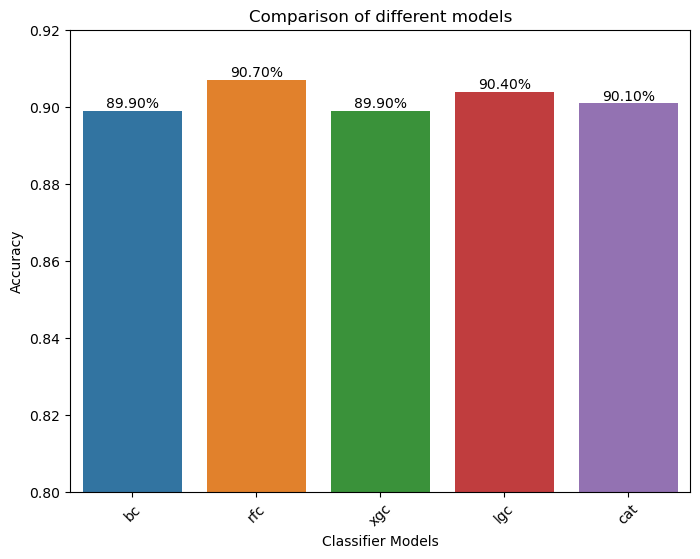

In [263]:
model_acc_bar_plot(model_acc_df_for_RFE,.80,.92)

# Feature selection (RFECV)

In [252]:
rfecv=RFECV( estimator=rfc,
            step=1,
            cv=10,
            scoring='accuracy',
            n_jobs=-1
        ).fit(X,y)


C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.estimator_.fit(X[:, features], y, **fit_params)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:739: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.estimator_.fit(self._transform(X), y)


In [253]:
rfecv_data=pd.DataFrame({
                'Feature':X.columns,
                'Ranking':rfecv.ranking_
})
rfecv_data.sort_values(by='Ranking')

,Feature,Ranking
0,Pregnancies,1
1,Glucose,1
2,BloodPressure,1
3,SkinThickness,1
4,Insulin,1
5,BMI,1
6,DiabetesPedigreeFunction,1
7,Age,1


In [254]:
rfecv.get_feature_names_out()

array(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness',
       'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age'], dtype=object)

In [255]:
trans_x_train=rfecv.transform(X)

In [256]:
trans_x_train.shape

(1000, 8)

In [257]:
rfecv_col=list(rfecv.get_feature_names_out())
rfecv_col

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

In [258]:
model_acc_arr=[]

for key,model in selected_model_for_SelectKBest.items():
    model_acc_arr.append(cross_val_mean_acc(model,trans_x_train,y))
    
model_acc_df_for_RFECV=create_datafram(model_acc_arr,selected_model_for_SelectKBest)

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1511
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1365
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1512
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of n

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1162
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1159
[Ligh

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1155
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-thre

128:	learn: 0.2474293	total: 1.02s	remaining: 6.89s
129:	learn: 0.2467889	total: 1.03s	remaining: 6.89s
130:	learn: 0.2462263	total: 1.04s	remaining: 6.88s
131:	learn: 0.2455160	total: 1.04s	remaining: 6.86s
132:	learn: 0.2446812	total: 1.05s	remaining: 6.85s
133:	learn: 0.2440274	total: 1.06s	remaining: 6.83s
134:	learn: 0.2425578	total: 1.06s	remaining: 6.83s
135:	learn: 0.2417143	total: 1.07s	remaining: 6.82s
136:	learn: 0.2408986	total: 1.08s	remaining: 6.81s
137:	learn: 0.2397939	total: 1.09s	remaining: 6.8s
138:	learn: 0.2388809	total: 1.1s	remaining: 6.79s
139:	learn: 0.2378321	total: 1.1s	remaining: 6.78s
140:	learn: 0.2367842	total: 1.11s	remaining: 6.77s
141:	learn: 0.2361044	total: 1.12s	remaining: 6.75s
142:	learn: 0.2354170	total: 1.12s	remaining: 6.73s
143:	learn: 0.2345146	total: 1.13s	remaining: 6.71s
144:	learn: 0.2340486	total: 1.14s	remaining: 6.69s
145:	learn: 0.2332476	total: 1.14s	remaining: 6.68s
146:	learn: 0.2325818	total: 1.15s	remaining: 6.67s
147:	learn: 0.2

305:	learn: 0.1621097	total: 2.42s	remaining: 5.48s
306:	learn: 0.1619008	total: 2.43s	remaining: 5.48s
307:	learn: 0.1615912	total: 2.43s	remaining: 5.47s
308:	learn: 0.1612305	total: 2.44s	remaining: 5.46s
309:	learn: 0.1609863	total: 2.45s	remaining: 5.46s
310:	learn: 0.1607285	total: 2.46s	remaining: 5.45s
311:	learn: 0.1602152	total: 2.47s	remaining: 5.44s
312:	learn: 0.1598639	total: 2.47s	remaining: 5.43s
313:	learn: 0.1595301	total: 2.48s	remaining: 5.42s
314:	learn: 0.1593167	total: 2.49s	remaining: 5.41s
315:	learn: 0.1591303	total: 2.5s	remaining: 5.4s
316:	learn: 0.1588679	total: 2.5s	remaining: 5.39s
317:	learn: 0.1586382	total: 2.51s	remaining: 5.38s
318:	learn: 0.1584158	total: 2.52s	remaining: 5.38s
319:	learn: 0.1582852	total: 2.52s	remaining: 5.37s
320:	learn: 0.1580526	total: 2.53s	remaining: 5.36s
321:	learn: 0.1577700	total: 2.54s	remaining: 5.35s
322:	learn: 0.1574948	total: 2.55s	remaining: 5.34s
323:	learn: 0.1572106	total: 2.55s	remaining: 5.33s
324:	learn: 0.1

472:	learn: 0.1227560	total: 3.83s	remaining: 4.27s
473:	learn: 0.1225624	total: 3.84s	remaining: 4.26s
474:	learn: 0.1223097	total: 3.85s	remaining: 4.25s
475:	learn: 0.1221851	total: 3.86s	remaining: 4.25s
476:	learn: 0.1220412	total: 3.87s	remaining: 4.24s
477:	learn: 0.1218502	total: 3.87s	remaining: 4.23s
478:	learn: 0.1216298	total: 3.88s	remaining: 4.22s
479:	learn: 0.1214489	total: 3.89s	remaining: 4.21s
480:	learn: 0.1212518	total: 3.9s	remaining: 4.21s
481:	learn: 0.1210565	total: 3.91s	remaining: 4.2s
482:	learn: 0.1208689	total: 3.92s	remaining: 4.19s
483:	learn: 0.1206735	total: 3.92s	remaining: 4.18s
484:	learn: 0.1204665	total: 3.93s	remaining: 4.18s
485:	learn: 0.1203191	total: 3.94s	remaining: 4.17s
486:	learn: 0.1200819	total: 3.95s	remaining: 4.16s
487:	learn: 0.1198551	total: 3.96s	remaining: 4.15s
488:	learn: 0.1196880	total: 3.97s	remaining: 4.14s
489:	learn: 0.1195347	total: 3.98s	remaining: 4.14s
490:	learn: 0.1194581	total: 3.98s	remaining: 4.13s
491:	learn: 0.

645:	learn: 0.0953479	total: 5.22s	remaining: 2.86s
646:	learn: 0.0952410	total: 5.23s	remaining: 2.85s
647:	learn: 0.0951854	total: 5.24s	remaining: 2.85s
648:	learn: 0.0950678	total: 5.25s	remaining: 2.84s
649:	learn: 0.0949907	total: 5.25s	remaining: 2.83s
650:	learn: 0.0948567	total: 5.26s	remaining: 2.82s
651:	learn: 0.0947680	total: 5.27s	remaining: 2.81s
652:	learn: 0.0946607	total: 5.28s	remaining: 2.81s
653:	learn: 0.0945093	total: 5.29s	remaining: 2.8s
654:	learn: 0.0944291	total: 5.3s	remaining: 2.79s
655:	learn: 0.0943457	total: 5.3s	remaining: 2.78s
656:	learn: 0.0942440	total: 5.31s	remaining: 2.77s
657:	learn: 0.0940941	total: 5.32s	remaining: 2.77s
658:	learn: 0.0939792	total: 5.33s	remaining: 2.76s
659:	learn: 0.0938513	total: 5.34s	remaining: 2.75s
660:	learn: 0.0937950	total: 5.34s	remaining: 2.74s
661:	learn: 0.0936699	total: 5.35s	remaining: 2.73s
662:	learn: 0.0935778	total: 5.36s	remaining: 2.73s
663:	learn: 0.0933977	total: 5.37s	remaining: 2.72s
664:	learn: 0.0

815:	learn: 0.0757451	total: 6.63s	remaining: 1.49s
816:	learn: 0.0756420	total: 6.63s	remaining: 1.49s
817:	learn: 0.0755623	total: 6.64s	remaining: 1.48s
818:	learn: 0.0754873	total: 6.65s	remaining: 1.47s
819:	learn: 0.0753845	total: 6.66s	remaining: 1.46s
820:	learn: 0.0752555	total: 6.66s	remaining: 1.45s
821:	learn: 0.0750930	total: 6.67s	remaining: 1.44s
822:	learn: 0.0749945	total: 6.68s	remaining: 1.44s
823:	learn: 0.0749134	total: 6.68s	remaining: 1.43s
824:	learn: 0.0747876	total: 6.69s	remaining: 1.42s
825:	learn: 0.0747078	total: 6.7s	remaining: 1.41s
826:	learn: 0.0745959	total: 6.71s	remaining: 1.4s
827:	learn: 0.0743880	total: 6.72s	remaining: 1.4s
828:	learn: 0.0742741	total: 6.73s	remaining: 1.39s
829:	learn: 0.0742111	total: 6.74s	remaining: 1.38s
830:	learn: 0.0740478	total: 6.75s	remaining: 1.37s
831:	learn: 0.0739303	total: 6.75s	remaining: 1.36s
832:	learn: 0.0737880	total: 6.76s	remaining: 1.35s
833:	learn: 0.0737193	total: 6.77s	remaining: 1.35s
834:	learn: 0.0

980:	learn: 0.0613461	total: 8s	remaining: 155ms
981:	learn: 0.0612752	total: 8.01s	remaining: 147ms
982:	learn: 0.0612146	total: 8.01s	remaining: 139ms
983:	learn: 0.0611013	total: 8.02s	remaining: 130ms
984:	learn: 0.0610432	total: 8.03s	remaining: 122ms
985:	learn: 0.0610267	total: 8.04s	remaining: 114ms
986:	learn: 0.0609676	total: 8.05s	remaining: 106ms
987:	learn: 0.0608758	total: 8.06s	remaining: 97.9ms
988:	learn: 0.0607640	total: 8.06s	remaining: 89.7ms
989:	learn: 0.0606989	total: 8.07s	remaining: 81.6ms
990:	learn: 0.0606312	total: 8.08s	remaining: 73.4ms
991:	learn: 0.0605567	total: 8.09s	remaining: 65.2ms
992:	learn: 0.0604879	total: 8.1s	remaining: 57.1ms
993:	learn: 0.0603931	total: 8.11s	remaining: 48.9ms
994:	learn: 0.0602913	total: 8.12s	remaining: 40.8ms
995:	learn: 0.0602058	total: 8.12s	remaining: 32.6ms
996:	learn: 0.0601396	total: 8.13s	remaining: 24.5ms
997:	learn: 0.0600443	total: 8.14s	remaining: 16.3ms
998:	learn: 0.0600163	total: 8.14s	remaining: 8.15ms
999:

163:	learn: 0.2199277	total: 1.39s	remaining: 7.1s
164:	learn: 0.2192348	total: 1.4s	remaining: 7.1s
165:	learn: 0.2188229	total: 1.41s	remaining: 7.09s
166:	learn: 0.2182656	total: 1.42s	remaining: 7.08s
167:	learn: 0.2176844	total: 1.43s	remaining: 7.06s
168:	learn: 0.2169163	total: 1.43s	remaining: 7.05s
169:	learn: 0.2163923	total: 1.44s	remaining: 7.04s
170:	learn: 0.2158659	total: 1.45s	remaining: 7.03s
171:	learn: 0.2153220	total: 1.46s	remaining: 7.03s
172:	learn: 0.2147060	total: 1.47s	remaining: 7.02s
173:	learn: 0.2140213	total: 1.48s	remaining: 7.01s
174:	learn: 0.2137041	total: 1.49s	remaining: 7s
175:	learn: 0.2130689	total: 1.49s	remaining: 7s
176:	learn: 0.2126688	total: 1.5s	remaining: 6.99s
177:	learn: 0.2122565	total: 1.51s	remaining: 6.97s
178:	learn: 0.2116173	total: 1.52s	remaining: 6.96s
179:	learn: 0.2109965	total: 1.53s	remaining: 6.96s
180:	learn: 0.2104173	total: 1.54s	remaining: 6.96s
181:	learn: 0.2100033	total: 1.54s	remaining: 6.95s
182:	learn: 0.2093813	

322:	learn: 0.1581504	total: 2.75s	remaining: 5.78s
323:	learn: 0.1578759	total: 2.77s	remaining: 5.77s
324:	learn: 0.1574605	total: 2.77s	remaining: 5.76s
325:	learn: 0.1570936	total: 2.78s	remaining: 5.75s
326:	learn: 0.1567552	total: 2.79s	remaining: 5.74s
327:	learn: 0.1565219	total: 2.8s	remaining: 5.73s
328:	learn: 0.1563514	total: 2.81s	remaining: 5.72s
329:	learn: 0.1561403	total: 2.81s	remaining: 5.71s
330:	learn: 0.1558331	total: 2.82s	remaining: 5.7s
331:	learn: 0.1555661	total: 2.83s	remaining: 5.69s
332:	learn: 0.1553648	total: 2.83s	remaining: 5.68s
333:	learn: 0.1550983	total: 2.84s	remaining: 5.67s
334:	learn: 0.1549341	total: 2.85s	remaining: 5.66s
335:	learn: 0.1547661	total: 2.86s	remaining: 5.65s
336:	learn: 0.1543972	total: 2.87s	remaining: 5.64s
337:	learn: 0.1540946	total: 2.87s	remaining: 5.63s
338:	learn: 0.1537054	total: 2.88s	remaining: 5.62s
339:	learn: 0.1534746	total: 2.89s	remaining: 5.61s
340:	learn: 0.1532610	total: 2.89s	remaining: 5.59s
341:	learn: 0.

497:	learn: 0.1197752	total: 4.17s	remaining: 4.2s
498:	learn: 0.1196141	total: 4.18s	remaining: 4.19s
499:	learn: 0.1194205	total: 4.18s	remaining: 4.18s
500:	learn: 0.1192463	total: 4.19s	remaining: 4.18s
501:	learn: 0.1190811	total: 4.2s	remaining: 4.17s
502:	learn: 0.1188091	total: 4.21s	remaining: 4.16s
503:	learn: 0.1185698	total: 4.22s	remaining: 4.15s
504:	learn: 0.1183436	total: 4.23s	remaining: 4.14s
505:	learn: 0.1181882	total: 4.23s	remaining: 4.13s
506:	learn: 0.1180794	total: 4.24s	remaining: 4.13s
507:	learn: 0.1178438	total: 4.25s	remaining: 4.12s
508:	learn: 0.1176915	total: 4.26s	remaining: 4.11s
509:	learn: 0.1174990	total: 4.26s	remaining: 4.1s
510:	learn: 0.1173604	total: 4.27s	remaining: 4.09s
511:	learn: 0.1172695	total: 4.28s	remaining: 4.08s
512:	learn: 0.1171771	total: 4.28s	remaining: 4.07s
513:	learn: 0.1170319	total: 4.29s	remaining: 4.06s
514:	learn: 0.1169545	total: 4.3s	remaining: 4.05s
515:	learn: 0.1168193	total: 4.3s	remaining: 4.04s
516:	learn: 0.116

668:	learn: 0.0955503	total: 5.54s	remaining: 2.74s
669:	learn: 0.0954284	total: 5.55s	remaining: 2.73s
670:	learn: 0.0952515	total: 5.56s	remaining: 2.73s
671:	learn: 0.0950702	total: 5.57s	remaining: 2.72s
672:	learn: 0.0949149	total: 5.58s	remaining: 2.71s
673:	learn: 0.0948568	total: 5.58s	remaining: 2.7s
674:	learn: 0.0947871	total: 5.59s	remaining: 2.69s
675:	learn: 0.0946162	total: 5.6s	remaining: 2.68s
676:	learn: 0.0945485	total: 5.61s	remaining: 2.67s
677:	learn: 0.0944938	total: 5.61s	remaining: 2.67s
678:	learn: 0.0941904	total: 5.62s	remaining: 2.66s
679:	learn: 0.0940350	total: 5.63s	remaining: 2.65s
680:	learn: 0.0938844	total: 5.63s	remaining: 2.64s
681:	learn: 0.0938157	total: 5.64s	remaining: 2.63s
682:	learn: 0.0936636	total: 5.65s	remaining: 2.62s
683:	learn: 0.0935212	total: 5.66s	remaining: 2.61s
684:	learn: 0.0934352	total: 5.66s	remaining: 2.6s
685:	learn: 0.0933135	total: 5.67s	remaining: 2.6s
686:	learn: 0.0931720	total: 5.68s	remaining: 2.59s
687:	learn: 0.09

850:	learn: 0.0758250	total: 6.93s	remaining: 1.21s
851:	learn: 0.0757163	total: 6.94s	remaining: 1.21s
852:	learn: 0.0755980	total: 6.95s	remaining: 1.2s
853:	learn: 0.0755144	total: 6.96s	remaining: 1.19s
854:	learn: 0.0754579	total: 6.96s	remaining: 1.18s
855:	learn: 0.0753894	total: 6.97s	remaining: 1.17s
856:	learn: 0.0752915	total: 6.98s	remaining: 1.16s
857:	learn: 0.0752377	total: 6.99s	remaining: 1.16s
858:	learn: 0.0751284	total: 6.99s	remaining: 1.15s
859:	learn: 0.0750088	total: 7s	remaining: 1.14s
860:	learn: 0.0748720	total: 7.01s	remaining: 1.13s
861:	learn: 0.0748091	total: 7.01s	remaining: 1.12s
862:	learn: 0.0747493	total: 7.02s	remaining: 1.11s
863:	learn: 0.0746880	total: 7.03s	remaining: 1.11s
864:	learn: 0.0746086	total: 7.03s	remaining: 1.1s
865:	learn: 0.0744969	total: 7.04s	remaining: 1.09s
866:	learn: 0.0743984	total: 7.05s	remaining: 1.08s
867:	learn: 0.0742907	total: 7.06s	remaining: 1.07s
868:	learn: 0.0741158	total: 7.06s	remaining: 1.06s
869:	learn: 0.074

21:	learn: 0.5124566	total: 196ms	remaining: 8.7s
22:	learn: 0.5070947	total: 206ms	remaining: 8.74s
23:	learn: 0.5006663	total: 215ms	remaining: 8.73s
24:	learn: 0.4949220	total: 223ms	remaining: 8.68s
25:	learn: 0.4896819	total: 232ms	remaining: 8.68s
26:	learn: 0.4841704	total: 240ms	remaining: 8.65s
27:	learn: 0.4785241	total: 248ms	remaining: 8.59s
28:	learn: 0.4738317	total: 256ms	remaining: 8.57s
29:	learn: 0.4685627	total: 266ms	remaining: 8.6s
30:	learn: 0.4635094	total: 275ms	remaining: 8.61s
31:	learn: 0.4589997	total: 284ms	remaining: 8.6s
32:	learn: 0.4541673	total: 293ms	remaining: 8.59s
33:	learn: 0.4492168	total: 302ms	remaining: 8.59s
34:	learn: 0.4444654	total: 311ms	remaining: 8.57s
35:	learn: 0.4393395	total: 319ms	remaining: 8.53s
36:	learn: 0.4343242	total: 328ms	remaining: 8.53s
37:	learn: 0.4303848	total: 338ms	remaining: 8.55s
38:	learn: 0.4268438	total: 347ms	remaining: 8.55s
39:	learn: 0.4232591	total: 356ms	remaining: 8.53s
40:	learn: 0.4201726	total: 364ms	

195:	learn: 0.2047505	total: 1.58s	remaining: 6.48s
196:	learn: 0.2042968	total: 1.59s	remaining: 6.47s
197:	learn: 0.2037855	total: 1.6s	remaining: 6.47s
198:	learn: 0.2033218	total: 1.6s	remaining: 6.46s
199:	learn: 0.2029275	total: 1.61s	remaining: 6.45s
200:	learn: 0.2024276	total: 1.62s	remaining: 6.45s
201:	learn: 0.2019557	total: 1.63s	remaining: 6.44s
202:	learn: 0.2015774	total: 1.64s	remaining: 6.43s
203:	learn: 0.2010887	total: 1.65s	remaining: 6.43s
204:	learn: 0.2006985	total: 1.66s	remaining: 6.42s
205:	learn: 0.2002841	total: 1.66s	remaining: 6.41s
206:	learn: 0.1999030	total: 1.67s	remaining: 6.41s
207:	learn: 0.1994437	total: 1.68s	remaining: 6.4s
208:	learn: 0.1988910	total: 1.69s	remaining: 6.4s
209:	learn: 0.1983613	total: 1.7s	remaining: 6.4s
210:	learn: 0.1980143	total: 1.71s	remaining: 6.4s
211:	learn: 0.1974582	total: 1.72s	remaining: 6.39s
212:	learn: 0.1969227	total: 1.73s	remaining: 6.38s
213:	learn: 0.1966289	total: 1.74s	remaining: 6.38s
214:	learn: 0.19631

354:	learn: 0.1520961	total: 2.99s	remaining: 5.43s
355:	learn: 0.1517261	total: 3s	remaining: 5.43s
356:	learn: 0.1515536	total: 3.01s	remaining: 5.42s
357:	learn: 0.1513751	total: 3.02s	remaining: 5.41s
358:	learn: 0.1511140	total: 3.03s	remaining: 5.41s
359:	learn: 0.1509971	total: 3.04s	remaining: 5.4s
360:	learn: 0.1507547	total: 3.05s	remaining: 5.39s
361:	learn: 0.1505626	total: 3.05s	remaining: 5.38s
362:	learn: 0.1501234	total: 3.06s	remaining: 5.37s
363:	learn: 0.1497960	total: 3.07s	remaining: 5.37s
364:	learn: 0.1495337	total: 3.08s	remaining: 5.36s
365:	learn: 0.1492302	total: 3.09s	remaining: 5.35s
366:	learn: 0.1491476	total: 3.1s	remaining: 5.34s
367:	learn: 0.1489410	total: 3.1s	remaining: 5.33s
368:	learn: 0.1486554	total: 3.11s	remaining: 5.32s
369:	learn: 0.1484769	total: 3.12s	remaining: 5.32s
370:	learn: 0.1482191	total: 3.13s	remaining: 5.31s
371:	learn: 0.1480352	total: 3.14s	remaining: 5.3s
372:	learn: 0.1478825	total: 3.15s	remaining: 5.29s
373:	learn: 0.14758

518:	learn: 0.1184081	total: 4.38s	remaining: 4.06s
519:	learn: 0.1182255	total: 4.39s	remaining: 4.05s
520:	learn: 0.1181605	total: 4.4s	remaining: 4.05s
521:	learn: 0.1179475	total: 4.41s	remaining: 4.04s
522:	learn: 0.1178145	total: 4.42s	remaining: 4.03s
523:	learn: 0.1175683	total: 4.43s	remaining: 4.02s
524:	learn: 0.1173692	total: 4.43s	remaining: 4.01s
525:	learn: 0.1171905	total: 4.45s	remaining: 4s
526:	learn: 0.1170396	total: 4.45s	remaining: 4s
527:	learn: 0.1168939	total: 4.46s	remaining: 3.99s
528:	learn: 0.1167414	total: 4.47s	remaining: 3.98s
529:	learn: 0.1165195	total: 4.48s	remaining: 3.97s
530:	learn: 0.1163941	total: 4.49s	remaining: 3.96s
531:	learn: 0.1161799	total: 4.5s	remaining: 3.95s
532:	learn: 0.1160087	total: 4.5s	remaining: 3.95s
533:	learn: 0.1158966	total: 4.51s	remaining: 3.94s
534:	learn: 0.1157926	total: 4.52s	remaining: 3.93s
535:	learn: 0.1156240	total: 4.53s	remaining: 3.92s
536:	learn: 0.1153880	total: 4.53s	remaining: 3.91s
537:	learn: 0.1152445

695:	learn: 0.0929924	total: 5.78s	remaining: 2.53s
696:	learn: 0.0929243	total: 5.79s	remaining: 2.52s
697:	learn: 0.0928028	total: 5.8s	remaining: 2.51s
698:	learn: 0.0926466	total: 5.81s	remaining: 2.5s
699:	learn: 0.0925628	total: 5.82s	remaining: 2.49s
700:	learn: 0.0923909	total: 5.83s	remaining: 2.48s
701:	learn: 0.0922425	total: 5.83s	remaining: 2.48s
702:	learn: 0.0921480	total: 5.84s	remaining: 2.47s
703:	learn: 0.0919960	total: 5.85s	remaining: 2.46s
704:	learn: 0.0918733	total: 5.86s	remaining: 2.45s
705:	learn: 0.0915426	total: 5.87s	remaining: 2.44s
706:	learn: 0.0914329	total: 5.87s	remaining: 2.43s
707:	learn: 0.0913388	total: 5.88s	remaining: 2.42s
708:	learn: 0.0912106	total: 5.89s	remaining: 2.42s
709:	learn: 0.0911268	total: 5.9s	remaining: 2.41s
710:	learn: 0.0910076	total: 5.91s	remaining: 2.4s
711:	learn: 0.0908673	total: 5.92s	remaining: 2.39s
712:	learn: 0.0907368	total: 5.92s	remaining: 2.38s
713:	learn: 0.0906337	total: 5.93s	remaining: 2.38s
714:	learn: 0.09

854:	learn: 0.0742257	total: 7s	remaining: 1.19s
855:	learn: 0.0741788	total: 7s	remaining: 1.18s
856:	learn: 0.0740930	total: 7.01s	remaining: 1.17s
857:	learn: 0.0739732	total: 7.02s	remaining: 1.16s
858:	learn: 0.0738563	total: 7.03s	remaining: 1.15s
859:	learn: 0.0737491	total: 7.03s	remaining: 1.15s
860:	learn: 0.0736568	total: 7.04s	remaining: 1.14s
861:	learn: 0.0734311	total: 7.05s	remaining: 1.13s
862:	learn: 0.0733102	total: 7.06s	remaining: 1.12s
863:	learn: 0.0732680	total: 7.06s	remaining: 1.11s
864:	learn: 0.0730501	total: 7.07s	remaining: 1.1s
865:	learn: 0.0729383	total: 7.08s	remaining: 1.09s
866:	learn: 0.0728593	total: 7.08s	remaining: 1.09s
867:	learn: 0.0728053	total: 7.09s	remaining: 1.08s
868:	learn: 0.0727301	total: 7.1s	remaining: 1.07s
869:	learn: 0.0725196	total: 7.1s	remaining: 1.06s
870:	learn: 0.0724992	total: 7.11s	remaining: 1.05s
871:	learn: 0.0724791	total: 7.12s	remaining: 1.04s
872:	learn: 0.0724331	total: 7.13s	remaining: 1.04s
873:	learn: 0.0724066

26:	learn: 0.4815409	total: 231ms	remaining: 8.33s
27:	learn: 0.4755597	total: 240ms	remaining: 8.32s
28:	learn: 0.4709140	total: 248ms	remaining: 8.29s
29:	learn: 0.4658913	total: 255ms	remaining: 8.23s
30:	learn: 0.4615789	total: 263ms	remaining: 8.21s
31:	learn: 0.4572120	total: 271ms	remaining: 8.19s
32:	learn: 0.4527177	total: 279ms	remaining: 8.18s
33:	learn: 0.4471583	total: 286ms	remaining: 8.13s
34:	learn: 0.4424084	total: 294ms	remaining: 8.1s
35:	learn: 0.4376074	total: 300ms	remaining: 8.04s
36:	learn: 0.4322800	total: 308ms	remaining: 8.01s
37:	learn: 0.4282194	total: 314ms	remaining: 7.95s
38:	learn: 0.4249581	total: 321ms	remaining: 7.91s
39:	learn: 0.4209280	total: 328ms	remaining: 7.88s
40:	learn: 0.4161283	total: 335ms	remaining: 7.83s
41:	learn: 0.4121177	total: 342ms	remaining: 7.8s
42:	learn: 0.4079232	total: 349ms	remaining: 7.77s
43:	learn: 0.4043958	total: 357ms	remaining: 7.76s
44:	learn: 0.3998339	total: 365ms	remaining: 7.74s
45:	learn: 0.3955465	total: 370ms

188:	learn: 0.2032391	total: 1.62s	remaining: 6.95s
189:	learn: 0.2028065	total: 1.63s	remaining: 6.94s
190:	learn: 0.2024111	total: 1.64s	remaining: 6.94s
191:	learn: 0.2019834	total: 1.65s	remaining: 6.93s
192:	learn: 0.2013816	total: 1.66s	remaining: 6.92s
193:	learn: 0.2009754	total: 1.66s	remaining: 6.91s
194:	learn: 0.2005717	total: 1.67s	remaining: 6.9s
195:	learn: 0.2000697	total: 1.68s	remaining: 6.89s
196:	learn: 0.1995222	total: 1.69s	remaining: 6.88s
197:	learn: 0.1989394	total: 1.69s	remaining: 6.86s
198:	learn: 0.1984636	total: 1.7s	remaining: 6.85s
199:	learn: 0.1979602	total: 1.71s	remaining: 6.84s
200:	learn: 0.1975119	total: 1.72s	remaining: 6.83s
201:	learn: 0.1970723	total: 1.72s	remaining: 6.81s
202:	learn: 0.1966798	total: 1.73s	remaining: 6.8s
203:	learn: 0.1962243	total: 1.74s	remaining: 6.79s
204:	learn: 0.1957788	total: 1.75s	remaining: 6.79s
205:	learn: 0.1953473	total: 1.76s	remaining: 6.78s
206:	learn: 0.1949719	total: 1.77s	remaining: 6.78s
207:	learn: 0.1

354:	learn: 0.1465796	total: 3.03s	remaining: 5.5s
355:	learn: 0.1464042	total: 3.03s	remaining: 5.49s
356:	learn: 0.1461654	total: 3.04s	remaining: 5.48s
357:	learn: 0.1459332	total: 3.05s	remaining: 5.47s
358:	learn: 0.1456410	total: 3.06s	remaining: 5.46s
359:	learn: 0.1455069	total: 3.07s	remaining: 5.45s
360:	learn: 0.1451196	total: 3.08s	remaining: 5.45s
361:	learn: 0.1448669	total: 3.08s	remaining: 5.44s
362:	learn: 0.1445725	total: 3.09s	remaining: 5.43s
363:	learn: 0.1443530	total: 3.1s	remaining: 5.42s
364:	learn: 0.1441318	total: 3.11s	remaining: 5.42s
365:	learn: 0.1439590	total: 3.12s	remaining: 5.41s
366:	learn: 0.1438077	total: 3.13s	remaining: 5.4s
367:	learn: 0.1435491	total: 3.14s	remaining: 5.39s
368:	learn: 0.1432867	total: 3.15s	remaining: 5.38s
369:	learn: 0.1429930	total: 3.16s	remaining: 5.38s
370:	learn: 0.1428745	total: 3.17s	remaining: 5.37s
371:	learn: 0.1426349	total: 3.17s	remaining: 5.36s
372:	learn: 0.1424786	total: 3.18s	remaining: 5.35s
373:	learn: 0.1

515:	learn: 0.1157876	total: 4.4s	remaining: 4.13s
516:	learn: 0.1156335	total: 4.41s	remaining: 4.12s
517:	learn: 0.1154065	total: 4.42s	remaining: 4.11s
518:	learn: 0.1152224	total: 4.43s	remaining: 4.1s
519:	learn: 0.1150497	total: 4.43s	remaining: 4.09s
520:	learn: 0.1148752	total: 4.44s	remaining: 4.08s
521:	learn: 0.1147708	total: 4.45s	remaining: 4.08s
522:	learn: 0.1146725	total: 4.46s	remaining: 4.07s
523:	learn: 0.1145083	total: 4.47s	remaining: 4.06s
524:	learn: 0.1143691	total: 4.48s	remaining: 4.05s
525:	learn: 0.1143028	total: 4.49s	remaining: 4.04s
526:	learn: 0.1141583	total: 4.49s	remaining: 4.03s
527:	learn: 0.1140055	total: 4.5s	remaining: 4.03s
528:	learn: 0.1138569	total: 4.51s	remaining: 4.02s
529:	learn: 0.1137861	total: 4.52s	remaining: 4.01s
530:	learn: 0.1136360	total: 4.53s	remaining: 4s
531:	learn: 0.1133914	total: 4.54s	remaining: 3.99s
532:	learn: 0.1132654	total: 4.55s	remaining: 3.98s
533:	learn: 0.1132167	total: 4.56s	remaining: 3.98s
534:	learn: 0.1130

675:	learn: 0.0944395	total: 5.79s	remaining: 2.77s
676:	learn: 0.0942587	total: 5.79s	remaining: 2.77s
677:	learn: 0.0941282	total: 5.8s	remaining: 2.75s
678:	learn: 0.0940950	total: 5.85s	remaining: 2.77s
679:	learn: 0.0939589	total: 5.86s	remaining: 2.76s
680:	learn: 0.0938160	total: 5.86s	remaining: 2.75s
681:	learn: 0.0935449	total: 5.87s	remaining: 2.74s
682:	learn: 0.0934085	total: 5.87s	remaining: 2.73s
683:	learn: 0.0933026	total: 5.88s	remaining: 2.72s
684:	learn: 0.0932445	total: 5.88s	remaining: 2.71s
685:	learn: 0.0931491	total: 5.89s	remaining: 2.7s
686:	learn: 0.0930184	total: 5.9s	remaining: 2.69s
687:	learn: 0.0929536	total: 5.9s	remaining: 2.68s
688:	learn: 0.0928256	total: 5.91s	remaining: 2.67s
689:	learn: 0.0926906	total: 5.92s	remaining: 2.66s
690:	learn: 0.0926067	total: 5.92s	remaining: 2.65s
691:	learn: 0.0925464	total: 5.93s	remaining: 2.64s
692:	learn: 0.0923396	total: 5.93s	remaining: 2.63s
693:	learn: 0.0921859	total: 5.94s	remaining: 2.62s
694:	learn: 0.09

845:	learn: 0.0773926	total: 7.15s	remaining: 1.3s
846:	learn: 0.0773332	total: 7.16s	remaining: 1.29s
847:	learn: 0.0772634	total: 7.17s	remaining: 1.28s
848:	learn: 0.0772369	total: 7.18s	remaining: 1.28s
849:	learn: 0.0770185	total: 7.19s	remaining: 1.27s
850:	learn: 0.0769763	total: 7.19s	remaining: 1.26s
851:	learn: 0.0768958	total: 7.2s	remaining: 1.25s
852:	learn: 0.0768684	total: 7.21s	remaining: 1.24s
853:	learn: 0.0768026	total: 7.22s	remaining: 1.23s
854:	learn: 0.0766647	total: 7.22s	remaining: 1.23s
855:	learn: 0.0766370	total: 7.23s	remaining: 1.22s
856:	learn: 0.0765066	total: 7.24s	remaining: 1.21s
857:	learn: 0.0764911	total: 7.25s	remaining: 1.2s
858:	learn: 0.0763768	total: 7.25s	remaining: 1.19s
859:	learn: 0.0763227	total: 7.26s	remaining: 1.18s
860:	learn: 0.0762376	total: 7.27s	remaining: 1.17s
861:	learn: 0.0761588	total: 7.27s	remaining: 1.16s
862:	learn: 0.0759590	total: 7.28s	remaining: 1.16s
863:	learn: 0.0759176	total: 7.29s	remaining: 1.15s
864:	learn: 0.0

8:	learn: 0.6070677	total: 78.6ms	remaining: 8.65s
9:	learn: 0.5995428	total: 85.5ms	remaining: 8.47s
10:	learn: 0.5924910	total: 92.3ms	remaining: 8.3s
11:	learn: 0.5831171	total: 98.8ms	remaining: 8.13s
12:	learn: 0.5756210	total: 106ms	remaining: 8.03s
13:	learn: 0.5680126	total: 113ms	remaining: 7.96s
14:	learn: 0.5614618	total: 121ms	remaining: 7.95s
15:	learn: 0.5536847	total: 128ms	remaining: 7.9s
16:	learn: 0.5469575	total: 138ms	remaining: 7.95s
17:	learn: 0.5408592	total: 145ms	remaining: 7.91s
18:	learn: 0.5333962	total: 153ms	remaining: 7.91s
19:	learn: 0.5276528	total: 160ms	remaining: 7.83s
20:	learn: 0.5199838	total: 167ms	remaining: 7.8s
21:	learn: 0.5131185	total: 174ms	remaining: 7.75s
22:	learn: 0.5072207	total: 180ms	remaining: 7.64s
23:	learn: 0.5021970	total: 186ms	remaining: 7.56s
24:	learn: 0.4971650	total: 191ms	remaining: 7.46s
25:	learn: 0.4921508	total: 197ms	remaining: 7.4s
26:	learn: 0.4860864	total: 206ms	remaining: 7.41s
27:	learn: 0.4805619	total: 213ms

180:	learn: 0.2185602	total: 1.29s	remaining: 5.83s
181:	learn: 0.2179565	total: 1.3s	remaining: 5.83s
182:	learn: 0.2175379	total: 1.31s	remaining: 5.83s
183:	learn: 0.2170399	total: 1.31s	remaining: 5.82s
184:	learn: 0.2166001	total: 1.32s	remaining: 5.8s
185:	learn: 0.2160778	total: 1.32s	remaining: 5.79s
186:	learn: 0.2155868	total: 1.33s	remaining: 5.78s
187:	learn: 0.2151083	total: 1.33s	remaining: 5.77s
188:	learn: 0.2146330	total: 1.34s	remaining: 5.76s
189:	learn: 0.2141873	total: 1.35s	remaining: 5.75s
190:	learn: 0.2135480	total: 1.36s	remaining: 5.75s
191:	learn: 0.2126830	total: 1.36s	remaining: 5.74s
192:	learn: 0.2122868	total: 1.37s	remaining: 5.74s
193:	learn: 0.2117687	total: 1.38s	remaining: 5.73s
194:	learn: 0.2109988	total: 1.39s	remaining: 5.73s
195:	learn: 0.2104312	total: 1.39s	remaining: 5.71s
196:	learn: 0.2099401	total: 1.4s	remaining: 5.71s
197:	learn: 0.2093027	total: 1.41s	remaining: 5.7s
198:	learn: 0.2088652	total: 1.42s	remaining: 5.7s
199:	learn: 0.208

341:	learn: 0.1598833	total: 2.65s	remaining: 5.09s
342:	learn: 0.1595178	total: 2.65s	remaining: 5.08s
343:	learn: 0.1592298	total: 2.66s	remaining: 5.08s
344:	learn: 0.1587979	total: 2.67s	remaining: 5.07s
345:	learn: 0.1586452	total: 2.68s	remaining: 5.07s
346:	learn: 0.1584498	total: 2.69s	remaining: 5.06s
347:	learn: 0.1581797	total: 2.7s	remaining: 5.06s
348:	learn: 0.1579936	total: 2.71s	remaining: 5.05s
349:	learn: 0.1576638	total: 2.72s	remaining: 5.05s
350:	learn: 0.1574155	total: 2.73s	remaining: 5.04s
351:	learn: 0.1571869	total: 2.74s	remaining: 5.04s
352:	learn: 0.1569545	total: 2.75s	remaining: 5.04s
353:	learn: 0.1566063	total: 2.76s	remaining: 5.04s
354:	learn: 0.1562426	total: 2.77s	remaining: 5.03s
355:	learn: 0.1559941	total: 2.78s	remaining: 5.03s
356:	learn: 0.1558475	total: 2.79s	remaining: 5.02s
357:	learn: 0.1555292	total: 2.8s	remaining: 5.01s
358:	learn: 0.1552700	total: 2.81s	remaining: 5.01s
359:	learn: 0.1551218	total: 2.81s	remaining: 5s
360:	learn: 0.154

503:	learn: 0.1247655	total: 4.06s	remaining: 4s
504:	learn: 0.1245965	total: 4.07s	remaining: 3.99s
505:	learn: 0.1243867	total: 4.08s	remaining: 3.98s
506:	learn: 0.1242223	total: 4.08s	remaining: 3.97s
507:	learn: 0.1240192	total: 4.09s	remaining: 3.96s
508:	learn: 0.1238529	total: 4.1s	remaining: 3.96s
509:	learn: 0.1236190	total: 4.11s	remaining: 3.95s
510:	learn: 0.1234063	total: 4.12s	remaining: 3.94s
511:	learn: 0.1232434	total: 4.12s	remaining: 3.93s
512:	learn: 0.1230530	total: 4.13s	remaining: 3.92s
513:	learn: 0.1228699	total: 4.14s	remaining: 3.92s
514:	learn: 0.1227407	total: 4.15s	remaining: 3.91s
515:	learn: 0.1225776	total: 4.16s	remaining: 3.9s
516:	learn: 0.1224217	total: 4.17s	remaining: 3.89s
517:	learn: 0.1222244	total: 4.17s	remaining: 3.88s
518:	learn: 0.1220030	total: 4.18s	remaining: 3.88s
519:	learn: 0.1217804	total: 4.19s	remaining: 3.87s
520:	learn: 0.1216138	total: 4.2s	remaining: 3.86s
521:	learn: 0.1214067	total: 4.21s	remaining: 3.85s
522:	learn: 0.1211

675:	learn: 0.0985625	total: 5.45s	remaining: 2.61s
676:	learn: 0.0984015	total: 5.46s	remaining: 2.6s
677:	learn: 0.0982692	total: 5.47s	remaining: 2.6s
678:	learn: 0.0981795	total: 5.47s	remaining: 2.59s
679:	learn: 0.0980213	total: 5.48s	remaining: 2.58s
680:	learn: 0.0978996	total: 5.49s	remaining: 2.57s
681:	learn: 0.0976546	total: 5.5s	remaining: 2.56s
682:	learn: 0.0974657	total: 5.51s	remaining: 2.56s
683:	learn: 0.0973627	total: 5.51s	remaining: 2.55s
684:	learn: 0.0972467	total: 5.52s	remaining: 2.54s
685:	learn: 0.0971722	total: 5.53s	remaining: 2.53s
686:	learn: 0.0970252	total: 5.54s	remaining: 2.52s
687:	learn: 0.0969496	total: 5.55s	remaining: 2.52s
688:	learn: 0.0966688	total: 5.56s	remaining: 2.51s
689:	learn: 0.0965583	total: 5.57s	remaining: 2.5s
690:	learn: 0.0964804	total: 5.58s	remaining: 2.49s
691:	learn: 0.0964156	total: 5.58s	remaining: 2.48s
692:	learn: 0.0962995	total: 5.59s	remaining: 2.48s
693:	learn: 0.0961970	total: 5.6s	remaining: 2.47s
694:	learn: 0.096

844:	learn: 0.0793384	total: 6.83s	remaining: 1.25s
845:	learn: 0.0792380	total: 6.83s	remaining: 1.24s
846:	learn: 0.0792159	total: 6.84s	remaining: 1.24s
847:	learn: 0.0790745	total: 6.85s	remaining: 1.23s
848:	learn: 0.0790072	total: 6.86s	remaining: 1.22s
849:	learn: 0.0789635	total: 6.86s	remaining: 1.21s
850:	learn: 0.0788712	total: 6.87s	remaining: 1.2s
851:	learn: 0.0787534	total: 6.88s	remaining: 1.19s
852:	learn: 0.0785867	total: 6.88s	remaining: 1.19s
853:	learn: 0.0785374	total: 6.89s	remaining: 1.18s
854:	learn: 0.0783996	total: 6.9s	remaining: 1.17s
855:	learn: 0.0783737	total: 6.91s	remaining: 1.16s
856:	learn: 0.0782777	total: 6.92s	remaining: 1.15s
857:	learn: 0.0781782	total: 6.92s	remaining: 1.15s
858:	learn: 0.0781541	total: 6.93s	remaining: 1.14s
859:	learn: 0.0780345	total: 6.94s	remaining: 1.13s
860:	learn: 0.0779689	total: 6.95s	remaining: 1.12s
861:	learn: 0.0778573	total: 6.95s	remaining: 1.11s
862:	learn: 0.0777748	total: 6.96s	remaining: 1.1s
863:	learn: 0.0

22:	learn: 0.5063220	total: 193ms	remaining: 8.21s
23:	learn: 0.5016603	total: 202ms	remaining: 8.23s
24:	learn: 0.4964260	total: 211ms	remaining: 8.23s
25:	learn: 0.4910939	total: 219ms	remaining: 8.2s
26:	learn: 0.4852176	total: 227ms	remaining: 8.16s
27:	learn: 0.4798843	total: 234ms	remaining: 8.13s
28:	learn: 0.4753714	total: 242ms	remaining: 8.1s
29:	learn: 0.4695559	total: 252ms	remaining: 8.13s
30:	learn: 0.4651541	total: 259ms	remaining: 8.11s
31:	learn: 0.4610569	total: 267ms	remaining: 8.08s
32:	learn: 0.4566735	total: 275ms	remaining: 8.05s
33:	learn: 0.4511926	total: 282ms	remaining: 8.02s
34:	learn: 0.4474356	total: 290ms	remaining: 8s
35:	learn: 0.4420529	total: 298ms	remaining: 7.99s
36:	learn: 0.4376879	total: 306ms	remaining: 7.96s
37:	learn: 0.4328126	total: 315ms	remaining: 7.98s
38:	learn: 0.4294190	total: 323ms	remaining: 7.96s
39:	learn: 0.4257022	total: 331ms	remaining: 7.93s
40:	learn: 0.4221852	total: 339ms	remaining: 7.92s
41:	learn: 0.4176689	total: 347ms	re

190:	learn: 0.2090648	total: 1.61s	remaining: 6.8s
191:	learn: 0.2082333	total: 1.61s	remaining: 6.8s
192:	learn: 0.2076882	total: 1.62s	remaining: 6.79s
193:	learn: 0.2072330	total: 1.63s	remaining: 6.78s
194:	learn: 0.2067028	total: 1.64s	remaining: 6.77s
195:	learn: 0.2063367	total: 1.65s	remaining: 6.76s
196:	learn: 0.2058946	total: 1.66s	remaining: 6.75s
197:	learn: 0.2054492	total: 1.67s	remaining: 6.75s
198:	learn: 0.2049635	total: 1.67s	remaining: 6.73s
199:	learn: 0.2043303	total: 1.68s	remaining: 6.72s
200:	learn: 0.2038494	total: 1.69s	remaining: 6.71s
201:	learn: 0.2035226	total: 1.7s	remaining: 6.71s
202:	learn: 0.2030203	total: 1.71s	remaining: 6.7s
203:	learn: 0.2026051	total: 1.71s	remaining: 6.69s
204:	learn: 0.2021542	total: 1.72s	remaining: 6.69s
205:	learn: 0.2015112	total: 1.73s	remaining: 6.68s
206:	learn: 0.2010123	total: 1.74s	remaining: 6.66s
207:	learn: 0.2006657	total: 1.75s	remaining: 6.66s
208:	learn: 0.2002372	total: 1.76s	remaining: 6.65s
209:	learn: 0.19

363:	learn: 0.1514816	total: 2.98s	remaining: 5.21s
364:	learn: 0.1511391	total: 2.99s	remaining: 5.2s
365:	learn: 0.1508825	total: 3s	remaining: 5.19s
366:	learn: 0.1507947	total: 3.01s	remaining: 5.18s
367:	learn: 0.1505361	total: 3.01s	remaining: 5.18s
368:	learn: 0.1503785	total: 3.02s	remaining: 5.17s
369:	learn: 0.1501903	total: 3.03s	remaining: 5.16s
370:	learn: 0.1499707	total: 3.04s	remaining: 5.16s
371:	learn: 0.1497886	total: 3.05s	remaining: 5.15s
372:	learn: 0.1496669	total: 3.06s	remaining: 5.14s
373:	learn: 0.1495101	total: 3.07s	remaining: 5.13s
374:	learn: 0.1493472	total: 3.07s	remaining: 5.12s
375:	learn: 0.1491359	total: 3.08s	remaining: 5.12s
376:	learn: 0.1489318	total: 3.09s	remaining: 5.11s
377:	learn: 0.1486746	total: 3.1s	remaining: 5.1s
378:	learn: 0.1484507	total: 3.11s	remaining: 5.09s
379:	learn: 0.1482118	total: 3.12s	remaining: 5.09s
380:	learn: 0.1479177	total: 3.13s	remaining: 5.08s
381:	learn: 0.1476893	total: 3.13s	remaining: 5.07s
382:	learn: 0.1474

527:	learn: 0.1193309	total: 4.36s	remaining: 3.9s
528:	learn: 0.1191308	total: 4.37s	remaining: 3.89s
529:	learn: 0.1188967	total: 4.38s	remaining: 3.88s
530:	learn: 0.1187339	total: 4.38s	remaining: 3.87s
531:	learn: 0.1185902	total: 4.39s	remaining: 3.86s
532:	learn: 0.1184208	total: 4.4s	remaining: 3.85s
533:	learn: 0.1183218	total: 4.41s	remaining: 3.85s
534:	learn: 0.1182021	total: 4.42s	remaining: 3.84s
535:	learn: 0.1181416	total: 4.42s	remaining: 3.83s
536:	learn: 0.1180533	total: 4.43s	remaining: 3.82s
537:	learn: 0.1176772	total: 4.44s	remaining: 3.81s
538:	learn: 0.1175346	total: 4.45s	remaining: 3.81s
539:	learn: 0.1173124	total: 4.46s	remaining: 3.8s
540:	learn: 0.1170815	total: 4.47s	remaining: 3.79s
541:	learn: 0.1169099	total: 4.47s	remaining: 3.78s
542:	learn: 0.1167520	total: 4.48s	remaining: 3.77s
543:	learn: 0.1166528	total: 4.49s	remaining: 3.76s
544:	learn: 0.1164463	total: 4.5s	remaining: 3.76s
545:	learn: 0.1162941	total: 4.51s	remaining: 3.75s
546:	learn: 0.11

694:	learn: 0.0949135	total: 5.72s	remaining: 2.51s
695:	learn: 0.0947541	total: 5.73s	remaining: 2.5s
696:	learn: 0.0946074	total: 5.74s	remaining: 2.5s
697:	learn: 0.0944976	total: 5.75s	remaining: 2.49s
698:	learn: 0.0943086	total: 5.75s	remaining: 2.48s
699:	learn: 0.0941984	total: 5.76s	remaining: 2.47s
700:	learn: 0.0941233	total: 5.77s	remaining: 2.46s
701:	learn: 0.0940517	total: 5.78s	remaining: 2.45s
702:	learn: 0.0939398	total: 5.79s	remaining: 2.44s
703:	learn: 0.0938011	total: 5.79s	remaining: 2.44s
704:	learn: 0.0937361	total: 5.8s	remaining: 2.43s
705:	learn: 0.0935336	total: 5.81s	remaining: 2.42s
706:	learn: 0.0934326	total: 5.82s	remaining: 2.41s
707:	learn: 0.0933409	total: 5.83s	remaining: 2.4s
708:	learn: 0.0932070	total: 5.84s	remaining: 2.4s
709:	learn: 0.0930646	total: 5.84s	remaining: 2.39s
710:	learn: 0.0930086	total: 5.85s	remaining: 2.38s
711:	learn: 0.0929103	total: 5.87s	remaining: 2.37s
712:	learn: 0.0926752	total: 5.88s	remaining: 2.36s
713:	learn: 0.092

866:	learn: 0.0759835	total: 7.08s	remaining: 1.09s
867:	learn: 0.0758949	total: 7.09s	remaining: 1.08s
868:	learn: 0.0757490	total: 7.1s	remaining: 1.07s
869:	learn: 0.0756164	total: 7.11s	remaining: 1.06s
870:	learn: 0.0755524	total: 7.12s	remaining: 1.05s
871:	learn: 0.0753381	total: 7.13s	remaining: 1.05s
872:	learn: 0.0751940	total: 7.13s	remaining: 1.04s
873:	learn: 0.0751145	total: 7.14s	remaining: 1.03s
874:	learn: 0.0750308	total: 7.15s	remaining: 1.02s
875:	learn: 0.0749962	total: 7.16s	remaining: 1.01s
876:	learn: 0.0749518	total: 7.17s	remaining: 1s
877:	learn: 0.0749163	total: 7.18s	remaining: 997ms
878:	learn: 0.0747337	total: 7.19s	remaining: 989ms
879:	learn: 0.0746526	total: 7.2s	remaining: 981ms
880:	learn: 0.0746257	total: 7.21s	remaining: 973ms
881:	learn: 0.0744712	total: 7.21s	remaining: 965ms
882:	learn: 0.0743701	total: 7.22s	remaining: 957ms
883:	learn: 0.0743362	total: 7.23s	remaining: 949ms
884:	learn: 0.0742147	total: 7.24s	remaining: 941ms
885:	learn: 0.074

47:	learn: 0.4061851	total: 394ms	remaining: 7.82s
48:	learn: 0.4025119	total: 403ms	remaining: 7.83s
49:	learn: 0.3989432	total: 411ms	remaining: 7.81s
50:	learn: 0.3957431	total: 419ms	remaining: 7.8s
51:	learn: 0.3927038	total: 427ms	remaining: 7.79s
52:	learn: 0.3899055	total: 435ms	remaining: 7.77s
53:	learn: 0.3870006	total: 442ms	remaining: 7.75s
54:	learn: 0.3833540	total: 451ms	remaining: 7.75s
55:	learn: 0.3803737	total: 460ms	remaining: 7.75s
56:	learn: 0.3769873	total: 469ms	remaining: 7.76s
57:	learn: 0.3736442	total: 478ms	remaining: 7.76s
58:	learn: 0.3712460	total: 486ms	remaining: 7.75s
59:	learn: 0.3676496	total: 495ms	remaining: 7.75s
60:	learn: 0.3646859	total: 503ms	remaining: 7.74s
61:	learn: 0.3615924	total: 510ms	remaining: 7.71s
62:	learn: 0.3593700	total: 518ms	remaining: 7.7s
63:	learn: 0.3571580	total: 527ms	remaining: 7.71s
64:	learn: 0.3544465	total: 536ms	remaining: 7.71s
65:	learn: 0.3521185	total: 544ms	remaining: 7.7s
66:	learn: 0.3496307	total: 553ms	

230:	learn: 0.1989204	total: 1.93s	remaining: 6.43s
231:	learn: 0.1985222	total: 1.94s	remaining: 6.42s
232:	learn: 0.1981769	total: 1.95s	remaining: 6.41s
233:	learn: 0.1977737	total: 1.95s	remaining: 6.4s
234:	learn: 0.1973762	total: 1.96s	remaining: 6.39s
235:	learn: 0.1970550	total: 1.97s	remaining: 6.38s
236:	learn: 0.1965290	total: 1.98s	remaining: 6.37s
237:	learn: 0.1960435	total: 1.99s	remaining: 6.36s
238:	learn: 0.1957391	total: 2s	remaining: 6.35s
239:	learn: 0.1954859	total: 2s	remaining: 6.34s
240:	learn: 0.1952214	total: 2.01s	remaining: 6.33s
241:	learn: 0.1948947	total: 2.02s	remaining: 6.33s
242:	learn: 0.1945895	total: 2.03s	remaining: 6.32s
243:	learn: 0.1942456	total: 2.04s	remaining: 6.31s
244:	learn: 0.1938854	total: 2.04s	remaining: 6.3s
245:	learn: 0.1933242	total: 2.05s	remaining: 6.29s
246:	learn: 0.1929146	total: 2.06s	remaining: 6.27s
247:	learn: 0.1923638	total: 2.07s	remaining: 6.27s
248:	learn: 0.1919380	total: 2.08s	remaining: 6.26s
249:	learn: 0.191475

406:	learn: 0.1474394	total: 3.33s	remaining: 4.85s
407:	learn: 0.1473142	total: 3.34s	remaining: 4.84s
408:	learn: 0.1471677	total: 3.34s	remaining: 4.83s
409:	learn: 0.1470457	total: 3.35s	remaining: 4.83s
410:	learn: 0.1468125	total: 3.36s	remaining: 4.82s
411:	learn: 0.1466422	total: 3.37s	remaining: 4.81s
412:	learn: 0.1462970	total: 3.38s	remaining: 4.8s
413:	learn: 0.1461117	total: 3.39s	remaining: 4.79s
414:	learn: 0.1459761	total: 3.4s	remaining: 4.79s
415:	learn: 0.1457940	total: 3.4s	remaining: 4.78s
416:	learn: 0.1456137	total: 3.41s	remaining: 4.77s
417:	learn: 0.1454883	total: 3.42s	remaining: 4.76s
418:	learn: 0.1452774	total: 3.43s	remaining: 4.75s
419:	learn: 0.1451044	total: 3.44s	remaining: 4.74s
420:	learn: 0.1448881	total: 3.44s	remaining: 4.74s
421:	learn: 0.1447440	total: 3.45s	remaining: 4.73s
422:	learn: 0.1444516	total: 3.46s	remaining: 4.72s
423:	learn: 0.1442731	total: 3.47s	remaining: 4.71s
424:	learn: 0.1442040	total: 3.48s	remaining: 4.7s
425:	learn: 0.14

575:	learn: 0.1167395	total: 4.74s	remaining: 3.49s
576:	learn: 0.1165754	total: 4.75s	remaining: 3.48s
577:	learn: 0.1165448	total: 4.76s	remaining: 3.47s
578:	learn: 0.1163789	total: 4.76s	remaining: 3.46s
579:	learn: 0.1162137	total: 4.77s	remaining: 3.46s
580:	learn: 0.1161096	total: 4.78s	remaining: 3.45s
581:	learn: 0.1160020	total: 4.79s	remaining: 3.44s
582:	learn: 0.1158861	total: 4.8s	remaining: 3.43s
583:	learn: 0.1156503	total: 4.8s	remaining: 3.42s
584:	learn: 0.1153891	total: 4.81s	remaining: 3.41s
585:	learn: 0.1152954	total: 4.82s	remaining: 3.41s
586:	learn: 0.1151412	total: 4.83s	remaining: 3.4s
587:	learn: 0.1149839	total: 4.84s	remaining: 3.39s
588:	learn: 0.1148683	total: 4.85s	remaining: 3.38s
589:	learn: 0.1147689	total: 4.86s	remaining: 3.37s
590:	learn: 0.1146044	total: 4.86s	remaining: 3.37s
591:	learn: 0.1142762	total: 4.87s	remaining: 3.36s
592:	learn: 0.1141848	total: 4.88s	remaining: 3.35s
593:	learn: 0.1140161	total: 4.89s	remaining: 3.34s
594:	learn: 0.1

746:	learn: 0.0938198	total: 6.16s	remaining: 2.09s
747:	learn: 0.0935825	total: 6.17s	remaining: 2.08s
748:	learn: 0.0934701	total: 6.18s	remaining: 2.07s
749:	learn: 0.0932705	total: 6.19s	remaining: 2.06s
750:	learn: 0.0931095	total: 6.19s	remaining: 2.05s
751:	learn: 0.0930257	total: 6.2s	remaining: 2.04s
752:	learn: 0.0929821	total: 6.21s	remaining: 2.04s
753:	learn: 0.0928817	total: 6.22s	remaining: 2.03s
754:	learn: 0.0927361	total: 6.23s	remaining: 2.02s
755:	learn: 0.0925674	total: 6.23s	remaining: 2.01s
756:	learn: 0.0925052	total: 6.24s	remaining: 2s
757:	learn: 0.0924016	total: 6.25s	remaining: 2s
758:	learn: 0.0923607	total: 6.26s	remaining: 1.99s
759:	learn: 0.0922143	total: 6.27s	remaining: 1.98s
760:	learn: 0.0921539	total: 6.28s	remaining: 1.97s
761:	learn: 0.0920324	total: 6.29s	remaining: 1.96s
762:	learn: 0.0918725	total: 6.29s	remaining: 1.96s
763:	learn: 0.0915832	total: 6.3s	remaining: 1.95s
764:	learn: 0.0913484	total: 6.31s	remaining: 1.94s
765:	learn: 0.091275

912:	learn: 0.0763675	total: 7.55s	remaining: 720ms
913:	learn: 0.0763233	total: 7.56s	remaining: 711ms
914:	learn: 0.0762855	total: 7.57s	remaining: 703ms
915:	learn: 0.0762363	total: 7.58s	remaining: 695ms
916:	learn: 0.0761518	total: 7.58s	remaining: 686ms
917:	learn: 0.0760909	total: 7.59s	remaining: 678ms
918:	learn: 0.0760079	total: 7.6s	remaining: 670ms
919:	learn: 0.0759615	total: 7.61s	remaining: 662ms
920:	learn: 0.0758242	total: 7.62s	remaining: 653ms
921:	learn: 0.0757428	total: 7.62s	remaining: 645ms
922:	learn: 0.0756642	total: 7.63s	remaining: 637ms
923:	learn: 0.0755424	total: 7.64s	remaining: 629ms
924:	learn: 0.0754042	total: 7.65s	remaining: 620ms
925:	learn: 0.0752247	total: 7.66s	remaining: 612ms
926:	learn: 0.0750531	total: 7.67s	remaining: 604ms
927:	learn: 0.0749690	total: 7.67s	remaining: 595ms
928:	learn: 0.0748848	total: 7.68s	remaining: 587ms
929:	learn: 0.0748277	total: 7.69s	remaining: 579ms
930:	learn: 0.0747060	total: 7.7s	remaining: 571ms
931:	learn: 0.

93:	learn: 0.2940605	total: 776ms	remaining: 7.48s
94:	learn: 0.2925626	total: 785ms	remaining: 7.48s
95:	learn: 0.2913695	total: 793ms	remaining: 7.46s
96:	learn: 0.2894381	total: 800ms	remaining: 7.45s
97:	learn: 0.2881805	total: 808ms	remaining: 7.43s
98:	learn: 0.2868730	total: 815ms	remaining: 7.42s
99:	learn: 0.2855427	total: 822ms	remaining: 7.4s
100:	learn: 0.2845253	total: 830ms	remaining: 7.38s
101:	learn: 0.2832214	total: 838ms	remaining: 7.37s
102:	learn: 0.2822203	total: 845ms	remaining: 7.36s
103:	learn: 0.2811545	total: 852ms	remaining: 7.34s
104:	learn: 0.2792560	total: 860ms	remaining: 7.33s
105:	learn: 0.2781598	total: 868ms	remaining: 7.32s
106:	learn: 0.2767155	total: 876ms	remaining: 7.31s
107:	learn: 0.2756277	total: 884ms	remaining: 7.3s
108:	learn: 0.2749200	total: 892ms	remaining: 7.29s
109:	learn: 0.2739351	total: 900ms	remaining: 7.28s
110:	learn: 0.2727984	total: 909ms	remaining: 7.28s
111:	learn: 0.2715089	total: 918ms	remaining: 7.28s
112:	learn: 0.2705921

264:	learn: 0.1847803	total: 2.14s	remaining: 5.95s
265:	learn: 0.1845754	total: 2.15s	remaining: 5.94s
266:	learn: 0.1842338	total: 2.16s	remaining: 5.93s
267:	learn: 0.1839712	total: 2.17s	remaining: 5.91s
268:	learn: 0.1836154	total: 2.17s	remaining: 5.9s
269:	learn: 0.1833813	total: 2.18s	remaining: 5.89s
270:	learn: 0.1831462	total: 2.19s	remaining: 5.88s
271:	learn: 0.1828882	total: 2.19s	remaining: 5.87s
272:	learn: 0.1825798	total: 2.2s	remaining: 5.86s
273:	learn: 0.1821854	total: 2.21s	remaining: 5.85s
274:	learn: 0.1818564	total: 2.21s	remaining: 5.84s
275:	learn: 0.1815256	total: 2.22s	remaining: 5.83s
276:	learn: 0.1811939	total: 2.23s	remaining: 5.82s
277:	learn: 0.1806364	total: 2.23s	remaining: 5.8s
278:	learn: 0.1804948	total: 2.24s	remaining: 5.79s
279:	learn: 0.1801708	total: 2.25s	remaining: 5.78s
280:	learn: 0.1797894	total: 2.25s	remaining: 5.77s
281:	learn: 0.1795277	total: 2.26s	remaining: 5.76s
282:	learn: 0.1792809	total: 2.27s	remaining: 5.75s
283:	learn: 0.1

435:	learn: 0.1413200	total: 3.55s	remaining: 4.59s
436:	learn: 0.1411404	total: 3.56s	remaining: 4.58s
437:	learn: 0.1410005	total: 3.57s	remaining: 4.58s
438:	learn: 0.1407242	total: 3.58s	remaining: 4.57s
439:	learn: 0.1404738	total: 3.58s	remaining: 4.56s
440:	learn: 0.1402652	total: 3.59s	remaining: 4.55s
441:	learn: 0.1400877	total: 3.6s	remaining: 4.54s
442:	learn: 0.1400087	total: 3.61s	remaining: 4.54s
443:	learn: 0.1397627	total: 3.62s	remaining: 4.53s
444:	learn: 0.1394266	total: 3.62s	remaining: 4.52s
445:	learn: 0.1392537	total: 3.63s	remaining: 4.51s
446:	learn: 0.1390711	total: 3.64s	remaining: 4.5s
447:	learn: 0.1389582	total: 3.65s	remaining: 4.5s
448:	learn: 0.1387936	total: 3.66s	remaining: 4.49s
449:	learn: 0.1386054	total: 3.67s	remaining: 4.49s
450:	learn: 0.1383638	total: 3.68s	remaining: 4.48s
451:	learn: 0.1380177	total: 3.69s	remaining: 4.47s
452:	learn: 0.1377980	total: 3.7s	remaining: 4.46s
453:	learn: 0.1376081	total: 3.71s	remaining: 4.46s
454:	learn: 0.13

606:	learn: 0.1118764	total: 4.96s	remaining: 3.21s
607:	learn: 0.1117924	total: 4.97s	remaining: 3.2s
608:	learn: 0.1116299	total: 4.98s	remaining: 3.19s
609:	learn: 0.1115467	total: 4.98s	remaining: 3.19s
610:	learn: 0.1112902	total: 4.99s	remaining: 3.18s
611:	learn: 0.1110543	total: 5s	remaining: 3.17s
612:	learn: 0.1108747	total: 5.01s	remaining: 3.16s
613:	learn: 0.1106910	total: 5.02s	remaining: 3.15s
614:	learn: 0.1105743	total: 5.02s	remaining: 3.14s
615:	learn: 0.1104809	total: 5.03s	remaining: 3.14s
616:	learn: 0.1104414	total: 5.04s	remaining: 3.13s
617:	learn: 0.1102350	total: 5.05s	remaining: 3.12s
618:	learn: 0.1100879	total: 5.05s	remaining: 3.11s
619:	learn: 0.1099466	total: 5.06s	remaining: 3.1s
620:	learn: 0.1098614	total: 5.07s	remaining: 3.09s
621:	learn: 0.1097521	total: 5.08s	remaining: 3.08s
622:	learn: 0.1096762	total: 5.08s	remaining: 3.08s
623:	learn: 0.1095680	total: 5.09s	remaining: 3.07s
624:	learn: 0.1094935	total: 5.1s	remaining: 3.06s
625:	learn: 0.1093

784:	learn: 0.0884574	total: 6.39s	remaining: 1.75s
785:	learn: 0.0882328	total: 6.4s	remaining: 1.74s
786:	learn: 0.0881313	total: 6.41s	remaining: 1.74s
787:	learn: 0.0880685	total: 6.42s	remaining: 1.73s
788:	learn: 0.0879841	total: 6.43s	remaining: 1.72s
789:	learn: 0.0879523	total: 6.43s	remaining: 1.71s
790:	learn: 0.0879112	total: 6.44s	remaining: 1.7s
791:	learn: 0.0878296	total: 6.45s	remaining: 1.69s
792:	learn: 0.0877548	total: 6.46s	remaining: 1.69s
793:	learn: 0.0877231	total: 6.47s	remaining: 1.68s
794:	learn: 0.0875443	total: 6.47s	remaining: 1.67s
795:	learn: 0.0874573	total: 6.48s	remaining: 1.66s
796:	learn: 0.0873996	total: 6.49s	remaining: 1.65s
797:	learn: 0.0872917	total: 6.5s	remaining: 1.65s
798:	learn: 0.0870327	total: 6.51s	remaining: 1.64s
799:	learn: 0.0869319	total: 6.51s	remaining: 1.63s
800:	learn: 0.0868152	total: 6.52s	remaining: 1.62s
801:	learn: 0.0865996	total: 6.53s	remaining: 1.61s
802:	learn: 0.0865179	total: 6.54s	remaining: 1.6s
803:	learn: 0.08

960:	learn: 0.0727972	total: 7.8s	remaining: 317ms
961:	learn: 0.0727123	total: 7.81s	remaining: 309ms
962:	learn: 0.0726850	total: 7.82s	remaining: 300ms
963:	learn: 0.0725650	total: 7.83s	remaining: 292ms
964:	learn: 0.0724872	total: 7.83s	remaining: 284ms
965:	learn: 0.0723874	total: 7.84s	remaining: 276ms
966:	learn: 0.0723515	total: 7.85s	remaining: 268ms
967:	learn: 0.0723271	total: 7.86s	remaining: 260ms
968:	learn: 0.0721809	total: 7.87s	remaining: 252ms
969:	learn: 0.0720545	total: 7.87s	remaining: 243ms
970:	learn: 0.0719958	total: 7.88s	remaining: 235ms
971:	learn: 0.0719245	total: 7.89s	remaining: 227ms
972:	learn: 0.0718447	total: 7.9s	remaining: 219ms
973:	learn: 0.0718069	total: 7.9s	remaining: 211ms
974:	learn: 0.0717471	total: 7.91s	remaining: 203ms
975:	learn: 0.0716058	total: 7.92s	remaining: 195ms
976:	learn: 0.0715467	total: 7.93s	remaining: 187ms
977:	learn: 0.0714440	total: 7.93s	remaining: 179ms
978:	learn: 0.0713037	total: 7.94s	remaining: 170ms
979:	learn: 0.0

124:	learn: 0.2512726	total: 996ms	remaining: 6.97s
125:	learn: 0.2504303	total: 1s	remaining: 6.97s
126:	learn: 0.2497059	total: 1.01s	remaining: 6.97s
127:	learn: 0.2490646	total: 1.02s	remaining: 6.95s
128:	learn: 0.2482590	total: 1.02s	remaining: 6.92s
129:	learn: 0.2472772	total: 1.03s	remaining: 6.91s
130:	learn: 0.2466729	total: 1.04s	remaining: 6.91s
131:	learn: 0.2458401	total: 1.05s	remaining: 6.9s
132:	learn: 0.2453069	total: 1.06s	remaining: 6.9s
133:	learn: 0.2446044	total: 1.07s	remaining: 6.9s
134:	learn: 0.2439158	total: 1.08s	remaining: 6.9s
135:	learn: 0.2431133	total: 1.08s	remaining: 6.9s
136:	learn: 0.2424144	total: 1.09s	remaining: 6.89s
137:	learn: 0.2414176	total: 1.1s	remaining: 6.88s
138:	learn: 0.2406453	total: 1.11s	remaining: 6.87s
139:	learn: 0.2399442	total: 1.12s	remaining: 6.87s
140:	learn: 0.2393049	total: 1.13s	remaining: 6.87s
141:	learn: 0.2384851	total: 1.14s	remaining: 6.86s
142:	learn: 0.2379008	total: 1.14s	remaining: 6.86s
143:	learn: 0.2374503

294:	learn: 0.1706146	total: 2.37s	remaining: 5.66s
295:	learn: 0.1704081	total: 2.38s	remaining: 5.66s
296:	learn: 0.1700690	total: 2.39s	remaining: 5.65s
297:	learn: 0.1698404	total: 2.39s	remaining: 5.64s
298:	learn: 0.1695737	total: 2.4s	remaining: 5.63s
299:	learn: 0.1692608	total: 2.41s	remaining: 5.63s
300:	learn: 0.1690576	total: 2.42s	remaining: 5.62s
301:	learn: 0.1689207	total: 2.42s	remaining: 5.6s
302:	learn: 0.1686058	total: 2.43s	remaining: 5.59s
303:	learn: 0.1682917	total: 2.44s	remaining: 5.59s
304:	learn: 0.1680609	total: 2.45s	remaining: 5.58s
305:	learn: 0.1677558	total: 2.46s	remaining: 5.57s
306:	learn: 0.1674772	total: 2.46s	remaining: 5.56s
307:	learn: 0.1671895	total: 2.47s	remaining: 5.55s
308:	learn: 0.1669318	total: 2.48s	remaining: 5.55s
309:	learn: 0.1667094	total: 2.49s	remaining: 5.54s
310:	learn: 0.1665423	total: 2.5s	remaining: 5.53s
311:	learn: 0.1662036	total: 2.51s	remaining: 5.53s
312:	learn: 0.1658968	total: 2.52s	remaining: 5.52s
313:	learn: 0.1

463:	learn: 0.1310556	total: 3.73s	remaining: 4.31s
464:	learn: 0.1309022	total: 3.74s	remaining: 4.31s
465:	learn: 0.1306966	total: 3.75s	remaining: 4.3s
466:	learn: 0.1305763	total: 3.76s	remaining: 4.29s
467:	learn: 0.1304471	total: 3.77s	remaining: 4.28s
468:	learn: 0.1302075	total: 3.77s	remaining: 4.27s
469:	learn: 0.1298832	total: 3.78s	remaining: 4.27s
470:	learn: 0.1297052	total: 3.79s	remaining: 4.26s
471:	learn: 0.1294685	total: 3.8s	remaining: 4.25s
472:	learn: 0.1291927	total: 3.81s	remaining: 4.24s
473:	learn: 0.1290133	total: 3.82s	remaining: 4.24s
474:	learn: 0.1288434	total: 3.83s	remaining: 4.23s
475:	learn: 0.1286665	total: 3.84s	remaining: 4.22s
476:	learn: 0.1284546	total: 3.85s	remaining: 4.22s
477:	learn: 0.1283535	total: 3.85s	remaining: 4.21s
478:	learn: 0.1281980	total: 3.86s	remaining: 4.2s
479:	learn: 0.1279758	total: 3.87s	remaining: 4.19s
480:	learn: 0.1278052	total: 3.88s	remaining: 4.19s
481:	learn: 0.1276392	total: 3.89s	remaining: 4.18s
482:	learn: 0.1

630:	learn: 0.1044073	total: 5.09s	remaining: 2.98s
631:	learn: 0.1042655	total: 5.1s	remaining: 2.97s
632:	learn: 0.1041172	total: 5.11s	remaining: 2.96s
633:	learn: 0.1040181	total: 5.12s	remaining: 2.95s
634:	learn: 0.1039292	total: 5.12s	remaining: 2.94s
635:	learn: 0.1037508	total: 5.13s	remaining: 2.94s
636:	learn: 0.1036697	total: 5.14s	remaining: 2.93s
637:	learn: 0.1035529	total: 5.15s	remaining: 2.92s
638:	learn: 0.1033908	total: 5.16s	remaining: 2.91s
639:	learn: 0.1032556	total: 5.16s	remaining: 2.9s
640:	learn: 0.1031222	total: 5.17s	remaining: 2.9s
641:	learn: 0.1029096	total: 5.18s	remaining: 2.89s
642:	learn: 0.1027376	total: 5.19s	remaining: 2.88s
643:	learn: 0.1027020	total: 5.2s	remaining: 2.87s
644:	learn: 0.1025803	total: 5.21s	remaining: 2.87s
645:	learn: 0.1024649	total: 5.21s	remaining: 2.86s
646:	learn: 0.1023451	total: 5.22s	remaining: 2.85s
647:	learn: 0.1022389	total: 5.23s	remaining: 2.84s
648:	learn: 0.1020931	total: 5.24s	remaining: 2.83s
649:	learn: 0.10

800:	learn: 0.0842288	total: 6.49s	remaining: 1.61s
801:	learn: 0.0841840	total: 6.49s	remaining: 1.6s
802:	learn: 0.0840852	total: 6.5s	remaining: 1.59s
803:	learn: 0.0840463	total: 6.51s	remaining: 1.59s
804:	learn: 0.0839126	total: 6.52s	remaining: 1.58s
805:	learn: 0.0838057	total: 6.53s	remaining: 1.57s
806:	learn: 0.0836216	total: 6.53s	remaining: 1.56s
807:	learn: 0.0834432	total: 6.54s	remaining: 1.55s
808:	learn: 0.0833190	total: 6.55s	remaining: 1.55s
809:	learn: 0.0832764	total: 6.56s	remaining: 1.54s
810:	learn: 0.0832172	total: 6.57s	remaining: 1.53s
811:	learn: 0.0832056	total: 6.58s	remaining: 1.52s
812:	learn: 0.0831647	total: 6.58s	remaining: 1.51s
813:	learn: 0.0831307	total: 6.59s	remaining: 1.51s
814:	learn: 0.0830430	total: 6.6s	remaining: 1.5s
815:	learn: 0.0829430	total: 6.61s	remaining: 1.49s
816:	learn: 0.0828773	total: 6.62s	remaining: 1.48s
817:	learn: 0.0828315	total: 6.63s	remaining: 1.47s
818:	learn: 0.0827762	total: 6.64s	remaining: 1.47s
819:	learn: 0.08

969:	learn: 0.0700454	total: 7.86s	remaining: 243ms
970:	learn: 0.0699723	total: 7.87s	remaining: 235ms
971:	learn: 0.0698788	total: 7.87s	remaining: 227ms
972:	learn: 0.0697230	total: 7.88s	remaining: 219ms
973:	learn: 0.0696792	total: 7.89s	remaining: 211ms
974:	learn: 0.0696443	total: 7.91s	remaining: 203ms
975:	learn: 0.0695706	total: 7.92s	remaining: 195ms
976:	learn: 0.0695128	total: 7.93s	remaining: 187ms
977:	learn: 0.0694449	total: 7.94s	remaining: 179ms
978:	learn: 0.0693265	total: 7.94s	remaining: 170ms
979:	learn: 0.0692982	total: 7.95s	remaining: 162ms
980:	learn: 0.0692347	total: 7.96s	remaining: 154ms
981:	learn: 0.0691718	total: 7.96s	remaining: 146ms
982:	learn: 0.0691146	total: 7.97s	remaining: 138ms
983:	learn: 0.0690865	total: 7.97s	remaining: 130ms
984:	learn: 0.0690613	total: 7.98s	remaining: 121ms
985:	learn: 0.0690105	total: 7.98s	remaining: 113ms
986:	learn: 0.0689469	total: 7.99s	remaining: 105ms
987:	learn: 0.0688022	total: 8s	remaining: 97.1ms
988:	learn: 0.

131:	learn: 0.2515838	total: 1.06s	remaining: 6.98s
132:	learn: 0.2508825	total: 1.07s	remaining: 6.98s
133:	learn: 0.2502303	total: 1.08s	remaining: 6.97s
134:	learn: 0.2497696	total: 1.09s	remaining: 6.96s
135:	learn: 0.2489987	total: 1.09s	remaining: 6.95s
136:	learn: 0.2484802	total: 1.1s	remaining: 6.94s
137:	learn: 0.2476796	total: 1.11s	remaining: 6.93s
138:	learn: 0.2469997	total: 1.12s	remaining: 6.92s
139:	learn: 0.2459694	total: 1.12s	remaining: 6.91s
140:	learn: 0.2451170	total: 1.13s	remaining: 6.9s
141:	learn: 0.2443485	total: 1.14s	remaining: 6.89s
142:	learn: 0.2436957	total: 1.15s	remaining: 6.89s
143:	learn: 0.2431874	total: 1.16s	remaining: 6.87s
144:	learn: 0.2422402	total: 1.16s	remaining: 6.86s
145:	learn: 0.2414817	total: 1.17s	remaining: 6.86s
146:	learn: 0.2408468	total: 1.18s	remaining: 6.85s
147:	learn: 0.2401993	total: 1.19s	remaining: 6.84s
148:	learn: 0.2396658	total: 1.2s	remaining: 6.83s
149:	learn: 0.2387698	total: 1.2s	remaining: 6.83s
150:	learn: 0.23

300:	learn: 0.1727088	total: 2.45s	remaining: 5.7s
301:	learn: 0.1723367	total: 2.46s	remaining: 5.69s
302:	learn: 0.1721711	total: 2.47s	remaining: 5.68s
303:	learn: 0.1719972	total: 2.48s	remaining: 5.67s
304:	learn: 0.1717144	total: 2.49s	remaining: 5.67s
305:	learn: 0.1714376	total: 2.49s	remaining: 5.66s
306:	learn: 0.1711044	total: 2.5s	remaining: 5.65s
307:	learn: 0.1707738	total: 2.51s	remaining: 5.64s
308:	learn: 0.1705278	total: 2.52s	remaining: 5.63s
309:	learn: 0.1702623	total: 2.52s	remaining: 5.62s
310:	learn: 0.1699964	total: 2.53s	remaining: 5.61s
311:	learn: 0.1697668	total: 2.54s	remaining: 5.61s
312:	learn: 0.1694900	total: 2.55s	remaining: 5.6s
313:	learn: 0.1692693	total: 2.56s	remaining: 5.59s
314:	learn: 0.1689584	total: 2.57s	remaining: 5.58s
315:	learn: 0.1687203	total: 2.58s	remaining: 5.58s
316:	learn: 0.1684590	total: 2.58s	remaining: 5.57s
317:	learn: 0.1682021	total: 2.59s	remaining: 5.57s
318:	learn: 0.1680682	total: 2.6s	remaining: 5.56s
319:	learn: 0.16

469:	learn: 0.1337825	total: 3.82s	remaining: 4.31s
470:	learn: 0.1336908	total: 3.83s	remaining: 4.3s
471:	learn: 0.1334668	total: 3.84s	remaining: 4.29s
472:	learn: 0.1331969	total: 3.85s	remaining: 4.28s
473:	learn: 0.1330262	total: 3.85s	remaining: 4.27s
474:	learn: 0.1329156	total: 3.86s	remaining: 4.26s
475:	learn: 0.1326415	total: 3.87s	remaining: 4.25s
476:	learn: 0.1324992	total: 3.87s	remaining: 4.25s
477:	learn: 0.1322834	total: 3.88s	remaining: 4.24s
478:	learn: 0.1320863	total: 3.89s	remaining: 4.23s
479:	learn: 0.1320174	total: 3.89s	remaining: 4.22s
480:	learn: 0.1316488	total: 3.9s	remaining: 4.21s
481:	learn: 0.1314222	total: 3.91s	remaining: 4.2s
482:	learn: 0.1312905	total: 3.92s	remaining: 4.19s
483:	learn: 0.1311321	total: 3.92s	remaining: 4.18s
484:	learn: 0.1309195	total: 3.93s	remaining: 4.17s
485:	learn: 0.1307579	total: 3.94s	remaining: 4.17s
486:	learn: 0.1305909	total: 3.95s	remaining: 4.16s
487:	learn: 0.1304562	total: 3.96s	remaining: 4.15s
488:	learn: 0.1

645:	learn: 0.1062948	total: 5.23s	remaining: 2.87s
646:	learn: 0.1061853	total: 5.24s	remaining: 2.86s
647:	learn: 0.1060671	total: 5.25s	remaining: 2.85s
648:	learn: 0.1059079	total: 5.25s	remaining: 2.84s
649:	learn: 0.1058390	total: 5.26s	remaining: 2.83s
650:	learn: 0.1057098	total: 5.26s	remaining: 2.82s
651:	learn: 0.1056663	total: 5.27s	remaining: 2.81s
652:	learn: 0.1056105	total: 5.28s	remaining: 2.81s
653:	learn: 0.1055144	total: 5.29s	remaining: 2.8s
654:	learn: 0.1053916	total: 5.3s	remaining: 2.79s
655:	learn: 0.1053433	total: 5.3s	remaining: 2.78s
656:	learn: 0.1051608	total: 5.31s	remaining: 2.77s
657:	learn: 0.1050526	total: 5.32s	remaining: 2.76s
658:	learn: 0.1049464	total: 5.33s	remaining: 2.76s
659:	learn: 0.1048952	total: 5.33s	remaining: 2.75s
660:	learn: 0.1047687	total: 5.34s	remaining: 2.74s
661:	learn: 0.1046798	total: 5.35s	remaining: 2.73s
662:	learn: 0.1045260	total: 5.36s	remaining: 2.72s
663:	learn: 0.1044824	total: 5.37s	remaining: 2.72s
664:	learn: 0.1

815:	learn: 0.0872503	total: 6.58s	remaining: 1.48s
816:	learn: 0.0871265	total: 6.59s	remaining: 1.48s
817:	learn: 0.0868954	total: 6.6s	remaining: 1.47s
818:	learn: 0.0868136	total: 6.61s	remaining: 1.46s
819:	learn: 0.0867360	total: 6.62s	remaining: 1.45s
820:	learn: 0.0867072	total: 6.62s	remaining: 1.44s
821:	learn: 0.0865913	total: 6.63s	remaining: 1.44s
822:	learn: 0.0864698	total: 6.64s	remaining: 1.43s
823:	learn: 0.0863787	total: 6.64s	remaining: 1.42s
824:	learn: 0.0863279	total: 6.65s	remaining: 1.41s
825:	learn: 0.0863007	total: 6.66s	remaining: 1.4s
826:	learn: 0.0860672	total: 6.67s	remaining: 1.4s
827:	learn: 0.0859619	total: 6.68s	remaining: 1.39s
828:	learn: 0.0858811	total: 6.68s	remaining: 1.38s
829:	learn: 0.0857959	total: 6.69s	remaining: 1.37s
830:	learn: 0.0857440	total: 6.7s	remaining: 1.36s
831:	learn: 0.0856194	total: 6.71s	remaining: 1.35s
832:	learn: 0.0855809	total: 6.71s	remaining: 1.34s
833:	learn: 0.0854507	total: 6.72s	remaining: 1.34s
834:	learn: 0.08

985:	learn: 0.0732255	total: 7.95s	remaining: 113ms
986:	learn: 0.0730355	total: 7.96s	remaining: 105ms
987:	learn: 0.0730175	total: 7.97s	remaining: 96.8ms
988:	learn: 0.0729812	total: 7.97s	remaining: 88.7ms
989:	learn: 0.0728889	total: 7.98s	remaining: 80.6ms
990:	learn: 0.0728227	total: 7.99s	remaining: 72.6ms
991:	learn: 0.0727478	total: 8s	remaining: 64.5ms
992:	learn: 0.0725838	total: 8.01s	remaining: 56.5ms
993:	learn: 0.0725560	total: 8.02s	remaining: 48.4ms
994:	learn: 0.0724414	total: 8.02s	remaining: 40.3ms
995:	learn: 0.0723440	total: 8.03s	remaining: 32.3ms
996:	learn: 0.0723159	total: 8.04s	remaining: 24.2ms
997:	learn: 0.0722276	total: 8.04s	remaining: 16.1ms
998:	learn: 0.0720829	total: 8.05s	remaining: 8.06ms
999:	learn: 0.0720530	total: 8.06s	remaining: 0us


In [259]:
model_acc_df_for_RFECV

,Algorithm,Cv_mean_acc
0,bc,0.915
1,rfc,0.918
2,xgc,0.927
3,lgc,0.926
4,cat,0.916


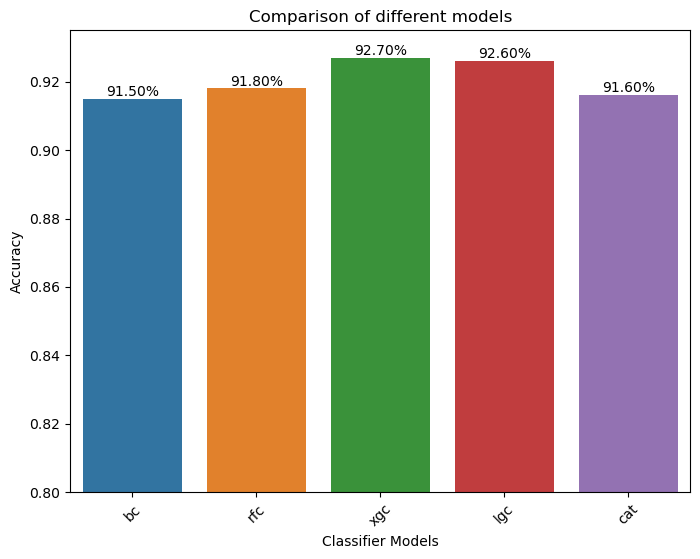

In [265]:
model_acc_bar_plot(model_acc_df_for_RFECV,.80,.935)

# Feature selection (FORWARD Technique)

In [266]:
forward=SequentialFeatureSelector(
                                xgc,
                                direction='forward',
                                scoring='accuracy',
                                cv=10,
                                n_jobs=-1).fit(X,y)

In [267]:
for_x_train=forward.transform(X)

In [268]:
list(forward.get_feature_names_out())

['Glucose', 'Insulin', 'BMI', 'Age']

In [269]:
for_x_train.shape

(1000, 4)

In [270]:
model_acc_arr=[]

for key,model in selected_model_for_SelectKBest.items():
    model_acc_arr.append(cross_val_mean_acc(model,for_x_train,y))
    
model_acc_df_for_Forward=create_datafram(model_acc_arr,selected_model_for_SelectKBest)

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 847
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 851
[LightG

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 851
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the o

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 845
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threa

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 681
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 681
[LightG

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 684
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threa

137:	learn: 0.2514329	total: 967ms	remaining: 6.04s
138:	learn: 0.2509039	total: 975ms	remaining: 6.04s
139:	learn: 0.2504685	total: 982ms	remaining: 6.03s
140:	learn: 0.2497648	total: 989ms	remaining: 6.02s
141:	learn: 0.2492062	total: 995ms	remaining: 6.01s
142:	learn: 0.2485579	total: 1s	remaining: 6s
143:	learn: 0.2474716	total: 1.01s	remaining: 6s
144:	learn: 0.2471042	total: 1.02s	remaining: 5.99s
145:	learn: 0.2467696	total: 1.02s	remaining: 5.99s
146:	learn: 0.2459585	total: 1.03s	remaining: 5.99s
147:	learn: 0.2454612	total: 1.04s	remaining: 5.98s
148:	learn: 0.2450384	total: 1.05s	remaining: 5.98s
149:	learn: 0.2442067	total: 1.05s	remaining: 5.97s
150:	learn: 0.2436093	total: 1.06s	remaining: 5.96s
151:	learn: 0.2432512	total: 1.07s	remaining: 5.96s
152:	learn: 0.2428439	total: 1.08s	remaining: 5.96s
153:	learn: 0.2421887	total: 1.08s	remaining: 5.95s
154:	learn: 0.2417131	total: 1.09s	remaining: 5.95s
155:	learn: 0.2412989	total: 1.1s	remaining: 5.95s
156:	learn: 0.2406954	

296:	learn: 0.1942533	total: 2.11s	remaining: 5s
297:	learn: 0.1940390	total: 2.12s	remaining: 5s
298:	learn: 0.1939405	total: 2.13s	remaining: 4.99s
299:	learn: 0.1937312	total: 2.14s	remaining: 4.99s
300:	learn: 0.1936115	total: 2.14s	remaining: 4.98s
301:	learn: 0.1933766	total: 2.15s	remaining: 4.97s
302:	learn: 0.1930401	total: 2.16s	remaining: 4.97s
303:	learn: 0.1928854	total: 2.17s	remaining: 4.96s
304:	learn: 0.1927244	total: 2.17s	remaining: 4.96s
305:	learn: 0.1925121	total: 2.18s	remaining: 4.95s
306:	learn: 0.1922793	total: 2.19s	remaining: 4.94s
307:	learn: 0.1921425	total: 2.19s	remaining: 4.93s
308:	learn: 0.1919931	total: 2.2s	remaining: 4.92s
309:	learn: 0.1917076	total: 2.21s	remaining: 4.92s
310:	learn: 0.1914352	total: 2.22s	remaining: 4.91s
311:	learn: 0.1912930	total: 2.22s	remaining: 4.9s
312:	learn: 0.1911446	total: 2.23s	remaining: 4.9s
313:	learn: 0.1909720	total: 2.24s	remaining: 4.89s
314:	learn: 0.1907793	total: 2.25s	remaining: 4.88s
315:	learn: 0.1905840

461:	learn: 0.1654862	total: 3.28s	remaining: 3.82s
462:	learn: 0.1653261	total: 3.29s	remaining: 3.81s
463:	learn: 0.1650926	total: 3.3s	remaining: 3.81s
464:	learn: 0.1649777	total: 3.3s	remaining: 3.8s
465:	learn: 0.1648219	total: 3.31s	remaining: 3.79s
466:	learn: 0.1644534	total: 3.32s	remaining: 3.79s
467:	learn: 0.1642446	total: 3.32s	remaining: 3.78s
468:	learn: 0.1641015	total: 3.33s	remaining: 3.77s
469:	learn: 0.1639483	total: 3.34s	remaining: 3.77s
470:	learn: 0.1637878	total: 3.35s	remaining: 3.76s
471:	learn: 0.1636753	total: 3.35s	remaining: 3.75s
472:	learn: 0.1635345	total: 3.36s	remaining: 3.74s
473:	learn: 0.1634641	total: 3.37s	remaining: 3.74s
474:	learn: 0.1633108	total: 3.38s	remaining: 3.73s
475:	learn: 0.1632502	total: 3.38s	remaining: 3.72s
476:	learn: 0.1630657	total: 3.39s	remaining: 3.72s
477:	learn: 0.1629121	total: 3.4s	remaining: 3.71s
478:	learn: 0.1628382	total: 3.4s	remaining: 3.7s
479:	learn: 0.1626951	total: 3.41s	remaining: 3.7s
480:	learn: 0.16254

630:	learn: 0.1419235	total: 4.49s	remaining: 2.62s
631:	learn: 0.1417898	total: 4.49s	remaining: 2.62s
632:	learn: 0.1417155	total: 4.5s	remaining: 2.61s
633:	learn: 0.1415141	total: 4.51s	remaining: 2.6s
634:	learn: 0.1413688	total: 4.52s	remaining: 2.6s
635:	learn: 0.1413158	total: 4.52s	remaining: 2.59s
636:	learn: 0.1411044	total: 4.53s	remaining: 2.58s
637:	learn: 0.1410081	total: 4.54s	remaining: 2.58s
638:	learn: 0.1409734	total: 4.55s	remaining: 2.57s
639:	learn: 0.1409364	total: 4.55s	remaining: 2.56s
640:	learn: 0.1408392	total: 4.56s	remaining: 2.55s
641:	learn: 0.1406783	total: 4.57s	remaining: 2.55s
642:	learn: 0.1406337	total: 4.58s	remaining: 2.54s
643:	learn: 0.1405527	total: 4.58s	remaining: 2.53s
644:	learn: 0.1404358	total: 4.59s	remaining: 2.53s
645:	learn: 0.1402788	total: 4.6s	remaining: 2.52s
646:	learn: 0.1402028	total: 4.61s	remaining: 2.51s
647:	learn: 0.1401181	total: 4.61s	remaining: 2.51s
648:	learn: 0.1399970	total: 4.62s	remaining: 2.5s
649:	learn: 0.139

798:	learn: 0.1225880	total: 5.66s	remaining: 1.42s
799:	learn: 0.1225309	total: 5.67s	remaining: 1.42s
800:	learn: 0.1222679	total: 5.67s	remaining: 1.41s
801:	learn: 0.1221394	total: 5.68s	remaining: 1.4s
802:	learn: 0.1221165	total: 5.68s	remaining: 1.39s
803:	learn: 0.1218604	total: 5.69s	remaining: 1.39s
804:	learn: 0.1216989	total: 5.7s	remaining: 1.38s
805:	learn: 0.1216099	total: 5.7s	remaining: 1.37s
806:	learn: 0.1215294	total: 5.71s	remaining: 1.36s
807:	learn: 0.1215147	total: 5.72s	remaining: 1.36s
808:	learn: 0.1213753	total: 5.72s	remaining: 1.35s
809:	learn: 0.1212936	total: 5.73s	remaining: 1.34s
810:	learn: 0.1212123	total: 5.74s	remaining: 1.34s
811:	learn: 0.1211176	total: 5.74s	remaining: 1.33s
812:	learn: 0.1210041	total: 5.75s	remaining: 1.32s
813:	learn: 0.1209891	total: 5.76s	remaining: 1.31s
814:	learn: 0.1209725	total: 5.76s	remaining: 1.31s
815:	learn: 0.1209448	total: 5.77s	remaining: 1.3s
816:	learn: 0.1208630	total: 5.78s	remaining: 1.29s
817:	learn: 0.12

964:	learn: 0.1075095	total: 6.87s	remaining: 249ms
965:	learn: 0.1074482	total: 6.88s	remaining: 242ms
966:	learn: 0.1073890	total: 6.88s	remaining: 235ms
967:	learn: 0.1073721	total: 6.89s	remaining: 228ms
968:	learn: 0.1073155	total: 6.9s	remaining: 221ms
969:	learn: 0.1071903	total: 6.91s	remaining: 214ms
970:	learn: 0.1071380	total: 6.91s	remaining: 206ms
971:	learn: 0.1070797	total: 6.92s	remaining: 199ms
972:	learn: 0.1070284	total: 6.92s	remaining: 192ms
973:	learn: 0.1069649	total: 6.93s	remaining: 185ms
974:	learn: 0.1068680	total: 6.94s	remaining: 178ms
975:	learn: 0.1067654	total: 6.94s	remaining: 171ms
976:	learn: 0.1067173	total: 6.95s	remaining: 164ms
977:	learn: 0.1066446	total: 6.96s	remaining: 156ms
978:	learn: 0.1065255	total: 6.96s	remaining: 149ms
979:	learn: 0.1063151	total: 6.97s	remaining: 142ms
980:	learn: 0.1062266	total: 6.98s	remaining: 135ms
981:	learn: 0.1061802	total: 6.98s	remaining: 128ms
982:	learn: 0.1061600	total: 6.99s	remaining: 121ms
983:	learn: 0

149:	learn: 0.2370023	total: 1.06s	remaining: 6.03s
150:	learn: 0.2364156	total: 1.07s	remaining: 6.03s
151:	learn: 0.2360031	total: 1.08s	remaining: 6.02s
152:	learn: 0.2356375	total: 1.08s	remaining: 6.01s
153:	learn: 0.2349807	total: 1.09s	remaining: 6s
154:	learn: 0.2345643	total: 1.1s	remaining: 5.98s
155:	learn: 0.2340490	total: 1.1s	remaining: 5.97s
156:	learn: 0.2335477	total: 1.11s	remaining: 5.96s
157:	learn: 0.2331079	total: 1.12s	remaining: 5.96s
158:	learn: 0.2326026	total: 1.12s	remaining: 5.95s
159:	learn: 0.2321685	total: 1.13s	remaining: 5.94s
160:	learn: 0.2318008	total: 1.14s	remaining: 5.93s
161:	learn: 0.2311486	total: 1.15s	remaining: 5.93s
162:	learn: 0.2304008	total: 1.15s	remaining: 5.92s
163:	learn: 0.2298982	total: 1.16s	remaining: 5.92s
164:	learn: 0.2293710	total: 1.17s	remaining: 5.91s
165:	learn: 0.2287520	total: 1.18s	remaining: 5.91s
166:	learn: 0.2281799	total: 1.18s	remaining: 5.91s
167:	learn: 0.2276829	total: 1.19s	remaining: 5.9s
168:	learn: 0.2274

309:	learn: 0.1858678	total: 2.22s	remaining: 4.95s
310:	learn: 0.1853638	total: 2.23s	remaining: 4.94s
311:	learn: 0.1852377	total: 2.24s	remaining: 4.93s
312:	learn: 0.1851089	total: 2.24s	remaining: 4.93s
313:	learn: 0.1850072	total: 2.25s	remaining: 4.92s
314:	learn: 0.1848494	total: 2.26s	remaining: 4.91s
315:	learn: 0.1844429	total: 2.27s	remaining: 4.91s
316:	learn: 0.1843900	total: 2.27s	remaining: 4.9s
317:	learn: 0.1841407	total: 2.28s	remaining: 4.89s
318:	learn: 0.1839514	total: 2.29s	remaining: 4.89s
319:	learn: 0.1837389	total: 2.3s	remaining: 4.88s
320:	learn: 0.1834095	total: 2.3s	remaining: 4.88s
321:	learn: 0.1832884	total: 2.31s	remaining: 4.87s
322:	learn: 0.1831244	total: 2.32s	remaining: 4.86s
323:	learn: 0.1829131	total: 2.33s	remaining: 4.85s
324:	learn: 0.1827644	total: 2.33s	remaining: 4.85s
325:	learn: 0.1825566	total: 2.34s	remaining: 4.84s
326:	learn: 0.1824690	total: 2.35s	remaining: 4.83s
327:	learn: 0.1823679	total: 2.35s	remaining: 4.83s
328:	learn: 0.1

478:	learn: 0.1570692	total: 3.39s	remaining: 3.69s
479:	learn: 0.1569883	total: 3.4s	remaining: 3.68s
480:	learn: 0.1568353	total: 3.41s	remaining: 3.68s
481:	learn: 0.1566337	total: 3.41s	remaining: 3.67s
482:	learn: 0.1565221	total: 3.42s	remaining: 3.66s
483:	learn: 0.1563650	total: 3.42s	remaining: 3.65s
484:	learn: 0.1561974	total: 3.43s	remaining: 3.64s
485:	learn: 0.1560653	total: 3.44s	remaining: 3.64s
486:	learn: 0.1559725	total: 3.45s	remaining: 3.63s
487:	learn: 0.1558606	total: 3.46s	remaining: 3.63s
488:	learn: 0.1557722	total: 3.46s	remaining: 3.62s
489:	learn: 0.1557277	total: 3.47s	remaining: 3.61s
490:	learn: 0.1556032	total: 3.48s	remaining: 3.6s
491:	learn: 0.1555380	total: 3.48s	remaining: 3.6s
492:	learn: 0.1553240	total: 3.49s	remaining: 3.59s
493:	learn: 0.1551836	total: 3.5s	remaining: 3.58s
494:	learn: 0.1550982	total: 3.51s	remaining: 3.58s
495:	learn: 0.1549619	total: 3.51s	remaining: 3.57s
496:	learn: 0.1548254	total: 3.52s	remaining: 3.56s
497:	learn: 0.15

647:	learn: 0.1356487	total: 4.59s	remaining: 2.49s
648:	learn: 0.1354871	total: 4.59s	remaining: 2.48s
649:	learn: 0.1352857	total: 4.6s	remaining: 2.48s
650:	learn: 0.1351802	total: 4.61s	remaining: 2.47s
651:	learn: 0.1351379	total: 4.61s	remaining: 2.46s
652:	learn: 0.1349987	total: 4.62s	remaining: 2.46s
653:	learn: 0.1349451	total: 4.63s	remaining: 2.45s
654:	learn: 0.1347762	total: 4.63s	remaining: 2.44s
655:	learn: 0.1347176	total: 4.64s	remaining: 2.43s
656:	learn: 0.1345447	total: 4.64s	remaining: 2.42s
657:	learn: 0.1345198	total: 4.65s	remaining: 2.42s
658:	learn: 0.1344258	total: 4.66s	remaining: 2.41s
659:	learn: 0.1343834	total: 4.66s	remaining: 2.4s
660:	learn: 0.1342608	total: 4.67s	remaining: 2.39s
661:	learn: 0.1342239	total: 4.67s	remaining: 2.39s
662:	learn: 0.1340981	total: 4.68s	remaining: 2.38s
663:	learn: 0.1339037	total: 4.69s	remaining: 2.37s
664:	learn: 0.1338223	total: 4.69s	remaining: 2.37s
665:	learn: 0.1337401	total: 4.7s	remaining: 2.36s
666:	learn: 0.1

814:	learn: 0.1188847	total: 5.75s	remaining: 1.31s
815:	learn: 0.1188072	total: 5.76s	remaining: 1.3s
816:	learn: 0.1186641	total: 5.77s	remaining: 1.29s
817:	learn: 0.1185802	total: 5.78s	remaining: 1.28s
818:	learn: 0.1184663	total: 5.78s	remaining: 1.28s
819:	learn: 0.1184279	total: 5.79s	remaining: 1.27s
820:	learn: 0.1183940	total: 5.8s	remaining: 1.26s
821:	learn: 0.1181944	total: 5.8s	remaining: 1.26s
822:	learn: 0.1181690	total: 5.81s	remaining: 1.25s
823:	learn: 0.1181057	total: 5.82s	remaining: 1.24s
824:	learn: 0.1179828	total: 5.82s	remaining: 1.24s
825:	learn: 0.1179578	total: 5.83s	remaining: 1.23s
826:	learn: 0.1178677	total: 5.83s	remaining: 1.22s
827:	learn: 0.1176391	total: 5.84s	remaining: 1.21s
828:	learn: 0.1174864	total: 5.85s	remaining: 1.21s
829:	learn: 0.1172330	total: 5.86s	remaining: 1.2s
830:	learn: 0.1172034	total: 5.86s	remaining: 1.19s
831:	learn: 0.1171256	total: 5.87s	remaining: 1.19s
832:	learn: 0.1170454	total: 5.88s	remaining: 1.18s
833:	learn: 0.11

980:	learn: 0.1058782	total: 6.94s	remaining: 134ms
981:	learn: 0.1056750	total: 6.95s	remaining: 127ms
982:	learn: 0.1055947	total: 6.96s	remaining: 120ms
983:	learn: 0.1055777	total: 6.96s	remaining: 113ms
984:	learn: 0.1054775	total: 6.97s	remaining: 106ms
985:	learn: 0.1053930	total: 6.98s	remaining: 99.1ms
986:	learn: 0.1053711	total: 6.98s	remaining: 92ms
987:	learn: 0.1052687	total: 6.99s	remaining: 84.9ms
988:	learn: 0.1052315	total: 7s	remaining: 77.8ms
989:	learn: 0.1050971	total: 7s	remaining: 70.8ms
990:	learn: 0.1049736	total: 7.01s	remaining: 63.7ms
991:	learn: 0.1049125	total: 7.02s	remaining: 56.6ms
992:	learn: 0.1049003	total: 7.03s	remaining: 49.5ms
993:	learn: 0.1048045	total: 7.03s	remaining: 42.5ms
994:	learn: 0.1047691	total: 7.04s	remaining: 35.4ms
995:	learn: 0.1047093	total: 7.05s	remaining: 28.3ms
996:	learn: 0.1046949	total: 7.06s	remaining: 21.2ms
997:	learn: 0.1045712	total: 7.07s	remaining: 14.2ms
998:	learn: 0.1044678	total: 7.07s	remaining: 7.08ms
999:	l

161:	learn: 0.2333375	total: 1.14s	remaining: 5.9s
162:	learn: 0.2327073	total: 1.15s	remaining: 5.89s
163:	learn: 0.2321538	total: 1.15s	remaining: 5.88s
164:	learn: 0.2313273	total: 1.16s	remaining: 5.87s
165:	learn: 0.2307226	total: 1.17s	remaining: 5.86s
166:	learn: 0.2302180	total: 1.17s	remaining: 5.84s
167:	learn: 0.2297861	total: 1.18s	remaining: 5.84s
168:	learn: 0.2294279	total: 1.19s	remaining: 5.83s
169:	learn: 0.2289341	total: 1.19s	remaining: 5.83s
170:	learn: 0.2285427	total: 1.2s	remaining: 5.82s
171:	learn: 0.2280510	total: 1.21s	remaining: 5.8s
172:	learn: 0.2276830	total: 1.21s	remaining: 5.8s
173:	learn: 0.2271031	total: 1.22s	remaining: 5.79s
174:	learn: 0.2266435	total: 1.23s	remaining: 5.78s
175:	learn: 0.2261915	total: 1.23s	remaining: 5.78s
176:	learn: 0.2259238	total: 1.24s	remaining: 5.76s
177:	learn: 0.2254751	total: 1.25s	remaining: 5.75s
178:	learn: 0.2250484	total: 1.25s	remaining: 5.75s
179:	learn: 0.2247115	total: 1.26s	remaining: 5.73s
180:	learn: 0.22

320:	learn: 0.1843001	total: 2.28s	remaining: 4.82s
321:	learn: 0.1840744	total: 2.29s	remaining: 4.82s
322:	learn: 0.1838907	total: 2.3s	remaining: 4.81s
323:	learn: 0.1837830	total: 2.3s	remaining: 4.81s
324:	learn: 0.1835996	total: 2.31s	remaining: 4.8s
325:	learn: 0.1834022	total: 2.32s	remaining: 4.79s
326:	learn: 0.1832465	total: 2.33s	remaining: 4.79s
327:	learn: 0.1829926	total: 2.33s	remaining: 4.78s
328:	learn: 0.1827415	total: 2.34s	remaining: 4.78s
329:	learn: 0.1824897	total: 2.35s	remaining: 4.77s
330:	learn: 0.1822875	total: 2.36s	remaining: 4.76s
331:	learn: 0.1819816	total: 2.37s	remaining: 4.76s
332:	learn: 0.1818472	total: 2.37s	remaining: 4.75s
333:	learn: 0.1817030	total: 2.38s	remaining: 4.75s
334:	learn: 0.1816088	total: 2.39s	remaining: 4.74s
335:	learn: 0.1814111	total: 2.39s	remaining: 4.73s
336:	learn: 0.1811900	total: 2.4s	remaining: 4.72s
337:	learn: 0.1809112	total: 2.41s	remaining: 4.72s
338:	learn: 0.1806134	total: 2.42s	remaining: 4.71s
339:	learn: 0.18

505:	learn: 0.1521190	total: 3.62s	remaining: 3.53s
506:	learn: 0.1520055	total: 3.62s	remaining: 3.52s
507:	learn: 0.1519133	total: 3.63s	remaining: 3.51s
508:	learn: 0.1517502	total: 3.63s	remaining: 3.5s
509:	learn: 0.1516624	total: 3.64s	remaining: 3.5s
510:	learn: 0.1515424	total: 3.65s	remaining: 3.49s
511:	learn: 0.1513377	total: 3.66s	remaining: 3.48s
512:	learn: 0.1512610	total: 3.66s	remaining: 3.48s
513:	learn: 0.1511063	total: 3.67s	remaining: 3.47s
514:	learn: 0.1509702	total: 3.68s	remaining: 3.46s
515:	learn: 0.1508425	total: 3.68s	remaining: 3.46s
516:	learn: 0.1506866	total: 3.69s	remaining: 3.45s
517:	learn: 0.1505612	total: 3.7s	remaining: 3.44s
518:	learn: 0.1502853	total: 3.71s	remaining: 3.43s
519:	learn: 0.1501512	total: 3.71s	remaining: 3.43s
520:	learn: 0.1499718	total: 3.72s	remaining: 3.42s
521:	learn: 0.1498319	total: 3.72s	remaining: 3.41s
522:	learn: 0.1497495	total: 3.73s	remaining: 3.4s
523:	learn: 0.1495799	total: 3.74s	remaining: 3.4s
524:	learn: 0.149

673:	learn: 0.1294457	total: 4.79s	remaining: 2.32s
674:	learn: 0.1292863	total: 4.8s	remaining: 2.31s
675:	learn: 0.1292183	total: 4.81s	remaining: 2.3s
676:	learn: 0.1291438	total: 4.81s	remaining: 2.3s
677:	learn: 0.1289760	total: 4.82s	remaining: 2.29s
678:	learn: 0.1289560	total: 4.82s	remaining: 2.28s
679:	learn: 0.1289328	total: 4.83s	remaining: 2.27s
680:	learn: 0.1287889	total: 4.84s	remaining: 2.27s
681:	learn: 0.1287455	total: 4.84s	remaining: 2.26s
682:	learn: 0.1286388	total: 4.85s	remaining: 2.25s
683:	learn: 0.1285007	total: 4.86s	remaining: 2.25s
684:	learn: 0.1284016	total: 4.87s	remaining: 2.24s
685:	learn: 0.1282458	total: 4.87s	remaining: 2.23s
686:	learn: 0.1280780	total: 4.88s	remaining: 2.22s
687:	learn: 0.1280185	total: 4.89s	remaining: 2.22s
688:	learn: 0.1279265	total: 4.89s	remaining: 2.21s
689:	learn: 0.1278910	total: 4.9s	remaining: 2.2s
690:	learn: 0.1277349	total: 4.91s	remaining: 2.19s
691:	learn: 0.1275887	total: 4.91s	remaining: 2.19s
692:	learn: 0.127

839:	learn: 0.1102609	total: 5.99s	remaining: 1.14s
840:	learn: 0.1101338	total: 6s	remaining: 1.14s
841:	learn: 0.1100270	total: 6.01s	remaining: 1.13s
842:	learn: 0.1099469	total: 6.02s	remaining: 1.12s
843:	learn: 0.1099181	total: 6.03s	remaining: 1.11s
844:	learn: 0.1098572	total: 6.03s	remaining: 1.11s
845:	learn: 0.1096016	total: 6.04s	remaining: 1.1s
846:	learn: 0.1095364	total: 6.05s	remaining: 1.09s
847:	learn: 0.1094624	total: 6.05s	remaining: 1.08s
848:	learn: 0.1093112	total: 6.06s	remaining: 1.08s
849:	learn: 0.1092405	total: 6.07s	remaining: 1.07s
850:	learn: 0.1092027	total: 6.08s	remaining: 1.06s
851:	learn: 0.1090915	total: 6.08s	remaining: 1.06s
852:	learn: 0.1090379	total: 6.09s	remaining: 1.05s
853:	learn: 0.1089896	total: 6.09s	remaining: 1.04s
854:	learn: 0.1089452	total: 6.11s	remaining: 1.03s
855:	learn: 0.1088283	total: 6.12s	remaining: 1.03s
856:	learn: 0.1087306	total: 6.13s	remaining: 1.02s
857:	learn: 0.1085786	total: 6.13s	remaining: 1.01s
858:	learn: 0.10

Learning rate set to 0.009849
0:	learn: 0.6814090	total: 8.57ms	remaining: 8.56s
1:	learn: 0.6724550	total: 16.4ms	remaining: 8.17s
2:	learn: 0.6628244	total: 24.1ms	remaining: 8.03s
3:	learn: 0.6527327	total: 33.2ms	remaining: 8.27s
4:	learn: 0.6422827	total: 40.7ms	remaining: 8.1s
5:	learn: 0.6339265	total: 49.4ms	remaining: 8.19s
6:	learn: 0.6261603	total: 55.6ms	remaining: 7.89s
7:	learn: 0.6165473	total: 64.3ms	remaining: 7.98s
8:	learn: 0.6066201	total: 72.1ms	remaining: 7.94s
9:	learn: 0.5971625	total: 80.2ms	remaining: 7.93s
10:	learn: 0.5879647	total: 87.4ms	remaining: 7.86s
11:	learn: 0.5813397	total: 95.9ms	remaining: 7.9s
12:	learn: 0.5733131	total: 102ms	remaining: 7.75s
13:	learn: 0.5657284	total: 108ms	remaining: 7.63s
14:	learn: 0.5570054	total: 116ms	remaining: 7.65s
15:	learn: 0.5499406	total: 124ms	remaining: 7.64s
16:	learn: 0.5439626	total: 133ms	remaining: 7.66s
17:	learn: 0.5370286	total: 141ms	remaining: 7.7s
18:	learn: 0.5288189	total: 150ms	remaining: 7.73s
19

162:	learn: 0.2281236	total: 1.19s	remaining: 6.11s
163:	learn: 0.2276556	total: 1.2s	remaining: 6.1s
164:	learn: 0.2270317	total: 1.2s	remaining: 6.09s
165:	learn: 0.2265063	total: 1.21s	remaining: 6.08s
166:	learn: 0.2260978	total: 1.22s	remaining: 6.06s
167:	learn: 0.2256620	total: 1.22s	remaining: 6.05s
168:	learn: 0.2252730	total: 1.23s	remaining: 6.03s
169:	learn: 0.2248452	total: 1.23s	remaining: 6.02s
170:	learn: 0.2245369	total: 1.24s	remaining: 6.02s
171:	learn: 0.2240386	total: 1.25s	remaining: 6.01s
172:	learn: 0.2237160	total: 1.25s	remaining: 6s
173:	learn: 0.2232435	total: 1.26s	remaining: 5.99s
174:	learn: 0.2224634	total: 1.27s	remaining: 5.98s
175:	learn: 0.2217493	total: 1.28s	remaining: 5.98s
176:	learn: 0.2214606	total: 1.28s	remaining: 5.96s
177:	learn: 0.2208679	total: 1.29s	remaining: 5.96s
178:	learn: 0.2205336	total: 1.3s	remaining: 5.95s
179:	learn: 0.2202175	total: 1.3s	remaining: 5.94s
180:	learn: 0.2196908	total: 1.31s	remaining: 5.93s
181:	learn: 0.219327

324:	learn: 0.1802702	total: 2.36s	remaining: 4.9s
325:	learn: 0.1802059	total: 2.37s	remaining: 4.9s
326:	learn: 0.1799692	total: 2.38s	remaining: 4.89s
327:	learn: 0.1797761	total: 2.38s	remaining: 4.88s
328:	learn: 0.1795924	total: 2.39s	remaining: 4.88s
329:	learn: 0.1793745	total: 2.4s	remaining: 4.87s
330:	learn: 0.1791841	total: 2.41s	remaining: 4.86s
331:	learn: 0.1789512	total: 2.41s	remaining: 4.86s
332:	learn: 0.1787446	total: 2.42s	remaining: 4.85s
333:	learn: 0.1786331	total: 2.43s	remaining: 4.84s
334:	learn: 0.1782773	total: 2.44s	remaining: 4.84s
335:	learn: 0.1780513	total: 2.44s	remaining: 4.83s
336:	learn: 0.1778458	total: 2.45s	remaining: 4.82s
337:	learn: 0.1777342	total: 2.45s	remaining: 4.81s
338:	learn: 0.1775739	total: 2.46s	remaining: 4.8s
339:	learn: 0.1773277	total: 2.47s	remaining: 4.79s
340:	learn: 0.1771111	total: 2.48s	remaining: 4.79s
341:	learn: 0.1769419	total: 2.48s	remaining: 4.78s
342:	learn: 0.1766617	total: 2.49s	remaining: 4.77s
343:	learn: 0.17

487:	learn: 0.1558543	total: 3.52s	remaining: 3.7s
488:	learn: 0.1558156	total: 3.53s	remaining: 3.69s
489:	learn: 0.1556817	total: 3.54s	remaining: 3.68s
490:	learn: 0.1555718	total: 3.54s	remaining: 3.67s
491:	learn: 0.1553223	total: 3.55s	remaining: 3.67s
492:	learn: 0.1552550	total: 3.56s	remaining: 3.66s
493:	learn: 0.1550434	total: 3.56s	remaining: 3.65s
494:	learn: 0.1549621	total: 3.57s	remaining: 3.65s
495:	learn: 0.1548248	total: 3.58s	remaining: 3.64s
496:	learn: 0.1546524	total: 3.59s	remaining: 3.63s
497:	learn: 0.1544921	total: 3.59s	remaining: 3.62s
498:	learn: 0.1544243	total: 3.6s	remaining: 3.62s
499:	learn: 0.1542903	total: 3.61s	remaining: 3.61s
500:	learn: 0.1541388	total: 3.61s	remaining: 3.6s
501:	learn: 0.1540039	total: 3.62s	remaining: 3.59s
502:	learn: 0.1537624	total: 3.63s	remaining: 3.59s
503:	learn: 0.1535531	total: 3.64s	remaining: 3.58s
504:	learn: 0.1534044	total: 3.64s	remaining: 3.57s
505:	learn: 0.1532349	total: 3.65s	remaining: 3.57s
506:	learn: 0.1

653:	learn: 0.1352192	total: 4.71s	remaining: 2.49s
654:	learn: 0.1351333	total: 4.71s	remaining: 2.48s
655:	learn: 0.1349502	total: 4.72s	remaining: 2.48s
656:	learn: 0.1348787	total: 4.73s	remaining: 2.47s
657:	learn: 0.1347175	total: 4.74s	remaining: 2.46s
658:	learn: 0.1345974	total: 4.74s	remaining: 2.45s
659:	learn: 0.1345020	total: 4.75s	remaining: 2.45s
660:	learn: 0.1344641	total: 4.76s	remaining: 2.44s
661:	learn: 0.1344126	total: 4.76s	remaining: 2.43s
662:	learn: 0.1343414	total: 4.77s	remaining: 2.42s
663:	learn: 0.1342806	total: 4.78s	remaining: 2.42s
664:	learn: 0.1341603	total: 4.78s	remaining: 2.41s
665:	learn: 0.1340632	total: 4.79s	remaining: 2.4s
666:	learn: 0.1340130	total: 4.8s	remaining: 2.39s
667:	learn: 0.1338622	total: 4.8s	remaining: 2.39s
668:	learn: 0.1337495	total: 4.81s	remaining: 2.38s
669:	learn: 0.1336650	total: 4.81s	remaining: 2.37s
670:	learn: 0.1333431	total: 4.82s	remaining: 2.36s
671:	learn: 0.1332396	total: 4.83s	remaining: 2.36s
672:	learn: 0.1

816:	learn: 0.1182320	total: 5.88s	remaining: 1.32s
817:	learn: 0.1181788	total: 5.89s	remaining: 1.31s
818:	learn: 0.1180547	total: 5.89s	remaining: 1.3s
819:	learn: 0.1179020	total: 5.9s	remaining: 1.29s
820:	learn: 0.1176617	total: 5.91s	remaining: 1.29s
821:	learn: 0.1176500	total: 5.92s	remaining: 1.28s
822:	learn: 0.1175624	total: 5.92s	remaining: 1.27s
823:	learn: 0.1175032	total: 5.93s	remaining: 1.27s
824:	learn: 0.1174374	total: 5.94s	remaining: 1.26s
825:	learn: 0.1173223	total: 5.94s	remaining: 1.25s
826:	learn: 0.1171673	total: 5.95s	remaining: 1.24s
827:	learn: 0.1171399	total: 5.96s	remaining: 1.24s
828:	learn: 0.1169524	total: 5.96s	remaining: 1.23s
829:	learn: 0.1168703	total: 5.97s	remaining: 1.22s
830:	learn: 0.1168237	total: 5.98s	remaining: 1.22s
831:	learn: 0.1166440	total: 5.98s	remaining: 1.21s
832:	learn: 0.1166078	total: 5.99s	remaining: 1.2s
833:	learn: 0.1165299	total: 6s	remaining: 1.19s
834:	learn: 0.1162837	total: 6s	remaining: 1.19s
835:	learn: 0.1162273

981:	learn: 0.1037091	total: 7.05s	remaining: 129ms
982:	learn: 0.1036242	total: 7.06s	remaining: 122ms
983:	learn: 0.1034900	total: 7.07s	remaining: 115ms
984:	learn: 0.1034378	total: 7.07s	remaining: 108ms
985:	learn: 0.1033999	total: 7.08s	remaining: 101ms
986:	learn: 0.1033157	total: 7.09s	remaining: 93.4ms
987:	learn: 0.1031974	total: 7.09s	remaining: 86.2ms
988:	learn: 0.1029552	total: 7.1s	remaining: 79ms
989:	learn: 0.1029130	total: 7.11s	remaining: 71.8ms
990:	learn: 0.1028830	total: 7.11s	remaining: 64.6ms
991:	learn: 0.1028551	total: 7.12s	remaining: 57.4ms
992:	learn: 0.1028070	total: 7.13s	remaining: 50.2ms
993:	learn: 0.1027606	total: 7.13s	remaining: 43.1ms
994:	learn: 0.1027165	total: 7.14s	remaining: 35.9ms
995:	learn: 0.1026923	total: 7.15s	remaining: 28.7ms
996:	learn: 0.1025771	total: 7.15s	remaining: 21.5ms
997:	learn: 0.1025391	total: 7.16s	remaining: 14.3ms
998:	learn: 0.1024369	total: 7.17s	remaining: 7.17ms
999:	learn: 0.1023670	total: 7.17s	remaining: 0us
Lear

161:	learn: 0.2416654	total: 1.18s	remaining: 6.11s
162:	learn: 0.2411678	total: 1.19s	remaining: 6.11s
163:	learn: 0.2408811	total: 1.2s	remaining: 6.1s
164:	learn: 0.2403903	total: 1.2s	remaining: 6.09s
165:	learn: 0.2399510	total: 1.21s	remaining: 6.07s
166:	learn: 0.2396603	total: 1.21s	remaining: 6.06s
167:	learn: 0.2389957	total: 1.22s	remaining: 6.05s
168:	learn: 0.2386885	total: 1.23s	remaining: 6.04s
169:	learn: 0.2382993	total: 1.23s	remaining: 6.02s
170:	learn: 0.2378685	total: 1.24s	remaining: 6.01s
171:	learn: 0.2374765	total: 1.25s	remaining: 6s
172:	learn: 0.2372608	total: 1.25s	remaining: 5.99s
173:	learn: 0.2368054	total: 1.26s	remaining: 5.98s
174:	learn: 0.2361526	total: 1.26s	remaining: 5.96s
175:	learn: 0.2353156	total: 1.27s	remaining: 5.95s
176:	learn: 0.2348377	total: 1.28s	remaining: 5.94s
177:	learn: 0.2344378	total: 1.28s	remaining: 5.92s
178:	learn: 0.2340389	total: 1.29s	remaining: 5.92s
179:	learn: 0.2337222	total: 1.29s	remaining: 5.9s
180:	learn: 0.23310

330:	learn: 0.1916505	total: 2.36s	remaining: 4.77s
331:	learn: 0.1915161	total: 2.37s	remaining: 4.77s
332:	learn: 0.1913133	total: 2.38s	remaining: 4.76s
333:	learn: 0.1910833	total: 2.38s	remaining: 4.75s
334:	learn: 0.1909743	total: 2.39s	remaining: 4.74s
335:	learn: 0.1906755	total: 2.39s	remaining: 4.73s
336:	learn: 0.1904046	total: 2.4s	remaining: 4.72s
337:	learn: 0.1903447	total: 2.41s	remaining: 4.72s
338:	learn: 0.1902271	total: 2.42s	remaining: 4.71s
339:	learn: 0.1900376	total: 2.42s	remaining: 4.71s
340:	learn: 0.1899490	total: 2.43s	remaining: 4.7s
341:	learn: 0.1897042	total: 2.44s	remaining: 4.69s
342:	learn: 0.1895816	total: 2.45s	remaining: 4.69s
343:	learn: 0.1892530	total: 2.45s	remaining: 4.68s
344:	learn: 0.1890544	total: 2.46s	remaining: 4.67s
345:	learn: 0.1888427	total: 2.47s	remaining: 4.67s
346:	learn: 0.1887588	total: 2.48s	remaining: 4.66s
347:	learn: 0.1884772	total: 2.48s	remaining: 4.65s
348:	learn: 0.1882692	total: 2.49s	remaining: 4.65s
349:	learn: 0.

497:	learn: 0.1642857	total: 3.53s	remaining: 3.56s
498:	learn: 0.1642163	total: 3.54s	remaining: 3.56s
499:	learn: 0.1640258	total: 3.55s	remaining: 3.55s
500:	learn: 0.1639383	total: 3.56s	remaining: 3.54s
501:	learn: 0.1637153	total: 3.56s	remaining: 3.53s
502:	learn: 0.1636342	total: 3.57s	remaining: 3.53s
503:	learn: 0.1634437	total: 3.58s	remaining: 3.52s
504:	learn: 0.1632848	total: 3.58s	remaining: 3.51s
505:	learn: 0.1631181	total: 3.59s	remaining: 3.5s
506:	learn: 0.1629803	total: 3.59s	remaining: 3.49s
507:	learn: 0.1625853	total: 3.6s	remaining: 3.49s
508:	learn: 0.1624227	total: 3.61s	remaining: 3.48s
509:	learn: 0.1622716	total: 3.61s	remaining: 3.47s
510:	learn: 0.1621955	total: 3.62s	remaining: 3.46s
511:	learn: 0.1620537	total: 3.63s	remaining: 3.46s
512:	learn: 0.1618482	total: 3.64s	remaining: 3.45s
513:	learn: 0.1617867	total: 3.64s	remaining: 3.44s
514:	learn: 0.1616198	total: 3.65s	remaining: 3.44s
515:	learn: 0.1615066	total: 3.66s	remaining: 3.43s
516:	learn: 0.

668:	learn: 0.1416970	total: 4.74s	remaining: 2.35s
669:	learn: 0.1413615	total: 4.75s	remaining: 2.34s
670:	learn: 0.1413203	total: 4.75s	remaining: 2.33s
671:	learn: 0.1410868	total: 4.76s	remaining: 2.32s
672:	learn: 0.1409355	total: 4.77s	remaining: 2.32s
673:	learn: 0.1409018	total: 4.78s	remaining: 2.31s
674:	learn: 0.1408089	total: 4.78s	remaining: 2.3s
675:	learn: 0.1406203	total: 4.79s	remaining: 2.3s
676:	learn: 0.1405010	total: 4.8s	remaining: 2.29s
677:	learn: 0.1404723	total: 4.8s	remaining: 2.28s
678:	learn: 0.1403530	total: 4.81s	remaining: 2.27s
679:	learn: 0.1400894	total: 4.82s	remaining: 2.27s
680:	learn: 0.1397916	total: 4.82s	remaining: 2.26s
681:	learn: 0.1396239	total: 4.83s	remaining: 2.25s
682:	learn: 0.1394308	total: 4.84s	remaining: 2.25s
683:	learn: 0.1392911	total: 4.84s	remaining: 2.24s
684:	learn: 0.1391764	total: 4.85s	remaining: 2.23s
685:	learn: 0.1390513	total: 4.86s	remaining: 2.22s
686:	learn: 0.1390113	total: 4.87s	remaining: 2.22s
687:	learn: 0.13

836:	learn: 0.1231704	total: 5.94s	remaining: 1.16s
837:	learn: 0.1230636	total: 5.95s	remaining: 1.15s
838:	learn: 0.1230342	total: 5.95s	remaining: 1.14s
839:	learn: 0.1229655	total: 5.96s	remaining: 1.14s
840:	learn: 0.1229478	total: 5.97s	remaining: 1.13s
841:	learn: 0.1228633	total: 5.97s	remaining: 1.12s
842:	learn: 0.1228221	total: 5.98s	remaining: 1.11s
843:	learn: 0.1227689	total: 5.99s	remaining: 1.11s
844:	learn: 0.1226705	total: 6s	remaining: 1.1s
845:	learn: 0.1224825	total: 6s	remaining: 1.09s
846:	learn: 0.1223717	total: 6.01s	remaining: 1.08s
847:	learn: 0.1221643	total: 6.02s	remaining: 1.08s
848:	learn: 0.1220107	total: 6.02s	remaining: 1.07s
849:	learn: 0.1219438	total: 6.03s	remaining: 1.06s
850:	learn: 0.1218663	total: 6.04s	remaining: 1.06s
851:	learn: 0.1218474	total: 6.04s	remaining: 1.05s
852:	learn: 0.1217058	total: 6.05s	remaining: 1.04s
853:	learn: 0.1215774	total: 6.06s	remaining: 1.04s
854:	learn: 0.1214906	total: 6.07s	remaining: 1.03s
855:	learn: 0.12142

Learning rate set to 0.009849
0:	learn: 0.6817839	total: 7.54ms	remaining: 7.53s
1:	learn: 0.6714001	total: 14.8ms	remaining: 7.38s
2:	learn: 0.6607384	total: 23.1ms	remaining: 7.67s
3:	learn: 0.6516553	total: 30.6ms	remaining: 7.62s
4:	learn: 0.6409163	total: 38ms	remaining: 7.57s
5:	learn: 0.6328090	total: 45.7ms	remaining: 7.57s
6:	learn: 0.6231627	total: 51.8ms	remaining: 7.35s
7:	learn: 0.6147378	total: 59.1ms	remaining: 7.33s
8:	learn: 0.6073566	total: 65.3ms	remaining: 7.19s
9:	learn: 0.5989277	total: 72.6ms	remaining: 7.19s
10:	learn: 0.5916641	total: 81.1ms	remaining: 7.29s
11:	learn: 0.5825857	total: 87.4ms	remaining: 7.19s
12:	learn: 0.5752511	total: 94.7ms	remaining: 7.19s
13:	learn: 0.5682914	total: 102ms	remaining: 7.15s
14:	learn: 0.5603071	total: 110ms	remaining: 7.24s
15:	learn: 0.5541801	total: 117ms	remaining: 7.18s
16:	learn: 0.5474684	total: 124ms	remaining: 7.17s
17:	learn: 0.5418094	total: 132ms	remaining: 7.19s
18:	learn: 0.5343900	total: 139ms	remaining: 7.19s


160:	learn: 0.2372354	total: 1.15s	remaining: 6s
161:	learn: 0.2369304	total: 1.16s	remaining: 5.99s
162:	learn: 0.2363413	total: 1.17s	remaining: 5.99s
163:	learn: 0.2358117	total: 1.17s	remaining: 5.98s
164:	learn: 0.2352809	total: 1.18s	remaining: 5.97s
165:	learn: 0.2348174	total: 1.19s	remaining: 5.97s
166:	learn: 0.2344230	total: 1.2s	remaining: 5.96s
167:	learn: 0.2339885	total: 1.2s	remaining: 5.96s
168:	learn: 0.2336516	total: 1.21s	remaining: 5.95s
169:	learn: 0.2331858	total: 1.22s	remaining: 5.95s
170:	learn: 0.2326902	total: 1.23s	remaining: 5.94s
171:	learn: 0.2322496	total: 1.23s	remaining: 5.93s
172:	learn: 0.2319782	total: 1.24s	remaining: 5.92s
173:	learn: 0.2315310	total: 1.25s	remaining: 5.91s
174:	learn: 0.2310629	total: 1.25s	remaining: 5.9s
175:	learn: 0.2303375	total: 1.26s	remaining: 5.89s
176:	learn: 0.2298119	total: 1.27s	remaining: 5.89s
177:	learn: 0.2294750	total: 1.27s	remaining: 5.88s
178:	learn: 0.2291217	total: 1.28s	remaining: 5.87s
179:	learn: 0.2288

329:	learn: 0.1876421	total: 2.35s	remaining: 4.77s
330:	learn: 0.1873551	total: 2.36s	remaining: 4.77s
331:	learn: 0.1870733	total: 2.37s	remaining: 4.76s
332:	learn: 0.1868544	total: 2.37s	remaining: 4.75s
333:	learn: 0.1866959	total: 2.38s	remaining: 4.74s
334:	learn: 0.1865406	total: 2.38s	remaining: 4.74s
335:	learn: 0.1862703	total: 2.39s	remaining: 4.73s
336:	learn: 0.1862041	total: 2.4s	remaining: 4.72s
337:	learn: 0.1859803	total: 2.41s	remaining: 4.72s
338:	learn: 0.1857832	total: 2.42s	remaining: 4.71s
339:	learn: 0.1856023	total: 2.42s	remaining: 4.7s
340:	learn: 0.1854469	total: 2.43s	remaining: 4.7s
341:	learn: 0.1853062	total: 2.44s	remaining: 4.69s
342:	learn: 0.1852312	total: 2.45s	remaining: 4.69s
343:	learn: 0.1851133	total: 2.45s	remaining: 4.68s
344:	learn: 0.1849627	total: 2.46s	remaining: 4.67s
345:	learn: 0.1848041	total: 2.47s	remaining: 4.67s
346:	learn: 0.1845325	total: 2.48s	remaining: 4.66s
347:	learn: 0.1843756	total: 2.48s	remaining: 4.65s
348:	learn: 0.1

497:	learn: 0.1596725	total: 3.53s	remaining: 3.56s
498:	learn: 0.1593355	total: 3.54s	remaining: 3.56s
499:	learn: 0.1591974	total: 3.55s	remaining: 3.55s
500:	learn: 0.1591035	total: 3.55s	remaining: 3.54s
501:	learn: 0.1590440	total: 3.56s	remaining: 3.53s
502:	learn: 0.1589222	total: 3.57s	remaining: 3.52s
503:	learn: 0.1587677	total: 3.57s	remaining: 3.52s
504:	learn: 0.1586515	total: 3.58s	remaining: 3.51s
505:	learn: 0.1584954	total: 3.59s	remaining: 3.5s
506:	learn: 0.1583431	total: 3.6s	remaining: 3.5s
507:	learn: 0.1581867	total: 3.6s	remaining: 3.49s
508:	learn: 0.1580634	total: 3.61s	remaining: 3.48s
509:	learn: 0.1579002	total: 3.62s	remaining: 3.47s
510:	learn: 0.1577719	total: 3.62s	remaining: 3.47s
511:	learn: 0.1576306	total: 3.63s	remaining: 3.46s
512:	learn: 0.1574457	total: 3.64s	remaining: 3.45s
513:	learn: 0.1573564	total: 3.64s	remaining: 3.44s
514:	learn: 0.1572439	total: 3.65s	remaining: 3.44s
515:	learn: 0.1571108	total: 3.65s	remaining: 3.43s
516:	learn: 0.15

666:	learn: 0.1372556	total: 4.72s	remaining: 2.36s
667:	learn: 0.1371686	total: 4.73s	remaining: 2.35s
668:	learn: 0.1369903	total: 4.74s	remaining: 2.34s
669:	learn: 0.1369651	total: 4.74s	remaining: 2.33s
670:	learn: 0.1368348	total: 4.75s	remaining: 2.33s
671:	learn: 0.1366545	total: 4.75s	remaining: 2.32s
672:	learn: 0.1365225	total: 4.76s	remaining: 2.31s
673:	learn: 0.1364733	total: 4.77s	remaining: 2.31s
674:	learn: 0.1363515	total: 4.78s	remaining: 2.3s
675:	learn: 0.1362628	total: 4.78s	remaining: 2.29s
676:	learn: 0.1361602	total: 4.79s	remaining: 2.29s
677:	learn: 0.1360303	total: 4.8s	remaining: 2.28s
678:	learn: 0.1359067	total: 4.8s	remaining: 2.27s
679:	learn: 0.1357833	total: 4.81s	remaining: 2.26s
680:	learn: 0.1355360	total: 4.82s	remaining: 2.26s
681:	learn: 0.1352637	total: 4.83s	remaining: 2.25s
682:	learn: 0.1350554	total: 4.83s	remaining: 2.24s
683:	learn: 0.1349409	total: 4.84s	remaining: 2.23s
684:	learn: 0.1348238	total: 4.85s	remaining: 2.23s
685:	learn: 0.1

837:	learn: 0.1184890	total: 5.9s	remaining: 1.14s
838:	learn: 0.1184500	total: 5.9s	remaining: 1.13s
839:	learn: 0.1183115	total: 5.91s	remaining: 1.13s
840:	learn: 0.1182832	total: 5.92s	remaining: 1.12s
841:	learn: 0.1182470	total: 5.92s	remaining: 1.11s
842:	learn: 0.1182209	total: 5.93s	remaining: 1.1s
843:	learn: 0.1180582	total: 5.94s	remaining: 1.1s
844:	learn: 0.1179367	total: 5.95s	remaining: 1.09s
845:	learn: 0.1178956	total: 5.95s	remaining: 1.08s
846:	learn: 0.1178177	total: 5.96s	remaining: 1.08s
847:	learn: 0.1177729	total: 5.97s	remaining: 1.07s
848:	learn: 0.1176180	total: 5.97s	remaining: 1.06s
849:	learn: 0.1175881	total: 5.98s	remaining: 1.05s
850:	learn: 0.1175614	total: 5.99s	remaining: 1.05s
851:	learn: 0.1174664	total: 5.99s	remaining: 1.04s
852:	learn: 0.1173856	total: 6s	remaining: 1.03s
853:	learn: 0.1173006	total: 6s	remaining: 1.03s
854:	learn: 0.1171741	total: 6.01s	remaining: 1.02s
855:	learn: 0.1169681	total: 6.02s	remaining: 1.01s
856:	learn: 0.1169261	

998:	learn: 0.1041785	total: 7.04s	remaining: 7.05ms
999:	learn: 0.1039941	total: 7.05s	remaining: 0us
Learning rate set to 0.009849
0:	learn: 0.6820359	total: 8.92ms	remaining: 8.91s
1:	learn: 0.6732201	total: 17.2ms	remaining: 8.59s
2:	learn: 0.6628180	total: 25.1ms	remaining: 8.35s
3:	learn: 0.6536776	total: 33.6ms	remaining: 8.37s
4:	learn: 0.6430332	total: 40.8ms	remaining: 8.11s
5:	learn: 0.6339130	total: 48.2ms	remaining: 7.99s
6:	learn: 0.6270169	total: 56.7ms	remaining: 8.04s
7:	learn: 0.6177615	total: 64.5ms	remaining: 8s
8:	learn: 0.6088069	total: 71.5ms	remaining: 7.87s
9:	learn: 0.6005067	total: 77.6ms	remaining: 7.68s
10:	learn: 0.5933737	total: 84.6ms	remaining: 7.61s
11:	learn: 0.5856893	total: 93.8ms	remaining: 7.72s
12:	learn: 0.5775876	total: 99.2ms	remaining: 7.53s
13:	learn: 0.5707136	total: 109ms	remaining: 7.64s
14:	learn: 0.5623969	total: 121ms	remaining: 7.96s
15:	learn: 0.5552099	total: 134ms	remaining: 8.22s
16:	learn: 0.5497790	total: 142ms	remaining: 8.19s


176:	learn: 0.2372994	total: 1.24s	remaining: 5.77s
177:	learn: 0.2368998	total: 1.25s	remaining: 5.77s
178:	learn: 0.2365967	total: 1.26s	remaining: 5.76s
179:	learn: 0.2362907	total: 1.26s	remaining: 5.75s
180:	learn: 0.2359096	total: 1.27s	remaining: 5.74s
181:	learn: 0.2355274	total: 1.27s	remaining: 5.73s
182:	learn: 0.2350907	total: 1.28s	remaining: 5.72s
183:	learn: 0.2347423	total: 1.29s	remaining: 5.72s
184:	learn: 0.2343830	total: 1.3s	remaining: 5.71s
185:	learn: 0.2340347	total: 1.3s	remaining: 5.7s
186:	learn: 0.2334892	total: 1.31s	remaining: 5.7s
187:	learn: 0.2332096	total: 1.32s	remaining: 5.69s
188:	learn: 0.2327422	total: 1.32s	remaining: 5.69s
189:	learn: 0.2323030	total: 1.33s	remaining: 5.68s
190:	learn: 0.2319651	total: 1.34s	remaining: 5.67s
191:	learn: 0.2317302	total: 1.35s	remaining: 5.67s
192:	learn: 0.2313899	total: 1.35s	remaining: 5.65s
193:	learn: 0.2308087	total: 1.36s	remaining: 5.64s
194:	learn: 0.2304327	total: 1.36s	remaining: 5.64s
195:	learn: 0.22

343:	learn: 0.1916681	total: 2.4s	remaining: 4.59s
344:	learn: 0.1915753	total: 2.41s	remaining: 4.58s
345:	learn: 0.1912685	total: 2.42s	remaining: 4.58s
346:	learn: 0.1911416	total: 2.43s	remaining: 4.57s
347:	learn: 0.1909940	total: 2.43s	remaining: 4.56s
348:	learn: 0.1908096	total: 2.44s	remaining: 4.55s
349:	learn: 0.1905938	total: 2.45s	remaining: 4.55s
350:	learn: 0.1904373	total: 2.46s	remaining: 4.54s
351:	learn: 0.1902166	total: 2.46s	remaining: 4.53s
352:	learn: 0.1900734	total: 2.47s	remaining: 4.53s
353:	learn: 0.1898503	total: 2.48s	remaining: 4.52s
354:	learn: 0.1896634	total: 2.48s	remaining: 4.51s
355:	learn: 0.1895277	total: 2.49s	remaining: 4.51s
356:	learn: 0.1893376	total: 2.5s	remaining: 4.5s
357:	learn: 0.1892058	total: 2.51s	remaining: 4.5s
358:	learn: 0.1890657	total: 2.51s	remaining: 4.49s
359:	learn: 0.1888700	total: 2.52s	remaining: 4.48s
360:	learn: 0.1887053	total: 2.53s	remaining: 4.48s
361:	learn: 0.1884994	total: 2.54s	remaining: 4.47s
362:	learn: 0.18

504:	learn: 0.1649136	total: 3.55s	remaining: 3.48s
505:	learn: 0.1647150	total: 3.55s	remaining: 3.47s
506:	learn: 0.1645887	total: 3.56s	remaining: 3.46s
507:	learn: 0.1644464	total: 3.56s	remaining: 3.45s
508:	learn: 0.1642692	total: 3.57s	remaining: 3.44s
509:	learn: 0.1641470	total: 3.58s	remaining: 3.44s
510:	learn: 0.1640097	total: 3.58s	remaining: 3.43s
511:	learn: 0.1638024	total: 3.59s	remaining: 3.42s
512:	learn: 0.1637658	total: 3.6s	remaining: 3.42s
513:	learn: 0.1636191	total: 3.6s	remaining: 3.41s
514:	learn: 0.1634856	total: 3.61s	remaining: 3.4s
515:	learn: 0.1634303	total: 3.62s	remaining: 3.39s
516:	learn: 0.1632482	total: 3.62s	remaining: 3.38s
517:	learn: 0.1631550	total: 3.63s	remaining: 3.38s
518:	learn: 0.1629781	total: 3.63s	remaining: 3.37s
519:	learn: 0.1628323	total: 3.64s	remaining: 3.36s
520:	learn: 0.1626608	total: 3.65s	remaining: 3.35s
521:	learn: 0.1625046	total: 3.66s	remaining: 3.35s
522:	learn: 0.1623534	total: 3.66s	remaining: 3.34s
523:	learn: 0.1

679:	learn: 0.1415347	total: 4.73s	remaining: 2.22s
680:	learn: 0.1414479	total: 4.73s	remaining: 2.22s
681:	learn: 0.1414013	total: 4.74s	remaining: 2.21s
682:	learn: 0.1412204	total: 4.75s	remaining: 2.2s
683:	learn: 0.1411554	total: 4.75s	remaining: 2.2s
684:	learn: 0.1410311	total: 4.76s	remaining: 2.19s
685:	learn: 0.1408842	total: 4.77s	remaining: 2.18s
686:	learn: 0.1407315	total: 4.78s	remaining: 2.18s
687:	learn: 0.1406542	total: 4.78s	remaining: 2.17s
688:	learn: 0.1404951	total: 4.79s	remaining: 2.16s
689:	learn: 0.1403893	total: 4.8s	remaining: 2.15s
690:	learn: 0.1402906	total: 4.8s	remaining: 2.15s
691:	learn: 0.1402557	total: 4.81s	remaining: 2.14s
692:	learn: 0.1401052	total: 4.82s	remaining: 2.13s
693:	learn: 0.1399995	total: 4.83s	remaining: 2.13s
694:	learn: 0.1398468	total: 4.83s	remaining: 2.12s
695:	learn: 0.1397455	total: 4.84s	remaining: 2.11s
696:	learn: 0.1396586	total: 4.84s	remaining: 2.11s
697:	learn: 0.1395540	total: 4.85s	remaining: 2.1s
698:	learn: 0.139

857:	learn: 0.1229442	total: 5.92s	remaining: 980ms
858:	learn: 0.1229335	total: 5.93s	remaining: 974ms
859:	learn: 0.1227780	total: 5.94s	remaining: 967ms
860:	learn: 0.1227478	total: 5.95s	remaining: 960ms
861:	learn: 0.1227352	total: 5.95s	remaining: 953ms
862:	learn: 0.1227143	total: 5.96s	remaining: 946ms
863:	learn: 0.1226304	total: 5.97s	remaining: 939ms
864:	learn: 0.1225335	total: 5.97s	remaining: 932ms
865:	learn: 0.1225015	total: 5.98s	remaining: 926ms
866:	learn: 0.1224610	total: 5.99s	remaining: 919ms
867:	learn: 0.1224001	total: 6s	remaining: 912ms
868:	learn: 0.1223157	total: 6s	remaining: 905ms
869:	learn: 0.1221441	total: 6.01s	remaining: 898ms
870:	learn: 0.1220218	total: 6.02s	remaining: 891ms
871:	learn: 0.1219792	total: 6.03s	remaining: 885ms
872:	learn: 0.1218951	total: 6.03s	remaining: 878ms
873:	learn: 0.1217365	total: 6.04s	remaining: 871ms
874:	learn: 0.1215463	total: 6.05s	remaining: 864ms
875:	learn: 0.1214933	total: 6.05s	remaining: 857ms
876:	learn: 0.1213

38:	learn: 0.4265280	total: 265ms	remaining: 6.54s
39:	learn: 0.4221928	total: 273ms	remaining: 6.54s
40:	learn: 0.4188634	total: 279ms	remaining: 6.53s
41:	learn: 0.4141750	total: 285ms	remaining: 6.51s
42:	learn: 0.4102696	total: 291ms	remaining: 6.49s
43:	learn: 0.4063526	total: 297ms	remaining: 6.45s
44:	learn: 0.4031837	total: 303ms	remaining: 6.43s
45:	learn: 0.3992756	total: 309ms	remaining: 6.42s
46:	learn: 0.3958652	total: 316ms	remaining: 6.41s
47:	learn: 0.3926585	total: 323ms	remaining: 6.41s
48:	learn: 0.3893171	total: 330ms	remaining: 6.4s
49:	learn: 0.3867715	total: 337ms	remaining: 6.41s
50:	learn: 0.3833735	total: 344ms	remaining: 6.4s
51:	learn: 0.3804147	total: 352ms	remaining: 6.41s
52:	learn: 0.3775683	total: 359ms	remaining: 6.41s
53:	learn: 0.3750332	total: 367ms	remaining: 6.43s
54:	learn: 0.3714800	total: 374ms	remaining: 6.43s
55:	learn: 0.3688753	total: 382ms	remaining: 6.43s
56:	learn: 0.3666149	total: 389ms	remaining: 6.43s
57:	learn: 0.3642476	total: 395ms

207:	learn: 0.2235546	total: 1.44s	remaining: 5.48s
208:	learn: 0.2232721	total: 1.45s	remaining: 5.47s
209:	learn: 0.2230858	total: 1.45s	remaining: 5.46s
210:	learn: 0.2227378	total: 1.46s	remaining: 5.45s
211:	learn: 0.2224256	total: 1.46s	remaining: 5.44s
212:	learn: 0.2221755	total: 1.47s	remaining: 5.43s
213:	learn: 0.2218281	total: 1.47s	remaining: 5.42s
214:	learn: 0.2215870	total: 1.48s	remaining: 5.41s
215:	learn: 0.2213318	total: 1.49s	remaining: 5.4s
216:	learn: 0.2210184	total: 1.49s	remaining: 5.39s
217:	learn: 0.2206469	total: 1.5s	remaining: 5.38s
218:	learn: 0.2203771	total: 1.51s	remaining: 5.38s
219:	learn: 0.2201895	total: 1.51s	remaining: 5.37s
220:	learn: 0.2199652	total: 1.52s	remaining: 5.36s
221:	learn: 0.2197174	total: 1.53s	remaining: 5.36s
222:	learn: 0.2194648	total: 1.54s	remaining: 5.36s
223:	learn: 0.2192889	total: 1.54s	remaining: 5.35s
224:	learn: 0.2189978	total: 1.55s	remaining: 5.35s
225:	learn: 0.2186193	total: 1.56s	remaining: 5.34s
226:	learn: 0.

373:	learn: 0.1831369	total: 2.6s	remaining: 4.35s
374:	learn: 0.1830537	total: 2.61s	remaining: 4.35s
375:	learn: 0.1829397	total: 2.62s	remaining: 4.34s
376:	learn: 0.1827958	total: 2.62s	remaining: 4.34s
377:	learn: 0.1826974	total: 2.63s	remaining: 4.33s
378:	learn: 0.1825890	total: 2.64s	remaining: 4.32s
379:	learn: 0.1823740	total: 2.64s	remaining: 4.31s
380:	learn: 0.1821867	total: 2.65s	remaining: 4.31s
381:	learn: 0.1819405	total: 2.66s	remaining: 4.3s
382:	learn: 0.1817776	total: 2.66s	remaining: 4.29s
383:	learn: 0.1816712	total: 2.67s	remaining: 4.28s
384:	learn: 0.1815962	total: 2.68s	remaining: 4.28s
385:	learn: 0.1814442	total: 2.68s	remaining: 4.27s
386:	learn: 0.1813048	total: 2.69s	remaining: 4.26s
387:	learn: 0.1811681	total: 2.7s	remaining: 4.26s
388:	learn: 0.1810607	total: 2.7s	remaining: 4.25s
389:	learn: 0.1808259	total: 2.71s	remaining: 4.24s
390:	learn: 0.1805702	total: 2.72s	remaining: 4.24s
391:	learn: 0.1804372	total: 2.73s	remaining: 4.23s
392:	learn: 0.18

543:	learn: 0.1573564	total: 3.78s	remaining: 3.17s
544:	learn: 0.1572950	total: 3.79s	remaining: 3.16s
545:	learn: 0.1570503	total: 3.8s	remaining: 3.16s
546:	learn: 0.1569706	total: 3.8s	remaining: 3.15s
547:	learn: 0.1568494	total: 3.81s	remaining: 3.14s
548:	learn: 0.1565343	total: 3.82s	remaining: 3.13s
549:	learn: 0.1563702	total: 3.82s	remaining: 3.13s
550:	learn: 0.1562228	total: 3.83s	remaining: 3.12s
551:	learn: 0.1560636	total: 3.84s	remaining: 3.12s
552:	learn: 0.1559671	total: 3.84s	remaining: 3.11s
553:	learn: 0.1558700	total: 3.85s	remaining: 3.1s
554:	learn: 0.1557733	total: 3.86s	remaining: 3.09s
555:	learn: 0.1556357	total: 3.87s	remaining: 3.09s
556:	learn: 0.1554230	total: 3.87s	remaining: 3.08s
557:	learn: 0.1553044	total: 3.88s	remaining: 3.07s
558:	learn: 0.1551555	total: 3.88s	remaining: 3.06s
559:	learn: 0.1550003	total: 3.89s	remaining: 3.05s
560:	learn: 0.1548846	total: 3.89s	remaining: 3.04s
561:	learn: 0.1547781	total: 3.9s	remaining: 3.04s
562:	learn: 0.15

720:	learn: 0.1341217	total: 4.96s	remaining: 1.92s
721:	learn: 0.1340428	total: 4.97s	remaining: 1.91s
722:	learn: 0.1338907	total: 4.97s	remaining: 1.91s
723:	learn: 0.1338680	total: 4.98s	remaining: 1.9s
724:	learn: 0.1337611	total: 4.99s	remaining: 1.89s
725:	learn: 0.1337045	total: 4.99s	remaining: 1.88s
726:	learn: 0.1334812	total: 5s	remaining: 1.88s
727:	learn: 0.1333828	total: 5s	remaining: 1.87s
728:	learn: 0.1332649	total: 5.01s	remaining: 1.86s
729:	learn: 0.1332404	total: 5.01s	remaining: 1.85s
730:	learn: 0.1331198	total: 5.02s	remaining: 1.85s
731:	learn: 0.1329914	total: 5.02s	remaining: 1.84s
732:	learn: 0.1328106	total: 5.03s	remaining: 1.83s
733:	learn: 0.1327194	total: 5.03s	remaining: 1.82s
734:	learn: 0.1326167	total: 5.04s	remaining: 1.82s
735:	learn: 0.1326042	total: 5.04s	remaining: 1.81s
736:	learn: 0.1325287	total: 5.05s	remaining: 1.8s
737:	learn: 0.1324650	total: 5.05s	remaining: 1.79s
738:	learn: 0.1322936	total: 5.06s	remaining: 1.79s
739:	learn: 0.132131

904:	learn: 0.1139665	total: 6.14s	remaining: 644ms
905:	learn: 0.1138034	total: 6.14s	remaining: 637ms
906:	learn: 0.1137277	total: 6.15s	remaining: 631ms
907:	learn: 0.1136696	total: 6.16s	remaining: 624ms
908:	learn: 0.1135313	total: 6.16s	remaining: 617ms
909:	learn: 0.1133865	total: 6.17s	remaining: 610ms
910:	learn: 0.1132827	total: 6.18s	remaining: 604ms
911:	learn: 0.1132107	total: 6.18s	remaining: 597ms
912:	learn: 0.1130637	total: 6.19s	remaining: 590ms
913:	learn: 0.1129622	total: 6.2s	remaining: 583ms
914:	learn: 0.1128595	total: 6.2s	remaining: 576ms
915:	learn: 0.1128193	total: 6.21s	remaining: 569ms
916:	learn: 0.1127975	total: 6.21s	remaining: 563ms
917:	learn: 0.1126541	total: 6.22s	remaining: 556ms
918:	learn: 0.1124920	total: 6.23s	remaining: 549ms
919:	learn: 0.1123983	total: 6.24s	remaining: 542ms
920:	learn: 0.1123572	total: 6.24s	remaining: 536ms
921:	learn: 0.1122599	total: 6.25s	remaining: 529ms
922:	learn: 0.1121292	total: 6.26s	remaining: 522ms
923:	learn: 0.

78:	learn: 0.3146285	total: 573ms	remaining: 6.68s
79:	learn: 0.3126715	total: 581ms	remaining: 6.68s
80:	learn: 0.3110069	total: 587ms	remaining: 6.66s
81:	learn: 0.3093290	total: 594ms	remaining: 6.65s
82:	learn: 0.3074371	total: 600ms	remaining: 6.63s
83:	learn: 0.3054798	total: 606ms	remaining: 6.61s
84:	learn: 0.3040204	total: 612ms	remaining: 6.59s
85:	learn: 0.3025321	total: 619ms	remaining: 6.58s
86:	learn: 0.3011165	total: 626ms	remaining: 6.57s
87:	learn: 0.2996053	total: 632ms	remaining: 6.55s
88:	learn: 0.2985299	total: 638ms	remaining: 6.53s
89:	learn: 0.2972676	total: 644ms	remaining: 6.51s
90:	learn: 0.2955625	total: 649ms	remaining: 6.48s
91:	learn: 0.2936156	total: 654ms	remaining: 6.46s
92:	learn: 0.2926249	total: 661ms	remaining: 6.45s
93:	learn: 0.2912777	total: 667ms	remaining: 6.43s
94:	learn: 0.2901683	total: 675ms	remaining: 6.43s
95:	learn: 0.2890013	total: 681ms	remaining: 6.41s
96:	learn: 0.2877170	total: 686ms	remaining: 6.39s
97:	learn: 0.2866953	total: 694

247:	learn: 0.2054323	total: 1.72s	remaining: 5.23s
248:	learn: 0.2051926	total: 1.73s	remaining: 5.22s
249:	learn: 0.2049908	total: 1.74s	remaining: 5.22s
250:	learn: 0.2046891	total: 1.75s	remaining: 5.21s
251:	learn: 0.2044650	total: 1.75s	remaining: 5.2s
252:	learn: 0.2042915	total: 1.76s	remaining: 5.2s
253:	learn: 0.2039894	total: 1.77s	remaining: 5.19s
254:	learn: 0.2036970	total: 1.77s	remaining: 5.18s
255:	learn: 0.2034146	total: 1.78s	remaining: 5.17s
256:	learn: 0.2031497	total: 1.79s	remaining: 5.17s
257:	learn: 0.2028457	total: 1.79s	remaining: 5.16s
258:	learn: 0.2025401	total: 1.8s	remaining: 5.15s
259:	learn: 0.2023826	total: 1.81s	remaining: 5.14s
260:	learn: 0.2020937	total: 1.81s	remaining: 5.13s
261:	learn: 0.2019748	total: 1.82s	remaining: 5.13s
262:	learn: 0.2017572	total: 1.83s	remaining: 5.12s
263:	learn: 0.2013565	total: 1.83s	remaining: 5.12s
264:	learn: 0.2011513	total: 1.84s	remaining: 5.11s
265:	learn: 0.2008122	total: 1.85s	remaining: 5.1s
266:	learn: 0.20

411:	learn: 0.1715890	total: 2.89s	remaining: 4.12s
412:	learn: 0.1714634	total: 2.89s	remaining: 4.11s
413:	learn: 0.1713617	total: 2.9s	remaining: 4.11s
414:	learn: 0.1712094	total: 2.91s	remaining: 4.1s
415:	learn: 0.1711666	total: 2.91s	remaining: 4.09s
416:	learn: 0.1710755	total: 2.92s	remaining: 4.08s
417:	learn: 0.1707497	total: 2.93s	remaining: 4.08s
418:	learn: 0.1706657	total: 2.94s	remaining: 4.07s
419:	learn: 0.1705251	total: 2.94s	remaining: 4.06s
420:	learn: 0.1703258	total: 2.95s	remaining: 4.06s
421:	learn: 0.1702011	total: 2.96s	remaining: 4.05s
422:	learn: 0.1698947	total: 2.97s	remaining: 4.05s
423:	learn: 0.1697020	total: 2.97s	remaining: 4.04s
424:	learn: 0.1695675	total: 2.98s	remaining: 4.03s
425:	learn: 0.1693931	total: 2.99s	remaining: 4.03s
426:	learn: 0.1691896	total: 3s	remaining: 4.02s
427:	learn: 0.1689384	total: 3s	remaining: 4.01s
428:	learn: 0.1688630	total: 3.01s	remaining: 4s
429:	learn: 0.1687784	total: 3.02s	remaining: 4s
430:	learn: 0.1685358	tota

579:	learn: 0.1478832	total: 4.05s	remaining: 2.93s
580:	learn: 0.1478025	total: 4.05s	remaining: 2.92s
581:	learn: 0.1476561	total: 4.06s	remaining: 2.92s
582:	learn: 0.1474246	total: 4.07s	remaining: 2.91s
583:	learn: 0.1472866	total: 4.07s	remaining: 2.9s
584:	learn: 0.1471382	total: 4.08s	remaining: 2.89s
585:	learn: 0.1469452	total: 4.08s	remaining: 2.88s
586:	learn: 0.1468617	total: 4.09s	remaining: 2.88s
587:	learn: 0.1467840	total: 4.1s	remaining: 2.87s
588:	learn: 0.1466995	total: 4.1s	remaining: 2.86s
589:	learn: 0.1466594	total: 4.11s	remaining: 2.85s
590:	learn: 0.1465174	total: 4.11s	remaining: 2.85s
591:	learn: 0.1464243	total: 4.12s	remaining: 2.84s
592:	learn: 0.1463702	total: 4.13s	remaining: 2.83s
593:	learn: 0.1462366	total: 4.13s	remaining: 2.83s
594:	learn: 0.1461102	total: 4.14s	remaining: 2.82s
595:	learn: 0.1459593	total: 4.14s	remaining: 2.81s
596:	learn: 0.1458039	total: 4.15s	remaining: 2.8s
597:	learn: 0.1456993	total: 4.16s	remaining: 2.79s
598:	learn: 0.14

751:	learn: 0.1273223	total: 5.22s	remaining: 1.72s
752:	learn: 0.1271247	total: 5.23s	remaining: 1.71s
753:	learn: 0.1268317	total: 5.23s	remaining: 1.71s
754:	learn: 0.1267994	total: 5.24s	remaining: 1.7s
755:	learn: 0.1267228	total: 5.25s	remaining: 1.69s
756:	learn: 0.1265243	total: 5.25s	remaining: 1.69s
757:	learn: 0.1265008	total: 5.26s	remaining: 1.68s
758:	learn: 0.1263989	total: 5.26s	remaining: 1.67s
759:	learn: 0.1263517	total: 5.27s	remaining: 1.67s
760:	learn: 0.1263072	total: 5.28s	remaining: 1.66s
761:	learn: 0.1261642	total: 5.29s	remaining: 1.65s
762:	learn: 0.1261027	total: 5.29s	remaining: 1.64s
763:	learn: 0.1259086	total: 5.3s	remaining: 1.64s
764:	learn: 0.1258042	total: 5.31s	remaining: 1.63s
765:	learn: 0.1256624	total: 5.32s	remaining: 1.62s
766:	learn: 0.1255446	total: 5.32s	remaining: 1.62s
767:	learn: 0.1253070	total: 5.33s	remaining: 1.61s
768:	learn: 0.1251729	total: 5.34s	remaining: 1.6s
769:	learn: 0.1250823	total: 5.34s	remaining: 1.6s
770:	learn: 0.12

923:	learn: 0.1118102	total: 6.39s	remaining: 526ms
924:	learn: 0.1116797	total: 6.4s	remaining: 519ms
925:	learn: 0.1115753	total: 6.41s	remaining: 512ms
926:	learn: 0.1114941	total: 6.42s	remaining: 505ms
927:	learn: 0.1114422	total: 6.42s	remaining: 498ms
928:	learn: 0.1112563	total: 6.43s	remaining: 491ms
929:	learn: 0.1110681	total: 6.44s	remaining: 485ms
930:	learn: 0.1110177	total: 6.44s	remaining: 478ms
931:	learn: 0.1109317	total: 6.45s	remaining: 471ms
932:	learn: 0.1108851	total: 6.46s	remaining: 464ms
933:	learn: 0.1108626	total: 6.47s	remaining: 457ms
934:	learn: 0.1107521	total: 6.47s	remaining: 450ms
935:	learn: 0.1106983	total: 6.48s	remaining: 443ms
936:	learn: 0.1106313	total: 6.49s	remaining: 436ms
937:	learn: 0.1104950	total: 6.49s	remaining: 429ms
938:	learn: 0.1103787	total: 6.5s	remaining: 422ms
939:	learn: 0.1102874	total: 6.51s	remaining: 416ms
940:	learn: 0.1102616	total: 6.52s	remaining: 409ms
941:	learn: 0.1101753	total: 6.52s	remaining: 402ms
942:	learn: 0.

109:	learn: 0.2773152	total: 784ms	remaining: 6.34s
110:	learn: 0.2765589	total: 791ms	remaining: 6.33s
111:	learn: 0.2757980	total: 798ms	remaining: 6.32s
112:	learn: 0.2747834	total: 805ms	remaining: 6.32s
113:	learn: 0.2734948	total: 811ms	remaining: 6.31s
114:	learn: 0.2725513	total: 819ms	remaining: 6.3s
115:	learn: 0.2720559	total: 826ms	remaining: 6.29s
116:	learn: 0.2709546	total: 833ms	remaining: 6.29s
117:	learn: 0.2702255	total: 840ms	remaining: 6.28s
118:	learn: 0.2693497	total: 847ms	remaining: 6.27s
119:	learn: 0.2684197	total: 854ms	remaining: 6.26s
120:	learn: 0.2675269	total: 861ms	remaining: 6.26s
121:	learn: 0.2664027	total: 868ms	remaining: 6.25s
122:	learn: 0.2654062	total: 876ms	remaining: 6.24s
123:	learn: 0.2646833	total: 884ms	remaining: 6.24s
124:	learn: 0.2637312	total: 891ms	remaining: 6.23s
125:	learn: 0.2629521	total: 897ms	remaining: 6.22s
126:	learn: 0.2621772	total: 905ms	remaining: 6.22s
127:	learn: 0.2613993	total: 912ms	remaining: 6.21s
128:	learn: 0

279:	learn: 0.2013157	total: 1.98s	remaining: 5.1s
280:	learn: 0.2011377	total: 1.99s	remaining: 5.09s
281:	learn: 0.2008227	total: 2s	remaining: 5.09s
282:	learn: 0.2005596	total: 2s	remaining: 5.08s
283:	learn: 0.2003693	total: 2.01s	remaining: 5.07s
284:	learn: 0.2000371	total: 2.02s	remaining: 5.06s
285:	learn: 0.1998436	total: 2.06s	remaining: 5.15s
286:	learn: 0.1996222	total: 2.08s	remaining: 5.16s
287:	learn: 0.1993977	total: 2.08s	remaining: 5.15s
288:	learn: 0.1992426	total: 2.09s	remaining: 5.14s
289:	learn: 0.1990807	total: 2.1s	remaining: 5.13s
290:	learn: 0.1989131	total: 2.1s	remaining: 5.12s
291:	learn: 0.1987547	total: 2.11s	remaining: 5.11s
292:	learn: 0.1985716	total: 2.11s	remaining: 5.09s
293:	learn: 0.1982312	total: 2.12s	remaining: 5.08s
294:	learn: 0.1979597	total: 2.12s	remaining: 5.07s
295:	learn: 0.1977196	total: 2.13s	remaining: 5.06s
296:	learn: 0.1975176	total: 2.13s	remaining: 5.04s
297:	learn: 0.1973071	total: 2.13s	remaining: 5.03s
298:	learn: 0.1971096

451:	learn: 0.1687838	total: 3.19s	remaining: 3.86s
452:	learn: 0.1686511	total: 3.19s	remaining: 3.85s
453:	learn: 0.1685945	total: 3.2s	remaining: 3.85s
454:	learn: 0.1683227	total: 3.21s	remaining: 3.84s
455:	learn: 0.1682447	total: 3.21s	remaining: 3.83s
456:	learn: 0.1681306	total: 3.22s	remaining: 3.83s
457:	learn: 0.1679590	total: 3.23s	remaining: 3.82s
458:	learn: 0.1678117	total: 3.23s	remaining: 3.81s
459:	learn: 0.1676671	total: 3.24s	remaining: 3.81s
460:	learn: 0.1675936	total: 3.25s	remaining: 3.8s
461:	learn: 0.1674488	total: 3.26s	remaining: 3.79s
462:	learn: 0.1673435	total: 3.26s	remaining: 3.78s
463:	learn: 0.1671959	total: 3.27s	remaining: 3.78s
464:	learn: 0.1670047	total: 3.27s	remaining: 3.77s
465:	learn: 0.1668666	total: 3.28s	remaining: 3.76s
466:	learn: 0.1664147	total: 3.29s	remaining: 3.75s
467:	learn: 0.1663096	total: 3.3s	remaining: 3.75s
468:	learn: 0.1662472	total: 3.31s	remaining: 3.74s
469:	learn: 0.1660539	total: 3.31s	remaining: 3.74s
470:	learn: 0.1

624:	learn: 0.1465559	total: 4.37s	remaining: 2.62s
625:	learn: 0.1463353	total: 4.38s	remaining: 2.61s
626:	learn: 0.1462655	total: 4.38s	remaining: 2.61s
627:	learn: 0.1460294	total: 4.39s	remaining: 2.6s
628:	learn: 0.1459828	total: 4.4s	remaining: 2.59s
629:	learn: 0.1458502	total: 4.4s	remaining: 2.58s
630:	learn: 0.1457352	total: 4.41s	remaining: 2.58s
631:	learn: 0.1457029	total: 4.42s	remaining: 2.57s
632:	learn: 0.1456684	total: 4.42s	remaining: 2.56s
633:	learn: 0.1454911	total: 4.43s	remaining: 2.56s
634:	learn: 0.1453482	total: 4.44s	remaining: 2.55s
635:	learn: 0.1452308	total: 4.45s	remaining: 2.54s
636:	learn: 0.1450400	total: 4.45s	remaining: 2.54s
637:	learn: 0.1449603	total: 4.46s	remaining: 2.53s
638:	learn: 0.1448421	total: 4.47s	remaining: 2.52s
639:	learn: 0.1446647	total: 4.47s	remaining: 2.52s
640:	learn: 0.1445999	total: 4.48s	remaining: 2.51s
641:	learn: 0.1444997	total: 4.49s	remaining: 2.5s
642:	learn: 0.1444453	total: 4.49s	remaining: 2.5s
643:	learn: 0.144

791:	learn: 0.1284842	total: 5.54s	remaining: 1.46s
792:	learn: 0.1283656	total: 5.55s	remaining: 1.45s
793:	learn: 0.1282773	total: 5.56s	remaining: 1.44s
794:	learn: 0.1281553	total: 5.57s	remaining: 1.44s
795:	learn: 0.1281201	total: 5.57s	remaining: 1.43s
796:	learn: 0.1279010	total: 5.58s	remaining: 1.42s
797:	learn: 0.1278266	total: 5.59s	remaining: 1.41s
798:	learn: 0.1277632	total: 5.59s	remaining: 1.41s
799:	learn: 0.1277285	total: 5.6s	remaining: 1.4s
800:	learn: 0.1274855	total: 5.61s	remaining: 1.39s
801:	learn: 0.1274153	total: 5.62s	remaining: 1.39s
802:	learn: 0.1272629	total: 5.62s	remaining: 1.38s
803:	learn: 0.1271901	total: 5.63s	remaining: 1.37s
804:	learn: 0.1270665	total: 5.64s	remaining: 1.36s
805:	learn: 0.1268794	total: 5.64s	remaining: 1.36s
806:	learn: 0.1268450	total: 5.65s	remaining: 1.35s
807:	learn: 0.1267822	total: 5.66s	remaining: 1.34s
808:	learn: 0.1267470	total: 5.66s	remaining: 1.34s
809:	learn: 0.1266651	total: 5.67s	remaining: 1.33s
810:	learn: 0.

962:	learn: 0.1118249	total: 6.72s	remaining: 258ms
963:	learn: 0.1116541	total: 6.72s	remaining: 251ms
964:	learn: 0.1115568	total: 6.73s	remaining: 244ms
965:	learn: 0.1115256	total: 6.74s	remaining: 237ms
966:	learn: 0.1114781	total: 6.74s	remaining: 230ms
967:	learn: 0.1114189	total: 6.75s	remaining: 223ms
968:	learn: 0.1113338	total: 6.76s	remaining: 216ms
969:	learn: 0.1112703	total: 6.76s	remaining: 209ms
970:	learn: 0.1111373	total: 6.77s	remaining: 202ms
971:	learn: 0.1110553	total: 6.78s	remaining: 195ms
972:	learn: 0.1109891	total: 6.78s	remaining: 188ms
973:	learn: 0.1108216	total: 6.79s	remaining: 181ms
974:	learn: 0.1106992	total: 6.8s	remaining: 174ms
975:	learn: 0.1105892	total: 6.8s	remaining: 167ms
976:	learn: 0.1104919	total: 6.81s	remaining: 160ms
977:	learn: 0.1104514	total: 6.82s	remaining: 153ms
978:	learn: 0.1103970	total: 6.83s	remaining: 146ms
979:	learn: 0.1103553	total: 6.83s	remaining: 139ms
980:	learn: 0.1102869	total: 6.84s	remaining: 133ms
981:	learn: 0.

In [271]:
model_acc_df_for_Forward

,Algorithm,Cv_mean_acc
0,bc,0.904
1,rfc,0.914
2,xgc,0.909
3,lgc,0.912
4,cat,0.911


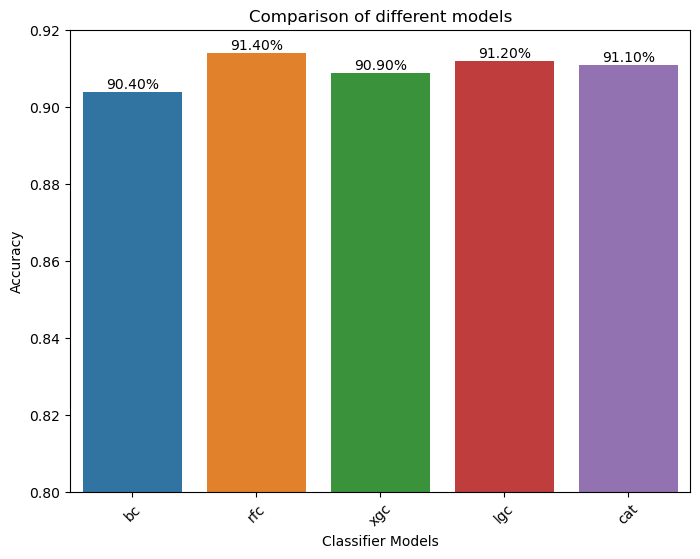

In [274]:
model_acc_bar_plot(model_acc_df_for_Forward,.80,.92)

# Feature selection (BACKWARD Technique)

In [275]:
backward=SequentialFeatureSelector(
                                xgc,
                                direction='backward',
                                scoring='accuracy',
                                cv=10,
                                n_jobs=-1).fit(X,y)

In [276]:
back_x_train=backward.transform(X)


In [277]:
back_x_train.shape

(1000, 4)

In [278]:
back_col=list(backward.get_feature_names_out())
back_col

['Glucose', 'Insulin', 'BMI', 'Age']

In [279]:
model_acc_arr=[]

for key,model in selected_model_for_SelectKBest.items():
    model_acc_arr.append(cross_val_mean_acc(model,back_x_train,y))
    
model_acc_df_for_Backward=create_datafram(model_acc_arr,selected_model_for_SelectKBest)

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 847
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 851
[LightG

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 851
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 845
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threa

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 681
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 681
[LightG

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 684
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 450, number of negative: 450
[LightGBM] [Info] Auto-choosing col-wise multi-threa

144:	learn: 0.2471042	total: 971ms	remaining: 5.73s
145:	learn: 0.2467696	total: 977ms	remaining: 5.71s
146:	learn: 0.2459585	total: 984ms	remaining: 5.71s
147:	learn: 0.2454612	total: 990ms	remaining: 5.7s
148:	learn: 0.2450384	total: 995ms	remaining: 5.68s
149:	learn: 0.2442067	total: 1s	remaining: 5.67s
150:	learn: 0.2436093	total: 1.01s	remaining: 5.66s
151:	learn: 0.2432512	total: 1.01s	remaining: 5.65s
152:	learn: 0.2428439	total: 1.02s	remaining: 5.64s
153:	learn: 0.2421887	total: 1.02s	remaining: 5.63s
154:	learn: 0.2417131	total: 1.03s	remaining: 5.63s
155:	learn: 0.2412989	total: 1.04s	remaining: 5.62s
156:	learn: 0.2406954	total: 1.05s	remaining: 5.62s
157:	learn: 0.2403360	total: 1.05s	remaining: 5.62s
158:	learn: 0.2398235	total: 1.06s	remaining: 5.63s
159:	learn: 0.2394092	total: 1.07s	remaining: 5.63s
160:	learn: 0.2385406	total: 1.08s	remaining: 5.62s
161:	learn: 0.2379558	total: 1.09s	remaining: 5.62s
162:	learn: 0.2371658	total: 1.09s	remaining: 5.62s
163:	learn: 0.23

313:	learn: 0.1909720	total: 2.15s	remaining: 4.71s
314:	learn: 0.1907793	total: 2.16s	remaining: 4.7s
315:	learn: 0.1905840	total: 2.17s	remaining: 4.69s
316:	learn: 0.1904689	total: 2.18s	remaining: 4.69s
317:	learn: 0.1902692	total: 2.18s	remaining: 4.68s
318:	learn: 0.1901522	total: 2.19s	remaining: 4.68s
319:	learn: 0.1898877	total: 2.2s	remaining: 4.67s
320:	learn: 0.1897222	total: 2.21s	remaining: 4.67s
321:	learn: 0.1895436	total: 2.21s	remaining: 4.66s
322:	learn: 0.1894417	total: 2.22s	remaining: 4.65s
323:	learn: 0.1891469	total: 2.23s	remaining: 4.65s
324:	learn: 0.1890041	total: 2.23s	remaining: 4.64s
325:	learn: 0.1888553	total: 2.24s	remaining: 4.63s
326:	learn: 0.1886834	total: 2.25s	remaining: 4.63s
327:	learn: 0.1885442	total: 2.26s	remaining: 4.62s
328:	learn: 0.1882942	total: 2.26s	remaining: 4.62s
329:	learn: 0.1880647	total: 2.27s	remaining: 4.61s
330:	learn: 0.1879137	total: 2.28s	remaining: 4.61s
331:	learn: 0.1877687	total: 2.29s	remaining: 4.6s
332:	learn: 0.1

480:	learn: 0.1625410	total: 3.33s	remaining: 3.59s
481:	learn: 0.1622963	total: 3.34s	remaining: 3.58s
482:	learn: 0.1621093	total: 3.34s	remaining: 3.58s
483:	learn: 0.1619787	total: 3.35s	remaining: 3.57s
484:	learn: 0.1618347	total: 3.36s	remaining: 3.56s
485:	learn: 0.1617450	total: 3.36s	remaining: 3.56s
486:	learn: 0.1616154	total: 3.37s	remaining: 3.55s
487:	learn: 0.1614901	total: 3.38s	remaining: 3.54s
488:	learn: 0.1613651	total: 3.38s	remaining: 3.54s
489:	learn: 0.1613055	total: 3.39s	remaining: 3.53s
490:	learn: 0.1611979	total: 3.4s	remaining: 3.52s
491:	learn: 0.1610786	total: 3.4s	remaining: 3.52s
492:	learn: 0.1609576	total: 3.41s	remaining: 3.51s
493:	learn: 0.1607933	total: 3.42s	remaining: 3.5s
494:	learn: 0.1607668	total: 3.43s	remaining: 3.5s
495:	learn: 0.1606019	total: 3.43s	remaining: 3.49s
496:	learn: 0.1604273	total: 3.44s	remaining: 3.48s
497:	learn: 0.1602717	total: 3.45s	remaining: 3.48s
498:	learn: 0.1601711	total: 3.45s	remaining: 3.47s
499:	learn: 0.16

669:	learn: 0.1373071	total: 4.67s	remaining: 2.3s
670:	learn: 0.1371406	total: 4.68s	remaining: 2.29s
671:	learn: 0.1369796	total: 4.69s	remaining: 2.29s
672:	learn: 0.1369061	total: 4.69s	remaining: 2.28s
673:	learn: 0.1368376	total: 4.7s	remaining: 2.27s
674:	learn: 0.1367470	total: 4.71s	remaining: 2.27s
675:	learn: 0.1365853	total: 4.71s	remaining: 2.26s
676:	learn: 0.1364382	total: 4.72s	remaining: 2.25s
677:	learn: 0.1363639	total: 4.73s	remaining: 2.25s
678:	learn: 0.1362536	total: 4.73s	remaining: 2.24s
679:	learn: 0.1361038	total: 4.74s	remaining: 2.23s
680:	learn: 0.1357948	total: 4.75s	remaining: 2.22s
681:	learn: 0.1357126	total: 4.76s	remaining: 2.22s
682:	learn: 0.1356386	total: 4.76s	remaining: 2.21s
683:	learn: 0.1355579	total: 4.77s	remaining: 2.2s
684:	learn: 0.1355140	total: 4.78s	remaining: 2.2s
685:	learn: 0.1353396	total: 4.79s	remaining: 2.19s
686:	learn: 0.1351900	total: 4.79s	remaining: 2.18s
687:	learn: 0.1350409	total: 4.8s	remaining: 2.18s
688:	learn: 0.134

832:	learn: 0.1192712	total: 5.83s	remaining: 1.17s
833:	learn: 0.1192122	total: 5.84s	remaining: 1.16s
834:	learn: 0.1191570	total: 5.85s	remaining: 1.16s
835:	learn: 0.1190664	total: 5.86s	remaining: 1.15s
836:	learn: 0.1189348	total: 5.87s	remaining: 1.14s
837:	learn: 0.1188634	total: 5.87s	remaining: 1.14s
838:	learn: 0.1187483	total: 5.88s	remaining: 1.13s
839:	learn: 0.1186761	total: 5.89s	remaining: 1.12s
840:	learn: 0.1185163	total: 5.9s	remaining: 1.11s
841:	learn: 0.1184179	total: 5.9s	remaining: 1.11s
842:	learn: 0.1183191	total: 5.91s	remaining: 1.1s
843:	learn: 0.1182907	total: 5.92s	remaining: 1.09s
844:	learn: 0.1182791	total: 5.92s	remaining: 1.09s
845:	learn: 0.1181295	total: 5.93s	remaining: 1.08s
846:	learn: 0.1180991	total: 5.94s	remaining: 1.07s
847:	learn: 0.1180483	total: 5.95s	remaining: 1.06s
848:	learn: 0.1179218	total: 5.95s	remaining: 1.06s
849:	learn: 0.1178589	total: 5.96s	remaining: 1.05s
850:	learn: 0.1178047	total: 5.97s	remaining: 1.04s
851:	learn: 0.1

Learning rate set to 0.009849
0:	learn: 0.6809637	total: 6.81ms	remaining: 6.8s
1:	learn: 0.6713292	total: 14.2ms	remaining: 7.08s
2:	learn: 0.6618022	total: 21.5ms	remaining: 7.16s
3:	learn: 0.6520247	total: 27.8ms	remaining: 6.92s
4:	learn: 0.6420633	total: 34.5ms	remaining: 6.86s
5:	learn: 0.6334235	total: 41.2ms	remaining: 6.82s
6:	learn: 0.6250084	total: 49.1ms	remaining: 6.96s
7:	learn: 0.6157510	total: 55.9ms	remaining: 6.93s
8:	learn: 0.6062325	total: 63.8ms	remaining: 7.03s
9:	learn: 0.5973827	total: 70.3ms	remaining: 6.96s
10:	learn: 0.5885067	total: 77.5ms	remaining: 6.97s
11:	learn: 0.5807248	total: 83.4ms	remaining: 6.86s
12:	learn: 0.5727525	total: 89.4ms	remaining: 6.79s
13:	learn: 0.5655409	total: 96.5ms	remaining: 6.8s
14:	learn: 0.5567809	total: 104ms	remaining: 6.83s
15:	learn: 0.5503136	total: 112ms	remaining: 6.89s
16:	learn: 0.5444909	total: 119ms	remaining: 6.87s
17:	learn: 0.5375866	total: 125ms	remaining: 6.84s
18:	learn: 0.5295410	total: 131ms	remaining: 6.79s

165:	learn: 0.2287520	total: 1.14s	remaining: 5.73s
166:	learn: 0.2281799	total: 1.15s	remaining: 5.73s
167:	learn: 0.2276829	total: 1.16s	remaining: 5.73s
168:	learn: 0.2274953	total: 1.16s	remaining: 5.72s
169:	learn: 0.2271347	total: 1.17s	remaining: 5.71s
170:	learn: 0.2268659	total: 1.18s	remaining: 5.7s
171:	learn: 0.2263060	total: 1.18s	remaining: 5.7s
172:	learn: 0.2258863	total: 1.19s	remaining: 5.68s
173:	learn: 0.2252102	total: 1.2s	remaining: 5.67s
174:	learn: 0.2247302	total: 1.2s	remaining: 5.66s
175:	learn: 0.2243045	total: 1.21s	remaining: 5.65s
176:	learn: 0.2239454	total: 1.21s	remaining: 5.64s
177:	learn: 0.2235754	total: 1.22s	remaining: 5.64s
178:	learn: 0.2231695	total: 1.23s	remaining: 5.64s
179:	learn: 0.2227445	total: 1.24s	remaining: 5.63s
180:	learn: 0.2222935	total: 1.24s	remaining: 5.62s
181:	learn: 0.2219234	total: 1.25s	remaining: 5.62s
182:	learn: 0.2214715	total: 1.26s	remaining: 5.62s
183:	learn: 0.2211361	total: 1.26s	remaining: 5.61s
184:	learn: 0.22

330:	learn: 0.1816266	total: 2.29s	remaining: 4.63s
331:	learn: 0.1814371	total: 2.3s	remaining: 4.63s
332:	learn: 0.1812498	total: 2.31s	remaining: 4.62s
333:	learn: 0.1810760	total: 2.31s	remaining: 4.61s
334:	learn: 0.1809057	total: 2.32s	remaining: 4.61s
335:	learn: 0.1806649	total: 2.33s	remaining: 4.6s
336:	learn: 0.1804642	total: 2.33s	remaining: 4.59s
337:	learn: 0.1802766	total: 2.34s	remaining: 4.59s
338:	learn: 0.1800957	total: 2.35s	remaining: 4.58s
339:	learn: 0.1800000	total: 2.36s	remaining: 4.57s
340:	learn: 0.1797939	total: 2.36s	remaining: 4.57s
341:	learn: 0.1796309	total: 2.37s	remaining: 4.56s
342:	learn: 0.1794745	total: 2.38s	remaining: 4.55s
343:	learn: 0.1792468	total: 2.38s	remaining: 4.54s
344:	learn: 0.1790578	total: 2.39s	remaining: 4.54s
345:	learn: 0.1788422	total: 2.4s	remaining: 4.53s
346:	learn: 0.1787518	total: 2.4s	remaining: 4.53s
347:	learn: 0.1785911	total: 2.41s	remaining: 4.52s
348:	learn: 0.1783467	total: 2.42s	remaining: 4.51s
349:	learn: 0.17

497:	learn: 0.1546313	total: 3.46s	remaining: 3.49s
498:	learn: 0.1544784	total: 3.47s	remaining: 3.48s
499:	learn: 0.1544061	total: 3.47s	remaining: 3.47s
500:	learn: 0.1542728	total: 3.48s	remaining: 3.47s
501:	learn: 0.1540488	total: 3.49s	remaining: 3.46s
502:	learn: 0.1538472	total: 3.5s	remaining: 3.45s
503:	learn: 0.1537247	total: 3.5s	remaining: 3.44s
504:	learn: 0.1535977	total: 3.51s	remaining: 3.44s
505:	learn: 0.1534886	total: 3.51s	remaining: 3.43s
506:	learn: 0.1534016	total: 3.52s	remaining: 3.42s
507:	learn: 0.1533590	total: 3.53s	remaining: 3.42s
508:	learn: 0.1532605	total: 3.53s	remaining: 3.41s
509:	learn: 0.1531942	total: 3.54s	remaining: 3.4s
510:	learn: 0.1530494	total: 3.55s	remaining: 3.39s
511:	learn: 0.1528762	total: 3.55s	remaining: 3.39s
512:	learn: 0.1527913	total: 3.56s	remaining: 3.38s
513:	learn: 0.1526708	total: 3.57s	remaining: 3.37s
514:	learn: 0.1525279	total: 3.58s	remaining: 3.37s
515:	learn: 0.1523390	total: 3.58s	remaining: 3.36s
516:	learn: 0.1

666:	learn: 0.1336207	total: 4.65s	remaining: 2.32s
667:	learn: 0.1335415	total: 4.66s	remaining: 2.32s
668:	learn: 0.1334858	total: 4.67s	remaining: 2.31s
669:	learn: 0.1334064	total: 4.67s	remaining: 2.3s
670:	learn: 0.1333259	total: 4.68s	remaining: 2.3s
671:	learn: 0.1332202	total: 4.69s	remaining: 2.29s
672:	learn: 0.1331611	total: 4.7s	remaining: 2.28s
673:	learn: 0.1330080	total: 4.7s	remaining: 2.27s
674:	learn: 0.1329198	total: 4.71s	remaining: 2.27s
675:	learn: 0.1328884	total: 4.71s	remaining: 2.26s
676:	learn: 0.1328158	total: 4.72s	remaining: 2.25s
677:	learn: 0.1327138	total: 4.73s	remaining: 2.25s
678:	learn: 0.1325665	total: 4.73s	remaining: 2.24s
679:	learn: 0.1325147	total: 4.74s	remaining: 2.23s
680:	learn: 0.1322441	total: 4.75s	remaining: 2.22s
681:	learn: 0.1320772	total: 4.75s	remaining: 2.22s
682:	learn: 0.1319568	total: 4.76s	remaining: 2.21s
683:	learn: 0.1318181	total: 4.77s	remaining: 2.2s
684:	learn: 0.1317473	total: 4.77s	remaining: 2.19s
685:	learn: 0.131

835:	learn: 0.1167588	total: 5.86s	remaining: 1.15s
836:	learn: 0.1166045	total: 5.87s	remaining: 1.14s
837:	learn: 0.1165832	total: 5.87s	remaining: 1.14s
838:	learn: 0.1165630	total: 5.88s	remaining: 1.13s
839:	learn: 0.1165432	total: 5.89s	remaining: 1.12s
840:	learn: 0.1165283	total: 5.89s	remaining: 1.11s
841:	learn: 0.1165099	total: 5.9s	remaining: 1.11s
842:	learn: 0.1164912	total: 5.91s	remaining: 1.1s
843:	learn: 0.1164622	total: 5.92s	remaining: 1.09s
844:	learn: 0.1163592	total: 5.92s	remaining: 1.09s
845:	learn: 0.1163358	total: 5.93s	remaining: 1.08s
846:	learn: 0.1162375	total: 5.94s	remaining: 1.07s
847:	learn: 0.1161931	total: 5.95s	remaining: 1.06s
848:	learn: 0.1160678	total: 5.95s	remaining: 1.06s
849:	learn: 0.1159695	total: 5.96s	remaining: 1.05s
850:	learn: 0.1159316	total: 5.97s	remaining: 1.04s
851:	learn: 0.1158286	total: 5.98s	remaining: 1.04s
852:	learn: 0.1156325	total: 5.98s	remaining: 1.03s
853:	learn: 0.1156175	total: 5.99s	remaining: 1.02s
854:	learn: 0.

997:	learn: 0.1045712	total: 7s	remaining: 14ms
998:	learn: 0.1044678	total: 7.01s	remaining: 7.02ms
999:	learn: 0.1044357	total: 7.02s	remaining: 0us
Learning rate set to 0.009849
0:	learn: 0.6815007	total: 8.61ms	remaining: 8.6s
1:	learn: 0.6707431	total: 16.4ms	remaining: 8.17s
2:	learn: 0.6614886	total: 24.1ms	remaining: 8.03s
3:	learn: 0.6517502	total: 30ms	remaining: 7.47s
4:	learn: 0.6411199	total: 37.1ms	remaining: 7.38s
5:	learn: 0.6327547	total: 45.4ms	remaining: 7.53s
6:	learn: 0.6242827	total: 53.2ms	remaining: 7.54s
7:	learn: 0.6152591	total: 61ms	remaining: 7.57s
8:	learn: 0.6055695	total: 68.7ms	remaining: 7.56s
9:	learn: 0.5970852	total: 76ms	remaining: 7.52s
10:	learn: 0.5892723	total: 82.8ms	remaining: 7.45s
11:	learn: 0.5818877	total: 89.9ms	remaining: 7.4s
12:	learn: 0.5732285	total: 96.6ms	remaining: 7.33s
13:	learn: 0.5660690	total: 103ms	remaining: 7.25s
14:	learn: 0.5572652	total: 109ms	remaining: 7.16s
15:	learn: 0.5499648	total: 116ms	remaining: 7.15s
16:	lear

171:	learn: 0.2280510	total: 1.22s	remaining: 5.87s
172:	learn: 0.2276830	total: 1.23s	remaining: 5.87s
173:	learn: 0.2271031	total: 1.24s	remaining: 5.86s
174:	learn: 0.2266435	total: 1.24s	remaining: 5.85s
175:	learn: 0.2261915	total: 1.25s	remaining: 5.84s
176:	learn: 0.2259238	total: 1.25s	remaining: 5.83s
177:	learn: 0.2254751	total: 1.26s	remaining: 5.83s
178:	learn: 0.2250484	total: 1.27s	remaining: 5.83s
179:	learn: 0.2247115	total: 1.28s	remaining: 5.82s
180:	learn: 0.2242487	total: 1.28s	remaining: 5.81s
181:	learn: 0.2235389	total: 1.29s	remaining: 5.8s
182:	learn: 0.2231318	total: 1.29s	remaining: 5.78s
183:	learn: 0.2226026	total: 1.3s	remaining: 5.77s
184:	learn: 0.2221523	total: 1.31s	remaining: 5.76s
185:	learn: 0.2216728	total: 1.31s	remaining: 5.74s
186:	learn: 0.2212223	total: 1.32s	remaining: 5.73s
187:	learn: 0.2208443	total: 1.32s	remaining: 5.72s
188:	learn: 0.2204492	total: 1.33s	remaining: 5.71s
189:	learn: 0.2201255	total: 1.33s	remaining: 5.69s
190:	learn: 0.

335:	learn: 0.1814111	total: 2.37s	remaining: 4.69s
336:	learn: 0.1811900	total: 2.38s	remaining: 4.69s
337:	learn: 0.1809112	total: 2.39s	remaining: 4.68s
338:	learn: 0.1806134	total: 2.4s	remaining: 4.67s
339:	learn: 0.1803858	total: 2.4s	remaining: 4.67s
340:	learn: 0.1801783	total: 2.41s	remaining: 4.66s
341:	learn: 0.1800017	total: 2.42s	remaining: 4.66s
342:	learn: 0.1799068	total: 2.43s	remaining: 4.65s
343:	learn: 0.1796508	total: 2.44s	remaining: 4.65s
344:	learn: 0.1794472	total: 2.44s	remaining: 4.64s
345:	learn: 0.1792049	total: 2.45s	remaining: 4.63s
346:	learn: 0.1790944	total: 2.46s	remaining: 4.63s
347:	learn: 0.1788867	total: 2.47s	remaining: 4.62s
348:	learn: 0.1786145	total: 2.47s	remaining: 4.62s
349:	learn: 0.1783675	total: 2.48s	remaining: 4.61s
350:	learn: 0.1782395	total: 2.49s	remaining: 4.6s
351:	learn: 0.1780700	total: 2.5s	remaining: 4.59s
352:	learn: 0.1779397	total: 2.5s	remaining: 4.59s
353:	learn: 0.1777548	total: 2.51s	remaining: 4.58s
354:	learn: 0.177

498:	learn: 0.1533860	total: 3.55s	remaining: 3.56s
499:	learn: 0.1532509	total: 3.56s	remaining: 3.56s
500:	learn: 0.1530958	total: 3.56s	remaining: 3.55s
501:	learn: 0.1527843	total: 3.57s	remaining: 3.54s
502:	learn: 0.1526457	total: 3.58s	remaining: 3.53s
503:	learn: 0.1524339	total: 3.58s	remaining: 3.53s
504:	learn: 0.1522907	total: 3.59s	remaining: 3.52s
505:	learn: 0.1521190	total: 3.6s	remaining: 3.51s
506:	learn: 0.1520055	total: 3.6s	remaining: 3.51s
507:	learn: 0.1519133	total: 3.61s	remaining: 3.5s
508:	learn: 0.1517502	total: 3.62s	remaining: 3.49s
509:	learn: 0.1516624	total: 3.62s	remaining: 3.48s
510:	learn: 0.1515424	total: 3.63s	remaining: 3.47s
511:	learn: 0.1513377	total: 3.64s	remaining: 3.47s
512:	learn: 0.1512610	total: 3.65s	remaining: 3.46s
513:	learn: 0.1511063	total: 3.65s	remaining: 3.45s
514:	learn: 0.1509702	total: 3.66s	remaining: 3.44s
515:	learn: 0.1508425	total: 3.67s	remaining: 3.44s
516:	learn: 0.1506866	total: 3.67s	remaining: 3.43s
517:	learn: 0.1

665:	learn: 0.1303958	total: 4.73s	remaining: 2.37s
666:	learn: 0.1302213	total: 4.74s	remaining: 2.37s
667:	learn: 0.1301504	total: 4.74s	remaining: 2.36s
668:	learn: 0.1300137	total: 4.75s	remaining: 2.35s
669:	learn: 0.1299317	total: 4.76s	remaining: 2.34s
670:	learn: 0.1297779	total: 4.76s	remaining: 2.34s
671:	learn: 0.1296907	total: 4.77s	remaining: 2.33s
672:	learn: 0.1296238	total: 4.78s	remaining: 2.32s
673:	learn: 0.1294457	total: 4.79s	remaining: 2.31s
674:	learn: 0.1292863	total: 4.79s	remaining: 2.31s
675:	learn: 0.1292183	total: 4.8s	remaining: 2.3s
676:	learn: 0.1291438	total: 4.81s	remaining: 2.29s
677:	learn: 0.1289760	total: 4.81s	remaining: 2.29s
678:	learn: 0.1289560	total: 4.82s	remaining: 2.28s
679:	learn: 0.1289328	total: 4.82s	remaining: 2.27s
680:	learn: 0.1287889	total: 4.83s	remaining: 2.26s
681:	learn: 0.1287455	total: 4.84s	remaining: 2.25s
682:	learn: 0.1286388	total: 4.84s	remaining: 2.25s
683:	learn: 0.1285007	total: 4.85s	remaining: 2.24s
684:	learn: 0.

832:	learn: 0.1110796	total: 5.89s	remaining: 1.18s
833:	learn: 0.1110007	total: 5.89s	remaining: 1.17s
834:	learn: 0.1109013	total: 5.9s	remaining: 1.17s
835:	learn: 0.1108760	total: 5.91s	remaining: 1.16s
836:	learn: 0.1107949	total: 5.92s	remaining: 1.15s
837:	learn: 0.1105795	total: 5.92s	remaining: 1.15s
838:	learn: 0.1104065	total: 5.93s	remaining: 1.14s
839:	learn: 0.1102609	total: 5.94s	remaining: 1.13s
840:	learn: 0.1101338	total: 5.95s	remaining: 1.12s
841:	learn: 0.1100270	total: 5.96s	remaining: 1.12s
842:	learn: 0.1099469	total: 5.96s	remaining: 1.11s
843:	learn: 0.1099181	total: 5.97s	remaining: 1.1s
844:	learn: 0.1098572	total: 5.98s	remaining: 1.1s
845:	learn: 0.1096016	total: 5.98s	remaining: 1.09s
846:	learn: 0.1095364	total: 5.99s	remaining: 1.08s
847:	learn: 0.1094624	total: 6s	remaining: 1.07s
848:	learn: 0.1093112	total: 6s	remaining: 1.07s
849:	learn: 0.1092405	total: 6.01s	remaining: 1.06s
850:	learn: 0.1092027	total: 6.02s	remaining: 1.05s
851:	learn: 0.1090915

Learning rate set to 0.009849
0:	learn: 0.6814090	total: 8.02ms	remaining: 8.01s
1:	learn: 0.6724550	total: 14.1ms	remaining: 7.03s
2:	learn: 0.6628244	total: 20.6ms	remaining: 6.84s
3:	learn: 0.6527327	total: 27.9ms	remaining: 6.94s
4:	learn: 0.6422827	total: 35.7ms	remaining: 7.1s
5:	learn: 0.6339265	total: 43.6ms	remaining: 7.22s
6:	learn: 0.6261603	total: 50.6ms	remaining: 7.18s
7:	learn: 0.6165473	total: 58.1ms	remaining: 7.2s
8:	learn: 0.6066201	total: 65.6ms	remaining: 7.22s
9:	learn: 0.5971625	total: 73.8ms	remaining: 7.3s
10:	learn: 0.5879647	total: 81ms	remaining: 7.29s
11:	learn: 0.5813397	total: 88.6ms	remaining: 7.29s
12:	learn: 0.5733131	total: 95.9ms	remaining: 7.28s
13:	learn: 0.5657284	total: 103ms	remaining: 7.29s
14:	learn: 0.5570054	total: 111ms	remaining: 7.31s
15:	learn: 0.5499406	total: 119ms	remaining: 7.32s
16:	learn: 0.5439626	total: 126ms	remaining: 7.29s
17:	learn: 0.5370286	total: 135ms	remaining: 7.36s
18:	learn: 0.5288189	total: 141ms	remaining: 7.28s
19:

161:	learn: 0.2287533	total: 1.18s	remaining: 6.11s
162:	learn: 0.2281236	total: 1.19s	remaining: 6.11s
163:	learn: 0.2276556	total: 1.2s	remaining: 6.1s
164:	learn: 0.2270317	total: 1.2s	remaining: 6.09s
165:	learn: 0.2265063	total: 1.21s	remaining: 6.08s
166:	learn: 0.2260978	total: 1.22s	remaining: 6.07s
167:	learn: 0.2256620	total: 1.22s	remaining: 6.07s
168:	learn: 0.2252730	total: 1.23s	remaining: 6.07s
169:	learn: 0.2248452	total: 1.24s	remaining: 6.06s
170:	learn: 0.2245369	total: 1.25s	remaining: 6.05s
171:	learn: 0.2240386	total: 1.25s	remaining: 6.04s
172:	learn: 0.2237160	total: 1.26s	remaining: 6.03s
173:	learn: 0.2232435	total: 1.27s	remaining: 6.03s
174:	learn: 0.2224634	total: 1.28s	remaining: 6.02s
175:	learn: 0.2217493	total: 1.28s	remaining: 6.01s
176:	learn: 0.2214606	total: 1.29s	remaining: 6s
177:	learn: 0.2208679	total: 1.3s	remaining: 6s
178:	learn: 0.2205336	total: 1.31s	remaining: 5.99s
179:	learn: 0.2202175	total: 1.31s	remaining: 5.99s
180:	learn: 0.2196908	

327:	learn: 0.1797761	total: 2.36s	remaining: 4.83s
328:	learn: 0.1795924	total: 2.37s	remaining: 4.83s
329:	learn: 0.1793745	total: 2.37s	remaining: 4.82s
330:	learn: 0.1791841	total: 2.38s	remaining: 4.81s
331:	learn: 0.1789512	total: 2.39s	remaining: 4.8s
332:	learn: 0.1787446	total: 2.39s	remaining: 4.79s
333:	learn: 0.1786331	total: 2.4s	remaining: 4.78s
334:	learn: 0.1782773	total: 2.4s	remaining: 4.78s
335:	learn: 0.1780513	total: 2.41s	remaining: 4.77s
336:	learn: 0.1778458	total: 2.42s	remaining: 4.76s
337:	learn: 0.1777342	total: 2.43s	remaining: 4.75s
338:	learn: 0.1775739	total: 2.44s	remaining: 4.75s
339:	learn: 0.1773277	total: 2.44s	remaining: 4.74s
340:	learn: 0.1771111	total: 2.45s	remaining: 4.73s
341:	learn: 0.1769419	total: 2.45s	remaining: 4.72s
342:	learn: 0.1766617	total: 2.46s	remaining: 4.71s
343:	learn: 0.1764816	total: 2.47s	remaining: 4.71s
344:	learn: 0.1763462	total: 2.48s	remaining: 4.7s
345:	learn: 0.1760770	total: 2.48s	remaining: 4.69s
346:	learn: 0.17

492:	learn: 0.1552550	total: 3.52s	remaining: 3.62s
493:	learn: 0.1550434	total: 3.53s	remaining: 3.62s
494:	learn: 0.1549621	total: 3.54s	remaining: 3.61s
495:	learn: 0.1548248	total: 3.55s	remaining: 3.6s
496:	learn: 0.1546524	total: 3.55s	remaining: 3.6s
497:	learn: 0.1544921	total: 3.56s	remaining: 3.59s
498:	learn: 0.1544243	total: 3.57s	remaining: 3.58s
499:	learn: 0.1542903	total: 3.58s	remaining: 3.58s
500:	learn: 0.1541388	total: 3.58s	remaining: 3.57s
501:	learn: 0.1540039	total: 3.59s	remaining: 3.56s
502:	learn: 0.1537624	total: 3.6s	remaining: 3.56s
503:	learn: 0.1535531	total: 3.6s	remaining: 3.55s
504:	learn: 0.1534044	total: 3.61s	remaining: 3.54s
505:	learn: 0.1532349	total: 3.62s	remaining: 3.53s
506:	learn: 0.1530467	total: 3.63s	remaining: 3.53s
507:	learn: 0.1529887	total: 3.63s	remaining: 3.52s
508:	learn: 0.1528396	total: 3.64s	remaining: 3.51s
509:	learn: 0.1526438	total: 3.65s	remaining: 3.5s
510:	learn: 0.1524691	total: 3.65s	remaining: 3.5s
511:	learn: 0.1522

654:	learn: 0.1351333	total: 4.7s	remaining: 2.48s
655:	learn: 0.1349502	total: 4.71s	remaining: 2.47s
656:	learn: 0.1348787	total: 4.71s	remaining: 2.46s
657:	learn: 0.1347175	total: 4.72s	remaining: 2.45s
658:	learn: 0.1345974	total: 4.73s	remaining: 2.45s
659:	learn: 0.1345020	total: 4.74s	remaining: 2.44s
660:	learn: 0.1344641	total: 4.74s	remaining: 2.43s
661:	learn: 0.1344126	total: 4.75s	remaining: 2.42s
662:	learn: 0.1343414	total: 4.76s	remaining: 2.42s
663:	learn: 0.1342806	total: 4.76s	remaining: 2.41s
664:	learn: 0.1341603	total: 4.77s	remaining: 2.4s
665:	learn: 0.1340632	total: 4.78s	remaining: 2.4s
666:	learn: 0.1340130	total: 4.79s	remaining: 2.39s
667:	learn: 0.1338622	total: 4.79s	remaining: 2.38s
668:	learn: 0.1337495	total: 4.8s	remaining: 2.38s
669:	learn: 0.1336650	total: 4.81s	remaining: 2.37s
670:	learn: 0.1333431	total: 4.81s	remaining: 2.36s
671:	learn: 0.1332396	total: 4.82s	remaining: 2.35s
672:	learn: 0.1330908	total: 4.83s	remaining: 2.35s
673:	learn: 0.13

821:	learn: 0.1176500	total: 5.88s	remaining: 1.27s
822:	learn: 0.1175624	total: 5.89s	remaining: 1.27s
823:	learn: 0.1175032	total: 5.89s	remaining: 1.26s
824:	learn: 0.1174374	total: 5.9s	remaining: 1.25s
825:	learn: 0.1173223	total: 5.91s	remaining: 1.24s
826:	learn: 0.1171673	total: 5.91s	remaining: 1.24s
827:	learn: 0.1171399	total: 5.92s	remaining: 1.23s
828:	learn: 0.1169524	total: 5.93s	remaining: 1.22s
829:	learn: 0.1168703	total: 5.93s	remaining: 1.22s
830:	learn: 0.1168237	total: 5.94s	remaining: 1.21s
831:	learn: 0.1166440	total: 5.95s	remaining: 1.2s
832:	learn: 0.1166078	total: 5.96s	remaining: 1.19s
833:	learn: 0.1165299	total: 5.96s	remaining: 1.19s
834:	learn: 0.1162837	total: 5.97s	remaining: 1.18s
835:	learn: 0.1162273	total: 5.98s	remaining: 1.17s
836:	learn: 0.1160793	total: 5.99s	remaining: 1.17s
837:	learn: 0.1159999	total: 5.99s	remaining: 1.16s
838:	learn: 0.1159201	total: 6s	remaining: 1.15s
839:	learn: 0.1158359	total: 6.01s	remaining: 1.14s
840:	learn: 0.115

982:	learn: 0.1036242	total: 7.02s	remaining: 121ms
983:	learn: 0.1034900	total: 7.03s	remaining: 114ms
984:	learn: 0.1034378	total: 7.03s	remaining: 107ms
985:	learn: 0.1033999	total: 7.04s	remaining: 100ms
986:	learn: 0.1033157	total: 7.05s	remaining: 92.8ms
987:	learn: 0.1031974	total: 7.05s	remaining: 85.7ms
988:	learn: 0.1029552	total: 7.06s	remaining: 78.5ms
989:	learn: 0.1029130	total: 7.07s	remaining: 71.4ms
990:	learn: 0.1028830	total: 7.07s	remaining: 64.3ms
991:	learn: 0.1028551	total: 7.08s	remaining: 57.1ms
992:	learn: 0.1028070	total: 7.09s	remaining: 50ms
993:	learn: 0.1027606	total: 7.1s	remaining: 42.8ms
994:	learn: 0.1027165	total: 7.1s	remaining: 35.7ms
995:	learn: 0.1026923	total: 7.11s	remaining: 28.6ms
996:	learn: 0.1025771	total: 7.12s	remaining: 21.4ms
997:	learn: 0.1025391	total: 7.13s	remaining: 14.3ms
998:	learn: 0.1024369	total: 7.13s	remaining: 7.14ms
999:	learn: 0.1023670	total: 7.14s	remaining: 0us
Learning rate set to 0.009849
0:	learn: 0.6822130	total: 

167:	learn: 0.2389957	total: 1.19s	remaining: 5.87s
168:	learn: 0.2386885	total: 1.19s	remaining: 5.87s
169:	learn: 0.2382993	total: 1.2s	remaining: 5.86s
170:	learn: 0.2378685	total: 1.21s	remaining: 5.85s
171:	learn: 0.2374765	total: 1.21s	remaining: 5.84s
172:	learn: 0.2372608	total: 1.22s	remaining: 5.84s
173:	learn: 0.2368054	total: 1.23s	remaining: 5.84s
174:	learn: 0.2361526	total: 1.24s	remaining: 5.83s
175:	learn: 0.2353156	total: 1.24s	remaining: 5.83s
176:	learn: 0.2348377	total: 1.25s	remaining: 5.82s
177:	learn: 0.2344378	total: 1.26s	remaining: 5.82s
178:	learn: 0.2340389	total: 1.27s	remaining: 5.82s
179:	learn: 0.2337222	total: 1.27s	remaining: 5.81s
180:	learn: 0.2331063	total: 1.28s	remaining: 5.81s
181:	learn: 0.2327006	total: 1.29s	remaining: 5.8s
182:	learn: 0.2323925	total: 1.3s	remaining: 5.79s
183:	learn: 0.2318938	total: 1.3s	remaining: 5.79s
184:	learn: 0.2315132	total: 1.31s	remaining: 5.79s
185:	learn: 0.2311403	total: 1.32s	remaining: 5.78s
186:	learn: 0.23

332:	learn: 0.1913133	total: 2.35s	remaining: 4.71s
333:	learn: 0.1910833	total: 2.36s	remaining: 4.71s
334:	learn: 0.1909743	total: 2.37s	remaining: 4.7s
335:	learn: 0.1906755	total: 2.37s	remaining: 4.69s
336:	learn: 0.1904046	total: 2.38s	remaining: 4.68s
337:	learn: 0.1903447	total: 2.38s	remaining: 4.67s
338:	learn: 0.1902271	total: 2.39s	remaining: 4.66s
339:	learn: 0.1900376	total: 2.4s	remaining: 4.65s
340:	learn: 0.1899490	total: 2.4s	remaining: 4.64s
341:	learn: 0.1897042	total: 2.41s	remaining: 4.63s
342:	learn: 0.1895816	total: 2.42s	remaining: 4.63s
343:	learn: 0.1892530	total: 2.42s	remaining: 4.62s
344:	learn: 0.1890544	total: 2.43s	remaining: 4.61s
345:	learn: 0.1888427	total: 2.43s	remaining: 4.6s
346:	learn: 0.1887588	total: 2.44s	remaining: 4.59s
347:	learn: 0.1884772	total: 2.45s	remaining: 4.58s
348:	learn: 0.1882692	total: 2.45s	remaining: 4.57s
349:	learn: 0.1880408	total: 2.46s	remaining: 4.57s
350:	learn: 0.1879480	total: 2.46s	remaining: 4.56s
351:	learn: 0.18

498:	learn: 0.1642163	total: 3.51s	remaining: 3.52s
499:	learn: 0.1640258	total: 3.51s	remaining: 3.51s
500:	learn: 0.1639383	total: 3.52s	remaining: 3.51s
501:	learn: 0.1637153	total: 3.53s	remaining: 3.5s
502:	learn: 0.1636342	total: 3.54s	remaining: 3.49s
503:	learn: 0.1634437	total: 3.54s	remaining: 3.48s
504:	learn: 0.1632848	total: 3.55s	remaining: 3.48s
505:	learn: 0.1631181	total: 3.56s	remaining: 3.47s
506:	learn: 0.1629803	total: 3.56s	remaining: 3.46s
507:	learn: 0.1625853	total: 3.57s	remaining: 3.46s
508:	learn: 0.1624227	total: 3.58s	remaining: 3.45s
509:	learn: 0.1622716	total: 3.58s	remaining: 3.44s
510:	learn: 0.1621955	total: 3.59s	remaining: 3.44s
511:	learn: 0.1620537	total: 3.6s	remaining: 3.43s
512:	learn: 0.1618482	total: 3.6s	remaining: 3.42s
513:	learn: 0.1617867	total: 3.61s	remaining: 3.41s
514:	learn: 0.1616198	total: 3.62s	remaining: 3.4s
515:	learn: 0.1615066	total: 3.62s	remaining: 3.4s
516:	learn: 0.1612019	total: 3.63s	remaining: 3.39s
517:	learn: 0.161

665:	learn: 0.1420834	total: 4.67s	remaining: 2.34s
666:	learn: 0.1419855	total: 4.68s	remaining: 2.34s
667:	learn: 0.1419239	total: 4.69s	remaining: 2.33s
668:	learn: 0.1416970	total: 4.7s	remaining: 2.32s
669:	learn: 0.1413615	total: 4.7s	remaining: 2.31s
670:	learn: 0.1413203	total: 4.71s	remaining: 2.31s
671:	learn: 0.1410868	total: 4.71s	remaining: 2.3s
672:	learn: 0.1409355	total: 4.72s	remaining: 2.29s
673:	learn: 0.1409018	total: 4.73s	remaining: 2.29s
674:	learn: 0.1408089	total: 4.74s	remaining: 2.28s
675:	learn: 0.1406203	total: 4.74s	remaining: 2.27s
676:	learn: 0.1405010	total: 4.75s	remaining: 2.27s
677:	learn: 0.1404723	total: 4.76s	remaining: 2.26s
678:	learn: 0.1403530	total: 4.76s	remaining: 2.25s
679:	learn: 0.1400894	total: 4.77s	remaining: 2.25s
680:	learn: 0.1397916	total: 4.78s	remaining: 2.24s
681:	learn: 0.1396239	total: 4.79s	remaining: 2.23s
682:	learn: 0.1394308	total: 4.79s	remaining: 2.22s
683:	learn: 0.1392911	total: 4.8s	remaining: 2.22s
684:	learn: 0.13

827:	learn: 0.1242917	total: 5.83s	remaining: 1.21s
828:	learn: 0.1242335	total: 5.84s	remaining: 1.2s
829:	learn: 0.1242059	total: 5.85s	remaining: 1.2s
830:	learn: 0.1241072	total: 5.85s	remaining: 1.19s
831:	learn: 0.1240153	total: 5.86s	remaining: 1.18s
832:	learn: 0.1239551	total: 5.87s	remaining: 1.18s
833:	learn: 0.1237669	total: 5.88s	remaining: 1.17s
834:	learn: 0.1235959	total: 5.88s	remaining: 1.16s
835:	learn: 0.1234350	total: 5.89s	remaining: 1.16s
836:	learn: 0.1231704	total: 5.9s	remaining: 1.15s
837:	learn: 0.1230636	total: 5.91s	remaining: 1.14s
838:	learn: 0.1230342	total: 5.91s	remaining: 1.13s
839:	learn: 0.1229655	total: 5.92s	remaining: 1.13s
840:	learn: 0.1229478	total: 5.93s	remaining: 1.12s
841:	learn: 0.1228633	total: 5.94s	remaining: 1.11s
842:	learn: 0.1228221	total: 5.94s	remaining: 1.11s
843:	learn: 0.1227689	total: 5.95s	remaining: 1.1s
844:	learn: 0.1226705	total: 5.96s	remaining: 1.09s
845:	learn: 0.1224825	total: 5.96s	remaining: 1.08s
846:	learn: 0.12

988:	learn: 0.1093727	total: 6.99s	remaining: 77.8ms
989:	learn: 0.1092760	total: 7s	remaining: 70.7ms
990:	learn: 0.1091370	total: 7s	remaining: 63.6ms
991:	learn: 0.1091255	total: 7.01s	remaining: 56.5ms
992:	learn: 0.1090000	total: 7.02s	remaining: 49.5ms
993:	learn: 0.1089073	total: 7.02s	remaining: 42.4ms
994:	learn: 0.1088104	total: 7.03s	remaining: 35.3ms
995:	learn: 0.1086621	total: 7.04s	remaining: 28.3ms
996:	learn: 0.1085457	total: 7.04s	remaining: 21.2ms
997:	learn: 0.1084323	total: 7.05s	remaining: 14.1ms
998:	learn: 0.1083375	total: 7.06s	remaining: 7.06ms
999:	learn: 0.1082137	total: 7.07s	remaining: 0us
Learning rate set to 0.009849
0:	learn: 0.6817839	total: 8.6ms	remaining: 8.59s
1:	learn: 0.6714001	total: 15.1ms	remaining: 7.53s
2:	learn: 0.6607384	total: 24.1ms	remaining: 8.01s
3:	learn: 0.6516553	total: 32.3ms	remaining: 8.05s
4:	learn: 0.6409163	total: 38.5ms	remaining: 7.67s
5:	learn: 0.6328090	total: 47.3ms	remaining: 7.84s
6:	learn: 0.6231627	total: 55.4ms	rema

174:	learn: 0.2310629	total: 1.15s	remaining: 5.43s
175:	learn: 0.2303375	total: 1.16s	remaining: 5.42s
176:	learn: 0.2298119	total: 1.16s	remaining: 5.41s
177:	learn: 0.2294750	total: 1.17s	remaining: 5.4s
178:	learn: 0.2291217	total: 1.17s	remaining: 5.39s
179:	learn: 0.2288600	total: 1.18s	remaining: 5.38s
180:	learn: 0.2283917	total: 1.19s	remaining: 5.37s
181:	learn: 0.2279515	total: 1.19s	remaining: 5.36s
182:	learn: 0.2275175	total: 1.2s	remaining: 5.35s
183:	learn: 0.2269332	total: 1.2s	remaining: 5.34s
184:	learn: 0.2265475	total: 1.21s	remaining: 5.33s
185:	learn: 0.2260635	total: 1.22s	remaining: 5.32s
186:	learn: 0.2256477	total: 1.22s	remaining: 5.31s
187:	learn: 0.2253290	total: 1.23s	remaining: 5.31s
188:	learn: 0.2250090	total: 1.24s	remaining: 5.3s
189:	learn: 0.2247296	total: 1.24s	remaining: 5.29s
190:	learn: 0.2244225	total: 1.25s	remaining: 5.29s
191:	learn: 0.2240399	total: 1.25s	remaining: 5.29s
192:	learn: 0.2237039	total: 1.26s	remaining: 5.28s
193:	learn: 0.22

355:	learn: 0.1830435	total: 2.33s	remaining: 4.21s
356:	learn: 0.1828477	total: 2.33s	remaining: 4.2s
357:	learn: 0.1825790	total: 2.34s	remaining: 4.2s
358:	learn: 0.1823930	total: 2.35s	remaining: 4.19s
359:	learn: 0.1822119	total: 2.35s	remaining: 4.18s
360:	learn: 0.1820762	total: 2.36s	remaining: 4.17s
361:	learn: 0.1818110	total: 2.37s	remaining: 4.17s
362:	learn: 0.1816354	total: 2.37s	remaining: 4.16s
363:	learn: 0.1814646	total: 2.38s	remaining: 4.15s
364:	learn: 0.1812800	total: 2.38s	remaining: 4.15s
365:	learn: 0.1810277	total: 2.39s	remaining: 4.14s
366:	learn: 0.1808542	total: 2.4s	remaining: 4.13s
367:	learn: 0.1807238	total: 2.4s	remaining: 4.13s
368:	learn: 0.1805438	total: 2.41s	remaining: 4.12s
369:	learn: 0.1803690	total: 2.42s	remaining: 4.12s
370:	learn: 0.1800923	total: 2.42s	remaining: 4.11s
371:	learn: 0.1799593	total: 2.43s	remaining: 4.1s
372:	learn: 0.1798599	total: 2.44s	remaining: 4.1s
373:	learn: 0.1797189	total: 2.44s	remaining: 4.09s
374:	learn: 0.1795

528:	learn: 0.1551735	total: 3.31s	remaining: 2.95s
529:	learn: 0.1550299	total: 3.32s	remaining: 2.94s
530:	learn: 0.1548761	total: 3.33s	remaining: 2.94s
531:	learn: 0.1546667	total: 3.33s	remaining: 2.93s
532:	learn: 0.1544237	total: 3.34s	remaining: 2.92s
533:	learn: 0.1542650	total: 3.34s	remaining: 2.92s
534:	learn: 0.1539018	total: 3.35s	remaining: 2.91s
535:	learn: 0.1538044	total: 3.35s	remaining: 2.9s
536:	learn: 0.1536915	total: 3.36s	remaining: 2.9s
537:	learn: 0.1535548	total: 3.37s	remaining: 2.89s
538:	learn: 0.1534515	total: 3.37s	remaining: 2.88s
539:	learn: 0.1532585	total: 3.37s	remaining: 2.87s
540:	learn: 0.1531288	total: 3.38s	remaining: 2.87s
541:	learn: 0.1529735	total: 3.38s	remaining: 2.86s
542:	learn: 0.1528859	total: 3.39s	remaining: 2.85s
543:	learn: 0.1527638	total: 3.4s	remaining: 2.85s
544:	learn: 0.1525492	total: 3.4s	remaining: 2.84s
545:	learn: 0.1524738	total: 3.41s	remaining: 2.83s
546:	learn: 0.1522822	total: 3.41s	remaining: 2.83s
547:	learn: 0.15

693:	learn: 0.1339680	total: 4.3s	remaining: 1.9s
694:	learn: 0.1338548	total: 4.31s	remaining: 1.89s
695:	learn: 0.1337411	total: 4.31s	remaining: 1.88s
696:	learn: 0.1336677	total: 4.32s	remaining: 1.88s
697:	learn: 0.1335769	total: 4.33s	remaining: 1.87s
698:	learn: 0.1335011	total: 4.33s	remaining: 1.86s
699:	learn: 0.1333786	total: 4.33s	remaining: 1.86s
700:	learn: 0.1333016	total: 4.34s	remaining: 1.85s
701:	learn: 0.1332446	total: 4.34s	remaining: 1.84s
702:	learn: 0.1331978	total: 4.35s	remaining: 1.84s
703:	learn: 0.1330709	total: 4.36s	remaining: 1.83s
704:	learn: 0.1329912	total: 4.36s	remaining: 1.82s
705:	learn: 0.1329338	total: 4.37s	remaining: 1.82s
706:	learn: 0.1328340	total: 4.37s	remaining: 1.81s
707:	learn: 0.1327927	total: 4.38s	remaining: 1.8s
708:	learn: 0.1327445	total: 4.38s	remaining: 1.8s
709:	learn: 0.1325641	total: 4.39s	remaining: 1.79s
710:	learn: 0.1324745	total: 4.4s	remaining: 1.79s
711:	learn: 0.1324044	total: 4.4s	remaining: 1.78s
712:	learn: 0.1322

868:	learn: 0.1159644	total: 5.47s	remaining: 824ms
869:	learn: 0.1158696	total: 5.47s	remaining: 818ms
870:	learn: 0.1157820	total: 5.48s	remaining: 812ms
871:	learn: 0.1157016	total: 5.49s	remaining: 805ms
872:	learn: 0.1156245	total: 5.49s	remaining: 799ms
873:	learn: 0.1156022	total: 5.5s	remaining: 793ms
874:	learn: 0.1155284	total: 5.51s	remaining: 787ms
875:	learn: 0.1153852	total: 5.51s	remaining: 781ms
876:	learn: 0.1152628	total: 5.52s	remaining: 774ms
877:	learn: 0.1151751	total: 5.53s	remaining: 768ms
878:	learn: 0.1150285	total: 5.54s	remaining: 762ms
879:	learn: 0.1147950	total: 5.54s	remaining: 756ms
880:	learn: 0.1146738	total: 5.55s	remaining: 750ms
881:	learn: 0.1145103	total: 5.56s	remaining: 744ms
882:	learn: 0.1144651	total: 5.57s	remaining: 738ms
883:	learn: 0.1143665	total: 5.58s	remaining: 732ms
884:	learn: 0.1142426	total: 5.58s	remaining: 725ms
885:	learn: 0.1141412	total: 5.59s	remaining: 719ms
886:	learn: 0.1140961	total: 5.6s	remaining: 713ms
887:	learn: 0.

52:	learn: 0.3806295	total: 389ms	remaining: 6.96s
53:	learn: 0.3776138	total: 396ms	remaining: 6.95s
54:	learn: 0.3743502	total: 404ms	remaining: 6.93s
55:	learn: 0.3715052	total: 410ms	remaining: 6.92s
56:	learn: 0.3694326	total: 417ms	remaining: 6.9s
57:	learn: 0.3669598	total: 424ms	remaining: 6.88s
58:	learn: 0.3648656	total: 430ms	remaining: 6.86s
59:	learn: 0.3620468	total: 437ms	remaining: 6.85s
60:	learn: 0.3599032	total: 443ms	remaining: 6.81s
61:	learn: 0.3576072	total: 449ms	remaining: 6.8s
62:	learn: 0.3549950	total: 456ms	remaining: 6.78s
63:	learn: 0.3527551	total: 463ms	remaining: 6.77s
64:	learn: 0.3502929	total: 471ms	remaining: 6.77s
65:	learn: 0.3484785	total: 477ms	remaining: 6.76s
66:	learn: 0.3463134	total: 484ms	remaining: 6.74s
67:	learn: 0.3442543	total: 491ms	remaining: 6.74s
68:	learn: 0.3423684	total: 499ms	remaining: 6.73s
69:	learn: 0.3400366	total: 506ms	remaining: 6.72s
70:	learn: 0.3384524	total: 513ms	remaining: 6.71s
71:	learn: 0.3365394	total: 520ms

225:	learn: 0.2205899	total: 1.57s	remaining: 5.39s
226:	learn: 0.2202937	total: 1.58s	remaining: 5.39s
227:	learn: 0.2200062	total: 1.59s	remaining: 5.38s
228:	learn: 0.2197355	total: 1.59s	remaining: 5.37s
229:	learn: 0.2194470	total: 1.6s	remaining: 5.36s
230:	learn: 0.2191275	total: 1.61s	remaining: 5.35s
231:	learn: 0.2188497	total: 1.61s	remaining: 5.34s
232:	learn: 0.2184055	total: 1.62s	remaining: 5.34s
233:	learn: 0.2181105	total: 1.63s	remaining: 5.33s
234:	learn: 0.2177153	total: 1.64s	remaining: 5.32s
235:	learn: 0.2174326	total: 1.64s	remaining: 5.31s
236:	learn: 0.2172245	total: 1.65s	remaining: 5.31s
237:	learn: 0.2169617	total: 1.66s	remaining: 5.3s
238:	learn: 0.2166723	total: 1.66s	remaining: 5.29s
239:	learn: 0.2163920	total: 1.67s	remaining: 5.28s
240:	learn: 0.2159703	total: 1.67s	remaining: 5.27s
241:	learn: 0.2157478	total: 1.68s	remaining: 5.26s
242:	learn: 0.2154368	total: 1.69s	remaining: 5.26s
243:	learn: 0.2149695	total: 1.7s	remaining: 5.25s
244:	learn: 0.2

386:	learn: 0.1837039	total: 2.72s	remaining: 4.31s
387:	learn: 0.1834655	total: 2.73s	remaining: 4.31s
388:	learn: 0.1833634	total: 2.74s	remaining: 4.3s
389:	learn: 0.1831515	total: 2.75s	remaining: 4.29s
390:	learn: 0.1829903	total: 2.75s	remaining: 4.29s
391:	learn: 0.1828815	total: 2.76s	remaining: 4.28s
392:	learn: 0.1827705	total: 2.77s	remaining: 4.27s
393:	learn: 0.1825766	total: 2.77s	remaining: 4.26s
394:	learn: 0.1824480	total: 2.78s	remaining: 4.25s
395:	learn: 0.1822862	total: 2.78s	remaining: 4.25s
396:	learn: 0.1821432	total: 2.79s	remaining: 4.24s
397:	learn: 0.1820243	total: 2.8s	remaining: 4.23s
398:	learn: 0.1819009	total: 2.81s	remaining: 4.23s
399:	learn: 0.1814894	total: 2.81s	remaining: 4.22s
400:	learn: 0.1814278	total: 2.82s	remaining: 4.21s
401:	learn: 0.1812087	total: 2.83s	remaining: 4.21s
402:	learn: 0.1809941	total: 2.83s	remaining: 4.2s
403:	learn: 0.1807652	total: 2.84s	remaining: 4.19s
404:	learn: 0.1806537	total: 2.85s	remaining: 4.18s
405:	learn: 0.1

558:	learn: 0.1566547	total: 3.92s	remaining: 3.09s
559:	learn: 0.1565292	total: 3.92s	remaining: 3.08s
560:	learn: 0.1563939	total: 3.93s	remaining: 3.08s
561:	learn: 0.1562268	total: 3.94s	remaining: 3.07s
562:	learn: 0.1561014	total: 3.94s	remaining: 3.06s
563:	learn: 0.1559799	total: 3.95s	remaining: 3.06s
564:	learn: 0.1557565	total: 3.96s	remaining: 3.05s
565:	learn: 0.1556493	total: 3.97s	remaining: 3.04s
566:	learn: 0.1556137	total: 3.97s	remaining: 3.03s
567:	learn: 0.1554232	total: 3.98s	remaining: 3.03s
568:	learn: 0.1553114	total: 3.99s	remaining: 3.02s
569:	learn: 0.1551822	total: 3.99s	remaining: 3.01s
570:	learn: 0.1550499	total: 4s	remaining: 3.01s
571:	learn: 0.1549567	total: 4.01s	remaining: 3s
572:	learn: 0.1548804	total: 4.01s	remaining: 2.99s
573:	learn: 0.1547903	total: 4.02s	remaining: 2.98s
574:	learn: 0.1546838	total: 4.02s	remaining: 2.97s
575:	learn: 0.1546282	total: 4.03s	remaining: 2.97s
576:	learn: 0.1544373	total: 4.04s	remaining: 2.96s
577:	learn: 0.1542

722:	learn: 0.1373623	total: 5.06s	remaining: 1.94s
723:	learn: 0.1373378	total: 5.07s	remaining: 1.93s
724:	learn: 0.1373282	total: 5.07s	remaining: 1.92s
725:	learn: 0.1372912	total: 5.08s	remaining: 1.92s
726:	learn: 0.1371923	total: 5.08s	remaining: 1.91s
727:	learn: 0.1370556	total: 5.09s	remaining: 1.9s
728:	learn: 0.1369837	total: 5.09s	remaining: 1.89s
729:	learn: 0.1369331	total: 5.1s	remaining: 1.89s
730:	learn: 0.1368295	total: 5.11s	remaining: 1.88s
731:	learn: 0.1366624	total: 5.12s	remaining: 1.87s
732:	learn: 0.1365473	total: 5.12s	remaining: 1.86s
733:	learn: 0.1364104	total: 5.13s	remaining: 1.86s
734:	learn: 0.1363406	total: 5.13s	remaining: 1.85s
735:	learn: 0.1361876	total: 5.14s	remaining: 1.84s
736:	learn: 0.1359870	total: 5.15s	remaining: 1.84s
737:	learn: 0.1358570	total: 5.15s	remaining: 1.83s
738:	learn: 0.1357245	total: 5.16s	remaining: 1.82s
739:	learn: 0.1356110	total: 5.17s	remaining: 1.81s
740:	learn: 0.1355106	total: 5.17s	remaining: 1.81s
741:	learn: 0.

887:	learn: 0.1202234	total: 6.21s	remaining: 783ms
888:	learn: 0.1201390	total: 6.22s	remaining: 776ms
889:	learn: 0.1200594	total: 6.22s	remaining: 769ms
890:	learn: 0.1198813	total: 6.23s	remaining: 763ms
891:	learn: 0.1197623	total: 6.24s	remaining: 756ms
892:	learn: 0.1196694	total: 6.25s	remaining: 748ms
893:	learn: 0.1195552	total: 6.25s	remaining: 741ms
894:	learn: 0.1194058	total: 6.26s	remaining: 734ms
895:	learn: 0.1192804	total: 6.27s	remaining: 727ms
896:	learn: 0.1191824	total: 6.27s	remaining: 720ms
897:	learn: 0.1191291	total: 6.28s	remaining: 713ms
898:	learn: 0.1189792	total: 6.29s	remaining: 706ms
899:	learn: 0.1187130	total: 6.29s	remaining: 699ms
900:	learn: 0.1186098	total: 6.3s	remaining: 692ms
901:	learn: 0.1185517	total: 6.31s	remaining: 685ms
902:	learn: 0.1185434	total: 6.31s	remaining: 678ms
903:	learn: 0.1184388	total: 6.32s	remaining: 671ms
904:	learn: 0.1183044	total: 6.33s	remaining: 664ms
905:	learn: 0.1181963	total: 6.34s	remaining: 657ms
906:	learn: 0

56:	learn: 0.3666149	total: 423ms	remaining: 7s
57:	learn: 0.3642476	total: 431ms	remaining: 6.99s
58:	learn: 0.3622925	total: 438ms	remaining: 6.98s
59:	learn: 0.3591870	total: 444ms	remaining: 6.96s
60:	learn: 0.3570331	total: 451ms	remaining: 6.94s
61:	learn: 0.3547662	total: 457ms	remaining: 6.92s
62:	learn: 0.3523138	total: 465ms	remaining: 6.92s
63:	learn: 0.3499697	total: 472ms	remaining: 6.91s
64:	learn: 0.3476852	total: 479ms	remaining: 6.89s
65:	learn: 0.3455828	total: 487ms	remaining: 6.9s
66:	learn: 0.3437954	total: 495ms	remaining: 6.9s
67:	learn: 0.3418548	total: 502ms	remaining: 6.88s
68:	learn: 0.3399291	total: 509ms	remaining: 6.87s
69:	learn: 0.3374369	total: 517ms	remaining: 6.86s
70:	learn: 0.3358766	total: 523ms	remaining: 6.85s
71:	learn: 0.3338841	total: 531ms	remaining: 6.84s
72:	learn: 0.3319300	total: 539ms	remaining: 6.84s
73:	learn: 0.3300441	total: 547ms	remaining: 6.84s
74:	learn: 0.3276831	total: 555ms	remaining: 6.85s
75:	learn: 0.3252967	total: 563ms	re

217:	learn: 0.2206469	total: 1.54s	remaining: 5.53s
218:	learn: 0.2203771	total: 1.55s	remaining: 5.53s
219:	learn: 0.2201895	total: 1.56s	remaining: 5.52s
220:	learn: 0.2199652	total: 1.56s	remaining: 5.51s
221:	learn: 0.2197174	total: 1.57s	remaining: 5.51s
222:	learn: 0.2194648	total: 1.58s	remaining: 5.5s
223:	learn: 0.2192889	total: 1.58s	remaining: 5.49s
224:	learn: 0.2189978	total: 1.59s	remaining: 5.49s
225:	learn: 0.2186193	total: 1.6s	remaining: 5.48s
226:	learn: 0.2182853	total: 1.6s	remaining: 5.47s
227:	learn: 0.2179868	total: 1.61s	remaining: 5.46s
228:	learn: 0.2177759	total: 1.62s	remaining: 5.45s
229:	learn: 0.2175621	total: 1.63s	remaining: 5.44s
230:	learn: 0.2171480	total: 1.63s	remaining: 5.44s
231:	learn: 0.2167597	total: 1.64s	remaining: 5.43s
232:	learn: 0.2160581	total: 1.65s	remaining: 5.42s
233:	learn: 0.2156977	total: 1.65s	remaining: 5.42s
234:	learn: 0.2155337	total: 1.66s	remaining: 5.41s
235:	learn: 0.2152338	total: 1.67s	remaining: 5.4s
236:	learn: 0.21

380:	learn: 0.1821867	total: 2.68s	remaining: 4.35s
381:	learn: 0.1819405	total: 2.69s	remaining: 4.34s
382:	learn: 0.1817776	total: 2.69s	remaining: 4.34s
383:	learn: 0.1816712	total: 2.7s	remaining: 4.33s
384:	learn: 0.1815962	total: 2.71s	remaining: 4.32s
385:	learn: 0.1814442	total: 2.71s	remaining: 4.31s
386:	learn: 0.1813048	total: 2.72s	remaining: 4.3s
387:	learn: 0.1811681	total: 2.72s	remaining: 4.29s
388:	learn: 0.1810607	total: 2.73s	remaining: 4.29s
389:	learn: 0.1808259	total: 2.74s	remaining: 4.28s
390:	learn: 0.1805702	total: 2.74s	remaining: 4.27s
391:	learn: 0.1804372	total: 2.75s	remaining: 4.26s
392:	learn: 0.1802778	total: 2.76s	remaining: 4.26s
393:	learn: 0.1802517	total: 2.76s	remaining: 4.25s
394:	learn: 0.1800773	total: 2.77s	remaining: 4.24s
395:	learn: 0.1799360	total: 2.78s	remaining: 4.24s
396:	learn: 0.1797633	total: 2.79s	remaining: 4.23s
397:	learn: 0.1796839	total: 2.79s	remaining: 4.22s
398:	learn: 0.1795392	total: 2.8s	remaining: 4.22s
399:	learn: 0.1

555:	learn: 0.1556357	total: 3.86s	remaining: 3.08s
556:	learn: 0.1554230	total: 3.87s	remaining: 3.08s
557:	learn: 0.1553044	total: 3.87s	remaining: 3.07s
558:	learn: 0.1551555	total: 3.88s	remaining: 3.06s
559:	learn: 0.1550003	total: 3.89s	remaining: 3.05s
560:	learn: 0.1548846	total: 3.9s	remaining: 3.05s
561:	learn: 0.1547781	total: 3.9s	remaining: 3.04s
562:	learn: 0.1546952	total: 3.91s	remaining: 3.03s
563:	learn: 0.1544004	total: 3.92s	remaining: 3.03s
564:	learn: 0.1542663	total: 3.92s	remaining: 3.02s
565:	learn: 0.1540794	total: 3.93s	remaining: 3.01s
566:	learn: 0.1538250	total: 3.94s	remaining: 3.01s
567:	learn: 0.1536424	total: 3.94s	remaining: 3s
568:	learn: 0.1535209	total: 3.95s	remaining: 2.99s
569:	learn: 0.1533965	total: 3.96s	remaining: 2.99s
570:	learn: 0.1533153	total: 3.97s	remaining: 2.98s
571:	learn: 0.1532533	total: 3.98s	remaining: 2.98s
572:	learn: 0.1530150	total: 3.98s	remaining: 2.97s
573:	learn: 0.1528789	total: 3.99s	remaining: 2.96s
574:	learn: 0.152

721:	learn: 0.1340428	total: 5.02s	remaining: 1.93s
722:	learn: 0.1338907	total: 5.03s	remaining: 1.93s
723:	learn: 0.1338680	total: 5.03s	remaining: 1.92s
724:	learn: 0.1337611	total: 5.04s	remaining: 1.91s
725:	learn: 0.1337045	total: 5.05s	remaining: 1.9s
726:	learn: 0.1334812	total: 5.05s	remaining: 1.9s
727:	learn: 0.1333828	total: 5.06s	remaining: 1.89s
728:	learn: 0.1332649	total: 5.07s	remaining: 1.88s
729:	learn: 0.1332404	total: 5.08s	remaining: 1.88s
730:	learn: 0.1331198	total: 5.08s	remaining: 1.87s
731:	learn: 0.1329914	total: 5.09s	remaining: 1.86s
732:	learn: 0.1328106	total: 5.1s	remaining: 1.86s
733:	learn: 0.1327194	total: 5.1s	remaining: 1.85s
734:	learn: 0.1326167	total: 5.11s	remaining: 1.84s
735:	learn: 0.1326042	total: 5.12s	remaining: 1.83s
736:	learn: 0.1325287	total: 5.12s	remaining: 1.83s
737:	learn: 0.1324650	total: 5.13s	remaining: 1.82s
738:	learn: 0.1322936	total: 5.13s	remaining: 1.81s
739:	learn: 0.1321310	total: 5.14s	remaining: 1.81s
740:	learn: 0.13

886:	learn: 0.1160360	total: 6.16s	remaining: 785ms
887:	learn: 0.1158920	total: 6.17s	remaining: 778ms
888:	learn: 0.1157645	total: 6.18s	remaining: 771ms
889:	learn: 0.1156576	total: 6.18s	remaining: 764ms
890:	learn: 0.1154155	total: 6.19s	remaining: 757ms
891:	learn: 0.1151795	total: 6.2s	remaining: 750ms
892:	learn: 0.1149974	total: 6.2s	remaining: 743ms
893:	learn: 0.1148394	total: 6.21s	remaining: 736ms
894:	learn: 0.1147770	total: 6.21s	remaining: 729ms
895:	learn: 0.1147011	total: 6.22s	remaining: 722ms
896:	learn: 0.1146442	total: 6.23s	remaining: 715ms
897:	learn: 0.1145520	total: 6.23s	remaining: 708ms
898:	learn: 0.1145285	total: 6.24s	remaining: 701ms
899:	learn: 0.1144713	total: 6.25s	remaining: 694ms
900:	learn: 0.1144195	total: 6.25s	remaining: 687ms
901:	learn: 0.1143420	total: 6.26s	remaining: 680ms
902:	learn: 0.1142044	total: 6.27s	remaining: 673ms
903:	learn: 0.1140399	total: 6.28s	remaining: 666ms
904:	learn: 0.1139665	total: 6.28s	remaining: 659ms
905:	learn: 0.

51:	learn: 0.3761417	total: 389ms	remaining: 7.09s
52:	learn: 0.3726705	total: 396ms	remaining: 7.08s
53:	learn: 0.3701280	total: 402ms	remaining: 7.05s
54:	learn: 0.3667575	total: 410ms	remaining: 7.05s
55:	learn: 0.3642401	total: 416ms	remaining: 7.02s
56:	learn: 0.3618331	total: 424ms	remaining: 7.01s
57:	learn: 0.3594720	total: 430ms	remaining: 6.98s
58:	learn: 0.3575704	total: 437ms	remaining: 6.97s
59:	learn: 0.3541690	total: 445ms	remaining: 6.97s
60:	learn: 0.3520889	total: 452ms	remaining: 6.95s
61:	learn: 0.3496630	total: 459ms	remaining: 6.95s
62:	learn: 0.3469134	total: 465ms	remaining: 6.92s
63:	learn: 0.3445820	total: 472ms	remaining: 6.91s
64:	learn: 0.3420196	total: 479ms	remaining: 6.89s
65:	learn: 0.3400360	total: 486ms	remaining: 6.87s
66:	learn: 0.3382722	total: 493ms	remaining: 6.87s
67:	learn: 0.3362839	total: 501ms	remaining: 6.86s
68:	learn: 0.3344701	total: 509ms	remaining: 6.86s
69:	learn: 0.3317152	total: 515ms	remaining: 6.84s
70:	learn: 0.3292174	total: 521

223:	learn: 0.2128185	total: 1.58s	remaining: 5.47s
224:	learn: 0.2123762	total: 1.58s	remaining: 5.46s
225:	learn: 0.2119806	total: 1.59s	remaining: 5.45s
226:	learn: 0.2115631	total: 1.6s	remaining: 5.44s
227:	learn: 0.2113039	total: 1.6s	remaining: 5.43s
228:	learn: 0.2110098	total: 1.61s	remaining: 5.43s
229:	learn: 0.2108287	total: 1.62s	remaining: 5.42s
230:	learn: 0.2104623	total: 1.63s	remaining: 5.42s
231:	learn: 0.2101482	total: 1.63s	remaining: 5.41s
232:	learn: 0.2097909	total: 1.64s	remaining: 5.4s
233:	learn: 0.2094230	total: 1.65s	remaining: 5.39s
234:	learn: 0.2090511	total: 1.65s	remaining: 5.38s
235:	learn: 0.2087260	total: 1.66s	remaining: 5.37s
236:	learn: 0.2085233	total: 1.66s	remaining: 5.36s
237:	learn: 0.2082311	total: 1.67s	remaining: 5.35s
238:	learn: 0.2080092	total: 1.68s	remaining: 5.34s
239:	learn: 0.2076568	total: 1.68s	remaining: 5.33s
240:	learn: 0.2073817	total: 1.69s	remaining: 5.32s
241:	learn: 0.2071459	total: 1.7s	remaining: 5.31s
242:	learn: 0.20

389:	learn: 0.1752191	total: 2.72s	remaining: 4.26s
390:	learn: 0.1749302	total: 2.73s	remaining: 4.25s
391:	learn: 0.1747842	total: 2.74s	remaining: 4.25s
392:	learn: 0.1747369	total: 2.74s	remaining: 4.24s
393:	learn: 0.1745706	total: 2.75s	remaining: 4.23s
394:	learn: 0.1744424	total: 2.76s	remaining: 4.22s
395:	learn: 0.1741752	total: 2.76s	remaining: 4.22s
396:	learn: 0.1740639	total: 2.77s	remaining: 4.21s
397:	learn: 0.1738974	total: 2.78s	remaining: 4.2s
398:	learn: 0.1737729	total: 2.79s	remaining: 4.2s
399:	learn: 0.1736258	total: 2.79s	remaining: 4.19s
400:	learn: 0.1735715	total: 2.8s	remaining: 4.18s
401:	learn: 0.1733158	total: 2.81s	remaining: 4.17s
402:	learn: 0.1732031	total: 2.81s	remaining: 4.17s
403:	learn: 0.1730279	total: 2.82s	remaining: 4.16s
404:	learn: 0.1729103	total: 2.83s	remaining: 4.16s
405:	learn: 0.1727277	total: 2.84s	remaining: 4.15s
406:	learn: 0.1725489	total: 2.85s	remaining: 4.15s
407:	learn: 0.1724383	total: 2.85s	remaining: 4.14s
408:	learn: 0.1

559:	learn: 0.1505057	total: 3.89s	remaining: 3.06s
560:	learn: 0.1504079	total: 3.9s	remaining: 3.05s
561:	learn: 0.1503450	total: 3.91s	remaining: 3.05s
562:	learn: 0.1501920	total: 3.92s	remaining: 3.04s
563:	learn: 0.1500833	total: 3.92s	remaining: 3.03s
564:	learn: 0.1499579	total: 3.93s	remaining: 3.03s
565:	learn: 0.1498526	total: 3.94s	remaining: 3.02s
566:	learn: 0.1497548	total: 3.95s	remaining: 3.01s
567:	learn: 0.1495384	total: 3.95s	remaining: 3.01s
568:	learn: 0.1493452	total: 3.96s	remaining: 3s
569:	learn: 0.1491975	total: 3.97s	remaining: 2.99s
570:	learn: 0.1490701	total: 3.98s	remaining: 2.99s
571:	learn: 0.1489861	total: 3.98s	remaining: 2.98s
572:	learn: 0.1489193	total: 3.99s	remaining: 2.97s
573:	learn: 0.1487154	total: 4s	remaining: 2.97s
574:	learn: 0.1485399	total: 4s	remaining: 2.96s
575:	learn: 0.1484098	total: 4.01s	remaining: 2.95s
576:	learn: 0.1482276	total: 4.02s	remaining: 2.94s
577:	learn: 0.1481437	total: 4.02s	remaining: 2.94s
578:	learn: 0.1480413	

731:	learn: 0.1298085	total: 5.08s	remaining: 1.86s
732:	learn: 0.1297346	total: 5.09s	remaining: 1.85s
733:	learn: 0.1296241	total: 5.09s	remaining: 1.85s
734:	learn: 0.1295703	total: 5.1s	remaining: 1.84s
735:	learn: 0.1294786	total: 5.11s	remaining: 1.83s
736:	learn: 0.1292336	total: 5.11s	remaining: 1.82s
737:	learn: 0.1289831	total: 5.12s	remaining: 1.82s
738:	learn: 0.1289034	total: 5.13s	remaining: 1.81s
739:	learn: 0.1288086	total: 5.13s	remaining: 1.8s
740:	learn: 0.1287760	total: 5.14s	remaining: 1.8s
741:	learn: 0.1286222	total: 5.15s	remaining: 1.79s
742:	learn: 0.1285936	total: 5.16s	remaining: 1.78s
743:	learn: 0.1283876	total: 5.16s	remaining: 1.78s
744:	learn: 0.1283023	total: 5.17s	remaining: 1.77s
745:	learn: 0.1281418	total: 5.18s	remaining: 1.76s
746:	learn: 0.1279999	total: 5.18s	remaining: 1.75s
747:	learn: 0.1278746	total: 5.19s	remaining: 1.75s
748:	learn: 0.1278313	total: 5.2s	remaining: 1.74s
749:	learn: 0.1276834	total: 5.2s	remaining: 1.73s
750:	learn: 0.127

897:	learn: 0.1131868	total: 6.23s	remaining: 708ms
898:	learn: 0.1131324	total: 6.24s	remaining: 701ms
899:	learn: 0.1130911	total: 6.25s	remaining: 694ms
900:	learn: 0.1129237	total: 6.25s	remaining: 687ms
901:	learn: 0.1129058	total: 6.26s	remaining: 680ms
902:	learn: 0.1128875	total: 6.27s	remaining: 673ms
903:	learn: 0.1127758	total: 6.27s	remaining: 666ms
904:	learn: 0.1127491	total: 6.29s	remaining: 661ms
905:	learn: 0.1127120	total: 6.3s	remaining: 654ms
906:	learn: 0.1126332	total: 6.31s	remaining: 647ms
907:	learn: 0.1126062	total: 6.31s	remaining: 640ms
908:	learn: 0.1125545	total: 6.32s	remaining: 632ms
909:	learn: 0.1124972	total: 6.32s	remaining: 625ms
910:	learn: 0.1124089	total: 6.33s	remaining: 618ms
911:	learn: 0.1123859	total: 6.33s	remaining: 611ms
912:	learn: 0.1122627	total: 6.34s	remaining: 604ms
913:	learn: 0.1121359	total: 6.34s	remaining: 597ms
914:	learn: 0.1121128	total: 6.35s	remaining: 590ms
915:	learn: 0.1121021	total: 6.35s	remaining: 583ms
916:	learn: 0

76:	learn: 0.3223852	total: 541ms	remaining: 6.48s
77:	learn: 0.3207391	total: 549ms	remaining: 6.49s
78:	learn: 0.3186280	total: 557ms	remaining: 6.5s
79:	learn: 0.3169496	total: 565ms	remaining: 6.49s
80:	learn: 0.3154330	total: 573ms	remaining: 6.5s
81:	learn: 0.3134951	total: 580ms	remaining: 6.5s
82:	learn: 0.3115664	total: 588ms	remaining: 6.5s
83:	learn: 0.3101306	total: 596ms	remaining: 6.5s
84:	learn: 0.3084600	total: 603ms	remaining: 6.49s
85:	learn: 0.3069401	total: 611ms	remaining: 6.49s
86:	learn: 0.3055149	total: 619ms	remaining: 6.49s
87:	learn: 0.3040776	total: 626ms	remaining: 6.49s
88:	learn: 0.3027857	total: 634ms	remaining: 6.49s
89:	learn: 0.3011292	total: 641ms	remaining: 6.49s
90:	learn: 0.2994651	total: 649ms	remaining: 6.48s
91:	learn: 0.2976387	total: 656ms	remaining: 6.48s
92:	learn: 0.2965231	total: 663ms	remaining: 6.47s
93:	learn: 0.2950243	total: 670ms	remaining: 6.46s
94:	learn: 0.2937388	total: 677ms	remaining: 6.45s
95:	learn: 0.2922555	total: 685ms	re

247:	learn: 0.2094079	total: 1.75s	remaining: 5.32s
248:	learn: 0.2092077	total: 1.76s	remaining: 5.32s
249:	learn: 0.2090039	total: 1.77s	remaining: 5.31s
250:	learn: 0.2088961	total: 1.77s	remaining: 5.3s
251:	learn: 0.2085349	total: 1.78s	remaining: 5.29s
252:	learn: 0.2082479	total: 1.79s	remaining: 5.29s
253:	learn: 0.2080018	total: 1.8s	remaining: 5.28s
254:	learn: 0.2077579	total: 1.81s	remaining: 5.28s
255:	learn: 0.2073400	total: 1.81s	remaining: 5.27s
256:	learn: 0.2070755	total: 1.82s	remaining: 5.26s
257:	learn: 0.2067026	total: 1.82s	remaining: 5.25s
258:	learn: 0.2064177	total: 1.83s	remaining: 5.24s
259:	learn: 0.2061243	total: 1.84s	remaining: 5.23s
260:	learn: 0.2059068	total: 1.84s	remaining: 5.22s
261:	learn: 0.2056818	total: 1.85s	remaining: 5.22s
262:	learn: 0.2055008	total: 1.86s	remaining: 5.21s
263:	learn: 0.2053276	total: 1.86s	remaining: 5.2s
264:	learn: 0.2051277	total: 1.87s	remaining: 5.19s
265:	learn: 0.2048217	total: 1.88s	remaining: 5.19s
266:	learn: 0.2

413:	learn: 0.1748257	total: 2.93s	remaining: 4.15s
414:	learn: 0.1745739	total: 2.94s	remaining: 4.14s
415:	learn: 0.1745299	total: 2.94s	remaining: 4.13s
416:	learn: 0.1744077	total: 2.95s	remaining: 4.13s
417:	learn: 0.1740272	total: 2.96s	remaining: 4.12s
418:	learn: 0.1739228	total: 2.96s	remaining: 4.11s
419:	learn: 0.1738224	total: 2.97s	remaining: 4.1s
420:	learn: 0.1736613	total: 2.98s	remaining: 4.1s
421:	learn: 0.1735741	total: 2.99s	remaining: 4.09s
422:	learn: 0.1734360	total: 2.99s	remaining: 4.08s
423:	learn: 0.1732096	total: 3s	remaining: 4.08s
424:	learn: 0.1730784	total: 3.01s	remaining: 4.07s
425:	learn: 0.1729652	total: 3.01s	remaining: 4.06s
426:	learn: 0.1727977	total: 3.02s	remaining: 4.05s
427:	learn: 0.1726096	total: 3.03s	remaining: 4.05s
428:	learn: 0.1725381	total: 3.04s	remaining: 4.04s
429:	learn: 0.1724074	total: 3.04s	remaining: 4.04s
430:	learn: 0.1721694	total: 3.05s	remaining: 4.03s
431:	learn: 0.1720296	total: 3.06s	remaining: 4.02s
432:	learn: 0.171

577:	learn: 0.1520836	total: 4.1s	remaining: 2.99s
578:	learn: 0.1520462	total: 4.11s	remaining: 2.99s
579:	learn: 0.1519627	total: 4.11s	remaining: 2.98s
580:	learn: 0.1518738	total: 4.12s	remaining: 2.97s
581:	learn: 0.1517915	total: 4.13s	remaining: 2.96s
582:	learn: 0.1516841	total: 4.13s	remaining: 2.96s
583:	learn: 0.1516284	total: 4.14s	remaining: 2.95s
584:	learn: 0.1515031	total: 4.15s	remaining: 2.94s
585:	learn: 0.1513859	total: 4.15s	remaining: 2.93s
586:	learn: 0.1512461	total: 4.16s	remaining: 2.93s
587:	learn: 0.1511266	total: 4.17s	remaining: 2.92s
588:	learn: 0.1510031	total: 4.17s	remaining: 2.91s
589:	learn: 0.1509001	total: 4.18s	remaining: 2.9s
590:	learn: 0.1508028	total: 4.19s	remaining: 2.9s
591:	learn: 0.1507231	total: 4.2s	remaining: 2.89s
592:	learn: 0.1505958	total: 4.2s	remaining: 2.88s
593:	learn: 0.1505504	total: 4.21s	remaining: 2.88s
594:	learn: 0.1504240	total: 4.22s	remaining: 2.87s
595:	learn: 0.1503035	total: 4.22s	remaining: 2.86s
596:	learn: 0.150

745:	learn: 0.1334909	total: 5.27s	remaining: 1.8s
746:	learn: 0.1334199	total: 5.28s	remaining: 1.79s
747:	learn: 0.1333513	total: 5.29s	remaining: 1.78s
748:	learn: 0.1332081	total: 5.29s	remaining: 1.77s
749:	learn: 0.1330722	total: 5.3s	remaining: 1.77s
750:	learn: 0.1328934	total: 5.31s	remaining: 1.76s
751:	learn: 0.1327876	total: 5.31s	remaining: 1.75s
752:	learn: 0.1327622	total: 5.32s	remaining: 1.75s
753:	learn: 0.1326680	total: 5.33s	remaining: 1.74s
754:	learn: 0.1324235	total: 5.34s	remaining: 1.73s
755:	learn: 0.1323051	total: 5.34s	remaining: 1.72s
756:	learn: 0.1321851	total: 5.35s	remaining: 1.72s
757:	learn: 0.1320629	total: 5.36s	remaining: 1.71s
758:	learn: 0.1319096	total: 5.36s	remaining: 1.7s
759:	learn: 0.1317956	total: 5.37s	remaining: 1.7s
760:	learn: 0.1316100	total: 5.38s	remaining: 1.69s
761:	learn: 0.1314977	total: 5.39s	remaining: 1.68s
762:	learn: 0.1314215	total: 5.39s	remaining: 1.68s
763:	learn: 0.1312988	total: 5.4s	remaining: 1.67s
764:	learn: 0.131

915:	learn: 0.1157657	total: 6.44s	remaining: 591ms
916:	learn: 0.1157451	total: 6.45s	remaining: 584ms
917:	learn: 0.1157263	total: 6.46s	remaining: 577ms
918:	learn: 0.1156257	total: 6.46s	remaining: 570ms
919:	learn: 0.1155196	total: 6.47s	remaining: 563ms
920:	learn: 0.1154377	total: 6.48s	remaining: 556ms
921:	learn: 0.1154178	total: 6.48s	remaining: 548ms
922:	learn: 0.1153621	total: 6.49s	remaining: 541ms
923:	learn: 0.1152180	total: 6.49s	remaining: 534ms
924:	learn: 0.1150522	total: 6.5s	remaining: 527ms
925:	learn: 0.1149531	total: 6.51s	remaining: 520ms
926:	learn: 0.1148620	total: 6.51s	remaining: 513ms
927:	learn: 0.1148398	total: 6.52s	remaining: 506ms
928:	learn: 0.1148201	total: 6.53s	remaining: 499ms
929:	learn: 0.1147738	total: 6.53s	remaining: 492ms
930:	learn: 0.1146372	total: 6.54s	remaining: 485ms
931:	learn: 0.1145344	total: 6.54s	remaining: 478ms
932:	learn: 0.1145229	total: 6.55s	remaining: 470ms
933:	learn: 0.1144319	total: 6.56s	remaining: 463ms
934:	learn: 0

In [280]:
model_acc_df_for_Backward

,Algorithm,Cv_mean_acc
0,bc,0.905
1,rfc,0.913
2,xgc,0.909
3,lgc,0.912
4,cat,0.911


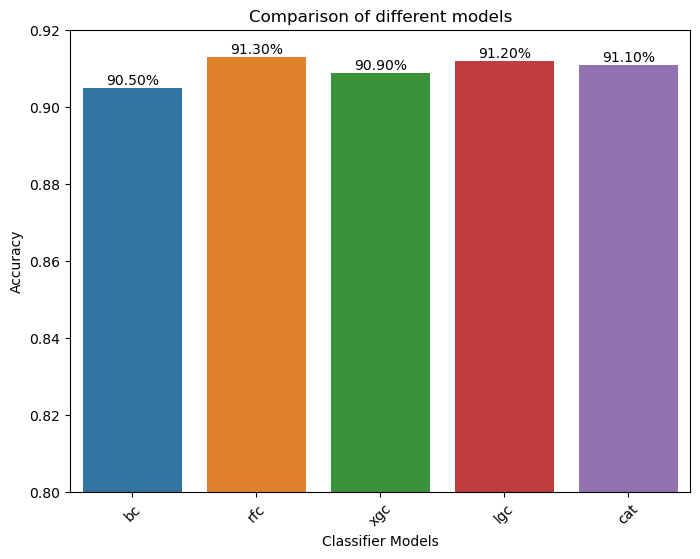

In [281]:
model_acc_bar_plot(model_acc_df_for_Backward,.80,.92)

### we got best accuracy at all colums in RFECV 

In [282]:
col=rfecv_col

In [283]:
print(x_sm.columns)
print('-----------------')
print(col)

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')
-----------------
['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']


In [284]:
arr=[]

for i in range(5):
    if i<1:
        traning(xx_train,y)
    elif i<2:
        traning(x_train_rfe,y)
    elif i<3:
        traning(trans_x_train,y)
    elif i<4:
        traning(for_x_train,y)
    else:
        traning(back_x_train,y)
    

lrg
0.751
-----------------------------------------
sgdc
0.732
-----------------------------------------
sv
0.867
-----------------------------------------
knn
0.819
-----------------------------------------
gnb
0.76
-----------------------------------------
mnb
0.6050000000000001
-----------------------------------------
dtc
0.885
-----------------------------------------
rfc
0.9199999999999999
-----------------------------------------
abc
0.8959999999999999
-----------------------------------------
bc
0.905
-----------------------------------------
gbc
0.916
-----------------------------------------
xgc
0.9179999999999998
-----------------------------------------
lgc
0.9179999999999999
-----------------------------------------
cat
0.915
-----------------------------------------
lrg
0.7299999999999999
-----------------------------------------
sgdc
0.7369999999999999
-----------------------------------------
sv
0.8709999999999999
-----------------------------------------
knn
0.869
----

In [285]:
len(arr)

5

In [287]:
new=np.array(arr).reshape(5,14)

In [288]:
neww=pd.DataFrame(new,columns=all_model)
neww

,lrg,sgdc,sv,knn,gnb,mnb,dtc,rfc,abc,bc,gbc,xgc,lgc,cat
0,0.751,0.732,0.867,0.819,0.760,0.605,0.885,0.920,0.896,0.905,0.916,0.918,0.918,0.915
1,0.730,0.737,0.871,0.869,0.738,0.589,0.884,0.911,0.885,0.891,0.900,0.899,0.904,0.901
2,0.752,0.733,0.869,0.814,0.762,0.649,0.882,0.921,0.891,0.898,0.916,0.927,0.926,0.916
3,0.741,0.717,0.874,0.875,0.749,0.563,0.857,0.917,0.881,0.901,0.904,0.909,0.912,0.911
4,0.741,0.744,0.874,0.875,0.749,0.563,0.861,0.910,0.881,0.893,0.905,0.909,0.912,0.911


# Plotting all 5 Feature selection technique accuracy

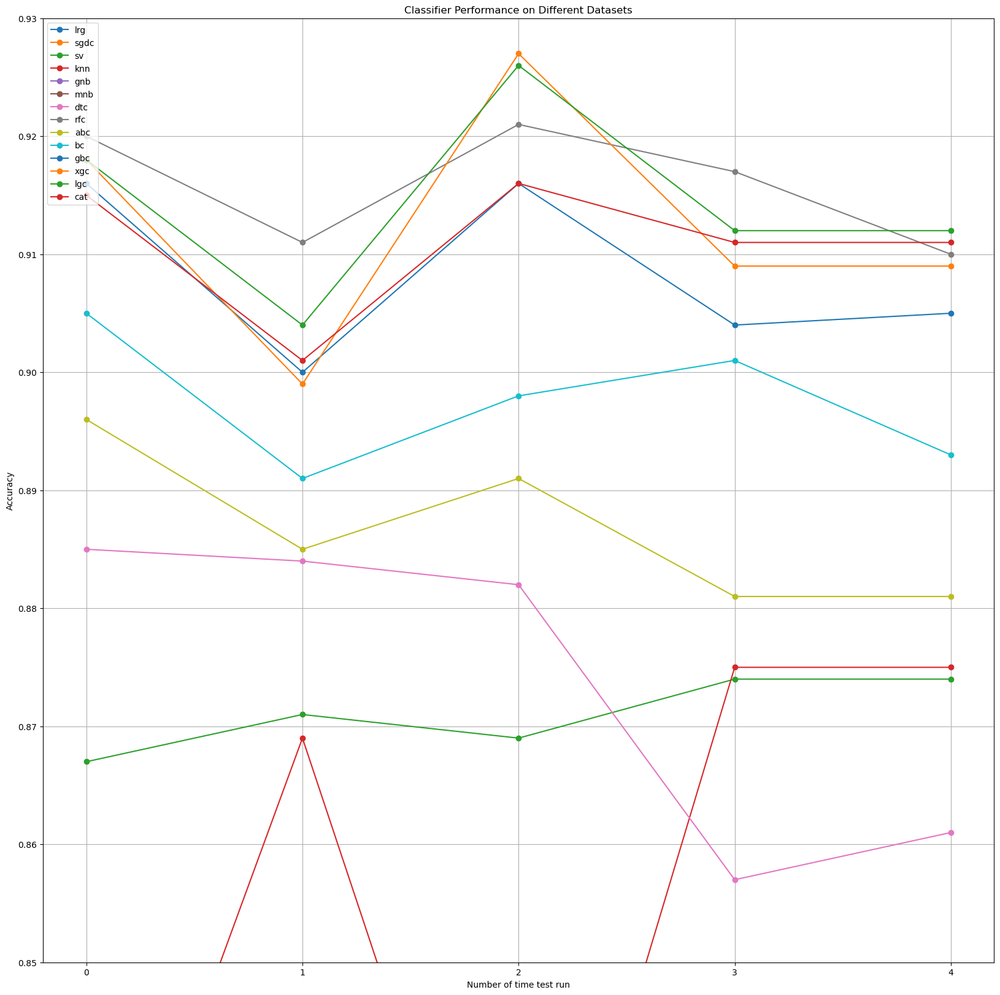

In [286]:
accuracy_plot(arr,.85,.93)

#### Here we can see RFECV feature selection giving the best result
##### Top 3 Algorithom
 - LIGHTGBM
 - Xgboost
 - RandomForestClassifier

In [289]:
models_layer1 = [
    ('rf1', RandomForestClassifier(100)),
    ('gb1', xgb.XGBClassifier()),
    ('sgd1', lgb.LGBMClassifier()),
    ('rf4', RandomForestClassifier(100))
]

models_layer2 = [
    ('rf674', RandomForestClassifier(100)),
    ('gb474', xgb.XGBClassifier()),
]
models_layer3 = [
    ('rf', RandomForestClassifier(100)),]

meta =  RandomForestClassifier(100)

In [290]:
scc=StackingClassifier(estimators=models_layer1,
            final_estimator=StackingClassifier(estimators=models_layer2,
                            final_estimator=StackingClassifier(estimators=models_layer3,
                                            final_estimator=meta, cv=5, stack_method='predict'),
                                                       cv=5, stack_method='predict'),
                                                               cv=5, stack_method='predict')

In [291]:
ssc=cross_val_mean_acc(model,trans_x_train,y)
print(ssc)

Learning rate set to 0.009849
0:	learn: 0.6837080	total: 7.77ms	remaining: 7.76s
1:	learn: 0.6731396	total: 13.4ms	remaining: 6.71s
2:	learn: 0.6651585	total: 18.7ms	remaining: 6.21s
3:	learn: 0.6557452	total: 23.5ms	remaining: 5.86s
4:	learn: 0.6458212	total: 28.4ms	remaining: 5.65s
5:	learn: 0.6357397	total: 35.4ms	remaining: 5.86s
6:	learn: 0.6253410	total: 44.7ms	remaining: 6.34s
7:	learn: 0.6158131	total: 53.7ms	remaining: 6.66s
8:	learn: 0.6072451	total: 62.1ms	remaining: 6.84s
9:	learn: 0.5995539	total: 71.8ms	remaining: 7.11s
10:	learn: 0.5916101	total: 80.8ms	remaining: 7.26s
11:	learn: 0.5826546	total: 87.1ms	remaining: 7.17s
12:	learn: 0.5749627	total: 95.4ms	remaining: 7.24s
13:	learn: 0.5671598	total: 103ms	remaining: 7.22s
14:	learn: 0.5605490	total: 110ms	remaining: 7.21s
15:	learn: 0.5539637	total: 118ms	remaining: 7.26s
16:	learn: 0.5463418	total: 126ms	remaining: 7.31s
17:	learn: 0.5406388	total: 135ms	remaining: 7.38s
18:	learn: 0.5343507	total: 143ms	remaining: 7.4s

165:	learn: 0.2203634	total: 1.4s	remaining: 7.03s
166:	learn: 0.2197946	total: 1.41s	remaining: 7.03s
167:	learn: 0.2191689	total: 1.42s	remaining: 7.02s
168:	learn: 0.2182441	total: 1.43s	remaining: 7.01s
169:	learn: 0.2178530	total: 1.43s	remaining: 7s
170:	learn: 0.2172281	total: 1.44s	remaining: 6.99s
171:	learn: 0.2165099	total: 1.45s	remaining: 6.99s
172:	learn: 0.2158214	total: 1.46s	remaining: 6.98s
173:	learn: 0.2150673	total: 1.47s	remaining: 6.97s
174:	learn: 0.2146541	total: 1.48s	remaining: 6.96s
175:	learn: 0.2139813	total: 1.49s	remaining: 6.96s
176:	learn: 0.2133307	total: 1.49s	remaining: 6.95s
177:	learn: 0.2128150	total: 1.5s	remaining: 6.94s
178:	learn: 0.2122659	total: 1.51s	remaining: 6.93s
179:	learn: 0.2115832	total: 1.52s	remaining: 6.93s
180:	learn: 0.2108253	total: 1.53s	remaining: 6.93s
181:	learn: 0.2103533	total: 1.54s	remaining: 6.92s
182:	learn: 0.2099485	total: 1.55s	remaining: 6.91s
183:	learn: 0.2095332	total: 1.56s	remaining: 6.9s
184:	learn: 0.2086

332:	learn: 0.1545292	total: 2.81s	remaining: 5.64s
333:	learn: 0.1543211	total: 2.82s	remaining: 5.63s
334:	learn: 0.1540095	total: 2.83s	remaining: 5.62s
335:	learn: 0.1537491	total: 2.84s	remaining: 5.61s
336:	learn: 0.1535244	total: 2.84s	remaining: 5.59s
337:	learn: 0.1531681	total: 2.85s	remaining: 5.58s
338:	learn: 0.1529714	total: 2.86s	remaining: 5.57s
339:	learn: 0.1526583	total: 2.86s	remaining: 5.56s
340:	learn: 0.1523951	total: 2.87s	remaining: 5.55s
341:	learn: 0.1521074	total: 2.88s	remaining: 5.54s
342:	learn: 0.1517448	total: 2.88s	remaining: 5.53s
343:	learn: 0.1514533	total: 2.89s	remaining: 5.52s
344:	learn: 0.1511478	total: 2.9s	remaining: 5.51s
345:	learn: 0.1510037	total: 2.91s	remaining: 5.5s
346:	learn: 0.1507680	total: 2.92s	remaining: 5.49s
347:	learn: 0.1505836	total: 2.92s	remaining: 5.48s
348:	learn: 0.1502639	total: 2.93s	remaining: 5.47s
349:	learn: 0.1499672	total: 2.94s	remaining: 5.47s
350:	learn: 0.1494851	total: 2.95s	remaining: 5.46s
351:	learn: 0.

513:	learn: 0.1153673	total: 4.39s	remaining: 4.15s
514:	learn: 0.1152008	total: 4.4s	remaining: 4.14s
515:	learn: 0.1149284	total: 4.41s	remaining: 4.13s
516:	learn: 0.1147440	total: 4.42s	remaining: 4.13s
517:	learn: 0.1145873	total: 4.42s	remaining: 4.12s
518:	learn: 0.1143907	total: 4.43s	remaining: 4.11s
519:	learn: 0.1142065	total: 4.44s	remaining: 4.1s
520:	learn: 0.1140638	total: 4.45s	remaining: 4.09s
521:	learn: 0.1139028	total: 4.46s	remaining: 4.08s
522:	learn: 0.1136993	total: 4.47s	remaining: 4.08s
523:	learn: 0.1135624	total: 4.48s	remaining: 4.07s
524:	learn: 0.1133376	total: 4.48s	remaining: 4.06s
525:	learn: 0.1131777	total: 4.49s	remaining: 4.05s
526:	learn: 0.1130039	total: 4.5s	remaining: 4.04s
527:	learn: 0.1129029	total: 4.51s	remaining: 4.03s
528:	learn: 0.1127480	total: 4.52s	remaining: 4.02s
529:	learn: 0.1126359	total: 4.53s	remaining: 4.01s
530:	learn: 0.1125436	total: 4.53s	remaining: 4s
531:	learn: 0.1124019	total: 4.54s	remaining: 4s
532:	learn: 0.1121569

673:	learn: 0.0921821	total: 5.78s	remaining: 2.8s
674:	learn: 0.0920376	total: 5.79s	remaining: 2.79s
675:	learn: 0.0918599	total: 5.8s	remaining: 2.78s
676:	learn: 0.0917194	total: 5.81s	remaining: 2.77s
677:	learn: 0.0916001	total: 5.82s	remaining: 2.76s
678:	learn: 0.0914264	total: 5.82s	remaining: 2.75s
679:	learn: 0.0912920	total: 5.83s	remaining: 2.75s
680:	learn: 0.0912177	total: 5.84s	remaining: 2.73s
681:	learn: 0.0910168	total: 5.85s	remaining: 2.73s
682:	learn: 0.0909155	total: 5.86s	remaining: 2.72s
683:	learn: 0.0907800	total: 5.86s	remaining: 2.71s
684:	learn: 0.0906949	total: 5.87s	remaining: 2.7s
685:	learn: 0.0904643	total: 5.88s	remaining: 2.69s
686:	learn: 0.0902831	total: 5.89s	remaining: 2.68s
687:	learn: 0.0902209	total: 5.89s	remaining: 2.67s
688:	learn: 0.0901465	total: 5.9s	remaining: 2.66s
689:	learn: 0.0898938	total: 5.91s	remaining: 2.65s
690:	learn: 0.0897089	total: 5.92s	remaining: 2.65s
691:	learn: 0.0896304	total: 5.93s	remaining: 2.64s
692:	learn: 0.08

832:	learn: 0.0737880	total: 7.13s	remaining: 1.43s
833:	learn: 0.0737193	total: 7.14s	remaining: 1.42s
834:	learn: 0.0735536	total: 7.15s	remaining: 1.41s
835:	learn: 0.0734264	total: 7.16s	remaining: 1.41s
836:	learn: 0.0733282	total: 7.17s	remaining: 1.4s
837:	learn: 0.0732373	total: 7.18s	remaining: 1.39s
838:	learn: 0.0731727	total: 7.19s	remaining: 1.38s
839:	learn: 0.0729948	total: 7.2s	remaining: 1.37s
840:	learn: 0.0728612	total: 7.2s	remaining: 1.36s
841:	learn: 0.0728181	total: 7.21s	remaining: 1.35s
842:	learn: 0.0727095	total: 7.22s	remaining: 1.34s
843:	learn: 0.0725469	total: 7.23s	remaining: 1.34s
844:	learn: 0.0725216	total: 7.24s	remaining: 1.33s
845:	learn: 0.0724354	total: 7.25s	remaining: 1.32s
846:	learn: 0.0723402	total: 7.26s	remaining: 1.31s
847:	learn: 0.0722466	total: 7.27s	remaining: 1.3s
848:	learn: 0.0721102	total: 7.28s	remaining: 1.29s
849:	learn: 0.0719996	total: 7.28s	remaining: 1.28s
850:	learn: 0.0718653	total: 7.29s	remaining: 1.28s
851:	learn: 0.07

994:	learn: 0.0602913	total: 8.5s	remaining: 42.7ms
995:	learn: 0.0602058	total: 8.52s	remaining: 34.2ms
996:	learn: 0.0601396	total: 8.52s	remaining: 25.6ms
997:	learn: 0.0600443	total: 8.53s	remaining: 17.1ms
998:	learn: 0.0600163	total: 8.54s	remaining: 8.55ms
999:	learn: 0.0598905	total: 8.55s	remaining: 0us
Learning rate set to 0.009849
0:	learn: 0.6818891	total: 12ms	remaining: 11.9s
1:	learn: 0.6720563	total: 22.9ms	remaining: 11.4s
2:	learn: 0.6638831	total: 34.1ms	remaining: 11.3s
3:	learn: 0.6536546	total: 43.5ms	remaining: 10.8s
4:	learn: 0.6440333	total: 51.9ms	remaining: 10.3s
5:	learn: 0.6331480	total: 59.9ms	remaining: 9.93s
6:	learn: 0.6223737	total: 68.8ms	remaining: 9.76s
7:	learn: 0.6127724	total: 77ms	remaining: 9.55s
8:	learn: 0.6042188	total: 84.7ms	remaining: 9.33s
9:	learn: 0.5964796	total: 93.5ms	remaining: 9.26s
10:	learn: 0.5880031	total: 101ms	remaining: 9.06s
11:	learn: 0.5791115	total: 109ms	remaining: 8.96s
12:	learn: 0.5712215	total: 118ms	remaining: 8.9

166:	learn: 0.2182656	total: 1.41s	remaining: 7.05s
167:	learn: 0.2176844	total: 1.42s	remaining: 7.05s
168:	learn: 0.2169163	total: 1.43s	remaining: 7.04s
169:	learn: 0.2163923	total: 1.44s	remaining: 7.03s
170:	learn: 0.2158659	total: 1.45s	remaining: 7.01s
171:	learn: 0.2153220	total: 1.45s	remaining: 7s
172:	learn: 0.2147060	total: 1.46s	remaining: 6.98s
173:	learn: 0.2140213	total: 1.47s	remaining: 6.97s
174:	learn: 0.2137041	total: 1.48s	remaining: 6.97s
175:	learn: 0.2130689	total: 1.49s	remaining: 6.96s
176:	learn: 0.2126688	total: 1.49s	remaining: 6.95s
177:	learn: 0.2122565	total: 1.5s	remaining: 6.94s
178:	learn: 0.2116173	total: 1.51s	remaining: 6.94s
179:	learn: 0.2109965	total: 1.52s	remaining: 6.93s
180:	learn: 0.2104173	total: 1.53s	remaining: 6.92s
181:	learn: 0.2100033	total: 1.54s	remaining: 6.92s
182:	learn: 0.2093813	total: 1.55s	remaining: 6.91s
183:	learn: 0.2087881	total: 1.55s	remaining: 6.9s
184:	learn: 0.2078583	total: 1.56s	remaining: 6.89s
185:	learn: 0.207

333:	learn: 0.1550983	total: 2.82s	remaining: 5.62s
334:	learn: 0.1549341	total: 2.83s	remaining: 5.61s
335:	learn: 0.1547661	total: 2.83s	remaining: 5.6s
336:	learn: 0.1543972	total: 2.84s	remaining: 5.59s
337:	learn: 0.1540946	total: 2.85s	remaining: 5.58s
338:	learn: 0.1537054	total: 2.85s	remaining: 5.57s
339:	learn: 0.1534746	total: 2.86s	remaining: 5.56s
340:	learn: 0.1532610	total: 2.87s	remaining: 5.55s
341:	learn: 0.1530004	total: 2.88s	remaining: 5.54s
342:	learn: 0.1527490	total: 2.89s	remaining: 5.53s
343:	learn: 0.1525177	total: 2.89s	remaining: 5.52s
344:	learn: 0.1523031	total: 2.9s	remaining: 5.51s
345:	learn: 0.1519902	total: 2.91s	remaining: 5.5s
346:	learn: 0.1517555	total: 2.92s	remaining: 5.49s
347:	learn: 0.1515669	total: 2.93s	remaining: 5.48s
348:	learn: 0.1512293	total: 2.93s	remaining: 5.47s
349:	learn: 0.1509125	total: 2.94s	remaining: 5.46s
350:	learn: 0.1505985	total: 2.95s	remaining: 5.45s
351:	learn: 0.1503373	total: 2.95s	remaining: 5.44s
352:	learn: 0.1

500:	learn: 0.1192463	total: 4.22s	remaining: 4.21s
501:	learn: 0.1190811	total: 4.24s	remaining: 4.2s
502:	learn: 0.1188091	total: 4.24s	remaining: 4.19s
503:	learn: 0.1185698	total: 4.25s	remaining: 4.18s
504:	learn: 0.1183436	total: 4.26s	remaining: 4.17s
505:	learn: 0.1181882	total: 4.27s	remaining: 4.17s
506:	learn: 0.1180794	total: 4.27s	remaining: 4.15s
507:	learn: 0.1178438	total: 4.28s	remaining: 4.15s
508:	learn: 0.1176915	total: 4.29s	remaining: 4.14s
509:	learn: 0.1174990	total: 4.3s	remaining: 4.13s
510:	learn: 0.1173604	total: 4.31s	remaining: 4.12s
511:	learn: 0.1172695	total: 4.31s	remaining: 4.11s
512:	learn: 0.1171771	total: 4.32s	remaining: 4.1s
513:	learn: 0.1170319	total: 4.33s	remaining: 4.09s
514:	learn: 0.1169545	total: 4.34s	remaining: 4.09s
515:	learn: 0.1168193	total: 4.35s	remaining: 4.08s
516:	learn: 0.1167082	total: 4.36s	remaining: 4.07s
517:	learn: 0.1165783	total: 4.37s	remaining: 4.06s
518:	learn: 0.1163472	total: 4.38s	remaining: 4.05s
519:	learn: 0.1

667:	learn: 0.0956981	total: 5.58s	remaining: 2.77s
668:	learn: 0.0955503	total: 5.59s	remaining: 2.76s
669:	learn: 0.0954284	total: 5.6s	remaining: 2.76s
670:	learn: 0.0952515	total: 5.61s	remaining: 2.75s
671:	learn: 0.0950702	total: 5.61s	remaining: 2.74s
672:	learn: 0.0949149	total: 5.62s	remaining: 2.73s
673:	learn: 0.0948568	total: 5.63s	remaining: 2.72s
674:	learn: 0.0947871	total: 5.64s	remaining: 2.72s
675:	learn: 0.0946162	total: 5.65s	remaining: 2.71s
676:	learn: 0.0945485	total: 5.66s	remaining: 2.7s
677:	learn: 0.0944938	total: 5.67s	remaining: 2.69s
678:	learn: 0.0941904	total: 5.68s	remaining: 2.68s
679:	learn: 0.0940350	total: 5.68s	remaining: 2.67s
680:	learn: 0.0938844	total: 5.7s	remaining: 2.67s
681:	learn: 0.0938157	total: 5.7s	remaining: 2.66s
682:	learn: 0.0936636	total: 5.71s	remaining: 2.65s
683:	learn: 0.0935212	total: 5.72s	remaining: 2.64s
684:	learn: 0.0934352	total: 5.73s	remaining: 2.63s
685:	learn: 0.0933135	total: 5.74s	remaining: 2.63s
686:	learn: 0.09

832:	learn: 0.0773634	total: 7s	remaining: 1.4s
833:	learn: 0.0772899	total: 7.01s	remaining: 1.4s
834:	learn: 0.0772176	total: 7.02s	remaining: 1.39s
835:	learn: 0.0771284	total: 7.03s	remaining: 1.38s
836:	learn: 0.0770751	total: 7.07s	remaining: 1.38s
837:	learn: 0.0769808	total: 7.08s	remaining: 1.37s
838:	learn: 0.0768066	total: 7.09s	remaining: 1.36s
839:	learn: 0.0767646	total: 7.1s	remaining: 1.35s
840:	learn: 0.0767309	total: 7.1s	remaining: 1.34s
841:	learn: 0.0766850	total: 7.11s	remaining: 1.33s
842:	learn: 0.0766206	total: 7.12s	remaining: 1.32s
843:	learn: 0.0765503	total: 7.12s	remaining: 1.32s
844:	learn: 0.0764753	total: 7.13s	remaining: 1.31s
845:	learn: 0.0764240	total: 7.13s	remaining: 1.3s
846:	learn: 0.0763025	total: 7.14s	remaining: 1.29s
847:	learn: 0.0761165	total: 7.14s	remaining: 1.28s
848:	learn: 0.0759742	total: 7.15s	remaining: 1.27s
849:	learn: 0.0758468	total: 7.15s	remaining: 1.26s
850:	learn: 0.0758250	total: 7.16s	remaining: 1.25s
851:	learn: 0.075716

995:	learn: 0.0646237	total: 8.35s	remaining: 33.5ms
996:	learn: 0.0645654	total: 8.36s	remaining: 25.2ms
997:	learn: 0.0645136	total: 8.37s	remaining: 16.8ms
998:	learn: 0.0644584	total: 8.38s	remaining: 8.38ms
999:	learn: 0.0644118	total: 8.38s	remaining: 0us
Learning rate set to 0.009849
0:	learn: 0.6819245	total: 9.26ms	remaining: 9.25s
1:	learn: 0.6722076	total: 18.2ms	remaining: 9.07s
2:	learn: 0.6627953	total: 28.6ms	remaining: 9.51s
3:	learn: 0.6512739	total: 38.4ms	remaining: 9.56s
4:	learn: 0.6411926	total: 46.8ms	remaining: 9.31s
5:	learn: 0.6314003	total: 55.1ms	remaining: 9.13s
6:	learn: 0.6211039	total: 64ms	remaining: 9.08s
7:	learn: 0.6110487	total: 72.1ms	remaining: 8.94s
8:	learn: 0.6040680	total: 80.7ms	remaining: 8.88s
9:	learn: 0.5960720	total: 89.1ms	remaining: 8.82s
10:	learn: 0.5883377	total: 97.6ms	remaining: 8.78s
11:	learn: 0.5801351	total: 105ms	remaining: 8.68s
12:	learn: 0.5734608	total: 114ms	remaining: 8.62s
13:	learn: 0.5644850	total: 122ms	remaining: 8

164:	learn: 0.2219481	total: 1.4s	remaining: 7.08s
165:	learn: 0.2213990	total: 1.41s	remaining: 7.08s
166:	learn: 0.2207799	total: 1.42s	remaining: 7.06s
167:	learn: 0.2201840	total: 1.42s	remaining: 7.06s
168:	learn: 0.2194461	total: 1.43s	remaining: 7.04s
169:	learn: 0.2189270	total: 1.44s	remaining: 7.04s
170:	learn: 0.2183252	total: 1.45s	remaining: 7.02s
171:	learn: 0.2173621	total: 1.46s	remaining: 7.01s
172:	learn: 0.2168579	total: 1.46s	remaining: 7s
173:	learn: 0.2161990	total: 1.47s	remaining: 6.99s
174:	learn: 0.2157776	total: 1.48s	remaining: 6.97s
175:	learn: 0.2151163	total: 1.49s	remaining: 6.97s
176:	learn: 0.2145821	total: 1.5s	remaining: 6.96s
177:	learn: 0.2141520	total: 1.5s	remaining: 6.94s
178:	learn: 0.2137017	total: 1.51s	remaining: 6.93s
179:	learn: 0.2129709	total: 1.52s	remaining: 6.92s
180:	learn: 0.2124449	total: 1.53s	remaining: 6.91s
181:	learn: 0.2119062	total: 1.54s	remaining: 6.91s
182:	learn: 0.2115891	total: 1.54s	remaining: 6.9s
183:	learn: 0.21102

329:	learn: 0.1583465	total: 2.77s	remaining: 5.62s
330:	learn: 0.1580378	total: 2.78s	remaining: 5.62s
331:	learn: 0.1579382	total: 2.79s	remaining: 5.61s
332:	learn: 0.1577090	total: 2.79s	remaining: 5.6s
333:	learn: 0.1574751	total: 2.8s	remaining: 5.58s
334:	learn: 0.1571951	total: 2.81s	remaining: 5.57s
335:	learn: 0.1569791	total: 2.81s	remaining: 5.56s
336:	learn: 0.1566479	total: 2.82s	remaining: 5.55s
337:	learn: 0.1564529	total: 2.83s	remaining: 5.54s
338:	learn: 0.1562524	total: 2.83s	remaining: 5.52s
339:	learn: 0.1560518	total: 2.84s	remaining: 5.51s
340:	learn: 0.1557480	total: 2.85s	remaining: 5.5s
341:	learn: 0.1554658	total: 2.85s	remaining: 5.49s
342:	learn: 0.1552480	total: 2.86s	remaining: 5.48s
343:	learn: 0.1549746	total: 2.87s	remaining: 5.47s
344:	learn: 0.1546850	total: 2.88s	remaining: 5.46s
345:	learn: 0.1545349	total: 2.88s	remaining: 5.45s
346:	learn: 0.1542733	total: 2.89s	remaining: 5.45s
347:	learn: 0.1540222	total: 2.9s	remaining: 5.44s
348:	learn: 0.15

496:	learn: 0.1221907	total: 4.15s	remaining: 4.2s
497:	learn: 0.1219786	total: 4.16s	remaining: 4.19s
498:	learn: 0.1217623	total: 4.17s	remaining: 4.18s
499:	learn: 0.1216748	total: 4.18s	remaining: 4.18s
500:	learn: 0.1215442	total: 4.18s	remaining: 4.17s
501:	learn: 0.1212935	total: 4.19s	remaining: 4.16s
502:	learn: 0.1212230	total: 4.2s	remaining: 4.15s
503:	learn: 0.1209951	total: 4.21s	remaining: 4.14s
504:	learn: 0.1208240	total: 4.22s	remaining: 4.13s
505:	learn: 0.1206598	total: 4.22s	remaining: 4.13s
506:	learn: 0.1204669	total: 4.23s	remaining: 4.12s
507:	learn: 0.1203723	total: 4.24s	remaining: 4.11s
508:	learn: 0.1202504	total: 4.25s	remaining: 4.1s
509:	learn: 0.1200305	total: 4.26s	remaining: 4.09s
510:	learn: 0.1199110	total: 4.27s	remaining: 4.08s
511:	learn: 0.1197500	total: 4.28s	remaining: 4.08s
512:	learn: 0.1195354	total: 4.29s	remaining: 4.07s
513:	learn: 0.1193663	total: 4.3s	remaining: 4.06s
514:	learn: 0.1192026	total: 4.31s	remaining: 4.05s
515:	learn: 0.11

677:	learn: 0.0951801	total: 5.73s	remaining: 2.72s
678:	learn: 0.0950510	total: 5.74s	remaining: 2.71s
679:	learn: 0.0949519	total: 5.75s	remaining: 2.71s
680:	learn: 0.0947877	total: 5.76s	remaining: 2.7s
681:	learn: 0.0945859	total: 5.77s	remaining: 2.69s
682:	learn: 0.0944089	total: 5.78s	remaining: 2.68s
683:	learn: 0.0943353	total: 5.79s	remaining: 2.67s
684:	learn: 0.0942518	total: 5.8s	remaining: 2.67s
685:	learn: 0.0941948	total: 5.8s	remaining: 2.66s
686:	learn: 0.0940256	total: 5.81s	remaining: 2.65s
687:	learn: 0.0938797	total: 5.82s	remaining: 2.64s
688:	learn: 0.0937834	total: 5.83s	remaining: 2.63s
689:	learn: 0.0937019	total: 5.84s	remaining: 2.62s
690:	learn: 0.0936051	total: 5.84s	remaining: 2.61s
691:	learn: 0.0934877	total: 5.85s	remaining: 2.6s
692:	learn: 0.0933421	total: 5.86s	remaining: 2.6s
693:	learn: 0.0932480	total: 5.87s	remaining: 2.59s
694:	learn: 0.0930973	total: 5.88s	remaining: 2.58s
695:	learn: 0.0929924	total: 5.89s	remaining: 2.57s
696:	learn: 0.092

855:	learn: 0.0741788	total: 7.31s	remaining: 1.23s
856:	learn: 0.0740930	total: 7.32s	remaining: 1.22s
857:	learn: 0.0739732	total: 7.33s	remaining: 1.21s
858:	learn: 0.0738563	total: 7.34s	remaining: 1.2s
859:	learn: 0.0737491	total: 7.34s	remaining: 1.2s
860:	learn: 0.0736568	total: 7.35s	remaining: 1.19s
861:	learn: 0.0734311	total: 7.36s	remaining: 1.18s
862:	learn: 0.0733102	total: 7.37s	remaining: 1.17s
863:	learn: 0.0732680	total: 7.38s	remaining: 1.16s
864:	learn: 0.0730501	total: 7.39s	remaining: 1.15s
865:	learn: 0.0729383	total: 7.4s	remaining: 1.14s
866:	learn: 0.0728593	total: 7.41s	remaining: 1.14s
867:	learn: 0.0728053	total: 7.42s	remaining: 1.13s
868:	learn: 0.0727301	total: 7.42s	remaining: 1.12s
869:	learn: 0.0725196	total: 7.43s	remaining: 1.11s
870:	learn: 0.0724992	total: 7.44s	remaining: 1.1s
871:	learn: 0.0724791	total: 7.45s	remaining: 1.09s
872:	learn: 0.0724331	total: 7.46s	remaining: 1.08s
873:	learn: 0.0724066	total: 7.47s	remaining: 1.08s
874:	learn: 0.07

21:	learn: 0.5104497	total: 191ms	remaining: 8.5s
22:	learn: 0.5046027	total: 201ms	remaining: 8.54s
23:	learn: 0.4979257	total: 210ms	remaining: 8.52s
24:	learn: 0.4925573	total: 219ms	remaining: 8.52s
25:	learn: 0.4870397	total: 227ms	remaining: 8.5s
26:	learn: 0.4815409	total: 236ms	remaining: 8.51s
27:	learn: 0.4755597	total: 246ms	remaining: 8.53s
28:	learn: 0.4709140	total: 254ms	remaining: 8.51s
29:	learn: 0.4658913	total: 261ms	remaining: 8.45s
30:	learn: 0.4615789	total: 269ms	remaining: 8.4s
31:	learn: 0.4572120	total: 276ms	remaining: 8.36s
32:	learn: 0.4527177	total: 285ms	remaining: 8.34s
33:	learn: 0.4471583	total: 292ms	remaining: 8.29s
34:	learn: 0.4424084	total: 299ms	remaining: 8.25s
35:	learn: 0.4376074	total: 308ms	remaining: 8.24s
36:	learn: 0.4322800	total: 316ms	remaining: 8.23s
37:	learn: 0.4282194	total: 325ms	remaining: 8.24s
38:	learn: 0.4249581	total: 334ms	remaining: 8.22s
39:	learn: 0.4209280	total: 343ms	remaining: 8.22s
40:	learn: 0.4161283	total: 351ms	

182:	learn: 0.2059311	total: 1.56s	remaining: 6.98s
183:	learn: 0.2054209	total: 1.57s	remaining: 6.97s
184:	learn: 0.2050782	total: 1.58s	remaining: 6.97s
185:	learn: 0.2045173	total: 1.59s	remaining: 6.96s
186:	learn: 0.2039147	total: 1.6s	remaining: 6.95s
187:	learn: 0.2035511	total: 1.61s	remaining: 6.94s
188:	learn: 0.2032391	total: 1.61s	remaining: 6.93s
189:	learn: 0.2028065	total: 1.63s	remaining: 6.93s
190:	learn: 0.2024111	total: 1.63s	remaining: 6.92s
191:	learn: 0.2019834	total: 1.64s	remaining: 6.92s
192:	learn: 0.2013816	total: 1.65s	remaining: 6.91s
193:	learn: 0.2009754	total: 1.66s	remaining: 6.9s
194:	learn: 0.2005717	total: 1.67s	remaining: 6.9s
195:	learn: 0.2000697	total: 1.68s	remaining: 6.89s
196:	learn: 0.1995222	total: 1.69s	remaining: 6.88s
197:	learn: 0.1989394	total: 1.7s	remaining: 6.87s
198:	learn: 0.1984636	total: 1.71s	remaining: 6.86s
199:	learn: 0.1979602	total: 1.71s	remaining: 6.86s
200:	learn: 0.1975119	total: 1.72s	remaining: 6.85s
201:	learn: 0.19

349:	learn: 0.1478449	total: 2.96s	remaining: 5.5s
350:	learn: 0.1476557	total: 2.97s	remaining: 5.49s
351:	learn: 0.1474422	total: 2.98s	remaining: 5.48s
352:	learn: 0.1472087	total: 2.98s	remaining: 5.47s
353:	learn: 0.1468481	total: 2.99s	remaining: 5.46s
354:	learn: 0.1465796	total: 3s	remaining: 5.45s
355:	learn: 0.1464042	total: 3.01s	remaining: 5.44s
356:	learn: 0.1461654	total: 3.02s	remaining: 5.43s
357:	learn: 0.1459332	total: 3.03s	remaining: 5.43s
358:	learn: 0.1456410	total: 3.03s	remaining: 5.42s
359:	learn: 0.1455069	total: 3.04s	remaining: 5.41s
360:	learn: 0.1451196	total: 3.05s	remaining: 5.41s
361:	learn: 0.1448669	total: 3.06s	remaining: 5.4s
362:	learn: 0.1445725	total: 3.07s	remaining: 5.39s
363:	learn: 0.1443530	total: 3.08s	remaining: 5.38s
364:	learn: 0.1441318	total: 3.09s	remaining: 5.37s
365:	learn: 0.1439590	total: 3.1s	remaining: 5.37s
366:	learn: 0.1438077	total: 3.11s	remaining: 5.36s
367:	learn: 0.1435491	total: 3.12s	remaining: 5.35s
368:	learn: 0.1432

528:	learn: 0.1138569	total: 4.53s	remaining: 4.03s
529:	learn: 0.1137861	total: 4.54s	remaining: 4.02s
530:	learn: 0.1136360	total: 4.54s	remaining: 4.01s
531:	learn: 0.1133914	total: 4.55s	remaining: 4s
532:	learn: 0.1132654	total: 4.56s	remaining: 4s
533:	learn: 0.1132167	total: 4.57s	remaining: 3.99s
534:	learn: 0.1130880	total: 4.58s	remaining: 3.98s
535:	learn: 0.1130009	total: 4.58s	remaining: 3.97s
536:	learn: 0.1129084	total: 4.59s	remaining: 3.96s
537:	learn: 0.1126128	total: 4.6s	remaining: 3.95s
538:	learn: 0.1124691	total: 4.61s	remaining: 3.94s
539:	learn: 0.1122588	total: 4.62s	remaining: 3.93s
540:	learn: 0.1121572	total: 4.63s	remaining: 3.93s
541:	learn: 0.1119747	total: 4.64s	remaining: 3.92s
542:	learn: 0.1117635	total: 4.65s	remaining: 3.91s
543:	learn: 0.1115914	total: 4.66s	remaining: 3.9s
544:	learn: 0.1114763	total: 4.66s	remaining: 3.89s
545:	learn: 0.1113580	total: 4.67s	remaining: 3.89s
546:	learn: 0.1111960	total: 4.68s	remaining: 3.88s
547:	learn: 0.110980

690:	learn: 0.0926067	total: 5.93s	remaining: 2.65s
691:	learn: 0.0925464	total: 5.94s	remaining: 2.65s
692:	learn: 0.0923396	total: 5.95s	remaining: 2.64s
693:	learn: 0.0921859	total: 5.96s	remaining: 2.63s
694:	learn: 0.0919548	total: 5.97s	remaining: 2.62s
695:	learn: 0.0918571	total: 5.98s	remaining: 2.61s
696:	learn: 0.0917541	total: 5.98s	remaining: 2.6s
697:	learn: 0.0916770	total: 5.99s	remaining: 2.59s
698:	learn: 0.0915909	total: 6s	remaining: 2.58s
699:	learn: 0.0914500	total: 6.01s	remaining: 2.58s
700:	learn: 0.0913923	total: 6.02s	remaining: 2.57s
701:	learn: 0.0912620	total: 6.03s	remaining: 2.56s
702:	learn: 0.0911502	total: 6.04s	remaining: 2.55s
703:	learn: 0.0910881	total: 6.04s	remaining: 2.54s
704:	learn: 0.0908805	total: 6.05s	remaining: 2.53s
705:	learn: 0.0907693	total: 6.06s	remaining: 2.52s
706:	learn: 0.0906720	total: 6.07s	remaining: 2.52s
707:	learn: 0.0905483	total: 6.08s	remaining: 2.51s
708:	learn: 0.0904117	total: 6.08s	remaining: 2.5s
709:	learn: 0.090

851:	learn: 0.0768958	total: 7.34s	remaining: 1.27s
852:	learn: 0.0768684	total: 7.35s	remaining: 1.27s
853:	learn: 0.0768026	total: 7.36s	remaining: 1.26s
854:	learn: 0.0766647	total: 7.37s	remaining: 1.25s
855:	learn: 0.0766370	total: 7.37s	remaining: 1.24s
856:	learn: 0.0765066	total: 7.38s	remaining: 1.23s
857:	learn: 0.0764911	total: 7.39s	remaining: 1.22s
858:	learn: 0.0763768	total: 7.4s	remaining: 1.21s
859:	learn: 0.0763227	total: 7.41s	remaining: 1.21s
860:	learn: 0.0762376	total: 7.42s	remaining: 1.2s
861:	learn: 0.0761588	total: 7.42s	remaining: 1.19s
862:	learn: 0.0759590	total: 7.43s	remaining: 1.18s
863:	learn: 0.0759176	total: 7.44s	remaining: 1.17s
864:	learn: 0.0757832	total: 7.45s	remaining: 1.16s
865:	learn: 0.0756221	total: 7.46s	remaining: 1.15s
866:	learn: 0.0755909	total: 7.47s	remaining: 1.15s
867:	learn: 0.0754343	total: 7.48s	remaining: 1.14s
868:	learn: 0.0753725	total: 7.49s	remaining: 1.13s
869:	learn: 0.0753242	total: 7.5s	remaining: 1.12s
870:	learn: 0.0

21:	learn: 0.5131185	total: 194ms	remaining: 8.61s
22:	learn: 0.5072207	total: 204ms	remaining: 8.65s
23:	learn: 0.5021970	total: 212ms	remaining: 8.62s
24:	learn: 0.4971650	total: 221ms	remaining: 8.61s
25:	learn: 0.4921508	total: 229ms	remaining: 8.58s
26:	learn: 0.4860864	total: 237ms	remaining: 8.54s
27:	learn: 0.4805619	total: 246ms	remaining: 8.55s
28:	learn: 0.4767702	total: 256ms	remaining: 8.55s
29:	learn: 0.4714808	total: 265ms	remaining: 8.57s
30:	learn: 0.4657556	total: 274ms	remaining: 8.55s
31:	learn: 0.4617109	total: 282ms	remaining: 8.52s
32:	learn: 0.4578505	total: 290ms	remaining: 8.51s
33:	learn: 0.4530706	total: 299ms	remaining: 8.49s
34:	learn: 0.4492077	total: 307ms	remaining: 8.47s
35:	learn: 0.4445448	total: 315ms	remaining: 8.44s
36:	learn: 0.4401862	total: 324ms	remaining: 8.44s
37:	learn: 0.4349469	total: 333ms	remaining: 8.43s
38:	learn: 0.4316613	total: 342ms	remaining: 8.42s
39:	learn: 0.4277263	total: 350ms	remaining: 8.39s
40:	learn: 0.4238983	total: 358

190:	learn: 0.2135480	total: 1.58s	remaining: 6.69s
191:	learn: 0.2126830	total: 1.59s	remaining: 6.69s
192:	learn: 0.2122868	total: 1.6s	remaining: 6.68s
193:	learn: 0.2117687	total: 1.61s	remaining: 6.67s
194:	learn: 0.2109988	total: 1.61s	remaining: 6.67s
195:	learn: 0.2104312	total: 1.62s	remaining: 6.66s
196:	learn: 0.2099401	total: 1.63s	remaining: 6.65s
197:	learn: 0.2093027	total: 1.64s	remaining: 6.64s
198:	learn: 0.2088652	total: 1.65s	remaining: 6.64s
199:	learn: 0.2082983	total: 1.66s	remaining: 6.64s
200:	learn: 0.2078103	total: 1.67s	remaining: 6.63s
201:	learn: 0.2074293	total: 1.68s	remaining: 6.63s
202:	learn: 0.2068521	total: 1.69s	remaining: 6.62s
203:	learn: 0.2059986	total: 1.69s	remaining: 6.61s
204:	learn: 0.2055596	total: 1.7s	remaining: 6.6s
205:	learn: 0.2051997	total: 1.71s	remaining: 6.6s
206:	learn: 0.2047060	total: 1.72s	remaining: 6.59s
207:	learn: 0.2043479	total: 1.73s	remaining: 6.58s
208:	learn: 0.2038122	total: 1.74s	remaining: 6.58s
209:	learn: 0.20

350:	learn: 0.1574155	total: 2.95s	remaining: 5.46s
351:	learn: 0.1571869	total: 2.96s	remaining: 5.45s
352:	learn: 0.1569545	total: 2.97s	remaining: 5.44s
353:	learn: 0.1566063	total: 2.98s	remaining: 5.44s
354:	learn: 0.1562426	total: 2.99s	remaining: 5.43s
355:	learn: 0.1559941	total: 3s	remaining: 5.42s
356:	learn: 0.1558475	total: 3s	remaining: 5.41s
357:	learn: 0.1555292	total: 3.01s	remaining: 5.4s
358:	learn: 0.1552700	total: 3.02s	remaining: 5.39s
359:	learn: 0.1551218	total: 3.03s	remaining: 5.38s
360:	learn: 0.1548472	total: 3.04s	remaining: 5.38s
361:	learn: 0.1546799	total: 3.04s	remaining: 5.37s
362:	learn: 0.1543461	total: 3.05s	remaining: 5.36s
363:	learn: 0.1541630	total: 3.06s	remaining: 5.35s
364:	learn: 0.1539137	total: 3.07s	remaining: 5.34s
365:	learn: 0.1536831	total: 3.08s	remaining: 5.34s
366:	learn: 0.1535410	total: 3.09s	remaining: 5.33s
367:	learn: 0.1534183	total: 3.1s	remaining: 5.32s
368:	learn: 0.1531415	total: 3.11s	remaining: 5.31s
369:	learn: 0.152933

509:	learn: 0.1236190	total: 4.31s	remaining: 4.14s
510:	learn: 0.1234063	total: 4.32s	remaining: 4.13s
511:	learn: 0.1232434	total: 4.33s	remaining: 4.13s
512:	learn: 0.1230530	total: 4.34s	remaining: 4.12s
513:	learn: 0.1228699	total: 4.35s	remaining: 4.11s
514:	learn: 0.1227407	total: 4.36s	remaining: 4.1s
515:	learn: 0.1225776	total: 4.36s	remaining: 4.09s
516:	learn: 0.1224217	total: 4.37s	remaining: 4.08s
517:	learn: 0.1222244	total: 4.38s	remaining: 4.08s
518:	learn: 0.1220030	total: 4.39s	remaining: 4.07s
519:	learn: 0.1217804	total: 4.4s	remaining: 4.06s
520:	learn: 0.1216138	total: 4.41s	remaining: 4.05s
521:	learn: 0.1214067	total: 4.42s	remaining: 4.04s
522:	learn: 0.1211658	total: 4.42s	remaining: 4.04s
523:	learn: 0.1210300	total: 4.43s	remaining: 4.03s
524:	learn: 0.1208532	total: 4.44s	remaining: 4.02s
525:	learn: 0.1207042	total: 4.45s	remaining: 4.01s
526:	learn: 0.1205258	total: 4.46s	remaining: 4s
527:	learn: 0.1202764	total: 4.47s	remaining: 3.99s
528:	learn: 0.120

690:	learn: 0.0964804	total: 5.84s	remaining: 2.61s
691:	learn: 0.0964156	total: 5.85s	remaining: 2.6s
692:	learn: 0.0962995	total: 5.86s	remaining: 2.6s
693:	learn: 0.0961970	total: 5.87s	remaining: 2.59s
694:	learn: 0.0960101	total: 5.88s	remaining: 2.58s
695:	learn: 0.0958543	total: 5.88s	remaining: 2.57s
696:	learn: 0.0958071	total: 5.89s	remaining: 2.56s
697:	learn: 0.0956967	total: 5.9s	remaining: 2.55s
698:	learn: 0.0956007	total: 5.91s	remaining: 2.54s
699:	learn: 0.0954858	total: 5.92s	remaining: 2.54s
700:	learn: 0.0953652	total: 5.92s	remaining: 2.53s
701:	learn: 0.0952682	total: 5.93s	remaining: 2.52s
702:	learn: 0.0952254	total: 5.94s	remaining: 2.51s
703:	learn: 0.0950714	total: 5.95s	remaining: 2.5s
704:	learn: 0.0948595	total: 5.96s	remaining: 2.49s
705:	learn: 0.0947521	total: 5.97s	remaining: 2.48s
706:	learn: 0.0945996	total: 5.98s	remaining: 2.48s
707:	learn: 0.0945179	total: 5.99s	remaining: 2.47s
708:	learn: 0.0943472	total: 5.99s	remaining: 2.46s
709:	learn: 0.09

861:	learn: 0.0778573	total: 7.26s	remaining: 1.16s
862:	learn: 0.0777748	total: 7.27s	remaining: 1.15s
863:	learn: 0.0777435	total: 7.28s	remaining: 1.15s
864:	learn: 0.0776516	total: 7.29s	remaining: 1.14s
865:	learn: 0.0775180	total: 7.3s	remaining: 1.13s
866:	learn: 0.0774772	total: 7.31s	remaining: 1.12s
867:	learn: 0.0772940	total: 7.32s	remaining: 1.11s
868:	learn: 0.0771863	total: 7.33s	remaining: 1.1s
869:	learn: 0.0771343	total: 7.33s	remaining: 1.09s
870:	learn: 0.0771154	total: 7.34s	remaining: 1.09s
871:	learn: 0.0770881	total: 7.35s	remaining: 1.08s
872:	learn: 0.0769914	total: 7.36s	remaining: 1.07s
873:	learn: 0.0768785	total: 7.37s	remaining: 1.06s
874:	learn: 0.0767002	total: 7.38s	remaining: 1.05s
875:	learn: 0.0765879	total: 7.38s	remaining: 1.04s
876:	learn: 0.0764669	total: 7.39s	remaining: 1.04s
877:	learn: 0.0763461	total: 7.4s	remaining: 1.03s
878:	learn: 0.0763155	total: 7.41s	remaining: 1.02s
879:	learn: 0.0762266	total: 7.42s	remaining: 1.01s
880:	learn: 0.0

30:	learn: 0.4651541	total: 263ms	remaining: 8.23s
31:	learn: 0.4610569	total: 272ms	remaining: 8.22s
32:	learn: 0.4566735	total: 279ms	remaining: 8.18s
33:	learn: 0.4511926	total: 288ms	remaining: 8.17s
34:	learn: 0.4474356	total: 297ms	remaining: 8.18s
35:	learn: 0.4420529	total: 305ms	remaining: 8.16s
36:	learn: 0.4376879	total: 313ms	remaining: 8.15s
37:	learn: 0.4328126	total: 322ms	remaining: 8.14s
38:	learn: 0.4294190	total: 331ms	remaining: 8.15s
39:	learn: 0.4257022	total: 339ms	remaining: 8.13s
40:	learn: 0.4221852	total: 347ms	remaining: 8.12s
41:	learn: 0.4176689	total: 354ms	remaining: 8.07s
42:	learn: 0.4134649	total: 362ms	remaining: 8.06s
43:	learn: 0.4092026	total: 371ms	remaining: 8.06s
44:	learn: 0.4055307	total: 380ms	remaining: 8.06s
45:	learn: 0.4010879	total: 388ms	remaining: 8.05s
46:	learn: 0.3974966	total: 397ms	remaining: 8.04s
47:	learn: 0.3942492	total: 405ms	remaining: 8.03s
48:	learn: 0.3910411	total: 413ms	remaining: 8.02s
49:	learn: 0.3878202	total: 422

190:	learn: 0.2090648	total: 1.64s	remaining: 6.94s
191:	learn: 0.2082333	total: 1.65s	remaining: 6.93s
192:	learn: 0.2076882	total: 1.65s	remaining: 6.92s
193:	learn: 0.2072330	total: 1.66s	remaining: 6.9s
194:	learn: 0.2067028	total: 1.67s	remaining: 6.89s
195:	learn: 0.2063367	total: 1.68s	remaining: 6.88s
196:	learn: 0.2058946	total: 1.69s	remaining: 6.88s
197:	learn: 0.2054492	total: 1.69s	remaining: 6.86s
198:	learn: 0.2049635	total: 1.7s	remaining: 6.85s
199:	learn: 0.2043303	total: 1.71s	remaining: 6.84s
200:	learn: 0.2038494	total: 1.72s	remaining: 6.83s
201:	learn: 0.2035226	total: 1.73s	remaining: 6.82s
202:	learn: 0.2030203	total: 1.74s	remaining: 6.82s
203:	learn: 0.2026051	total: 1.75s	remaining: 6.81s
204:	learn: 0.2021542	total: 1.75s	remaining: 6.81s
205:	learn: 0.2015112	total: 1.76s	remaining: 6.8s
206:	learn: 0.2010123	total: 1.77s	remaining: 6.79s
207:	learn: 0.2006657	total: 1.78s	remaining: 6.78s
208:	learn: 0.2002372	total: 1.79s	remaining: 6.77s
209:	learn: 0.1

355:	learn: 0.1533274	total: 3.05s	remaining: 5.51s
356:	learn: 0.1530023	total: 3.05s	remaining: 5.5s
357:	learn: 0.1528146	total: 3.06s	remaining: 5.49s
358:	learn: 0.1525825	total: 3.07s	remaining: 5.48s
359:	learn: 0.1524329	total: 3.08s	remaining: 5.47s
360:	learn: 0.1520543	total: 3.08s	remaining: 5.46s
361:	learn: 0.1518286	total: 3.09s	remaining: 5.45s
362:	learn: 0.1516433	total: 3.1s	remaining: 5.44s
363:	learn: 0.1514816	total: 3.11s	remaining: 5.43s
364:	learn: 0.1511391	total: 3.12s	remaining: 5.42s
365:	learn: 0.1508825	total: 3.13s	remaining: 5.42s
366:	learn: 0.1507947	total: 3.13s	remaining: 5.41s
367:	learn: 0.1505361	total: 3.14s	remaining: 5.4s
368:	learn: 0.1503785	total: 3.15s	remaining: 5.39s
369:	learn: 0.1501903	total: 3.16s	remaining: 5.38s
370:	learn: 0.1499707	total: 3.17s	remaining: 5.38s
371:	learn: 0.1497886	total: 3.18s	remaining: 5.37s
372:	learn: 0.1496669	total: 3.19s	remaining: 5.36s
373:	learn: 0.1495101	total: 3.2s	remaining: 5.35s
374:	learn: 0.14

535:	learn: 0.1181416	total: 4.45s	remaining: 3.85s
536:	learn: 0.1180533	total: 4.46s	remaining: 3.85s
537:	learn: 0.1176772	total: 4.47s	remaining: 3.84s
538:	learn: 0.1175346	total: 4.48s	remaining: 3.83s
539:	learn: 0.1173124	total: 4.49s	remaining: 3.82s
540:	learn: 0.1170815	total: 4.49s	remaining: 3.81s
541:	learn: 0.1169099	total: 4.5s	remaining: 3.81s
542:	learn: 0.1167520	total: 4.51s	remaining: 3.8s
543:	learn: 0.1166528	total: 4.52s	remaining: 3.79s
544:	learn: 0.1164463	total: 4.53s	remaining: 3.78s
545:	learn: 0.1162941	total: 4.54s	remaining: 3.77s
546:	learn: 0.1160793	total: 4.54s	remaining: 3.76s
547:	learn: 0.1158868	total: 4.55s	remaining: 3.75s
548:	learn: 0.1158129	total: 4.56s	remaining: 3.75s
549:	learn: 0.1156848	total: 4.57s	remaining: 3.74s
550:	learn: 0.1155319	total: 4.58s	remaining: 3.73s
551:	learn: 0.1154060	total: 4.58s	remaining: 3.72s
552:	learn: 0.1151993	total: 4.59s	remaining: 3.71s
553:	learn: 0.1150413	total: 4.6s	remaining: 3.7s
554:	learn: 0.11

712:	learn: 0.0926752	total: 5.82s	remaining: 2.34s
713:	learn: 0.0925843	total: 5.82s	remaining: 2.33s
714:	learn: 0.0924670	total: 5.83s	remaining: 2.32s
715:	learn: 0.0923422	total: 5.83s	remaining: 2.31s
716:	learn: 0.0922109	total: 5.84s	remaining: 2.31s
717:	learn: 0.0921234	total: 5.85s	remaining: 2.3s
718:	learn: 0.0920328	total: 5.86s	remaining: 2.29s
719:	learn: 0.0919626	total: 5.87s	remaining: 2.28s
720:	learn: 0.0918277	total: 5.88s	remaining: 2.27s
721:	learn: 0.0917159	total: 5.88s	remaining: 2.27s
722:	learn: 0.0915741	total: 5.89s	remaining: 2.26s
723:	learn: 0.0914360	total: 5.9s	remaining: 2.25s
724:	learn: 0.0912929	total: 5.91s	remaining: 2.24s
725:	learn: 0.0910659	total: 5.92s	remaining: 2.23s
726:	learn: 0.0909283	total: 5.93s	remaining: 2.23s
727:	learn: 0.0908389	total: 5.93s	remaining: 2.22s
728:	learn: 0.0907858	total: 5.94s	remaining: 2.21s
729:	learn: 0.0906227	total: 5.95s	remaining: 2.2s
730:	learn: 0.0905168	total: 5.96s	remaining: 2.19s
731:	learn: 0.0

873:	learn: 0.0751145	total: 7.18s	remaining: 1.03s
874:	learn: 0.0750308	total: 7.19s	remaining: 1.03s
875:	learn: 0.0749962	total: 7.2s	remaining: 1.02s
876:	learn: 0.0749518	total: 7.2s	remaining: 1.01s
877:	learn: 0.0749163	total: 7.21s	remaining: 1s
878:	learn: 0.0747337	total: 7.22s	remaining: 994ms
879:	learn: 0.0746526	total: 7.22s	remaining: 985ms
880:	learn: 0.0746257	total: 7.24s	remaining: 978ms
881:	learn: 0.0744712	total: 7.25s	remaining: 970ms
882:	learn: 0.0743701	total: 7.26s	remaining: 962ms
883:	learn: 0.0743362	total: 7.26s	remaining: 953ms
884:	learn: 0.0742147	total: 7.27s	remaining: 945ms
885:	learn: 0.0741153	total: 7.28s	remaining: 937ms
886:	learn: 0.0740652	total: 7.29s	remaining: 929ms
887:	learn: 0.0740132	total: 7.3s	remaining: 920ms
888:	learn: 0.0739083	total: 7.3s	remaining: 912ms
889:	learn: 0.0738492	total: 7.31s	remaining: 904ms
890:	learn: 0.0737366	total: 7.32s	remaining: 895ms
891:	learn: 0.0736806	total: 7.33s	remaining: 887ms
892:	learn: 0.07366

44:	learn: 0.4159366	total: 385ms	remaining: 8.17s
45:	learn: 0.4126426	total: 394ms	remaining: 8.18s
46:	learn: 0.4091236	total: 404ms	remaining: 8.2s
47:	learn: 0.4061851	total: 411ms	remaining: 8.16s
48:	learn: 0.4025119	total: 420ms	remaining: 8.14s
49:	learn: 0.3989432	total: 429ms	remaining: 8.14s
50:	learn: 0.3957431	total: 436ms	remaining: 8.12s
51:	learn: 0.3927038	total: 446ms	remaining: 8.13s
52:	learn: 0.3899055	total: 455ms	remaining: 8.13s
53:	learn: 0.3870006	total: 463ms	remaining: 8.12s
54:	learn: 0.3833540	total: 471ms	remaining: 8.1s
55:	learn: 0.3803737	total: 480ms	remaining: 8.09s
56:	learn: 0.3769873	total: 488ms	remaining: 8.07s
57:	learn: 0.3736442	total: 496ms	remaining: 8.05s
58:	learn: 0.3712460	total: 504ms	remaining: 8.03s
59:	learn: 0.3676496	total: 512ms	remaining: 8.03s
60:	learn: 0.3646859	total: 526ms	remaining: 8.1s
61:	learn: 0.3615924	total: 535ms	remaining: 8.09s
62:	learn: 0.3593700	total: 542ms	remaining: 8.06s
63:	learn: 0.3571580	total: 549ms	

222:	learn: 0.2021713	total: 1.8s	remaining: 6.28s
223:	learn: 0.2017953	total: 1.81s	remaining: 6.27s
224:	learn: 0.2012627	total: 1.82s	remaining: 6.27s
225:	learn: 0.2006727	total: 1.83s	remaining: 6.26s
226:	learn: 0.2003436	total: 1.83s	remaining: 6.25s
227:	learn: 0.1999247	total: 1.84s	remaining: 6.24s
228:	learn: 0.1995264	total: 1.85s	remaining: 6.24s
229:	learn: 0.1993195	total: 1.86s	remaining: 6.23s
230:	learn: 0.1989204	total: 1.87s	remaining: 6.22s
231:	learn: 0.1985222	total: 1.88s	remaining: 6.22s
232:	learn: 0.1981769	total: 1.89s	remaining: 6.21s
233:	learn: 0.1977737	total: 1.9s	remaining: 6.21s
234:	learn: 0.1973762	total: 1.9s	remaining: 6.2s
235:	learn: 0.1970550	total: 1.91s	remaining: 6.18s
236:	learn: 0.1965290	total: 1.92s	remaining: 6.18s
237:	learn: 0.1960435	total: 1.93s	remaining: 6.17s
238:	learn: 0.1957391	total: 1.94s	remaining: 6.17s
239:	learn: 0.1954859	total: 1.94s	remaining: 6.16s
240:	learn: 0.1952214	total: 1.95s	remaining: 6.15s
241:	learn: 0.19

396:	learn: 0.1499386	total: 3.16s	remaining: 4.8s
397:	learn: 0.1496984	total: 3.17s	remaining: 4.79s
398:	learn: 0.1494711	total: 3.17s	remaining: 4.78s
399:	learn: 0.1492628	total: 3.18s	remaining: 4.77s
400:	learn: 0.1489274	total: 3.19s	remaining: 4.76s
401:	learn: 0.1487501	total: 3.19s	remaining: 4.75s
402:	learn: 0.1485557	total: 3.2s	remaining: 4.74s
403:	learn: 0.1482696	total: 3.21s	remaining: 4.73s
404:	learn: 0.1479819	total: 3.21s	remaining: 4.72s
405:	learn: 0.1476716	total: 3.22s	remaining: 4.71s
406:	learn: 0.1474394	total: 3.23s	remaining: 4.7s
407:	learn: 0.1473142	total: 3.23s	remaining: 4.69s
408:	learn: 0.1471677	total: 3.24s	remaining: 4.68s
409:	learn: 0.1470457	total: 3.25s	remaining: 4.67s
410:	learn: 0.1468125	total: 3.25s	remaining: 4.66s
411:	learn: 0.1466422	total: 3.26s	remaining: 4.65s
412:	learn: 0.1462970	total: 3.27s	remaining: 4.64s
413:	learn: 0.1461117	total: 3.31s	remaining: 4.69s
414:	learn: 0.1459761	total: 3.33s	remaining: 4.7s
415:	learn: 0.14

567:	learn: 0.1177492	total: 4.32s	remaining: 3.29s
568:	learn: 0.1175984	total: 4.33s	remaining: 3.28s
569:	learn: 0.1174318	total: 4.34s	remaining: 3.27s
570:	learn: 0.1173120	total: 4.35s	remaining: 3.27s
571:	learn: 0.1171643	total: 4.36s	remaining: 3.26s
572:	learn: 0.1170404	total: 4.36s	remaining: 3.25s
573:	learn: 0.1169752	total: 4.37s	remaining: 3.24s
574:	learn: 0.1168442	total: 4.38s	remaining: 3.24s
575:	learn: 0.1167395	total: 4.39s	remaining: 3.23s
576:	learn: 0.1165754	total: 4.4s	remaining: 3.22s
577:	learn: 0.1165448	total: 4.4s	remaining: 3.21s
578:	learn: 0.1163789	total: 4.41s	remaining: 3.21s
579:	learn: 0.1162137	total: 4.46s	remaining: 3.23s
580:	learn: 0.1161096	total: 4.47s	remaining: 3.22s
581:	learn: 0.1160020	total: 4.47s	remaining: 3.21s
582:	learn: 0.1158861	total: 4.48s	remaining: 3.21s
583:	learn: 0.1156503	total: 4.49s	remaining: 3.19s
584:	learn: 0.1153891	total: 4.49s	remaining: 3.19s
585:	learn: 0.1152954	total: 4.5s	remaining: 3.18s
586:	learn: 0.1

740:	learn: 0.0945705	total: 5.69s	remaining: 1.99s
741:	learn: 0.0943073	total: 5.7s	remaining: 1.98s
742:	learn: 0.0941784	total: 5.71s	remaining: 1.97s
743:	learn: 0.0940715	total: 5.71s	remaining: 1.97s
744:	learn: 0.0939854	total: 5.72s	remaining: 1.96s
745:	learn: 0.0938671	total: 5.73s	remaining: 1.95s
746:	learn: 0.0938198	total: 5.74s	remaining: 1.94s
747:	learn: 0.0935825	total: 5.74s	remaining: 1.93s
748:	learn: 0.0934701	total: 5.75s	remaining: 1.93s
749:	learn: 0.0932705	total: 5.76s	remaining: 1.92s
750:	learn: 0.0931095	total: 5.77s	remaining: 1.91s
751:	learn: 0.0930257	total: 5.77s	remaining: 1.9s
752:	learn: 0.0929821	total: 5.78s	remaining: 1.9s
753:	learn: 0.0928817	total: 5.79s	remaining: 1.89s
754:	learn: 0.0927361	total: 5.8s	remaining: 1.88s
755:	learn: 0.0925674	total: 5.8s	remaining: 1.87s
756:	learn: 0.0925052	total: 5.81s	remaining: 1.87s
757:	learn: 0.0924016	total: 5.82s	remaining: 1.86s
758:	learn: 0.0923607	total: 5.83s	remaining: 1.85s
759:	learn: 0.092

916:	learn: 0.0761518	total: 7.09s	remaining: 642ms
917:	learn: 0.0760909	total: 7.1s	remaining: 634ms
918:	learn: 0.0760079	total: 7.11s	remaining: 626ms
919:	learn: 0.0759615	total: 7.11s	remaining: 619ms
920:	learn: 0.0758242	total: 7.12s	remaining: 611ms
921:	learn: 0.0757428	total: 7.13s	remaining: 603ms
922:	learn: 0.0756642	total: 7.14s	remaining: 595ms
923:	learn: 0.0755424	total: 7.15s	remaining: 588ms
924:	learn: 0.0754042	total: 7.16s	remaining: 580ms
925:	learn: 0.0752247	total: 7.16s	remaining: 573ms
926:	learn: 0.0750531	total: 7.17s	remaining: 565ms
927:	learn: 0.0749690	total: 7.18s	remaining: 557ms
928:	learn: 0.0748848	total: 7.19s	remaining: 549ms
929:	learn: 0.0748277	total: 7.2s	remaining: 542ms
930:	learn: 0.0747060	total: 7.21s	remaining: 534ms
931:	learn: 0.0746613	total: 7.21s	remaining: 526ms
932:	learn: 0.0745740	total: 7.22s	remaining: 519ms
933:	learn: 0.0744419	total: 7.23s	remaining: 511ms
934:	learn: 0.0744172	total: 7.24s	remaining: 503ms
935:	learn: 0.

95:	learn: 0.2913695	total: 774ms	remaining: 7.29s
96:	learn: 0.2894381	total: 782ms	remaining: 7.28s
97:	learn: 0.2881805	total: 789ms	remaining: 7.26s
98:	learn: 0.2868730	total: 797ms	remaining: 7.26s
99:	learn: 0.2855427	total: 807ms	remaining: 7.26s
100:	learn: 0.2845253	total: 814ms	remaining: 7.24s
101:	learn: 0.2832214	total: 822ms	remaining: 7.24s
102:	learn: 0.2822203	total: 830ms	remaining: 7.22s
103:	learn: 0.2811545	total: 837ms	remaining: 7.21s
104:	learn: 0.2792560	total: 842ms	remaining: 7.18s
105:	learn: 0.2781598	total: 851ms	remaining: 7.18s
106:	learn: 0.2767155	total: 858ms	remaining: 7.16s
107:	learn: 0.2756277	total: 867ms	remaining: 7.16s
108:	learn: 0.2749200	total: 875ms	remaining: 7.15s
109:	learn: 0.2739351	total: 882ms	remaining: 7.14s
110:	learn: 0.2727984	total: 889ms	remaining: 7.12s
111:	learn: 0.2715089	total: 897ms	remaining: 7.11s
112:	learn: 0.2705921	total: 906ms	remaining: 7.11s
113:	learn: 0.2693006	total: 913ms	remaining: 7.09s
114:	learn: 0.267

267:	learn: 0.1839712	total: 2.14s	remaining: 5.84s
268:	learn: 0.1836154	total: 2.15s	remaining: 5.83s
269:	learn: 0.1833813	total: 2.15s	remaining: 5.83s
270:	learn: 0.1831462	total: 2.16s	remaining: 5.82s
271:	learn: 0.1828882	total: 2.17s	remaining: 5.81s
272:	learn: 0.1825798	total: 2.18s	remaining: 5.8s
273:	learn: 0.1821854	total: 2.19s	remaining: 5.79s
274:	learn: 0.1818564	total: 2.19s	remaining: 5.79s
275:	learn: 0.1815256	total: 2.2s	remaining: 5.78s
276:	learn: 0.1811939	total: 2.21s	remaining: 5.77s
277:	learn: 0.1806364	total: 2.22s	remaining: 5.76s
278:	learn: 0.1804948	total: 2.23s	remaining: 5.75s
279:	learn: 0.1801708	total: 2.23s	remaining: 5.75s
280:	learn: 0.1797894	total: 2.24s	remaining: 5.74s
281:	learn: 0.1795277	total: 2.25s	remaining: 5.73s
282:	learn: 0.1792809	total: 2.26s	remaining: 5.72s
283:	learn: 0.1790270	total: 2.27s	remaining: 5.72s
284:	learn: 0.1786362	total: 2.28s	remaining: 5.71s
285:	learn: 0.1783118	total: 2.28s	remaining: 5.7s
286:	learn: 0.1

431:	learn: 0.1423263	total: 3.51s	remaining: 4.61s
432:	learn: 0.1421108	total: 3.52s	remaining: 4.61s
433:	learn: 0.1418138	total: 3.53s	remaining: 4.6s
434:	learn: 0.1415211	total: 3.53s	remaining: 4.59s
435:	learn: 0.1413200	total: 3.54s	remaining: 4.58s
436:	learn: 0.1411404	total: 3.55s	remaining: 4.57s
437:	learn: 0.1410005	total: 3.56s	remaining: 4.56s
438:	learn: 0.1407242	total: 3.56s	remaining: 4.55s
439:	learn: 0.1404738	total: 3.57s	remaining: 4.54s
440:	learn: 0.1402652	total: 3.58s	remaining: 4.54s
441:	learn: 0.1400877	total: 3.59s	remaining: 4.53s
442:	learn: 0.1400087	total: 3.6s	remaining: 4.52s
443:	learn: 0.1397627	total: 3.6s	remaining: 4.51s
444:	learn: 0.1394266	total: 3.61s	remaining: 4.5s
445:	learn: 0.1392537	total: 3.62s	remaining: 4.5s
446:	learn: 0.1390711	total: 3.63s	remaining: 4.49s
447:	learn: 0.1389582	total: 3.64s	remaining: 4.48s
448:	learn: 0.1387936	total: 3.64s	remaining: 4.47s
449:	learn: 0.1386054	total: 3.65s	remaining: 4.46s
450:	learn: 0.138

606:	learn: 0.1118764	total: 4.9s	remaining: 3.17s
607:	learn: 0.1117924	total: 4.91s	remaining: 3.17s
608:	learn: 0.1116299	total: 4.92s	remaining: 3.16s
609:	learn: 0.1115467	total: 4.93s	remaining: 3.15s
610:	learn: 0.1112902	total: 4.94s	remaining: 3.14s
611:	learn: 0.1110543	total: 4.94s	remaining: 3.13s
612:	learn: 0.1108747	total: 4.95s	remaining: 3.13s
613:	learn: 0.1106910	total: 4.96s	remaining: 3.12s
614:	learn: 0.1105743	total: 4.97s	remaining: 3.11s
615:	learn: 0.1104809	total: 4.98s	remaining: 3.1s
616:	learn: 0.1104414	total: 4.99s	remaining: 3.1s
617:	learn: 0.1102350	total: 5s	remaining: 3.09s
618:	learn: 0.1100879	total: 5.01s	remaining: 3.08s
619:	learn: 0.1099466	total: 5.01s	remaining: 3.07s
620:	learn: 0.1098614	total: 5.02s	remaining: 3.06s
621:	learn: 0.1097521	total: 5.03s	remaining: 3.06s
622:	learn: 0.1096762	total: 5.04s	remaining: 3.05s
623:	learn: 0.1095680	total: 5.05s	remaining: 3.04s
624:	learn: 0.1094935	total: 5.06s	remaining: 3.03s
625:	learn: 0.1093

776:	learn: 0.0894297	total: 6.3s	remaining: 1.81s
777:	learn: 0.0893702	total: 6.31s	remaining: 1.8s
778:	learn: 0.0892844	total: 6.32s	remaining: 1.79s
779:	learn: 0.0891579	total: 6.33s	remaining: 1.78s
780:	learn: 0.0889284	total: 6.34s	remaining: 1.78s
781:	learn: 0.0888327	total: 6.34s	remaining: 1.77s
782:	learn: 0.0886969	total: 6.35s	remaining: 1.76s
783:	learn: 0.0886045	total: 6.36s	remaining: 1.75s
784:	learn: 0.0884574	total: 6.37s	remaining: 1.74s
785:	learn: 0.0882328	total: 6.38s	remaining: 1.74s
786:	learn: 0.0881313	total: 6.38s	remaining: 1.73s
787:	learn: 0.0880685	total: 6.39s	remaining: 1.72s
788:	learn: 0.0879841	total: 6.4s	remaining: 1.71s
789:	learn: 0.0879523	total: 6.41s	remaining: 1.7s
790:	learn: 0.0879112	total: 6.42s	remaining: 1.7s
791:	learn: 0.0878296	total: 6.42s	remaining: 1.69s
792:	learn: 0.0877548	total: 6.43s	remaining: 1.68s
793:	learn: 0.0877231	total: 6.44s	remaining: 1.67s
794:	learn: 0.0875443	total: 6.45s	remaining: 1.66s
795:	learn: 0.087

947:	learn: 0.0735964	total: 7.72s	remaining: 424ms
948:	learn: 0.0735222	total: 7.73s	remaining: 415ms
949:	learn: 0.0733789	total: 7.73s	remaining: 407ms
950:	learn: 0.0732909	total: 7.74s	remaining: 399ms
951:	learn: 0.0732454	total: 7.75s	remaining: 391ms
952:	learn: 0.0732132	total: 7.75s	remaining: 382ms
953:	learn: 0.0731785	total: 7.76s	remaining: 374ms
954:	learn: 0.0731392	total: 7.77s	remaining: 366ms
955:	learn: 0.0731060	total: 7.78s	remaining: 358ms
956:	learn: 0.0730770	total: 7.78s	remaining: 350ms
957:	learn: 0.0730419	total: 7.79s	remaining: 342ms
958:	learn: 0.0729490	total: 7.8s	remaining: 333ms
959:	learn: 0.0729270	total: 7.81s	remaining: 325ms
960:	learn: 0.0727972	total: 7.82s	remaining: 317ms
961:	learn: 0.0727123	total: 7.82s	remaining: 309ms
962:	learn: 0.0726850	total: 7.83s	remaining: 301ms
963:	learn: 0.0725650	total: 7.84s	remaining: 293ms
964:	learn: 0.0724872	total: 7.84s	remaining: 284ms
965:	learn: 0.0723874	total: 7.85s	remaining: 276ms
966:	learn: 0

130:	learn: 0.2466729	total: 1.06s	remaining: 7.07s
131:	learn: 0.2458401	total: 1.07s	remaining: 7.06s
132:	learn: 0.2453069	total: 1.08s	remaining: 7.05s
133:	learn: 0.2446044	total: 1.09s	remaining: 7.04s
134:	learn: 0.2439158	total: 1.1s	remaining: 7.03s
135:	learn: 0.2431133	total: 1.1s	remaining: 7.01s
136:	learn: 0.2424144	total: 1.11s	remaining: 7s
137:	learn: 0.2414176	total: 1.12s	remaining: 7s
138:	learn: 0.2406453	total: 1.13s	remaining: 7s
139:	learn: 0.2399442	total: 1.14s	remaining: 6.99s
140:	learn: 0.2393049	total: 1.15s	remaining: 6.98s
141:	learn: 0.2384851	total: 1.15s	remaining: 6.98s
142:	learn: 0.2379008	total: 1.16s	remaining: 6.97s
143:	learn: 0.2374503	total: 1.17s	remaining: 6.97s
144:	learn: 0.2369436	total: 1.18s	remaining: 6.96s
145:	learn: 0.2362628	total: 1.19s	remaining: 6.94s
146:	learn: 0.2357059	total: 1.2s	remaining: 6.94s
147:	learn: 0.2350479	total: 1.2s	remaining: 6.93s
148:	learn: 0.2344121	total: 1.21s	remaining: 6.93s
149:	learn: 0.2335880	tot

300:	learn: 0.1690576	total: 2.44s	remaining: 5.67s
301:	learn: 0.1689207	total: 2.45s	remaining: 5.67s
302:	learn: 0.1686058	total: 2.46s	remaining: 5.66s
303:	learn: 0.1682917	total: 2.47s	remaining: 5.65s
304:	learn: 0.1680609	total: 2.48s	remaining: 5.64s
305:	learn: 0.1677558	total: 2.48s	remaining: 5.63s
306:	learn: 0.1674772	total: 2.53s	remaining: 5.7s
307:	learn: 0.1671895	total: 2.55s	remaining: 5.73s
308:	learn: 0.1669318	total: 2.56s	remaining: 5.72s
309:	learn: 0.1667094	total: 2.56s	remaining: 5.71s
310:	learn: 0.1665423	total: 2.57s	remaining: 5.69s
311:	learn: 0.1662036	total: 2.57s	remaining: 5.68s
312:	learn: 0.1658968	total: 2.58s	remaining: 5.66s
313:	learn: 0.1656945	total: 2.59s	remaining: 5.65s
314:	learn: 0.1653993	total: 2.59s	remaining: 5.64s
315:	learn: 0.1650743	total: 2.6s	remaining: 5.62s
316:	learn: 0.1647568	total: 2.6s	remaining: 5.61s
317:	learn: 0.1643173	total: 2.61s	remaining: 5.59s
318:	learn: 0.1641666	total: 2.61s	remaining: 5.58s
319:	learn: 0.1

459:	learn: 0.1321645	total: 3.67s	remaining: 4.3s
460:	learn: 0.1319179	total: 3.67s	remaining: 4.3s
461:	learn: 0.1315259	total: 3.68s	remaining: 4.29s
462:	learn: 0.1312954	total: 3.69s	remaining: 4.28s
463:	learn: 0.1310556	total: 3.7s	remaining: 4.27s
464:	learn: 0.1309022	total: 3.71s	remaining: 4.27s
465:	learn: 0.1306966	total: 3.72s	remaining: 4.26s
466:	learn: 0.1305763	total: 3.73s	remaining: 4.25s
467:	learn: 0.1304471	total: 3.73s	remaining: 4.24s
468:	learn: 0.1302075	total: 3.74s	remaining: 4.24s
469:	learn: 0.1298832	total: 3.75s	remaining: 4.23s
470:	learn: 0.1297052	total: 3.76s	remaining: 4.22s
471:	learn: 0.1294685	total: 3.77s	remaining: 4.22s
472:	learn: 0.1291927	total: 3.78s	remaining: 4.21s
473:	learn: 0.1290133	total: 3.79s	remaining: 4.2s
474:	learn: 0.1288434	total: 3.8s	remaining: 4.2s
475:	learn: 0.1286665	total: 3.81s	remaining: 4.19s
476:	learn: 0.1284546	total: 3.81s	remaining: 4.18s
477:	learn: 0.1283535	total: 3.82s	remaining: 4.17s
478:	learn: 0.1281

627:	learn: 0.1050403	total: 5.02s	remaining: 2.98s
628:	learn: 0.1048020	total: 5.03s	remaining: 2.97s
629:	learn: 0.1046477	total: 5.04s	remaining: 2.96s
630:	learn: 0.1044073	total: 5.04s	remaining: 2.95s
631:	learn: 0.1042655	total: 5.05s	remaining: 2.94s
632:	learn: 0.1041172	total: 5.06s	remaining: 2.93s
633:	learn: 0.1040181	total: 5.07s	remaining: 2.93s
634:	learn: 0.1039292	total: 5.08s	remaining: 2.92s
635:	learn: 0.1037508	total: 5.09s	remaining: 2.91s
636:	learn: 0.1036697	total: 5.09s	remaining: 2.9s
637:	learn: 0.1035529	total: 5.1s	remaining: 2.9s
638:	learn: 0.1033908	total: 5.11s	remaining: 2.89s
639:	learn: 0.1032556	total: 5.12s	remaining: 2.88s
640:	learn: 0.1031222	total: 5.12s	remaining: 2.87s
641:	learn: 0.1029096	total: 5.13s	remaining: 2.86s
642:	learn: 0.1027376	total: 5.14s	remaining: 2.85s
643:	learn: 0.1027020	total: 5.14s	remaining: 2.84s
644:	learn: 0.1025803	total: 5.15s	remaining: 2.84s
645:	learn: 0.1024649	total: 5.16s	remaining: 2.83s
646:	learn: 0.1

803:	learn: 0.0840463	total: 6.44s	remaining: 1.57s
804:	learn: 0.0839126	total: 6.45s	remaining: 1.56s
805:	learn: 0.0838057	total: 6.46s	remaining: 1.55s
806:	learn: 0.0836216	total: 6.46s	remaining: 1.55s
807:	learn: 0.0834432	total: 6.47s	remaining: 1.54s
808:	learn: 0.0833190	total: 6.48s	remaining: 1.53s
809:	learn: 0.0832764	total: 6.49s	remaining: 1.52s
810:	learn: 0.0832172	total: 6.49s	remaining: 1.51s
811:	learn: 0.0832056	total: 6.5s	remaining: 1.5s
812:	learn: 0.0831647	total: 6.51s	remaining: 1.5s
813:	learn: 0.0831307	total: 6.52s	remaining: 1.49s
814:	learn: 0.0830430	total: 6.53s	remaining: 1.48s
815:	learn: 0.0829430	total: 6.53s	remaining: 1.47s
816:	learn: 0.0828773	total: 6.54s	remaining: 1.46s
817:	learn: 0.0828315	total: 6.55s	remaining: 1.46s
818:	learn: 0.0827762	total: 6.56s	remaining: 1.45s
819:	learn: 0.0827118	total: 6.57s	remaining: 1.44s
820:	learn: 0.0826635	total: 6.57s	remaining: 1.43s
821:	learn: 0.0825596	total: 6.58s	remaining: 1.43s
822:	learn: 0.0

976:	learn: 0.0695128	total: 7.82s	remaining: 184ms
977:	learn: 0.0694449	total: 7.83s	remaining: 176ms
978:	learn: 0.0693265	total: 7.83s	remaining: 168ms
979:	learn: 0.0692982	total: 7.84s	remaining: 160ms
980:	learn: 0.0692347	total: 7.85s	remaining: 152ms
981:	learn: 0.0691718	total: 7.86s	remaining: 144ms
982:	learn: 0.0691146	total: 7.87s	remaining: 136ms
983:	learn: 0.0690865	total: 7.87s	remaining: 128ms
984:	learn: 0.0690613	total: 7.88s	remaining: 120ms
985:	learn: 0.0690105	total: 7.89s	remaining: 112ms
986:	learn: 0.0689469	total: 7.9s	remaining: 104ms
987:	learn: 0.0688022	total: 7.9s	remaining: 96ms
988:	learn: 0.0686344	total: 7.91s	remaining: 88ms
989:	learn: 0.0684920	total: 7.92s	remaining: 80ms
990:	learn: 0.0684344	total: 7.93s	remaining: 72ms
991:	learn: 0.0683872	total: 7.93s	remaining: 64ms
992:	learn: 0.0682930	total: 7.94s	remaining: 56ms
993:	learn: 0.0682622	total: 7.95s	remaining: 48ms
994:	learn: 0.0681487	total: 7.96s	remaining: 40ms
995:	learn: 0.0680481	

142:	learn: 0.2436957	total: 1.19s	remaining: 7.13s
143:	learn: 0.2431874	total: 1.2s	remaining: 7.13s
144:	learn: 0.2422402	total: 1.21s	remaining: 7.12s
145:	learn: 0.2414817	total: 1.22s	remaining: 7.11s
146:	learn: 0.2408468	total: 1.22s	remaining: 7.1s
147:	learn: 0.2401993	total: 1.23s	remaining: 7.09s
148:	learn: 0.2396658	total: 1.24s	remaining: 7.08s
149:	learn: 0.2387698	total: 1.25s	remaining: 7.08s
150:	learn: 0.2381715	total: 1.26s	remaining: 7.07s
151:	learn: 0.2374972	total: 1.26s	remaining: 7.05s
152:	learn: 0.2365238	total: 1.27s	remaining: 7.04s
153:	learn: 0.2357422	total: 1.28s	remaining: 7.03s
154:	learn: 0.2350264	total: 1.29s	remaining: 7.02s
155:	learn: 0.2343398	total: 1.3s	remaining: 7.01s
156:	learn: 0.2337349	total: 1.3s	remaining: 7.01s
157:	learn: 0.2332694	total: 1.31s	remaining: 7s
158:	learn: 0.2327184	total: 1.32s	remaining: 6.99s
159:	learn: 0.2320872	total: 1.33s	remaining: 6.98s
160:	learn: 0.2313904	total: 1.34s	remaining: 6.97s
161:	learn: 0.23055

306:	learn: 0.1711044	total: 2.55s	remaining: 5.75s
307:	learn: 0.1707738	total: 2.56s	remaining: 5.74s
308:	learn: 0.1705278	total: 2.56s	remaining: 5.73s
309:	learn: 0.1702623	total: 2.57s	remaining: 5.72s
310:	learn: 0.1699964	total: 2.58s	remaining: 5.71s
311:	learn: 0.1697668	total: 2.58s	remaining: 5.7s
312:	learn: 0.1694900	total: 2.59s	remaining: 5.69s
313:	learn: 0.1692693	total: 2.6s	remaining: 5.68s
314:	learn: 0.1689584	total: 2.61s	remaining: 5.67s
315:	learn: 0.1687203	total: 2.62s	remaining: 5.67s
316:	learn: 0.1684590	total: 2.63s	remaining: 5.66s
317:	learn: 0.1682021	total: 2.64s	remaining: 5.65s
318:	learn: 0.1680682	total: 2.64s	remaining: 5.64s
319:	learn: 0.1677124	total: 2.65s	remaining: 5.63s
320:	learn: 0.1675365	total: 2.66s	remaining: 5.63s
321:	learn: 0.1672110	total: 2.67s	remaining: 5.62s
322:	learn: 0.1669490	total: 2.68s	remaining: 5.61s
323:	learn: 0.1665929	total: 2.68s	remaining: 5.6s
324:	learn: 0.1662998	total: 2.69s	remaining: 5.59s
325:	learn: 0.1

486:	learn: 0.1305909	total: 3.95s	remaining: 4.16s
487:	learn: 0.1304562	total: 3.96s	remaining: 4.15s
488:	learn: 0.1302927	total: 3.97s	remaining: 4.14s
489:	learn: 0.1301555	total: 3.98s	remaining: 4.14s
490:	learn: 0.1298272	total: 3.98s	remaining: 4.13s
491:	learn: 0.1295854	total: 3.99s	remaining: 4.12s
492:	learn: 0.1294233	total: 4s	remaining: 4.11s
493:	learn: 0.1292756	total: 4s	remaining: 4.1s
494:	learn: 0.1290712	total: 4.01s	remaining: 4.09s
495:	learn: 0.1289449	total: 4.02s	remaining: 4.09s
496:	learn: 0.1288728	total: 4.03s	remaining: 4.08s
497:	learn: 0.1286449	total: 4.04s	remaining: 4.07s
498:	learn: 0.1285226	total: 4.04s	remaining: 4.06s
499:	learn: 0.1283321	total: 4.05s	remaining: 4.05s
500:	learn: 0.1280584	total: 4.06s	remaining: 4.04s
501:	learn: 0.1278992	total: 4.07s	remaining: 4.04s
502:	learn: 0.1276971	total: 4.08s	remaining: 4.03s
503:	learn: 0.1274789	total: 4.09s	remaining: 4.02s
504:	learn: 0.1273628	total: 4.1s	remaining: 4.01s
505:	learn: 0.127148

654:	learn: 0.1053916	total: 5.34s	remaining: 2.81s
655:	learn: 0.1053433	total: 5.35s	remaining: 2.8s
656:	learn: 0.1051608	total: 5.35s	remaining: 2.79s
657:	learn: 0.1050526	total: 5.36s	remaining: 2.79s
658:	learn: 0.1049464	total: 5.37s	remaining: 2.78s
659:	learn: 0.1048952	total: 5.38s	remaining: 2.77s
660:	learn: 0.1047687	total: 5.38s	remaining: 2.76s
661:	learn: 0.1046798	total: 5.39s	remaining: 2.75s
662:	learn: 0.1045260	total: 5.4s	remaining: 2.74s
663:	learn: 0.1044824	total: 5.4s	remaining: 2.73s
664:	learn: 0.1043417	total: 5.41s	remaining: 2.73s
665:	learn: 0.1041686	total: 5.42s	remaining: 2.72s
666:	learn: 0.1041200	total: 5.43s	remaining: 2.71s
667:	learn: 0.1040417	total: 5.44s	remaining: 2.7s
668:	learn: 0.1038846	total: 5.44s	remaining: 2.69s
669:	learn: 0.1037842	total: 5.45s	remaining: 2.69s
670:	learn: 0.1036694	total: 5.46s	remaining: 2.68s
671:	learn: 0.1035556	total: 5.47s	remaining: 2.67s
672:	learn: 0.1034321	total: 5.48s	remaining: 2.66s
673:	learn: 0.10

821:	learn: 0.0865913	total: 6.71s	remaining: 1.45s
822:	learn: 0.0864698	total: 6.72s	remaining: 1.45s
823:	learn: 0.0863787	total: 6.73s	remaining: 1.44s
824:	learn: 0.0863279	total: 6.74s	remaining: 1.43s
825:	learn: 0.0863007	total: 6.75s	remaining: 1.42s
826:	learn: 0.0860672	total: 6.75s	remaining: 1.41s
827:	learn: 0.0859619	total: 6.76s	remaining: 1.4s
828:	learn: 0.0858811	total: 6.77s	remaining: 1.4s
829:	learn: 0.0857959	total: 6.78s	remaining: 1.39s
830:	learn: 0.0857440	total: 6.79s	remaining: 1.38s
831:	learn: 0.0856194	total: 6.79s	remaining: 1.37s
832:	learn: 0.0855809	total: 6.8s	remaining: 1.36s
833:	learn: 0.0854507	total: 6.81s	remaining: 1.35s
834:	learn: 0.0854109	total: 6.82s	remaining: 1.35s
835:	learn: 0.0852057	total: 6.83s	remaining: 1.34s
836:	learn: 0.0851122	total: 6.83s	remaining: 1.33s
837:	learn: 0.0850778	total: 6.84s	remaining: 1.32s
838:	learn: 0.0848918	total: 6.85s	remaining: 1.31s
839:	learn: 0.0847631	total: 6.86s	remaining: 1.3s
840:	learn: 0.08

990:	learn: 0.0728227	total: 8.08s	remaining: 73.4ms
991:	learn: 0.0727478	total: 8.09s	remaining: 65.2ms
992:	learn: 0.0725838	total: 8.1s	remaining: 57.1ms
993:	learn: 0.0725560	total: 8.11s	remaining: 48.9ms
994:	learn: 0.0724414	total: 8.11s	remaining: 40.8ms
995:	learn: 0.0723440	total: 8.12s	remaining: 32.6ms
996:	learn: 0.0723159	total: 8.13s	remaining: 24.5ms
997:	learn: 0.0722276	total: 8.14s	remaining: 16.3ms
998:	learn: 0.0720829	total: 8.14s	remaining: 8.15ms
999:	learn: 0.0720530	total: 8.15s	remaining: 0us
0.9159999999999998


### Creating new DataFrame for new selected Features

# RFECV

In [292]:
trans_x_train.shape

(1000, 8)

In [294]:
x_sm

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.444444,0.670968,0.500000,0.644419,0.429514,0.480499,0.627000,0.637363
1,0.074074,0.264516,0.406250,0.506329,0.272739,0.262090,0.351000,0.219780
2,0.592593,0.896774,0.375000,0.349827,0.429514,0.159126,0.672000,0.241758
3,0.074074,0.290323,0.406250,0.368239,0.398159,0.308892,0.167000,0.000000
4,0.000000,0.600000,0.000000,0.644419,0.766455,0.776911,1.200000,0.263736
...,...,...,...,...,...,...,...,...
995,0.563144,0.640881,0.462729,0.349827,0.429514,0.427647,0.314924,0.369392
996,0.263237,0.377981,0.444734,0.429945,0.429514,0.425007,0.177067,0.160928
997,0.253737,0.866710,0.685511,0.460299,0.760727,0.539504,1.128473,0.685994
998,0.218237,0.540056,0.802411,0.961675,0.711395,0.563330,0.954172,0.238211


In [296]:
y_sm

,Outcome
0,1
1,0
2,1
3,0
4,1
...,...
995,1
996,1
997,1
998,1


In [297]:
from sklearn.metrics import classification_report,confusion_matrix
selected_model={
         'rfc':rfc,
         'xgc':xgc,
         'lgc':lgc,
        }

# Matrice evaluation

In [298]:

x_train,x_test,y_train,y_test=train_test_split(x_sm,y,test_size=.2,random_state=42)

for key,model in selected_model.items():
    print(f'-------{key}----------')
    model.fit(x_train,y_train)
    y_pred=model.predict(x_test)
    print(classification_report(y_test,y_pred))

-------rfc----------


C:\Users\KIIT\AppData\Local\Temp\ipykernel_21296\2477515076.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train,y_train)


              precision    recall  f1-score   support

           0       0.95      0.90      0.92        99
           1       0.91      0.95      0.93       101

    accuracy                           0.93       200
   macro avg       0.93      0.92      0.92       200
weighted avg       0.93      0.93      0.92       200

-------xgc----------
              precision    recall  f1-score   support

           0       0.92      0.91      0.91        99
           1       0.91      0.92      0.92       101

    accuracy                           0.92       200
   macro avg       0.92      0.91      0.91       200
weighted avg       0.92      0.92      0.91       200

-------lgc----------
[LightGBM] [Info] Number of positive: 399, number of negative: 401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1151
[LightGBM] [Info] Number of data points i

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


### Hyperparameter Tuning
 - LIGHTGBM
 - Xgboost
 - RandomForestClassifier

DecisionTreeClassifier()

In [300]:
from sklearn.model_selection import GridSearchCV

# RandomForestClassifier

In [301]:
estimator=rfc
param_grid={
            'n_estimators':[100,120], 
            'criterion':[ 'gini', 'entropy',], 
            'max_depth':[10,15,None], 
            'max_features':['sqrt', 'log2', None], 
            'bootstrap':[ True,False], 
            'n_jobs':[-1], 
            'random_state':[42],
            'ccp_alpha':[0,.1]
}
rfc_grid=GridSearchCV(  estimator,
                param_grid,
                scoring='accuracy',
                n_jobs=-1,
                cv=5,
            
            )

In [302]:
rfc_grid.fit(x_train,y_train)

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True, False], 'ccp_alpha': [0, 0.1],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 15, None],
                         'max_features': ['sqrt', 'log2', None],
                         'n_estimators': [100, 120], 'n_jobs': [-1],
                         'random_state': [42]},
             scoring='accuracy')

In [303]:
print(rfc_grid.best_estimator_)
print(rfc_grid.best_score_)
print(rfc_grid.best_params_)

RandomForestClassifier(bootstrap=False, ccp_alpha=0, max_features='sqrt',
                       n_jobs=-1, random_state=42)
0.9200000000000002
{'bootstrap': False, 'ccp_alpha': 0, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 100, 'n_jobs': -1, 'random_state': 42}


# Xgboost

In [304]:
estimator=xgc
param_grid = {
    'n_estimators': [100, 200],  # Number of boosting rounds
    'max_depth': [3, 5, 7],            # Maximum depth of each tree
    'learning_rate': [0.1, 0.01], # Step size shrinkage
    'gamma': [0, 0.1, 0.2,],   # Minimum loss reduction required to make a further partition
    'reg_alpha': [0, 0.001], # L1 regularization term on weights
    'reg_lambda': [0, 0.001]# L2 regularization term on weights
}
xgc_grid=GridSearchCV(  estimator,
                param_grid,
                scoring='accuracy',
                n_jobs=-1,
                cv=5,
            
            )

In [305]:
xgc_grid.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                   

In [306]:
print(xgc_grid.best_estimator_)
print(xgc_grid.best_score_)
print(xgc_grid.best_params_)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)
0.9175000000000001
{'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'reg_alpha': 0, 'reg_lambda': 0.001}


In [307]:
xgc_grid.best_params_

{'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 7,
 'n_estimators': 200,
 'reg_alpha': 0,
 'reg_lambda': 0.001}

# LIGHTGBM

In [308]:
estimator=lgc
param_grid = {
    'boosting_type': ['gbdt', 'dart'],       # Gradient Boosting Decision Tree, Dropouts meet Multiple Additive Regression Trees, Gradient-based One-Side Sampling
    'num_leaves': [31, 50],                     # Maximum number of leaves in one tree
    'max_depth': [ 3, 5, 7],                      # Maximum depth of tree, -1 means no limit
    'learning_rate': [0.1, 0.01],             # Step size shrinkage
    'n_estimators': [100, 200],                 # Number of boosting rounds
    'reg_alpha': [0.0, 0.001],                 # L1 regularization term on weights
    'reg_lambda': [0.0, 0.001],                # L2 regularization term on weights
    'random_state': [ 42],                      # Random seed
    'importance_type': ['split', 'gain']             # How the importance is calculated
}

lgc_grid=GridSearchCV(  estimator,
                param_grid,
                scoring='accuracy',
                n_jobs=-1,
                cv=5,
            
            )

In [309]:
lgc_grid.fit(x_train,y_train)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 399, number of negative: 401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1151
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.498750 -> initscore=-0.005000
[LightGBM] [Info] Start training from score -0.005000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


GridSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=-1,
             param_grid={'boosting_type': ['gbdt', 'dart'],
                         'importance_type': ['split', 'gain'],
                         'learning_rate': [0.1, 0.01], 'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200], 'num_leaves': [31, 50],
                         'random_state': [42], 'reg_alpha': [0.0, 0.001],
                         'reg_lambda': [0.0, 0.001]},
             scoring='accuracy')

In [310]:
print(lgc_grid.best_estimator_)
print(lgc_grid.best_score_)
print(lgc_grid.best_params_)

LGBMClassifier(max_depth=5, n_estimators=200, random_state=42, reg_alpha=0.001)
0.91375
{'boosting_type': 'gbdt', 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'num_leaves': 31, 'random_state': 42, 'reg_alpha': 0.001, 'reg_lambda': 0.0}


In [311]:
dict_rfc=rfc_grid.best_params_
dict_xgc=xgc_grid.best_params_
dict_lgc=lgc_grid.best_params_

In [314]:
dict_lgc

{'boosting_type': 'gbdt',
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': 5,
 'n_estimators': 200,
 'num_leaves': 31,
 'random_state': 42,
 'reg_alpha': 0.001,
 'reg_lambda': 0.0}

# Best parameter for each algo

In [315]:


rfc_=RandomForestClassifier(bootstrap= False,
                             ccp_alpha= 0,
                             criterion= 'gini',
                             max_depth= None,
                             max_features= 'sqrt',
                             n_estimators= 100,
                             n_jobs= -1,
                             random_state= 42)


xgc_=xgb.XGBClassifier(gamma= 0.1,
                         learning_rate= 0.1,
                         max_depth= 7,
                         n_estimators= 200,
                         reg_alpha= 0,
                         reg_lambda= 0.001)


lgc_=lgb.LGBMClassifier(boosting_type= 'gbdt',
                         importance_type= 'split',
                         learning_rate= 0.1,
                         max_depth= 5,
                         n_estimators= 200,
                         num_leaves= 31,
                         random_state= 42,
                         reg_alpha= 0.001,
                         reg_lambda= 0.0)


# Creating Accuracy DF

In [316]:
accuracy_data=pd.DataFrame(columns=['Algorithm','Accuracy'])
algo=[rfc_,xgc_,lgc_]
model_name=['RandomForest','XGB','LightBoost']
x_train,x_test,y_train,y_test=train_test_split(x_sm,y,test_size=.2,random_state=42)
for i in range(len(algo)):
    algo[i].fit(x_train,y_train)
    y_pred=algo[i].predict(x_test)
    accuracy_data.loc[i,'Algorithm']=model_name[i]
    accuracy_data.loc[i,'Accuracy']=accuracy_score(y_test,y_pred)


C:\Users\KIIT\AppData\Local\Temp\ipykernel_21296\2424944097.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  algo[i].fit(x_train,y_train)


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 399, number of negative: 401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1151
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.498750 -> initscore=-0.005000
[LightGBM] [Info] Start training from score -0.005000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\KIIT\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [317]:
accuracy_data

,Algorithm,Accuracy
0,RandomForest,0.925
1,XGB,0.945
2,LightBoost,0.93


# Comparison of different models

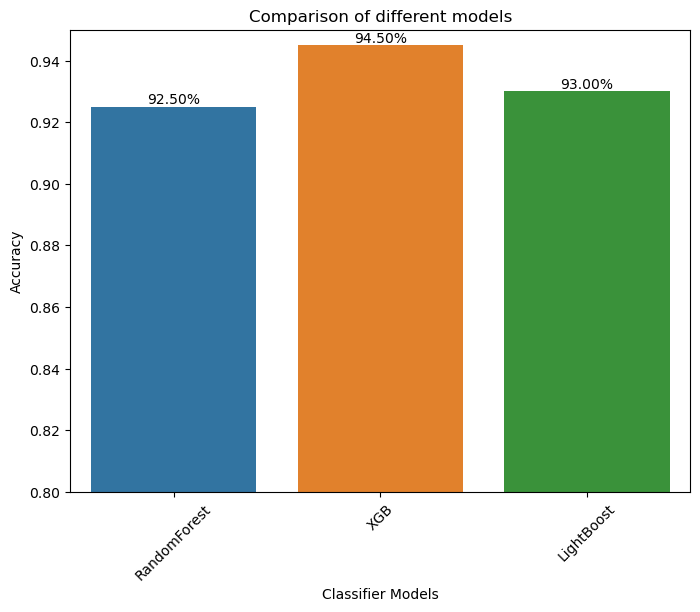

In [318]:
model_acc_bar_plot(accuracy_data,.80,.95)

# confusion matrix for all Algorithm

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


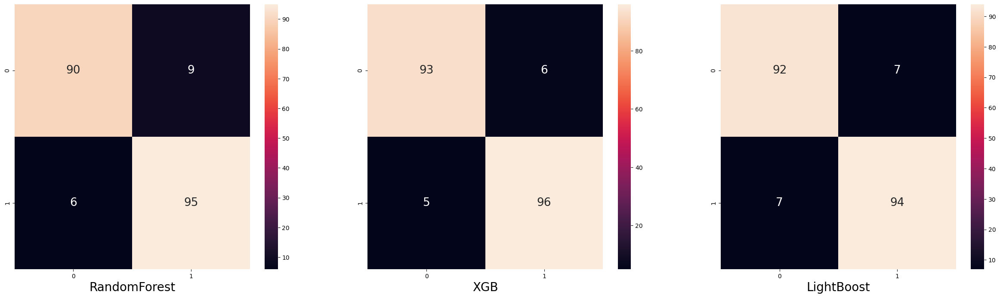

In [323]:
fig,ax= plt.subplots(1,3,figsize=(30,8))
for i in range(accuracy_data.shape[0]):
    
    sns.heatmap(confusion_matrix(y_test,algo[i].predict(x_test)),annot=True,annot_kws={"fontsize": 19}
                ,ax=ax[i])
    ax[i].set_xlabel(model_name[i],fontsize=20)

In [325]:
import pickle
pickle.dump(xgc_,open('diabetes_prediction.pkl','wb'))